# Uygulamada Mevcut Olan Ridge Modelinin Geliştirilmesi veya Başka Bir Modele Geçilmesi için Detaylı Analiz (Sektörel Bazda Geliştirme)

In [ ]:
#Gerekli Tüm kütüphaneler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import requests
from datetime import datetime, timedelta
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.decomposition import PCA

Şu anda güncel olarak SP&500'de bulunan her sektörden, piyasa değeri en düşük, ortalama ve en yüksek olan toplamda 3 şirketin verisini; `prepare_time_series_data()` ile çekip, her sektör için makine öğrenmesi modelleri deneyeceğim ve tüm sektörlerde en iyi sonucu veren modelleri tespit edip bu modellere `RandomSearch()` uygulayarak en uygun hiperparametreleri ayarlamaya çalışacağım. Sonrasında ise genel projede, sektörlere göre model eğitimi yapacağım.

## prepare_time_series_data()

+ S&P500'de toplamda 11 sektör bulunmakta. Bu sektörlerdeki en düşük, ortalama ve en yüksek değere sahip 3'er şirketi wikipedia ve yfinance kullanarak çekeceğim. Her sektörden elde edilen her şirket için `prepare_time_series_data` fonksiyonunu kullanarak veri setlerini elde edeceğim ve bir sözlüğe kaydedeceğim.

In [ ]:
import requests
import yfinance as yf
import pandas as pd
from datetime import datetime, timedelta
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
import numpy as np

In [ ]:
def prepare_time_series_data(ticker, start_date="7y", decompose_period = 365):
    stock = yf.Ticker(ticker)
    df = stock.history(period=start_date)
    if df.empty:
        raise ValueError(f"{ticker} için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.")

    df = df.reset_index()
    df["Date"] = pd.to_datetime(df["Date"]).dt.date
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df['Close'] = pd.to_numeric(df['Close'], errors='coerce')

    # Feature Engineering
    df["Percentage_Change"] = ((df['Close'] - df['Open']) / df['Open']) * 100
    df['Volume_Percentage_Change'] = df['Volume'].pct_change() * 100
    df.dropna(inplace=True)

    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_21'] = df['Close'].rolling(window=21).mean()
    df['MA_63'] = df['Close'].rolling(window=63).mean()
    df['MA_126'] = df['Close'].rolling(window=126).mean()
    df['MA_252'] = df['Close'].rolling(window=252).mean()

    df['EWMA_5'] = df['Close'].ewm(span=5, adjust=False).mean()
    df['EWMA_21'] = df['Close'].ewm(span=21, adjust=False).mean()
    df['EWMA_63'] = df['Close'].ewm(span=63, adjust=False).mean()
    df['EWMA_126'] = df['Close'].ewm(span=126, adjust=False).mean()
    df['EWMA_252'] = df['Close'].ewm(span=252, adjust=False).mean()

    df = df.drop(columns=["Open", "High", "Low", "Volume", "Dividends", "Stock Splits"], axis=1)
    df.dropna(inplace=True)
    df = df.reset_index(drop=True)
    return df

In [ ]:
import pandas as pd
import yfinance as yf

def get_sector_combined_lists():
    """
    S&P 500 şirketlerini sektörlerine göre gruplandırır ve her sektörden
    en düşük, ortalama ve en yüksek piyasa değerine sahip şirketlerden oluşan
    birleşik listeleri döndürür.

    Returns:
        dict: Sektörlere göre birleşik şirket kodları listesi.
    """
    # S&P 500 şirketlerini ve sektörlerini Wikipedia'dan alıyoruz
    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
    sp500_table = pd.read_html(url)[0]

    # İlgili sütunları alıyoruz
    sp500_table = sp500_table[["Symbol", "GICS Sector"]]
    sp500_table.columns = ["Ticker", "Sector"]

    tickers_info = []

    for ticker in sp500_table["Ticker"]:
        try:
            stock = yf.Ticker(ticker)
            market_cap = stock.info.get("marketCap", 0)
            sector = sp500_table[sp500_table["Ticker"] == ticker]["Sector"].values[0]

            tickers_info.append({
                "Ticker": ticker,
                "Sector": sector,
                "MarketCap": market_cap
            })
        except Exception as e:
            print(f"Ticker {ticker} verisi alınamadı: {e}")
            continue

    # Verileri bir DataFrame'e çeviriyoruz
    df = pd.DataFrame(tickers_info)

    # Sektöre göre gruplama
    grouped = df.groupby("Sector")
    sector_combined_lists = {}

    for sector, group in grouped:
        group = group.sort_values("MarketCap").reset_index(drop=True)
        low = group.head(3)["Ticker"].tolist()  # En düşük piyasa değerine sahip 3 hisse
        avg_index = len(group) // 2
        avg = group.iloc[max(avg_index - 1, 0):avg_index + 2]["Ticker"].tolist()  # Ortalama piyasa değeri
        high = group.tail(3)["Ticker"].tolist()  # En yüksek piyasa değerine sahip 3 hisse

        # Birleştirilmiş liste
        sector_combined_lists[sector] = low + avg + high

    return sector_combined_lists

In [ ]:
sector_lists = get_sector_combined_lists()

In [ ]:
sector_lists

{'Communication Services': ['PARA',
  'MTCH',
  'IPG',
  'LYV',
  'TTWO',
  'CHTR',
  'META',
  'GOOGL',
  'GOOG'],
 'Consumer Discretionary': ['BWA',
  'CZR',
  'MHK',
  'DECK',
  'CCL',
  'LEN',
  'HD',
  'TSLA',
  'AMZN'],
 'Consumer Staples': ['BF.B',
  'LW',
  'WBA',
  'HSY',
  'STZ',
  'GIS',
  'PG',
  'COST',
  'WMT'],
 'Energy': ['APA', 'CTRA', 'DVN', 'OXY', 'MPC', 'PSX', 'COP', 'CVX', 'XOM'],
 'Financials': ['BRK.B',
  'IVZ',
  'MKTX',
  'NDAQ',
  'MSCI',
  'ALL',
  'MA',
  'V',
  'JPM'],
 'Health Care': ['TFX',
  'CRL',
  'HSIC',
  'IDXX',
  'RMD',
  'IQV',
  'JNJ',
  'UNH',
  'LLY'],
 'Industrials': ['HII',
  'GNRC',
  'AOS',
  'DAL',
  'AME',
  'AXON',
  'RTX',
  'CAT',
  'GE'],
 'Information Technology': ['ENPH',
  'JNPR',
  'EPAM',
  'GLW',
  'NXPI',
  'ROP',
  'MSFT',
  'AAPL',
  'NVDA'],
 'Materials': ['FMC', 'CE', 'MOS', 'LYB', 'PPG', 'NUE', 'APD', 'SHW', 'LIN'],
 'Real Estate': ['FRT',
  'CPT',
  'HST',
  'VTR',
  'EQR',
  'CSGP',
  'AMT',
  'EQIX',
  'PLD'],
 'Utilit

+ Her listede bulunan ilk 3 şirket; en düşük, ortadaki 3 şirket; ortalama, sondaki 3 şirket; en yüksek değere sahip şirketlerdir.

In [ ]:
# Verileri saklamak için bir sözlük
dataframes = {}

# Verileri çek ve kaydet
for sector, tickers in sector_lists.items():
    for ticker in tickers:
        try:
            print(f"{ticker} için veri çekiliyor...")
            df = prepare_time_series_data(ticker)
            dataframes[ticker] = df  # Şirket kodu ile kaydet
            print(f"{ticker} için veri başarıyla kaydedildi.")
        except Exception as e:
            print(f"{ticker} için veri alınırken hata oluştu: {e}")

PARA için veri çekiliyor...
PARA için veri başarıyla kaydedildi.
MTCH için veri çekiliyor...
MTCH için veri başarıyla kaydedildi.
IPG için veri çekiliyor...
IPG için veri başarıyla kaydedildi.
LYV için veri çekiliyor...
LYV için veri başarıyla kaydedildi.
TTWO için veri çekiliyor...
TTWO için veri başarıyla kaydedildi.
CHTR için veri çekiliyor...
CHTR için veri başarıyla kaydedildi.
META için veri çekiliyor...
META için veri başarıyla kaydedildi.
GOOGL için veri çekiliyor...
GOOGL için veri başarıyla kaydedildi.
GOOG için veri çekiliyor...
GOOG için veri başarıyla kaydedildi.
BWA için veri çekiliyor...
BWA için veri başarıyla kaydedildi.
CZR için veri çekiliyor...
CZR için veri başarıyla kaydedildi.
MHK için veri çekiliyor...
MHK için veri başarıyla kaydedildi.
DECK için veri çekiliyor...
DECK için veri başarıyla kaydedildi.
CCL için veri çekiliyor...
CCL için veri başarıyla kaydedildi.
LEN için veri çekiliyor...
LEN için veri başarıyla kaydedildi.
HD için veri çekiliyor...
HD için ver

ERROR:yfinance:$BF.B: possibly delisted; no price data found  (period=7y)


AMZN için veri başarıyla kaydedildi.
BF.B için veri çekiliyor...
BF.B için veri alınırken hata oluştu: BF.B için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.
LW için veri çekiliyor...
LW için veri başarıyla kaydedildi.
WBA için veri çekiliyor...
WBA için veri başarıyla kaydedildi.
HSY için veri çekiliyor...
HSY için veri başarıyla kaydedildi.
STZ için veri çekiliyor...
STZ için veri başarıyla kaydedildi.
GIS için veri çekiliyor...
GIS için veri başarıyla kaydedildi.
PG için veri çekiliyor...
PG için veri başarıyla kaydedildi.
COST için veri çekiliyor...
COST için veri başarıyla kaydedildi.
WMT için veri çekiliyor...
WMT için veri başarıyla kaydedildi.
APA için veri çekiliyor...
APA için veri başarıyla kaydedildi.
CTRA için veri çekiliyor...
CTRA için veri başarıyla kaydedildi.
DVN için veri çekiliyor...
DVN için veri başarıyla kaydedildi.
OXY için veri çekiliyor...
OXY için veri başarıyla kaydedildi.
MPC için veri çekiliyor...
MPC için veri başarıyla kaydedildi.
PSX için ver

ERROR:yfinance:$BRK.B: possibly delisted; no price data found  (period=7y) (Yahoo error = "No data found, symbol may be delisted")


BRK.B için veri alınırken hata oluştu: BRK.B için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.
IVZ için veri çekiliyor...
IVZ için veri başarıyla kaydedildi.
MKTX için veri çekiliyor...
MKTX için veri başarıyla kaydedildi.
NDAQ için veri çekiliyor...
NDAQ için veri başarıyla kaydedildi.
MSCI için veri çekiliyor...
MSCI için veri başarıyla kaydedildi.
ALL için veri çekiliyor...
ALL için veri başarıyla kaydedildi.
MA için veri çekiliyor...
MA için veri başarıyla kaydedildi.
V için veri çekiliyor...
V için veri başarıyla kaydedildi.
JPM için veri çekiliyor...
JPM için veri başarıyla kaydedildi.
TFX için veri çekiliyor...
TFX için veri başarıyla kaydedildi.
CRL için veri çekiliyor...
CRL için veri başarıyla kaydedildi.
HSIC için veri çekiliyor...
HSIC için veri başarıyla kaydedildi.
IDXX için veri çekiliyor...
IDXX için veri başarıyla kaydedildi.
RMD için veri çekiliyor...
RMD için veri başarıyla kaydedildi.
IQV için veri çekiliyor...
IQV için veri başarıyla kaydedildi.
JNJ için

In [ ]:
dataframes

{'PARA':            Date      Close  Percentage_Change  Volume_Percentage_Change  \
 0    2019-01-28  42.894524           2.247188                 88.192243   
 1    2019-01-29  43.160194           0.942075                -31.821662   
 2    2019-01-30  42.423149          -1.590456                  1.558500   
 3    2019-01-31  42.388866           0.283859                 25.199009   
 4    2019-02-01  42.568848          -0.040250                -32.804663   
 ...         ...        ...                ...                       ...   
 1503 2025-01-17  10.270000          -0.097269                -36.789881   
 1504 2025-01-21  10.480000           1.846449                -15.724268   
 1505 2025-01-22  10.510000           0.095240                 26.873965   
 1506 2025-01-23  10.870000           2.935601                -13.559205   
 1507 2025-01-24  11.070000           1.839925                154.625203   
 
            MA_5      MA_21      MA_63     MA_126     MA_252     EWMA_5  \
 0 

## Her Sektör için ML Modeli Eğitimi

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Regressor modellerin tanımı
regression_models = {
    "DecisionTree": DecisionTreeRegressor(),
    "RandomForest": RandomForestRegressor(),
    "GradientBoosting": GradientBoostingRegressor(),
    "AdaBoost": AdaBoostRegressor(),
    "KNN": KNeighborsRegressor(),
    "LinearRegression": LinearRegression(),
    "LassoRegression": Lasso(),
    "RidgeRegression": Ridge(),
    "LinearSVR": SVR(kernel="linear"),
    "RbfSVR": SVR(kernel="rbf"),
    "PolynomialSVR": SVR(kernel="poly"),
    "XGBoost": xgb.XGBRegressor()
}

In [ ]:
def evaluate_models(stock_names=list()):
  for ticker in stock_names:
    print(f"\n=== {ticker} için Model Performansı Sonuçları")

    df = dataframes[ticker] #prepare_time_series_data() burada kullanılıyor
    X = df.drop(columns=["Date", "Close"], axis=1)
    y = df["Close"]

    #Standartlaştırma
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle=False)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    #PCA Uygulanması
    pca = PCA(n_components = 0.95) #Varyansın %95'ini açıklayan bileşenler seçiliyor (!önemli!)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    for name, reg in regression_models.items():
      try:
        reg.fit(X_train_scaled, y_train)
        predictions = reg.predict(X_test_scaled)
        train_score = reg.score(X_train_scaled, y_train)
        test_score = reg.score(X_test_scaled, y_test)
        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        print(f"\nModel: {name}")
        print(f"Train Setindeki Doğruluk: {train_score}")
        print(f"Test Setindeki Doğruluk: {test_score}")
        print(f"MSE Skoru: {mse}")
        print(f"MAE Skoru: {mae}")
        print(f"R^2 Skoru: {r2}")

      except Exception as e:
        print(f"{name} modeli {ticker} için hata verdi: {e}")

In [ ]:
#Information Technology için Model Eğitimi
evaluate_models(stock_names = sector_lists["Information Technology"])


=== ENPH için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.4836654134659365
MSE Skoru: 205.0457197873603
MAE Skoru: 10.029437867221453
R^2 Skoru: 0.4836654134659365

Model: RandomForest
Train Setindeki Doğruluk: 0.9995885299145302
Test Setindeki Doğruluk: 0.9156485097225526
MSE Skoru: 33.49748881858929
MAE Skoru: 4.681493206024169
R^2 Skoru: 0.9156485097225526

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9988573068677228
Test Setindeki Doğruluk: 0.959564396402483
MSE Skoru: 16.057703010647064
MAE Skoru: 3.150894628787541
R^2 Skoru: 0.959564396402483

Model: AdaBoost
Train Setindeki Doğruluk: 0.9936735941847078
Test Setindeki Doğruluk: 0.9441319764281394
MSE Skoru: 22.186193613883813
MAE Skoru: 3.7962140703241416
R^2 Skoru: 0.9441319764281394

Model: KNN
Train Setindeki Doğruluk: 0.9906264380498891
Test Setindeki Doğruluk: -0.1305359223824889
MSE Skoru: 448.95608002252567
MAE Skoru: 18.6497747939154
R^2 Skoru: -0.1305

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.112e+03, tolerance: 5.691e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.997923032137817
Test Setindeki Doğruluk: 0.967930840327471
MSE Skoru: 17.01453159984979
MAE Skoru: 3.2778506350314567
R^2 Skoru: 0.967930840327471

Model: RbfSVR
Train Setindeki Doğruluk: 0.9618294025287984
Test Setindeki Doğruluk: -54.636660125137205
MSE Skoru: 29518.444557814604
MAE Skoru: 165.65553609579467
R^2 Skoru: -54.636660125137205

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8652480257233295
Test Setindeki Doğruluk: -510.69636064389476
MSE Skoru: 271484.3166022102
MAE Skoru: 469.3484872072575
R^2 Skoru: -510.69636064389476

Model: XGBoost
Train Setindeki Doğruluk: 0.9999796840936039
Test Setindeki Doğruluk: -7.851557198499849
MSE Skoru: 4696.259621382121
MAE Skoru: 64.57317397768135
R^2 Skoru: -7.851557198499849

=== AAPL için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.06590603494811043
MSE Skoru: 660.8258192042676
MAE Skoru: 18.868405626309627
R^2 Skoru: -0.0659

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.163e+02, tolerance: 2.434e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984692713301719
Test Setindeki Doğruluk: 0.9906229564271832
MSE Skoru: 5.813450996196299
MAE Skoru: 1.8109422692934134
R^2 Skoru: 0.9906229564271832

Model: RbfSVR
Train Setindeki Doğruluk: 0.9784349004801046
Test Setindeki Doğruluk: -5.54785425994158
MSE Skoru: 4059.448969689614
MAE Skoru: 50.43052618619246
R^2 Skoru: -5.54785425994158

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9173762877225418
Test Setindeki Doğruluk: -28.353195928443785
MSE Skoru: 18197.992233547608
MAE Skoru: 99.490712805431
R^2 Skoru: -28.353195928443785

Model: XGBoost
Train Setindeki Doğruluk: 0.9999826501321902
Test Setindeki Doğruluk: -0.420423007048663
MSE Skoru: 880.614394208976
MAE Skoru: 21.927235281230598
R^2 Skoru: -0.420423007048663

=== NVDA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -3.014866128100685
MSE Skoru: 4172.956522686303
MAE Skoru: 55.96928326183597
R^2 Skoru: -3.01486612810

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.348e+01, tolerance: 1.587e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998493291529786
Test Setindeki Doğruluk: 0.9938103624874576
MSE Skoru: 6.43336226088477
MAE Skoru: 1.852167483642672
R^2 Skoru: 0.9938103624874576

Model: RbfSVR
Train Setindeki Doğruluk: 0.9891785275088619
Test Setindeki Doğruluk: -6.3140962097995175
MSE Skoru: 7602.097931139947
MAE Skoru: 78.70253856446915
R^2 Skoru: -6.3140962097995175

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8270005556058072
Test Setindeki Doğruluk: -15768.544506119862
MSE Skoru: 16390490.120211191
MAE Skoru: 2881.7371715452978
R^2 Skoru: -15768.544506119862

Model: XGBoost
Train Setindeki Doğruluk: 0.9999862258488423
Test Setindeki Doğruluk: -3.085871836474192
MSE Skoru: 4246.758169976934
MAE Skoru: 56.594972357844675
R^2 Skoru: -3.085871836474192


In [ ]:
#Communication Services için Model Eğitimi
evaluate_models(stock_names = sector_lists["Communication Services"])


=== PARA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8880125263022076
MSE Skoru: 0.24209010349163962
MAE Skoru: 0.37293599299247693
R^2 Skoru: 0.8880125263022076

Model: RandomForest
Train Setindeki Doğruluk: 0.9979590717088452
Test Setindeki Doğruluk: 0.9112789721710577
MSE Skoru: 0.19179361851625282
MAE Skoru: 0.34877491281522033
R^2 Skoru: 0.9112789721710577

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9987498866376296
Test Setindeki Doğruluk: 0.8907449853291453
MSE Skoru: 0.23618318134422947
MAE Skoru: 0.3823948347621478
R^2 Skoru: 0.8907449853291453

Model: AdaBoost
Train Setindeki Doğruluk: 0.9873598842207484
Test Setindeki Doğruluk: -3.5383105815128664
MSE Skoru: 9.810740809463507
MAE Skoru: 2.8779754449200152
R^2 Skoru: -3.5383105815128664

Model: KNN
Train Setindeki Doğruluk: 0.9865655411387046
Test Setindeki Doğruluk: -0.4327772937981218
MSE Skoru: 3.097321440361202
MAE Skoru: 1.136365719978383
R^2 Sk

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.225e+03, tolerance: 2.007e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9962825244811186
Test Setindeki Doğruluk: 0.9732645684101757
MSE Skoru: 54.411051471099704
MAE Skoru: 5.079123741040612
R^2 Skoru: 0.9732645684101757

Model: RbfSVR
Train Setindeki Doğruluk: 0.8837265062389532
Test Setindeki Doğruluk: -1.7952401582081254
MSE Skoru: 5688.778788229267
MAE Skoru: 60.94257882174165
R^2 Skoru: -1.7952401582081254

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7517719674043208
Test Setindeki Doğruluk: -0.10676592663800522
MSE Skoru: 2252.452802133934
MAE Skoru: 37.83897306650651
R^2 Skoru: -0.10676592663800522

Model: XGBoost
Train Setindeki Doğruluk: 0.9999787784891325
Test Setindeki Doğruluk: 0.8273318886569676
MSE Skoru: 351.4083347462822
MAE Skoru: 12.137745383559473
R^2 Skoru: 0.8273318886569676

=== META için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.357879581375473
MSE Skoru: 23825.731634476688
MAE Skoru: 133.3634129202129
R^2 Skoru: -2.35

In [ ]:
#Consumer Discretionary için Model Eğitimi
evaluate_models(stock_names = sector_lists["Consumer Discretionary"])


=== BWA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8223977822938455
MSE Skoru: 0.4155047591449322
MAE Skoru: 0.5203824138009785
R^2 Skoru: 0.8223977822938455

Model: RandomForest
Train Setindeki Doğruluk: 0.9986702914521991
Test Setindeki Doğruluk: 0.9008888412597087
MSE Skoru: 0.23187299501571962
MAE Skoru: 0.3642276475919003
R^2 Skoru: 0.9008888412597087

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9956325708951685
Test Setindeki Doğruluk: 0.8883088335882465
MSE Skoru: 0.26130423255927626
MAE Skoru: 0.389652388671901
R^2 Skoru: 0.8883088335882465

Model: AdaBoost
Train Setindeki Doğruluk: 0.9836996817134857
Test Setindeki Doğruluk: 0.8506081337322515
MSE Skoru: 0.34950594769313925
MAE Skoru: 0.47291988472190155
R^2 Skoru: 0.8506081337322515

Model: KNN
Train Setindeki Doğruluk: 0.9763687493118528
Test Setindeki Doğruluk: 0.3600333618484589
MSE Skoru: 1.497217699645501
MAE Skoru: 0.9314818464367596
R^2 Skoru:

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.723e+03, tolerance: 1.419e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9962368239414431
Test Setindeki Doğruluk: 0.9862572187802885
MSE Skoru: 78.00990994063753
MAE Skoru: 5.94302628563103
R^2 Skoru: 0.9862572187802885

Model: RbfSVR
Train Setindeki Doğruluk: 0.9229798968789189
Test Setindeki Doğruluk: 0.44354883099423403
MSE Skoru: 3158.6550703609046
MAE Skoru: 30.349357973735625
R^2 Skoru: 0.44354883099423403

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8972588782429273
Test Setindeki Doğruluk: 0.6474666762057213
MSE Skoru: 2001.1300769905338
MAE Skoru: 34.43122451201345
R^2 Skoru: 0.6474666762057213

Model: XGBoost
Train Setindeki Doğruluk: 0.9999805950574426
Test Setindeki Doğruluk: 0.9326033397530762
MSE Skoru: 382.57229829295414
MAE Skoru: 9.992720749204523
R^2 Skoru: 0.9326033397530762

=== AMZN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.44913638560331304
MSE Skoru: 269.918235355228
MAE Skoru: 9.622227144557119
R^2 Skoru: 0.4491363

In [ ]:
#Consumer Staples için Model Eğitimi
evaluate_models(stock_names = sector_lists["Consumer Staples"])


=== BF.B için Model Performansı Sonuçları


KeyError: 'BF.B'

In [ ]:
#Energy için Model Eğitimi
evaluate_models(stock_names = sector_lists["Energy"])


=== APA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9553108674630222
MSE Skoru: 0.7232601334792148
MAE Skoru: 0.6829136538979234
R^2 Skoru: 0.9553108674630222

Model: RandomForest
Train Setindeki Doğruluk: 0.9992371894159674
Test Setindeki Doğruluk: 0.9839344584314333
MSE Skoru: 0.2600087555891321
MAE Skoru: 0.3981949279482001
R^2 Skoru: 0.9839344584314333

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9981039750103458
Test Setindeki Doğruluk: 0.9844464190274808
MSE Skoru: 0.25172305685181656
MAE Skoru: 0.38746797743175143
R^2 Skoru: 0.9844464190274808

Model: AdaBoost
Train Setindeki Doğruluk: 0.9902300622447302
Test Setindeki Doğruluk: 0.9646497509082853
MSE Skoru: 0.5721173006757596
MAE Skoru: 0.5913653937604129
R^2 Skoru: 0.9646497509082853

Model: KNN
Train Setindeki Doğruluk: 0.9870583427098615
Test Setindeki Doğruluk: 0.8923637333614993
MSE Skoru: 1.74201234521056
MAE Skoru: 1.0390378446768451
R^2 Skoru: 0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.993e+01, tolerance: 3.915e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9979723134215882
Test Setindeki Doğruluk: 0.987290864302427
MSE Skoru: 0.2803720652400088
MAE Skoru: 0.4274838349070661
R^2 Skoru: 0.987290864302427

Model: RbfSVR
Train Setindeki Doğruluk: 0.98394127584057
Test Setindeki Doğruluk: 0.9323363757552472
MSE Skoru: 1.4927049740092075
MAE Skoru: 0.9652358684924457
R^2 Skoru: 0.9323363757552472

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8453403179921555
Test Setindeki Doğruluk: -4.596728812926215
MSE Skoru: 123.46759474509619
MAE Skoru: 10.90612307995
R^2 Skoru: -4.596728812926215

Model: XGBoost
Train Setindeki Doğruluk: 0.9999781007284565
Test Setindeki Doğruluk: 0.8817365272864217
MSE Skoru: 2.608971599342763
MAE Skoru: 1.0558923443421622
R^2 Skoru: 0.8817365272864217

=== OXY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9040538006174723
MSE Skoru: 2.70783476899616
MAE Skoru: 1.1738063104894778
R^2 Skoru: 0.90405380061747

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.051e+02, tolerance: 1.432e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998615773269002
Test Setindeki Doğruluk: 0.9792482960257689
MSE Skoru: 5.977320423612342
MAE Skoru: 1.797477895213363
R^2 Skoru: 0.9792482960257689

Model: RbfSVR
Train Setindeki Doğruluk: 0.9632860970876878
Test Setindeki Doğruluk: -18.211192881312574
MSE Skoru: 5533.591637294949
MAE Skoru: 69.05237708496375
R^2 Skoru: -18.211192881312574

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7475087751780383
Test Setindeki Doğruluk: -336.83964085982524
MSE Skoru: 97311.32381827034
MAE Skoru: 280.3305873749459
R^2 Skoru: -336.83964085982524

Model: XGBoost
Train Setindeki Doğruluk: 0.9999804893052857
Test Setindeki Doğruluk: -0.8140458319000115
MSE Skoru: 522.5177274044327
MAE Skoru: 17.037409043469967
R^2 Skoru: -0.8140458319000115

=== PSX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.6796314985370833
MSE Skoru: 373.8701352530927
MAE Skoru: 16.17267020017106
R^2 Skoru: -1.67963

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.563e+02, tolerance: 1.002e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998095168101385
Test Setindeki Doğruluk: 0.9720765585090361
MSE Skoru: 1.39218870178913
MAE Skoru: 0.9170638084605538
R^2 Skoru: 0.9720765585090361

Model: RbfSVR
Train Setindeki Doğruluk: 0.9780227126984664
Test Setindeki Doğruluk: -0.8206068684197207
MSE Skoru: 90.77062773347016
MAE Skoru: 6.638944363895758
R^2 Skoru: -0.8206068684197207

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8311126789690025
Test Setindeki Doğruluk: -15.460681583337571
MSE Skoru: 820.6859076266344
MAE Skoru: 25.09982630091494
R^2 Skoru: -15.460681583337571

Model: XGBoost
Train Setindeki Doğruluk: 0.9999793701853349
Test Setindeki Doğruluk: 0.783122687520665
MSE Skoru: 10.812927346574629
MAE Skoru: 2.6298327667034225
R^2 Skoru: 0.783122687520665

=== CVX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7934016438415937
MSE Skoru: 10.132008040838086
MAE Skoru: 2.315163467104072
R^2 Skoru: 0.793401643

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.327e+02, tolerance: 1.300e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9977628149129112
Test Setindeki Doğruluk: 0.9624736028166934
MSE Skoru: 1.8403716519090803
MAE Skoru: 1.058072107125035
R^2 Skoru: 0.9624736028166934

Model: RbfSVR
Train Setindeki Doğruluk: 0.9706622305937653
Test Setindeki Doğruluk: 0.7410001431705349
MSE Skoru: 12.701885342979182
MAE Skoru: 2.6411393439227626
R^2 Skoru: 0.7410001431705349

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8567698353386026
Test Setindeki Doğruluk: -0.9865569661164082
MSE Skoru: 97.42483690839076
MAE Skoru: 8.468766732446788
R^2 Skoru: -0.9865569661164082

Model: XGBoost
Train Setindeki Doğruluk: 0.9999781994743678
Test Setindeki Doğruluk: 0.9324488577766694
MSE Skoru: 3.312846863359392
MAE Skoru: 1.392277850220535
R^2 Skoru: 0.9324488577766694

=== XOM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7961545128461698
MSE Skoru: 12.256198867046642
MAE Skoru: 2.509874634395372
R^2 Skoru: 0.7961545

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.437e+02, tolerance: 7.574e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985242030103127
Test Setindeki Doğruluk: 0.9844276229000314
MSE Skoru: 0.9362883291393596
MAE Skoru: 0.7770548615849476
R^2 Skoru: 0.9844276229000314

Model: RbfSVR
Train Setindeki Doğruluk: 0.9774385467267914
Test Setindeki Doğruluk: -2.481119307243083
MSE Skoru: 209.30210967726688
MAE Skoru: 11.964882594822107
R^2 Skoru: -2.481119307243083

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8636771019354523
Test Setindeki Doğruluk: -15.40722091503983
MSE Skoru: 986.4832682734067
MAE Skoru: 26.01526666614396
R^2 Skoru: -15.40722091503983

Model: XGBoost
Train Setindeki Doğruluk: 0.9999805031261931
Test Setindeki Doğruluk: 0.6313231919787191
MSE Skoru: 22.166673100625925
MAE Skoru: 3.4610504756700124
R^2 Skoru: 0.6313231919787191


In [ ]:
#Financials için Model Eğitimi
evaluate_models(stock_names = sector_lists["Financials"])


=== BRK.B için Model Performansı Sonuçları


KeyError: 'BRK.B'

In [ ]:
#Health Care için Model Eğitimi
evaluate_models(stock_names = sector_lists["Health Care"])


=== TFX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9498204250282761
MSE Skoru: 23.60568632832374
MAE Skoru: 3.595284316713447
R^2 Skoru: 0.9498204250282761

Model: RandomForest
Train Setindeki Doğruluk: 0.9993149807562518
Test Setindeki Doğruluk: 0.9796285551192463
MSE Skoru: 9.583220626734796
MAE Skoru: 2.210734973427476
R^2 Skoru: 0.9796285551192463

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9981466569345243
Test Setindeki Doğruluk: 0.956908339340487
MSE Skoru: 20.2713599202111
MAE Skoru: 2.98192948733955
R^2 Skoru: 0.956908339340487

Model: AdaBoost
Train Setindeki Doğruluk: 0.9906390828923207
Test Setindeki Doğruluk: 0.8815999059399573
MSE Skoru: 55.698269329708914
MAE Skoru: 5.568976028570132
R^2 Skoru: 0.8815999059399573

Model: KNN
Train Setindeki Doğruluk: 0.9854125117721696
Test Setindeki Doğruluk: 0.700075077188038
MSE Skoru: 141.09194137127355
MAE Skoru: 9.221387517057506
R^2 Skoru: 0.700075077188

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.903e+02, tolerance: 8.360e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9971099661465943
Test Setindeki Doğruluk: 0.9638602758475836
MSE Skoru: 21.745857740167203
MAE Skoru: 3.138643917925193
R^2 Skoru: 0.9638602758475836

Model: RbfSVR
Train Setindeki Doğruluk: 0.9263715002820121
Test Setindeki Doğruluk: 0.8457663400297346
MSE Skoru: 92.80489287393914
MAE Skoru: 7.898816824911899
R^2 Skoru: 0.8457663400297346

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7994981601593879
Test Setindeki Doğruluk: -0.12665958587590587
MSE Skoru: 677.929332629259
MAE Skoru: 19.784062100095184
R^2 Skoru: -0.12665958587590587

Model: XGBoost
Train Setindeki Doğruluk: 0.9999757566139371
Test Setindeki Doğruluk: 0.9737224442958227
MSE Skoru: 15.811631148384224
MAE Skoru: 2.6750357419449764
R^2 Skoru: 0.9737224442958227

=== HSIC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8150440704341183
MSE Skoru: 1.935840475886913
MAE Skoru: 1.0650992488229512
R^2 Skoru: 0.8150

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.614e+03, tolerance: 2.056e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9969235913003681
Test Setindeki Doğruluk: 0.9753992027239378
MSE Skoru: 48.813563373690805
MAE Skoru: 5.278265766771921
R^2 Skoru: 0.9753992027239378

Model: RbfSVR
Train Setindeki Doğruluk: 0.8814382504151177
Test Setindeki Doğruluk: 0.7746564717305736
MSE Skoru: 447.13268739196855
MAE Skoru: 15.063337258033071
R^2 Skoru: 0.7746564717305736

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8115264345978389
Test Setindeki Doğruluk: -1.479980802567813
MSE Skoru: 4920.844585369374
MAE Skoru: 62.47208879426126
R^2 Skoru: -1.479980802567813

Model: XGBoost
Train Setindeki Doğruluk: 0.9999739029698316
Test Setindeki Doğruluk: 0.9718523156656376
MSE Skoru: 55.851392036590674
MAE Skoru: 5.817724265799617
R^2 Skoru: 0.9718523156656376

=== RMD için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9781365829289039
MSE Skoru: 19.616018016220515
MAE Skoru: 3.2829349846239912
R^2 Skoru: 0.9781365

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.984e+03, tolerance: 1.394e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9977938226102386
Test Setindeki Doğruluk: 0.9588187234627334
MSE Skoru: 72.09279818417913
MAE Skoru: 5.835037257717463
R^2 Skoru: 0.9588187234627334

Model: RbfSVR
Train Setindeki Doğruluk: 0.9466515541743987
Test Setindeki Doğruluk: -2.717241638654253
MSE Skoru: 6507.480432638294
MAE Skoru: 63.725886483195204
R^2 Skoru: -2.717241638654253

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9114181739623175
Test Setindeki Doğruluk: -10.92561736001374
MSE Skoru: 20877.233486902518
MAE Skoru: 104.60001804763968
R^2 Skoru: -10.92561736001374

Model: XGBoost
Train Setindeki Doğruluk: 0.9999813589489982
Test Setindeki Doğruluk: 0.37654589851464026
MSE Skoru: 1091.4317013657628
MAE Skoru: 21.868451352151023
R^2 Skoru: 0.37654589851464026

=== LLY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.6472188070391547
MSE Skoru: 42842.47057146177
MAE Skoru: 180.15202442699712
R^2 Skoru: -2.647

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.748e+03, tolerance: 1.866e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984155854723284
Test Setindeki Doğruluk: 0.9739350669226284
MSE Skoru: 306.17470116111485
MAE Skoru: 12.683838708421103
R^2 Skoru: 0.9739350669226284

Model: RbfSVR
Train Setindeki Doğruluk: 0.7806962939807363
Test Setindeki Doğruluk: -22.879099771230635
MSE Skoru: 280498.5616019185
MAE Skoru: 514.5381746172123
R^2 Skoru: -22.879099771230635

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6257868562046922
Test Setindeki Doğruluk: -2232.4257870555157
MSE Skoru: 26235190.049688328
MAE Skoru: 4268.980120985571
R^2 Skoru: -2232.4257870555157

Model: XGBoost
Train Setindeki Doğruluk: 0.9999891210605253
Test Setindeki Doğruluk: -2.660312802835557
MSE Skoru: 42996.280682466764
MAE Skoru: 180.2875869447822
R^2 Skoru: -2.660312802835557


In [ ]:
#Industrials için Model Eğitimi
evaluate_models(stock_names = sector_lists["Industrials"])


=== HII için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.46438322973764345
MSE Skoru: 450.9589054740685
MAE Skoru: 15.901434386802825
R^2 Skoru: 0.46438322973764345

Model: RandomForest
Train Setindeki Doğruluk: 0.9986414158820769
Test Setindeki Doğruluk: 0.40988354170772
MSE Skoru: 496.84454802147053
MAE Skoru: 16.785482482910155
R^2 Skoru: 0.40988354170772

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9965180725093108
Test Setindeki Doğruluk: 0.4983762114506253
MSE Skoru: 422.3387451688234
MAE Skoru: 15.138184530716556
R^2 Skoru: 0.4983762114506253

Model: AdaBoost
Train Setindeki Doğruluk: 0.9827273964344887
Test Setindeki Doğruluk: 0.41432636113732935
MSE Skoru: 493.10394634797524
MAE Skoru: 16.757198426353025
R^2 Skoru: 0.41432636113732935

Model: KNN
Train Setindeki Doğruluk: 0.9794202440690295
Test Setindeki Doğruluk: 0.35070965340869
MSE Skoru: 546.6656017702255
MAE Skoru: 19.482358586393442
R^2 Skoru: 0.3507

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.054e+03, tolerance: 1.643e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9970013746267288
Test Setindeki Doğruluk: 0.9820232970081118
MSE Skoru: 8.396389440252165
MAE Skoru: 2.242146280399415
R^2 Skoru: 0.9820232970081118

Model: RbfSVR
Train Setindeki Doğruluk: 0.8965572768703686
Test Setindeki Doğruluk: 0.7741398114299622
MSE Skoru: 105.4926536383539
MAE Skoru: 7.203839974608939
R^2 Skoru: 0.7741398114299622

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.716353875124111
Test Setindeki Doğruluk: 0.05359662436666346
MSE Skoru: 442.03719185728573
MAE Skoru: 16.34005255120505
R^2 Skoru: 0.05359662436666346

Model: XGBoost
Train Setindeki Doğruluk: 0.9999862162727841
Test Setindeki Doğruluk: 0.9450786182057231
MSE Skoru: 25.6521627102371
MAE Skoru: 3.7228161641304065
R^2 Skoru: 0.9450786182057231

=== AOS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.6838094688029678
MSE Skoru: 8.776355565780202
MAE Skoru: 2.1275955351772686
R^2 Skoru: 0.6838094688

In [ ]:
#Materials için Model Eğitimi
evaluate_models(stock_names = sector_lists["Materials"])


=== FMC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5436984204661037
MSE Skoru: 9.206035061649423
MAE Skoru: 2.26333356693091
R^2 Skoru: 0.5436984204661037

Model: RandomForest
Train Setindeki Doğruluk: 0.99915195264901
Test Setindeki Doğruluk: 0.7251505845322699
MSE Skoru: 5.545177726657009
MAE Skoru: 1.8783569555724695
R^2 Skoru: 0.7251505845322699

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9974397830135244
Test Setindeki Doğruluk: 0.7104109113182575
MSE Skoru: 5.842555501557681
MAE Skoru: 1.817964418170973
R^2 Skoru: 0.7104109113182575

Model: AdaBoost
Train Setindeki Doğruluk: 0.9888615676026918
Test Setindeki Doğruluk: 0.28125795779248697
MSE Skoru: 14.500858067602525
MAE Skoru: 2.780895083805523
R^2 Skoru: 0.28125795779248697

Model: KNN
Train Setindeki Doğruluk: 0.9827006869476312
Test Setindeki Doğruluk: -1.320762703232702
MSE Skoru: 46.822153974466914
MAE Skoru: 5.652905298700395
R^2 Skoru: -1.320762

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.435e+02, tolerance: 2.343e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980965035431929
Test Setindeki Doğruluk: 0.983245819158417
MSE Skoru: 6.530268701673382
MAE Skoru: 1.8266644326496677
R^2 Skoru: 0.983245819158417

Model: RbfSVR
Train Setindeki Doğruluk: 0.9744655860593068
Test Setindeki Doğruluk: -0.584690986241055
MSE Skoru: 617.6642145099411
MAE Skoru: 18.696079735056905
R^2 Skoru: -0.584690986241055

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8144167394959745
Test Setindeki Doğruluk: -17.999042942046145
MSE Skoru: 7405.247481766454
MAE Skoru: 63.00922781273234
R^2 Skoru: -17.999042942046145

Model: XGBoost
Train Setindeki Doğruluk: 0.9999853376849052
Test Setindeki Doğruluk: 0.7268654947865785
MSE Skoru: 106.45949972769445
MAE Skoru: 6.4301322280176425
R^2 Skoru: 0.7268654947865785

=== APD için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9125259106600666
MSE Skoru: 81.15822719450229
MAE Skoru: 5.842070977419417
R^2 Skoru: 0.912525910

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.884e+02, tolerance: 5.409e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9975283768761477
Test Setindeki Doğruluk: 0.9792921201080234
MSE Skoru: 11.928447625695194
MAE Skoru: 2.581897662902443
R^2 Skoru: 0.9792921201080234

Model: RbfSVR
Train Setindeki Doğruluk: 0.9584959134744647
Test Setindeki Doğruluk: -33.90136712831786
MSE Skoru: 20104.382101260057
MAE Skoru: 134.1030678746931
R^2 Skoru: -33.90136712831786

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8268991202691353
Test Setindeki Doğruluk: -442.12764306431944
MSE Skoru: 255256.69017611453
MAE Skoru: 456.42524662537244
R^2 Skoru: -442.12764306431944

Model: XGBoost
Train Setindeki Doğruluk: 0.9999673960996904
Test Setindeki Doğruluk: -5.377370966760044
MSE Skoru: 3673.583967236577
MAE Skoru: 55.57501453121766
R^2 Skoru: -5.377370966760044


In [ ]:
#Real Estate için Model Eğitimi
evaluate_models(stock_names = sector_lists["Real Estate"])


=== FRT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9454386491100059
MSE Skoru: 3.1279452429619456
MAE Skoru: 1.3278830319840387
R^2 Skoru: 0.9454386491100059

Model: RandomForest
Train Setindeki Doğruluk: 0.9989470415038201
Test Setindeki Doğruluk: 0.9880490289201681
MSE Skoru: 0.6851366861004795
MAE Skoru: 0.6524646276511891
R^2 Skoru: 0.9880490289201681

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9975982971647979
Test Setindeki Doğruluk: 0.9865901430319767
MSE Skoru: 0.7687730898836825
MAE Skoru: 0.6957412678957184
R^2 Skoru: 0.9865901430319767

Model: AdaBoost
Train Setindeki Doğruluk: 0.9894447574927949
Test Setindeki Doğruluk: 0.9690394913293587
MSE Skoru: 1.7749336157615956
MAE Skoru: 1.0596925484352078
R^2 Skoru: 0.9690394913293587

Model: KNN
Train Setindeki Doğruluk: 0.9847504174272814
Test Setindeki Doğruluk: 0.9041495655057317
MSE Skoru: 5.495005268778357
MAE Skoru: 1.8901413671228269
R^2 Skoru: 0.

In [ ]:
#Utilities için Model Eğitimi
evaluate_models(stock_names = sector_lists["Utilities"])


=== AES için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9543234185358089
MSE Skoru: 0.2154026187399361
MAE Skoru: 0.36194747646912834
R^2 Skoru: 0.9543234185358089

Model: RandomForest
Train Setindeki Doğruluk: 0.9993789427953997
Test Setindeki Doğruluk: 0.978121645112832
MSE Skoru: 0.10317442298330166
MAE Skoru: 0.2536906043109516
R^2 Skoru: 0.978121645112832

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9982654275906724
Test Setindeki Doğruluk: 0.980844861262021
MSE Skoru: 0.09033222089359257
MAE Skoru: 0.23808431508642378
R^2 Skoru: 0.980844861262021

Model: AdaBoost
Train Setindeki Doğruluk: 0.9915854660790905
Test Setindeki Doğruluk: 0.9604324272333055
MSE Skoru: 0.18659362233162533
MAE Skoru: 0.3436730665299602
R^2 Skoru: 0.9604324272333055

Model: KNN
Train Setindeki Doğruluk: 0.9864903362816461
Test Setindeki Doğruluk: 0.7466062694796366
MSE Skoru: 1.1949596790459935
MAE Skoru: 0.876660250354287
R^2 Skoru: 0

In [ ]:
sector_lists.keys()

dict_keys(['Communication Services', 'Consumer Discretionary', 'Consumer Staples', 'Energy', 'Financials', 'Health Care', 'Industrials', 'Information Technology', 'Materials', 'Real Estate', 'Utilities'])

In [ ]:
sector_lists

{'Communication Services': ['PARA',
  'MTCH',
  'IPG',
  'WBD',
  'EA',
  'LYV',
  'TMUS',
  'NFLX',
  'META'],
 'Consumer Discretionary': ['CZR',
  'KMX',
  'DRI',
  'TSCO',
  'LEN',
  'YUM',
  'MCD',
  'HD',
  'TSLA'],
 'Consumer Staples': ['KO',
  'DLTR',
  'DG',
  'HSY',
  'STZ',
  'GIS',
  'PG',
  'COST',
  'WMT'],
 'Energy': ['CTRA', 'DVN', 'HAL', 'MPC', 'PSX', 'FANG', 'COP', 'CVX', 'XOM'],
 'Financials': ['BLK', 'CB', 'DFS', 'MTB', 'RJF', 'PRU', 'MA', 'V', 'JPM'],
 'Health Care': ['BIIB',
  'CAH',
  'COR',
  'HUM',
  'IDXX',
  'RMD',
  'JNJ',
  'UNH',
  'LLY'],
 'Industrials': ['CHRW',
  'LHX',
  'ETN',
  'VRSK',
  'ODFL',
  'FAST',
  'RTX',
  'CAT',
  'GE'],
 'Information Technology': ['CDNS',
  'ENPH',
  'JNPR',
  'MPWR',
  'IT',
  'FICO',
  'ORCL',
  'MSFT',
  'NVDA'],
 'Materials': ['CF', 'LIN', 'DD', 'PKG', 'IFF', 'LYB', 'FCX', 'APD', 'SHW'],
 'Real Estate': ['DLR',
  'FRT',
  'HST',
  'WY',
  'VTR',
  'EQR',
  'WELL',
  'EQIX',
  'PLD'],
 'Utilities': ['CNP', 'CMS', 'ED', 

## `prepare_time_series_data()` Fonksiyonunda Daha Fazla FeatureEng

### Enflasyon verileri

In [ ]:
#FRED API ile kullanarak enflasyon verilerini çekme
from fredapi import Fred
fred = Fred(api_key='0b07fc7aeb22d50d1ae35a3f5b11c8c4')
cpi_data = fred.get_series('CPIAUCSL', observation_start='2015-01-01')
cpi_data = cpi_data.reset_index()
cpi_data.columns = ['Date', 'CPI']

In [ ]:
cpi_data.head(2)

,Date,CPI
0,2015-01-01,234.747
1,2015-02-01,235.342


### PCA (?)

In [ ]:
#İlk olarak 'prepare_time_series_data' fonksiyonu ile çektiğim bir veri seti üzerinde uygulamasını yapacağım.
#ML modellerinin kötü sonuç verdiği şirketlerden 'CHRW''yi seçtim.
#Bu şirket için kurulan modeller genellikle veriyi iyi öğrenebilmiş, train skoru 0.99 gibi değerlerde (overfitting oluyor yani)
#Ancak test skoru negatif değerlerde :D. Ayrıca r2 skoru da öyle :D:D

df_chrw = prepare_time_series_data("CHRW")

In [ ]:
df_chrw.head(3)

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
0,2019-01-28,74.625053,-0.458875,-20.329934,74.700731,73.060206,74.613216,78.086794,77.124159,74.645660,73.756248,74.826170,76.190283,77.385134
1,2019-01-29,74.487450,0.000000,32.227855,74.642253,73.194534,74.609328,78.060392,77.096412,74.592923,73.822721,74.815585,76.163467,77.362228
2,2019-01-30,74.590660,-0.891325,170.188434,74.599252,73.338692,74.623635,78.041428,77.070477,74.592169,73.892534,74.808556,76.138698,77.340318


In [ ]:
#Biraz EDA
print("##########INFO##########\n")
print(df_chrw.info(), "\n")
print("##########SHAPE##########\n")
print(df_chrw.shape, "\n")
print("##########DESCRIBE##########\n")
print(df_chrw.describe(), "\n")

##########INFO##########

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1508 entries, 0 to 1507
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      1508 non-null   datetime64[ns]
 1   Close                     1508 non-null   float64       
 2   Percentage_Change         1508 non-null   float64       
 3   Volume_Percentage_Change  1508 non-null   float64       
 4   MA_5                      1508 non-null   float64       
 5   MA_21                     1508 non-null   float64       
 6   MA_63                     1508 non-null   float64       
 7   MA_126                    1508 non-null   float64       
 8   MA_252                    1508 non-null   float64       
 9   EWMA_5                    1508 non-null   float64       
 10  EWMA_21                   1508 non-null   float64       
 11  EWMA_63                   1508 non-null   float64       

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_chrw[["Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63", "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"]]),
                         columns=["Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63", "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"])
corr = df_scaled.corr()

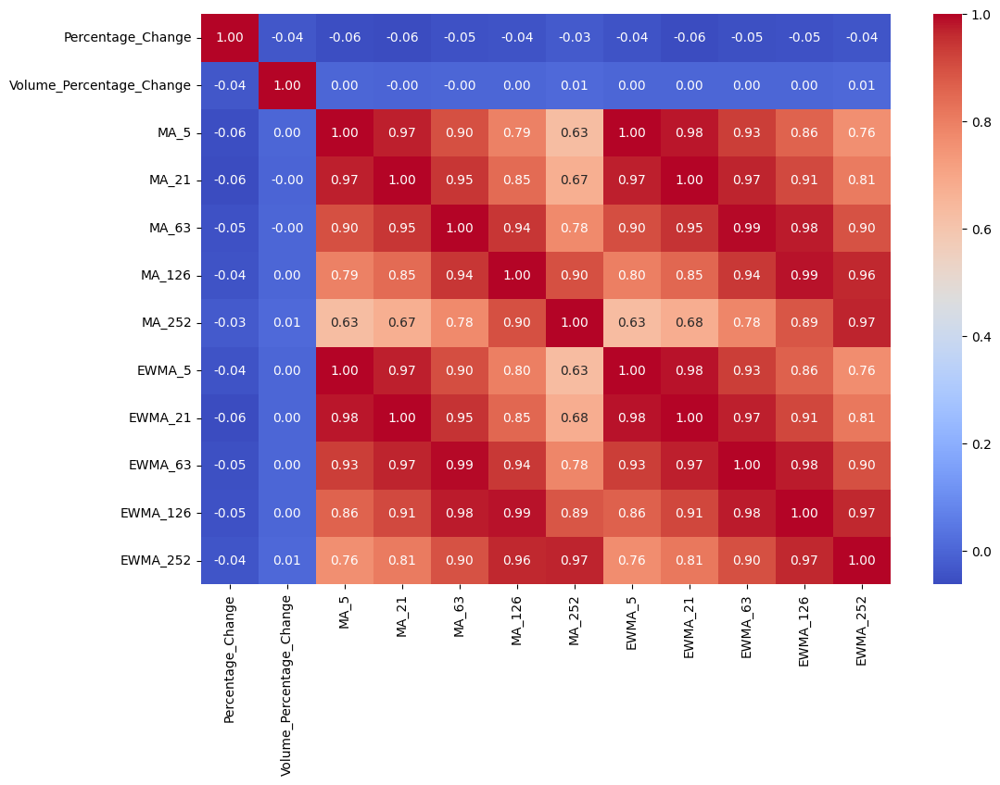

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

In [ ]:
#Multikolinearite için VIF değerleri
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X = add_constant(df_chrw[list(df_chrw.drop(columns = ["Date", "Close"], axis=1))])
vif = pd.DataFrame()
vif["Feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif)


                     Feature          VIF
0                      const   142.389214
1          Percentage_Change     1.176779
2   Volume_Percentage_Change     1.003127
3                       MA_5   923.124106
4                      MA_21   927.816419
5                      MA_63   490.519282
6                     MA_126   466.001490
7                     MA_252   192.854056
8                     EWMA_5   921.429136
9                    EWMA_21  4428.967866
10                   EWMA_63  7700.365778
11                  EWMA_126  7605.144055
12                  EWMA_252   172.382686


+ Multikolinearitenin mevcut olduğu değişkenlerin VIF değerlerinden çok bariz belli. PCA uygulamamız gerekebilir

In [ ]:
#Değişken Önemliliği
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
#Bağımlı-Bağımsız değişkenlerin ayrımı
X = df_chrw.drop(columns = ["Date", "Close"], axis = 1)
y = df_chrw["Close"]
#Veri setini train ve test olarak ayıracağım, öğrenilecek ve tahmin edilecek kısımları görselleştireceğim
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 42, shuffle = False)

model = RandomForestRegressor()
model.fit(X_train, y_train)
importance = model.feature_importances_

feature_importance = pd.DataFrame({
    "Feature": X.columns,
    "Importance": importance
}).sort_values(by="Importance", ascending=False)
print(feature_importance)


                     Feature  Importance
7                     EWMA_5    0.977035
2                       MA_5    0.012881
0          Percentage_Change    0.004053
3                      MA_21    0.001322
8                    EWMA_21    0.001090
1   Volume_Percentage_Change    0.000922
4                      MA_63    0.000533
5                     MA_126    0.000466
9                    EWMA_63    0.000435
10                  EWMA_126    0.000428
11                  EWMA_252    0.000426
6                     MA_252    0.000409


**Düşüncelerim ve Sorularım:**

+ Bunun gibi bir sonuç olduğunda diğer sütunları veri setinden çıkarmam sorun yaratır mı? Mesela burada sadece EWMA_5 çok önemli 0.97 gibi neredeyse bütün öneme sahip, diğer sütunları veri setinden çıkartsam, bilgi kaybı olur mu? Teorik açıdan bunu yapmam mantıklı mı?

+ Mesela her veri seti için önem değeri 0.001'in altında olan değişkenleri çıkarmak mantıklı gibime geldi. Çünkü bunlar 7 senelik geçmiş verilerde bu kadar değersizse, büyük ihtimalle önümüzdeki 1 hafta, 1 ay, 3 ay, 6 ay ve 1 yıllık tahminler için de değersiz olacak. Doğru mu mantık yürütüyorum? Çünkü max 1 sene içerisinde değeri 0.001 olan bir değiken bir anda değerli hale gelmesi gerçek dünya açısından biraz zor değil mi? Çok çok büyük bir olay olması gerekiyor bunun için bu şirketi etkileyecek

+ Bu önem değeri her model için aynı mıdır? Yoksa modelden modele göre değişkenlik mi gösterir? Eğer modelden modele değişebiliyorsa, değersiz olan özelliği çıkartmak mantıklı olmayacak

+ Ya da bunun yerine, hem multikolinearite olduğundan hem de yalnızca tek bir değişken ya da 1 2 tane daha fazla değişken anlamlı olduğu durumda; değişken çıkartarak genellenebilirliği riske atmak yerine PCA uygulamak daha mantıklı. PCA bileşenleri oluşturulurken daha önemli olan değişkenlere daha çok ağırlık verecek çünkü

+ Uygulama içerisinde her veri setine direkt olarak PCA uygulanacak şekilde yapmam da, multikolinearite fazla ise PCA uygularım. Değişken çıkartma işini uygulamayadabilirim. Çünkü bir veri setinde ewma_5 önemli iken diğerinde ewma_63 önemli olabilir. Değersiz olan değişkenler de modele karmaşıklık katmaz çünkü zaten değersizler ve ona göre ağırlıklandırılacaklar her model türünde

In [ ]:
#PCA
from sklearn.decomposition import PCA
#Standartlaştırma işlemi
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#PCA Uygulanması
pca = PCA(n_components = 0.95) #Varyansın %95'ini açıklayan bileşenler seçiliyor (!önemli!)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [ ]:
#PCA sonrası bilgi
print(f"Seçilen PCA bileşen sayısı: {pca.n_components_}")
print(f"Açıklanan toplam varyans oranı: {sum(pca.explained_variance_ratio_)}")

Seçilen PCA bileşen sayısı: 4
Açıklanan toplam varyans oranı: 0.9863396668211428


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.svm import SVR
import xgboost as xgb

from sklearn.metrics import accuracy_score, r2_score, mean_absolute_error, mean_squared_error

regression_models = {"DecisionTree": DecisionTreeRegressor(),
                     "RandomForest": RandomForestRegressor(),
                     "GradientBoosting": GradientBoostingRegressor(),
                     "AdaBoost": AdaBoostRegressor(),
                     "KNN": KNeighborsRegressor(),
                     "LinearRegression": LinearRegression(),
                     "LassoRegression": Lasso(),
                     "RidgeRegression": Ridge(),
                     "LinearSVR": SVR(kernel="linear"),
                     "RbfSVR": SVR(kernel="rbf"),
                     "PolynomialSVR": SVR(kernel="poly"),
                     "XGBoost": xgb.XGBRegressor()}


In [ ]:
model_names = []
train_score = []
test_score = []
mse_score = []
mae_score = []
r2score = []

for name, reg in regression_models.items():
    reg.fit(X_train_pca, y_train)
    predictions = reg.predict(X_test_pca)
    sc_train = reg.score(X_train_pca, y_train)
    sc_test = reg.score(X_test_pca, y_test)
    sc_mse = mean_squared_error(y_test, predictions)
    sc_mae = mean_absolute_error(y_test, predictions)
    sc_r2 = r2_score(y_test, predictions)

    model_names.append(name)
    train_score.append(sc_train)
    test_score.append(sc_test)
    mse_score.append(sc_mse)
    mae_score.append(sc_mae)
    r2score.append(sc_r2)

    print(f"{name} Train Setindeki Doğruluk: {sc_train}")
    print(f"{name} Test Setindeki Doğruluk: {sc_test}")
    print(f"{name} MSE Skoru: {sc_mse}")
    print(f"{name} MAE Skoru: {sc_mae}")
    print(f"{name} R^2 Skoru: {sc_r2}\n")

DecisionTree Train Setindeki Doğruluk: 1.0
DecisionTree Test Setindeki Doğruluk: 0.8679652378566287
DecisionTree MSE Skoru: 17.58532981523536
DecisionTree MAE Skoru: 3.273347143042693
DecisionTree R^2 Skoru: 0.8679652378566287

RandomForest Train Setindeki Doğruluk: 0.9958192569061471
RandomForest Test Setindeki Doğruluk: 0.8914978345053891
RandomForest MSE Skoru: 14.451091022666535
RandomForest MAE Skoru: 2.9166618589691766
RandomForest R^2 Skoru: 0.8914978345053891

GradientBoosting Train Setindeki Doğruluk: 0.9848143561290105
GradientBoosting Test Setindeki Doğruluk: 0.9217494618631654
GradientBoosting MSE Skoru: 10.421963875404867
GradientBoosting MAE Skoru: 2.430342375993396
GradientBoosting R^2 Skoru: 0.9217494618631654

AdaBoost Train Setindeki Doğruluk: 0.9588685484716815
AdaBoost Test Setindeki Doğruluk: 0.8553346644263805
AdaBoost MSE Skoru: 19.26755952444847
AdaBoost MAE Skoru: 3.39631727016275
AdaBoost R^2 Skoru: 0.8553346644263805

KNN Train Setindeki Doğruluk: 0.970751188

## Her Şirket için Prophet Modelinin Eğitilmesi

+ ML modelleri yalnızca NVDA gibi sayılı, birkaç büyük şirkette iyi sonuç verebiliyor. Dolayısıyla bu analizleri yaparken uygulamada içerisinde ML modellerini kullanmak mantıklı değil. Bundan mütevellit farklı modelleri, yöntemleri denemeye çalışacağım. Bu başlık altında Prophet'i deniyorum. Ben de yeni öğrendim, profesyoneli değilim o yüzden açıklayarak gideceğim

In [ ]:
#Bağımlı-Bağımsız değişkenlerin ayrımı
X = df_chrw.drop(columns = ["Date", "Close"], axis = 1)
y = df_chrw["Close"]

In [ ]:
#Veri setini train ve test olarak ayıracağım, öğrenilecek ve tahmin edilecek kısımları görselleştireceğim
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 42, shuffle = False)

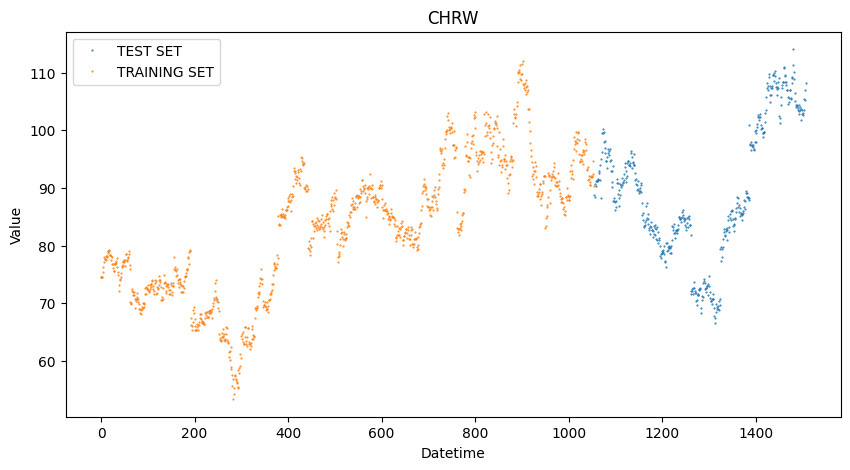

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# X_train ve X_test veri setlerinin index'lerinin datetime formatında olduğundan emin olun.
X_train = X_train.copy()
X_test = X_test.copy()

# Eğitim ve test veri setlerini görselleştirme için birleştiriyoruz.
train_set = pd.DataFrame({'Datetime': X_train.index, 'Value': y_train, 'Set': 'TRAINING SET'})
test_set = pd.DataFrame({'Datetime': X_test.index, 'Value': y_test, 'Set': 'TEST SET'})

# Eğitim ve test veri setlerini birleştirme
plot_data = pd.concat([train_set, test_set])

# Görselleştirme
plt.figure(figsize=(10, 5))
for label, df in plot_data.groupby('Set'):
    plt.plot(df['Datetime'], df['Value'], '.', ms=1, label=label)
plt.title('CHRW')
plt.xlabel('Datetime')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
#Prophet zaman serisi verisinin formatını spesifik olarak alıyormuş.
#Train-Test ayrımını yapmama gerek yokmuş yani.
#Prophet formatı da; bağımlı değişkeni "y", tarih sütununu da "ds" olarak alıyormuş. Bunları düzenlemem lazım

prophet_chrw = df_chrw.rename(columns = {"Date": "ds", "Close": "y"}) #Prophet formatı

In [ ]:
prophet_chrw.head(3)

,ds,y,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
0,2019-01-28,74.625046,-0.458875,-20.329934,74.700732,73.060205,74.613217,78.086794,77.124159,74.645659,73.756247,74.826170,76.190283,77.385134
1,2019-01-29,74.487442,0.000000,32.227855,74.642250,73.194534,74.609329,78.060393,77.096411,74.592920,73.822719,74.815585,76.163467,77.362228
2,2019-01-30,74.590652,-0.891325,170.188434,74.599245,73.338691,74.623636,78.041428,77.070477,74.592164,73.892532,74.808556,76.138698,77.340318


In [ ]:
#Train ve test ayrımı yapılıyormuş bu arada. Train ve Test olarak
#ayırma yapmadan nasıl metrik değerlendirmesi yapacağız ki diye düşünüyordum ben de
#ama sıkıntı yok ayırma yapılıyormuş. İlk bi ayırmıyoruz sanmıştım.
# Her neyse, önceden ayırdıklarım 'df_chrw' üzerindeydi o yüzden tekrar ayırma yapmam lazım

train_size = int(len(prophet_chrw)*0.8)
train, test = prophet_chrw.iloc[:train_size], prophet_chrw.iloc[train_size:]

In [ ]:
#Model eğitimi
model_chrw = Prophet()
model_chrw.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpha4wz4fy/2lb4zqti.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpha4wz4fy/nr_agqb6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51562', 'data', 'file=/tmp/tmpha4wz4fy/2lb4zqti.json', 'init=/tmp/tmpha4wz4fy/nr_agqb6.json', 'output', 'file=/tmp/tmpha4wz4fy/prophet_modeli90gs97e/prophet_model-20250126122151.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:21:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:21:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
#Test setinin zaman aralığını da kapsayacak şekilde future dataframe oluşturmamız gererkiyormuş
future = model_chrw.make_future_dataframe(periods=len(test), freq='D')
forecast = model_chrw.predict(future)

In [ ]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-01-28,76.960058,72.457429,81.964719,76.960058,76.960058,0.141137,0.141137,0.141137,0.782248,0.782248,0.782248,-0.641111,-0.641111,-0.641111,0.0,0.0,0.0,77.101195
1,2019-01-29,76.918928,72.318676,81.536297,76.918928,76.918928,-0.181043,-0.181043,-0.181043,0.707895,0.707895,0.707895,-0.888938,-0.888938,-0.888938,0.0,0.0,0.0,76.737885
2,2019-01-30,76.877799,71.390439,80.875736,76.877799,76.877799,-0.660671,-0.660671,-0.660671,0.466810,0.466810,0.466810,-1.127481,-1.127481,-1.127481,0.0,0.0,0.0,76.217128
3,2019-01-31,76.836669,71.422683,80.957300,76.836669,76.836669,-0.815912,-0.815912,-0.815912,0.537887,0.537887,0.537887,-1.353800,-1.353800,-1.353800,0.0,0.0,0.0,76.020757
4,2019-02-01,76.795539,71.321566,80.773766,76.795539,76.795539,-0.934607,-0.934607,-0.934607,0.630615,0.630615,0.630615,-1.565222,-1.565222,-1.565222,0.0,0.0,0.0,75.860933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1503,2024-09-01,75.912277,59.939905,94.922122,60.075851,92.164404,1.631919,1.631919,1.631919,-1.562728,-1.562728,-1.562728,3.194647,3.194647,3.194647,0.0,0.0,0.0,77.544196
1504,2024-09-02,75.883509,63.312243,96.314611,59.908170,92.150985,3.915864,3.915864,3.915864,0.782248,0.782248,0.782248,3.133616,3.133616,3.133616,0.0,0.0,0.0,79.799372
1505,2024-09-03,75.854740,62.128237,96.694067,59.775975,92.181696,3.769809,3.769809,3.769809,0.707895,0.707895,0.707895,3.061914,3.061914,3.061914,0.0,0.0,0.0,79.624549
1506,2024-09-04,75.825972,62.906176,96.859906,59.673730,92.270296,3.445056,3.445056,3.445056,0.466810,0.466810,0.466810,2.978247,2.978247,2.978247,0.0,0.0,0.0,79.271028


In [ ]:
# Tahminleri ve gerçek değerleri karşılaştırma
train_results = forecast[['ds', 'yhat']].merge(train, on='ds', how='inner')
test_results = forecast[['ds', 'yhat']].merge(test, on='ds', how='inner')

# Performans metriklerini hesaplama (Train Seti)
train_mae = mean_absolute_error(train_results['y'], train_results['yhat'])
train_rmse = np.sqrt(mean_squared_error(train_results['y'], train_results['yhat']))
train_r2 = r2_score(train_results['y'], train_results['yhat'])

# Performans metriklerini hesaplama (Test Seti)
test_mae = mean_absolute_error(test_results['y'], test_results['yhat'])
test_rmse = np.sqrt(mean_squared_error(test_results['y'], test_results['yhat']))
test_r2 = r2_score(test_results['y'], test_results['yhat'])

# Sonuçları yazdırma
print("Train Set Metrics:")
print(f"MAE: {train_mae}")
print(f"RMSE: {train_rmse}")
print(f"R^2: {train_r2}")

print("\nTest Set Metrics:")
print(f"MAE: {test_mae}")
print(f"RMSE: {test_rmse}")
print(f"R^2: {test_r2}")


Train Set Metrics:
MAE: 3.0550449394669785
RMSE: 3.771614849612631
R^2: 0.8859070310908237

Test Set Metrics:
MAE: 7.504379317821659
RMSE: 9.5782705183686
R^2: -0.14419677772600692


In [ ]:
# Performans metriklerini hesaplama
def calculate_accuracy(y_true, y_pred):
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    accuracy = 100 - mape
    return accuracy

# Train set doğruluğu
train_accuracy = calculate_accuracy(train_results['y'], train_results['yhat'])

# Test set doğruluğu
test_accuracy = calculate_accuracy(test_results['y'], test_results['yhat'])

# Sonuçları yazdırma
print(f"Train Set Accuracy: {train_accuracy:.2f}%")
print(f"Test Set Accuracy: {test_accuracy:.2f}%")

Train Set Accuracy: 96.36%
Test Set Accuracy: 90.86%


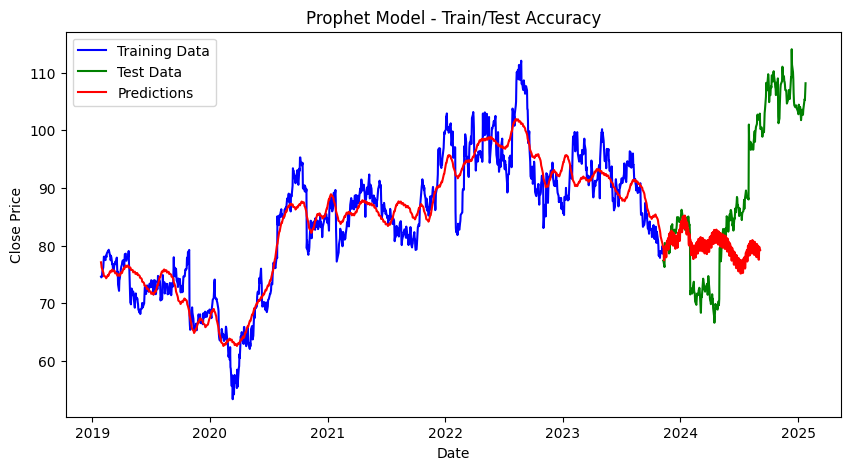

In [ ]:
# Sonuçları görselleştirme
plt.figure(figsize=(10, 5))
plt.plot(train['ds'], train['y'], label='Training Data', color='blue')
plt.plot(test['ds'], test['y'], label='Test Data', color='green')
plt.plot(forecast['ds'], forecast['yhat'], label='Predictions', color='red')
plt.title('Prophet Model - Train/Test Accuracy')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

*italik metin*# Şirket Bazında Model Geliştirmesi

+ Sektör bazında model geliştirilmesi, bazı durumla sorun çıkartma ihtimaline sahip. Örneğin, aynı sektörde bulunan 2 sektör düşünelim ve RandomForest modelinin A şirketinde çok iyi sonuç verdiğini ancak B şirketin inanılmaz kötü sonuç verdiğini varsayalım. Bu durumları yukarıdaki model eğitimlerinde gözlemledim. Bunun önüne geçmek için tüm şirketler için model eğitip, her şirket için en iyi modeli seçeceğim ve uygulamaya entegre edeceğim

## Veri Çekme ve FeatureEng (`prepare_time_series_data()`)

In [ ]:
def prepare_time_series_data(ticker, start_date="7y", decompose_period = 365):
    stock = yf.Ticker(ticker)
    df = stock.history(period=start_date)
    if df.empty:
        raise ValueError(f"{ticker} için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.")

    df = df.reset_index()
    df["Date"] = pd.to_datetime(df["Date"]).dt.date
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df['Close'] = pd.to_numeric(df['Close'], errors='coerce')

    # Feature Engineering
    df["Percentage_Change"] = ((df['Close'] - df['Open']) / df['Open']) * 100
    df['Volume_Percentage_Change'] = df['Volume'].pct_change() * 100
    df.dropna(inplace=True)

    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_21'] = df['Close'].rolling(window=21).mean()
    df['MA_63'] = df['Close'].rolling(window=63).mean()
    df['MA_126'] = df['Close'].rolling(window=126).mean()
    df['MA_252'] = df['Close'].rolling(window=252).mean()

    df['EWMA_5'] = df['Close'].ewm(span=5, adjust=False).mean()
    df['EWMA_21'] = df['Close'].ewm(span=21, adjust=False).mean()
    df['EWMA_63'] = df['Close'].ewm(span=63, adjust=False).mean()
    df['EWMA_126'] = df['Close'].ewm(span=126, adjust=False).mean()
    df['EWMA_252'] = df['Close'].ewm(span=252, adjust=False).mean()

    df = df.drop(columns=["Open", "High", "Low", "Volume", "Dividends", "Stock Splits"], axis=1)
    df.dropna(inplace=True)
    df = df.reset_index(drop=True)
    return df

## Wikipedia ile Tüm Şirketlerin Kodunu Çekme

In [ ]:
#Wikipedia'dan veri çekimi
import requests
import pandas as pd

def get_sp500_tickers():
    """
    S&P 500 şirketlerinin kodlarını Wikipedia'dan çeker.

    Returns:
        list: S&P 500 şirketlerinin kodlarının listesi.
    """
    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"

    try:
        #Wikipedia'dan sayfa içeriğini çekme
        response = requests.get(url)
        response.raise_for_status()

        #Pandas ile HTML tablosunu okuma
        tables = pd.read_html(response.text)

        #İlk tablo S&P 500 şirketlerini içeriyor
        sp500_table = tables[0]

        #'Symbol' sütunundaki şirket kodlarını alma
        tickers = sp500_table['Symbol'].tolist()
        return tickers

    except Exception as e:
        print(f"Hata oluştu: {e}")
        return []

In [ ]:
# Fonksiyonu çağır ve sonucu kontrol et
tickers = get_sp500_tickers()
print(f"S&P 500'deki şirket sayısı: {len(tickers)}")
print("Şirket kodları:", tickers)

S&P 500'deki şirket sayısı: 503
Şirket kodları: ['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A', 'APD', 'ABNB', 'AKAM', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AEE', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'AME', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'APO', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ADM', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'ADP', 'AZO', 'AVB', 'AVY', 'AXON', 'BKR', 'BALL', 'BAC', 'BAX', 'BDX', 'BRK.B', 'BBY', 'TECH', 'BIIB', 'BLK', 'BX', 'BK', 'BA', 'BKNG', 'BWA', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BF.B', 'BLDR', 'BG', 'BXP', 'CHRW', 'CDNS', 'CZR', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CARR', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CE', 'COR', 'CNC', 'CNP', 'CF', 'CRL', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', 'KO', 'CTSH', 'CL', 'CMCSA', 'CAG', 'COP', 'ED', 'STZ', 'CEG', 'COO', 'CPRT', 'GLW', 'CPAY', 'CTVA', 'CSGP', 'COST', 'CTRA', 'CRWD

<ipython-input-10-3afbef173218>:20: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  tables = pd.read_html(response.text)


+ `BRK.B` ve `BF.B` şirketlerinin verileri çekilemiyor. Bu kodlarda veri bulunamadı diyor

## Listeye Alınan Tüm S&P500 Şirket Kodlarının Veri Setine Dönüştürülmesi

In [ ]:
# Sözlükte verileri saklamak için bir boş sözlük oluşturuyoruz
dataframes = {}

# Döngüyle her şirketin verisini çekiyoruz
for ticker in tickers:
    try:
        print(f"{ticker} verileri çekiliyor...")
        dataframes[ticker] = prepare_time_series_data(ticker)
        print(f"{ticker} verileri başarıyla çekildi.")
    except Exception as e:
        print(f"{ticker} verileri alınamadı: {e}")

MMM verileri çekiliyor...
MMM verileri başarıyla çekildi.
AOS verileri çekiliyor...
AOS verileri başarıyla çekildi.
ABT verileri çekiliyor...
ABT verileri başarıyla çekildi.
ABBV verileri çekiliyor...
ABBV verileri başarıyla çekildi.
ACN verileri çekiliyor...
ACN verileri başarıyla çekildi.
ADBE verileri çekiliyor...
ADBE verileri başarıyla çekildi.
AMD verileri çekiliyor...
AMD verileri başarıyla çekildi.
AES verileri çekiliyor...
AES verileri başarıyla çekildi.
AFL verileri çekiliyor...
AFL verileri başarıyla çekildi.
A verileri çekiliyor...
A verileri başarıyla çekildi.
APD verileri çekiliyor...
APD verileri başarıyla çekildi.
ABNB verileri çekiliyor...
ABNB verileri başarıyla çekildi.
AKAM verileri çekiliyor...
AKAM verileri başarıyla çekildi.
ALB verileri çekiliyor...
ALB verileri başarıyla çekildi.
ARE verileri çekiliyor...
ARE verileri başarıyla çekildi.
ALGN verileri çekiliyor...
ALGN verileri başarıyla çekildi.
ALLE verileri çekiliyor...
ALLE verileri başarıyla çekildi.
LNT ve

ERROR:yfinance:$BRK.B: possibly delisted; no price data found  (period=7y) (Yahoo error = "No data found, symbol may be delisted")


BRK.B verileri alınamadı: BRK.B için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.
BBY verileri çekiliyor...
BBY verileri başarıyla çekildi.
TECH verileri çekiliyor...
TECH verileri başarıyla çekildi.
BIIB verileri çekiliyor...
BIIB verileri başarıyla çekildi.
BLK verileri çekiliyor...
BLK verileri başarıyla çekildi.
BX verileri çekiliyor...
BX verileri başarıyla çekildi.
BK verileri çekiliyor...
BK verileri başarıyla çekildi.
BA verileri çekiliyor...
BA verileri başarıyla çekildi.
BKNG verileri çekiliyor...
BKNG verileri başarıyla çekildi.
BWA verileri çekiliyor...
BWA verileri başarıyla çekildi.
BSX verileri çekiliyor...
BSX verileri başarıyla çekildi.
BMY verileri çekiliyor...
BMY verileri başarıyla çekildi.
AVGO verileri çekiliyor...
AVGO verileri başarıyla çekildi.
BR verileri çekiliyor...
BR verileri başarıyla çekildi.
BRO verileri çekiliyor...


ERROR:yfinance:$BF.B: possibly delisted; no price data found  (period=7y)


BRO verileri başarıyla çekildi.
BF.B verileri çekiliyor...
BF.B verileri alınamadı: BF.B için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.
BLDR verileri çekiliyor...
BLDR verileri başarıyla çekildi.
BG verileri çekiliyor...
BG verileri başarıyla çekildi.
BXP verileri çekiliyor...
BXP verileri başarıyla çekildi.
CHRW verileri çekiliyor...
CHRW verileri başarıyla çekildi.
CDNS verileri çekiliyor...
CDNS verileri başarıyla çekildi.
CZR verileri çekiliyor...
CZR verileri başarıyla çekildi.
CPT verileri çekiliyor...
CPT verileri başarıyla çekildi.
CPB verileri çekiliyor...
CPB verileri başarıyla çekildi.
COF verileri çekiliyor...
COF verileri başarıyla çekildi.
CAH verileri çekiliyor...
CAH verileri başarıyla çekildi.
KMX verileri çekiliyor...
KMX verileri başarıyla çekildi.
CCL verileri çekiliyor...
CCL verileri başarıyla çekildi.
CARR verileri çekiliyor...
CARR verileri başarıyla çekildi.
CAT verileri çekiliyor...
CAT verileri başarıyla çekildi.
CBOE verileri çekiliyor...
CBOE 

+ Tüm şirketler başarıyla çekilebiliyor. Şirketlerin kodlarını `wikipedia`, verilerini ise `yfinance` ile çekiyordum. Bunu yaparken uyumsuzluk olur endişesi vardı ancak herhangi bir sorun çıkmadı.

In [ ]:
dataframes

{'MMM':            Date       Close  Percentage_Change  Volume_Percentage_Change  \
 0    2018-01-26  166.498871           2.051848                  6.348547   
 1    2018-01-29  164.812134          -0.967081                -38.178846   
 2    2018-01-30  161.934525          -1.588422                  4.609121   
 3    2018-01-31  161.265030          -0.393654                 30.000797   
 4    2018-02-01  159.616943           0.202069                -15.014020   
 ...         ...         ...                ...                       ...   
 1754 2025-01-17  141.029999           0.988188                 38.853179   
 1755 2025-01-21  146.889999           0.955326                 98.593764   
 1756 2025-01-22  149.119995           0.838511                -37.742886   
 1757 2025-01-23  149.630005           0.120447                -37.280472   
 1758 2025-01-24  149.429993           0.355943                  9.445608   
 
             MA_5       MA_21       MA_63      MA_126      MA_252  

## ML Modellerinin Eğitimi (`evaluate_models()`)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Regressor modellerin tanımı
regression_models = {
    "DecisionTree": DecisionTreeRegressor(),
    "RandomForest": RandomForestRegressor(),
    "GradientBoosting": GradientBoostingRegressor(),
    "AdaBoost": AdaBoostRegressor(),
    "KNN": KNeighborsRegressor(),
    "LinearRegression": LinearRegression(),
    "LassoRegression": Lasso(),
    "RidgeRegression": Ridge(),
    "LinearSVR": SVR(kernel="linear"),
    "RbfSVR": SVR(kernel="rbf"),
    "PolynomialSVR": SVR(kernel="poly"),
    "XGBoost": xgb.XGBRegressor()
}

In [ ]:
def evaluate_models(stock_names=list()):
  for ticker in stock_names:
    print(f"\n=== {ticker} için Model Performansı Sonuçları")

    df = dataframes[ticker] #prepare_time_series_data() burada kullanılıyor
    X = df.drop(columns=["Date", "Close"], axis=1)
    y = df["Close"]

    #Standartlaştırma
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle=False)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    #PCA Uygulanması
    pca = PCA(n_components = 0.95) #Varyansın %95'ini açıklayan bileşenler seçiliyor (!önemli!)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    for name, reg in regression_models.items():
      try:
        reg.fit(X_train_scaled, y_train)
        predictions = reg.predict(X_test_scaled)
        train_score = reg.score(X_train_scaled, y_train)
        test_score = reg.score(X_test_scaled, y_test)
        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        print(f"\nModel: {name}")
        print(f"Train Setindeki Doğruluk: {train_score}")
        print(f"Test Setindeki Doğruluk: {test_score}")
        print(f"MSE Skoru: {mse}")
        print(f"MAE Skoru: {mae}")
        print(f"R^2 Skoru: {r2}")

      except Exception as e:
        print(f"{name} modeli {ticker} için hata verdi: {e}")

# Tüm Şirketler için Model Eğitimi

### Inf Sorunu Öncesi

In [ ]:
#Şirket kodları
tickers

['MMM',
 'AOS',
 'ABT',
 'ABBV',
 'ACN',
 'ADBE',
 'AMD',
 'AES',
 'AFL',
 'A',
 'APD',
 'ABNB',
 'AKAM',
 'ALB',
 'ARE',
 'ALGN',
 'ALLE',
 'LNT',
 'ALL',
 'GOOGL',
 'GOOG',
 'MO',
 'AMZN',
 'AMCR',
 'AEE',
 'AEP',
 'AXP',
 'AIG',
 'AMT',
 'AWK',
 'AMP',
 'AME',
 'AMGN',
 'APH',
 'ADI',
 'ANSS',
 'AON',
 'APA',
 'APO',
 'AAPL',
 'AMAT',
 'APTV',
 'ACGL',
 'ADM',
 'ANET',
 'AJG',
 'AIZ',
 'T',
 'ATO',
 'ADSK',
 'ADP',
 'AZO',
 'AVB',
 'AVY',
 'AXON',
 'BKR',
 'BALL',
 'BAC',
 'BAX',
 'BDX',
 'BRK.B',
 'BBY',
 'TECH',
 'BIIB',
 'BLK',
 'BX',
 'BK',
 'BA',
 'BKNG',
 'BWA',
 'BSX',
 'BMY',
 'AVGO',
 'BR',
 'BRO',
 'BF.B',
 'BLDR',
 'BG',
 'BXP',
 'CHRW',
 'CDNS',
 'CZR',
 'CPT',
 'CPB',
 'COF',
 'CAH',
 'KMX',
 'CCL',
 'CARR',
 'CAT',
 'CBOE',
 'CBRE',
 'CDW',
 'CE',
 'COR',
 'CNC',
 'CNP',
 'CF',
 'CRL',
 'SCHW',
 'CHTR',
 'CVX',
 'CMG',
 'CB',
 'CHD',
 'CI',
 'CINF',
 'CTAS',
 'CSCO',
 'C',
 'CFG',
 'CLX',
 'CME',
 'CMS',
 'KO',
 'CTSH',
 'CL',
 'CMCSA',
 'CAG',
 'COP',
 'ED',
 'STZ',
 

In [ ]:
len(tickers)

503

In [ ]:
tickers.remove("BF.B")

In [ ]:
tickers.remove("BRK.B")

In [ ]:
tickers

['MMM',
 'AOS',
 'ABT',
 'ABBV',
 'ACN',
 'ADBE',
 'AMD',
 'AES',
 'AFL',
 'A',
 'APD',
 'ABNB',
 'AKAM',
 'ALB',
 'ARE',
 'ALGN',
 'ALLE',
 'LNT',
 'ALL',
 'GOOGL',
 'GOOG',
 'MO',
 'AMZN',
 'AMCR',
 'AEE',
 'AEP',
 'AXP',
 'AIG',
 'AMT',
 'AWK',
 'AMP',
 'AME',
 'AMGN',
 'APH',
 'ADI',
 'ANSS',
 'AON',
 'APA',
 'APO',
 'AAPL',
 'AMAT',
 'APTV',
 'ACGL',
 'ADM',
 'ANET',
 'AJG',
 'AIZ',
 'T',
 'ATO',
 'ADSK',
 'ADP',
 'AZO',
 'AVB',
 'AVY',
 'AXON',
 'BKR',
 'BALL',
 'BAC',
 'BAX',
 'BDX',
 'BBY',
 'TECH',
 'BIIB',
 'BLK',
 'BX',
 'BK',
 'BA',
 'BKNG',
 'BWA',
 'BSX',
 'BMY',
 'AVGO',
 'BR',
 'BRO',
 'BLDR',
 'BG',
 'BXP',
 'CHRW',
 'CDNS',
 'CZR',
 'CPT',
 'CPB',
 'COF',
 'CAH',
 'KMX',
 'CCL',
 'CARR',
 'CAT',
 'CBOE',
 'CBRE',
 'CDW',
 'CE',
 'COR',
 'CNC',
 'CNP',
 'CF',
 'CRL',
 'SCHW',
 'CHTR',
 'CVX',
 'CMG',
 'CB',
 'CHD',
 'CI',
 'CINF',
 'CTAS',
 'CSCO',
 'C',
 'CFG',
 'CLX',
 'CME',
 'CMS',
 'KO',
 'CTSH',
 'CL',
 'CMCSA',
 'CAG',
 'COP',
 'ED',
 'STZ',
 'CEG',
 'COO',
 'CP

In [ ]:
evaluate_models(stock_names = tickers)


=== MMM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9897226730428936
MSE Skoru: 5.173342480912646
MAE Skoru: 1.702458640597514
R^2 Skoru: 0.9897226730428936

Model: RandomForest
Train Setindeki Doğruluk: 0.9994208500135078
Test Setindeki Doğruluk: 0.9935438266883327
MSE Skoru: 3.2498718583909416
MAE Skoru: 1.1645197392141584
R^2 Skoru: 0.9935438266883327

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9983085613679251
Test Setindeki Doğruluk: 0.9939828343578624
MSE Skoru: 3.0288866707343676
MAE Skoru: 1.186159369534451
R^2 Skoru: 0.9939828343578624

Model: AdaBoost
Train Setindeki Doğruluk: 0.9910362564435726
Test Setindeki Doğruluk: 0.9874420802253074
MSE Skoru: 6.321334342427297
MAE Skoru: 1.7735301254946232
R^2 Skoru: 0.9874420802253074

Model: KNN
Train Setindeki Doğruluk: 0.9879689512711489
Test Setindeki Doğruluk: 0.8704522786792915
MSE Skoru: 65.21099628444178
MAE Skoru: 6.484957784690604
R^2 Skoru: 0.87045

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.560e+02, tolerance: 1.213e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987990832268331
Test Setindeki Doğruluk: 0.9832351420334997
MSE Skoru: 4.447471508960052
MAE Skoru: 1.3299098212746312
R^2 Skoru: 0.9832351420334997

Model: RbfSVR
Train Setindeki Doğruluk: 0.9826253078471969
Test Setindeki Doğruluk: -8.448614552527474
MSE Skoru: 2506.5791851908875
MAE Skoru: 43.103807001590475
R^2 Skoru: -8.448614552527474

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9000669016686653
Test Setindeki Doğruluk: -129.1652703695081
MSE Skoru: 34530.94160303927
MAE Skoru: 149.20172363465528
R^2 Skoru: -129.1652703695081

Model: XGBoost
Train Setindeki Doğruluk: 0.9999851879156908
Test Setindeki Doğruluk: -1.2328241015038781
MSE Skoru: 592.3355626275446
MAE Skoru: 20.134506655055166
R^2 Skoru: -1.2328241015038781

=== ACN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9178040648555411
MSE Skoru: 52.75184284581723
MAE Skoru: 5.510018860267488
R^2 Skoru: 0.917804

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.932e+03, tolerance: 2.896e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9956044924893
Test Setindeki Doğruluk: 0.9787643227856798
MSE Skoru: 26.37010160395942
MAE Skoru: 3.776227689156165
R^2 Skoru: 0.9787643227856798

Model: RbfSVR
Train Setindeki Doğruluk: 0.8609750909623333
Test Setindeki Doğruluk: 0.4173552958464113
MSE Skoru: 723.5182515007368
MAE Skoru: 21.579477864325654
R^2 Skoru: 0.4173552958464113

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7564189087223321
Test Setindeki Doğruluk: 0.0156521684152523
MSE Skoru: 1222.3463405736195
MAE Skoru: 31.03973385790933
R^2 Skoru: 0.0156521684152523

Model: XGBoost
Train Setindeki Doğruluk: 0.9999742627507069
Test Setindeki Doğruluk: 0.9774550834187766
MSE Skoru: 27.995892709215937
MAE Skoru: 4.1287593715238255
R^2 Skoru: 0.9774550834187766

=== ALLE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8828365648296352
MSE Skoru: 14.783730095860683
MAE Skoru: 2.6653400446405473
R^2 Skoru: 0.882836564

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.470e+03, tolerance: 7.101e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976794978303954
Test Setindeki Doğruluk: 0.9927900932270461
MSE Skoru: 29.059591267513454
MAE Skoru: 3.728530795163286
R^2 Skoru: 0.9927900932270461

Model: RbfSVR
Train Setindeki Doğruluk: 0.9510468612292771
Test Setindeki Doğruluk: -9.803159592167832
MSE Skoru: 43542.22766426962
MAE Skoru: 187.33596802567692
R^2 Skoru: -9.803159592167832

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8721799531323029
Test Setindeki Doğruluk: -431.8330145373023
MSE Skoru: 1744537.188292474
MAE Skoru: 979.5193286198593
R^2 Skoru: -431.8330145373023

Model: XGBoost
Train Setindeki Doğruluk: 0.9999797481438504
Test Setindeki Doğruluk: -2.669993896975807
MSE Skoru: 14791.941970796546
MAE Skoru: 103.52007389700177
R^2 Skoru: -2.669993896975807

=== AME için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.7507493795661908
MSE Skoru: 308.4094156017018
MAE Skoru: 14.51548393198986
R^2 Skoru: -1.7507493

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.610e+02, tolerance: 3.738e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.997723134238006
Test Setindeki Doğruluk: 0.9866644216221007
MSE Skoru: 12.367510230886671
MAE Skoru: 2.2464532395121046
R^2 Skoru: 0.9866644216221007

Model: RbfSVR
Train Setindeki Doğruluk: 0.9618921729537613
Test Setindeki Doğruluk: -0.570044013954631
MSE Skoru: 1456.06998476395
MAE Skoru: 25.78953949466716
R^2 Skoru: -0.570044013954631

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8000913431884684
Test Setindeki Doğruluk: -6.891054382798036
MSE Skoru: 7318.219956134464
MAE Skoru: 51.689275769974465
R^2 Skoru: -6.891054382798036

Model: XGBoost
Train Setindeki Doğruluk: 0.9999764340795299
Test Setindeki Doğruluk: 0.6587611636610111
MSE Skoru: 316.46732372646557
MAE Skoru: 10.621776959753984
R^2 Skoru: 0.6587611636610111

=== APA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9460383965982506
MSE Skoru: 0.8733281876743634
MAE Skoru: 0.7178059003211015
R^2 Skoru: 0.94603839

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.163e+02, tolerance: 2.434e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.99846930079016
Test Setindeki Doğruluk: 0.990623380340575
MSE Skoru: 5.813188106231833
MAE Skoru: 1.8109728386348252
R^2 Skoru: 0.990623380340575

Model: RbfSVR
Train Setindeki Doğruluk: 0.9784348653620482
Test Setindeki Doğruluk: -5.547851063747059
MSE Skoru: 4059.4469337242945
MAE Skoru: 50.43062528074902
R^2 Skoru: -5.547851063747059

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9173764490919754
Test Setindeki Doğruluk: -28.35313803229054
MSE Skoru: 18197.956095870482
MAE Skoru: 99.49052004537346
R^2 Skoru: -28.35313803229054

Model: XGBoost
Train Setindeki Doğruluk: 0.9999826500849225
Test Setindeki Doğruluk: -0.4204217155106402
MSE Skoru: 880.6135816909311
MAE Skoru: 21.927220123493118
R^2 Skoru: -0.4204217155106402

=== AMAT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.2385299742449623
MSE Skoru: 2011.240324084418
MAE Skoru: 37.87623156617019
R^2 Skoru: -2.23852997

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.543e+01, tolerance: 2.433e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987436959791273
Test Setindeki Doğruluk: 0.9918109446042844
MSE Skoru: 0.8058813663595389
MAE Skoru: 0.6827901825964866
R^2 Skoru: 0.9918109446042844

Model: RbfSVR
Train Setindeki Doğruluk: 0.9762437658085812
Test Setindeki Doğruluk: -13.517855731973787
MSE Skoru: 1428.695844457812
MAE Skoru: 32.64826134507911
R^2 Skoru: -13.517855731973787

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.850488841079024
Test Setindeki Doğruluk: -44.67261112739167
MSE Skoru: 4494.621721548867
MAE Skoru: 51.25289375682941
R^2 Skoru: -44.67261112739167

Model: XGBoost
Train Setindeki Doğruluk: 0.999981526738418
Test Setindeki Doğruluk: -0.7685787795760199
MSE Skoru: 174.04506558166497
MAE Skoru: 10.53283360462315
R^2 Skoru: -0.7685787795760199

=== ADM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.93729245171987
MSE Skoru: 2.391635154313616
MAE Skoru: 0.8641125508491566
R^2 Skoru: 0.937292451

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.182e+01, tolerance: 4.218e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988994443250481
Test Setindeki Doğruluk: 0.9822334735068631
MSE Skoru: 0.677606611905994
MAE Skoru: 0.4599136292102723
R^2 Skoru: 0.9822334735068631

Model: RbfSVR
Train Setindeki Doğruluk: 0.98436547315161
Test Setindeki Doğruluk: 0.9101498275584563
MSE Skoru: 3.42684153544602
MAE Skoru: 1.2431460958740992
R^2 Skoru: 0.9101498275584563

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8756801629180692
Test Setindeki Doğruluk: 0.24118880354829175
MSE Skoru: 28.940687089431787
MAE Skoru: 4.594433049278933
R^2 Skoru: 0.24118880354829175

Model: XGBoost
Train Setindeki Doğruluk: 0.9999858296503917
Test Setindeki Doğruluk: 0.9640370841480098
MSE Skoru: 1.3716079828063692
MAE Skoru: 0.7833810642065592
R^2 Skoru: 0.9640370841480098

=== ANET için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.6251990359852826
MSE Skoru: 1189.9973072855555
MAE Skoru: 29.362540011374367
R^2 Skoru: -2.6251

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.635e+02, tolerance: 2.720e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9990196361207485
Test Setindeki Doğruluk: 0.9884191024991583
MSE Skoru: 7.00143464159867
MAE Skoru: 1.922099939979685
R^2 Skoru: 0.9884191024991583

Model: RbfSVR
Train Setindeki Doğruluk: 0.9696908560188859
Test Setindeki Doğruluk: -13.958905025503578
MSE Skoru: 9043.668320035946
MAE Skoru: 83.18002610173343
R^2 Skoru: -13.958905025503578

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7568351180149908
Test Setindeki Doğruluk: -324.8954252695946
MSE Skoru: 197025.7935410655
MAE Skoru: 367.857464285769
R^2 Skoru: -324.8954252695946

Model: XGBoost
Train Setindeki Doğruluk: 0.99998674616974
Test Setindeki Doğruluk: -0.8135154946628715
MSE Skoru: 1096.3925901671944
MAE Skoru: 25.472838597581877
R^2 Skoru: -0.8135154946628715

=== AIZ için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.2981030663316968
MSE Skoru: 237.3773362685584
MAE Skoru: 9.267713938327814
R^2 Skoru: 0.29810306633

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.826e+04, tolerance: 4.054e+04
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9944007307947518
Test Setindeki Doğruluk: 0.9267550171850228
MSE Skoru: 3400.615244384699
MAE Skoru: 45.546352581927735
R^2 Skoru: 0.9267550171850228

Model: RbfSVR
Train Setindeki Doğruluk: 0.7024013579930597
Test Setindeki Doğruluk: -29.318500537893616
MSE Skoru: 1407626.1766145783
MAE Skoru: 1153.1008016610797
R^2 Skoru: -29.318500537893616

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7871452440280782
Test Setindeki Doğruluk: -104.44986278666978
MSE Skoru: 4895822.172782308
MAE Skoru: 1876.4874169446223
R^2 Skoru: -104.44986278666978

Model: XGBoost
Train Setindeki Doğruluk: 0.9999828005784304
Test Setindeki Doğruluk: -2.2332476564745183
MSE Skoru: 150113.09781111847
MAE Skoru: 331.7276336467819
R^2 Skoru: -2.2332476564745183

=== AVB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9886507775980199
MSE Skoru: 5.395801033336663
MAE Skoru: 1.7845079535680102
R^2 Skoru: 0.9

ValueError: Input X contains infinity or a value too large for dtype('float64').

+ `BKR` kodlu şirketin veri setinde `inf` değer ortaya çıkıyor. Bu değeri bulup, `interpolate(method="linear")` ile dolduralım ve testi baştan yapalım. Eğer bu şirketten başka şirketlerde de inf değer ortaya çıkarsa ,ki çıkma ihtimali var, inf değerleri `prepare_time_series_data`'da doldurarak bu sorunu tüm veri setleri için çözeceğim

In [ ]:
dataframes["BKR"].isnull().sum()

,0
Date,0
Close,0
Percentage_Change,0
Volume_Percentage_Change,0
MA_5,0
MA_21,0
MA_63,0
MA_126,0
MA_252,0
EWMA_5,0


In [ ]:
np.isinf(dataframes['BKR']).sum()

,0
Date,0
Close,0
Percentage_Change,0
Volume_Percentage_Change,1
MA_5,0
MA_21,0
MA_63,0
MA_126,0
MA_252,0
EWMA_5,0


In [ ]:
# Sonsuzluk (inf) değerlerini kontrol et
inf_mask = np.isinf(dataframes["BKR"]["Volume_Percentage_Change"])

# True olan satırları filtreleyerek görmek
inf_rows = dataframes["BKR"][inf_mask]
print(inf_rows)

          Date      Close  Percentage_Change  Volume_Percentage_Change  \
183 2019-10-21  18.905825           1.654415                       inf   

          MA_5      MA_21      MA_63     MA_126     MA_252     EWMA_5  \
183  18.900693  19.323807  19.513405  19.745806  20.278464  18.891003   

     EWMA_21    EWMA_63   EWMA_126   EWMA_252  
183  19.1381  19.503877  19.948713  20.955998  


In [ ]:
# Sonsuzluk (inf) değerlerini NaN olarak değiştir
dataframes["BKR"]["Volume_Percentage_Change"] = dataframes["BKR"]["Volume_Percentage_Change"].replace([np.inf, -np.inf], np.nan)

# NaN olan değerleri önceki ve sonraki değerlerin ortalamasıyla doldur
dataframes["BKR"]["Volume_Percentage_Change"] = dataframes["BKR"]["Volume_Percentage_Change"].interpolate(method='linear')


In [ ]:
np.isinf(dataframes['BKR']).sum()

,0
Date,0
Close,0
Percentage_Change,0
Volume_Percentage_Change,0
MA_5,0
MA_21,0
MA_63,0
MA_126,0
MA_252,0
EWMA_5,0


+ inf değeri doldurduk, tüm şirketler için alınabilecek hataları da görebilmek adına `evaluate_models`'i tekrar çalıştıracağım

In [ ]:
evaluate_models(stock_names = tickers)


=== MMM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9898230002565325
MSE Skoru: 5.122840337848078
MAE Skoru: 1.6716182784528921
R^2 Skoru: 0.9898230002565325

Model: RandomForest
Train Setindeki Doğruluk: 0.9993939829702603
Test Setindeki Doğruluk: 0.9935463957406887
MSE Skoru: 3.2485786634051483
MAE Skoru: 1.1614276052310768
R^2 Skoru: 0.9935463957406887

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9983085613679251
Test Setindeki Doğruluk: 0.9940723326995915
MSE Skoru: 2.983835503716867
MAE Skoru: 1.1637802693362889
R^2 Skoru: 0.9940723326995915

Model: AdaBoost
Train Setindeki Doğruluk: 0.9915341393206684
Test Setindeki Doğruluk: 0.9888839865666104
MSE Skoru: 5.5955157166219065
MAE Skoru: 1.6108575623431962
R^2 Skoru: 0.9888839865666104

Model: KNN
Train Setindeki Doğruluk: 0.9879689512711489
Test Setindeki Doğruluk: 0.8704522786792915
MSE Skoru: 65.21099628444178
MAE Skoru: 6.484957784690604
R^2 Skoru: 0.870

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.560e+02, tolerance: 1.213e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987990832268331
Test Setindeki Doğruluk: 0.9832351420334997
MSE Skoru: 4.447471508960052
MAE Skoru: 1.3299098212746312
R^2 Skoru: 0.9832351420334997

Model: RbfSVR
Train Setindeki Doğruluk: 0.9826253078471969
Test Setindeki Doğruluk: -8.448614552527474
MSE Skoru: 2506.5791851908875
MAE Skoru: 43.103807001590475
R^2 Skoru: -8.448614552527474

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9000669016686653
Test Setindeki Doğruluk: -129.1652703695081
MSE Skoru: 34530.94160303927
MAE Skoru: 149.20172363465528
R^2 Skoru: -129.1652703695081

Model: XGBoost
Train Setindeki Doğruluk: 0.9999851879156908
Test Setindeki Doğruluk: -1.2328241015038781
MSE Skoru: 592.3355626275446
MAE Skoru: 20.134506655055166
R^2 Skoru: -1.2328241015038781

=== ACN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8727165892644094
MSE Skoru: 81.68815730611134
MAE Skoru: 6.492624143890987
R^2 Skoru: 0.872716

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.932e+03, tolerance: 2.896e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9956044924893
Test Setindeki Doğruluk: 0.9787643227856798
MSE Skoru: 26.37010160395942
MAE Skoru: 3.776227689156165
R^2 Skoru: 0.9787643227856798

Model: RbfSVR
Train Setindeki Doğruluk: 0.8609750909623333
Test Setindeki Doğruluk: 0.4173552958464113
MSE Skoru: 723.5182515007368
MAE Skoru: 21.579477864325654
R^2 Skoru: 0.4173552958464113

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7564189087223321
Test Setindeki Doğruluk: 0.0156521684152523
MSE Skoru: 1222.3463405736195
MAE Skoru: 31.03973385790933
R^2 Skoru: 0.0156521684152523

Model: XGBoost
Train Setindeki Doğruluk: 0.9999742627507069
Test Setindeki Doğruluk: 0.9774550834187766
MSE Skoru: 27.995892709215937
MAE Skoru: 4.1287593715238255
R^2 Skoru: 0.9774550834187766

=== ALLE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.847706607887052
MSE Skoru: 19.216442408905955
MAE Skoru: 2.8530885304836247
R^2 Skoru: 0.8477066078

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.470e+03, tolerance: 7.101e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976794978303954
Test Setindeki Doğruluk: 0.9927900932270461
MSE Skoru: 29.059591267513454
MAE Skoru: 3.728530795163286
R^2 Skoru: 0.9927900932270461

Model: RbfSVR
Train Setindeki Doğruluk: 0.9510468612292771
Test Setindeki Doğruluk: -9.803159592167832
MSE Skoru: 43542.22766426962
MAE Skoru: 187.33596802567692
R^2 Skoru: -9.803159592167832

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8721799531323029
Test Setindeki Doğruluk: -431.8330145373023
MSE Skoru: 1744537.188292474
MAE Skoru: 979.5193286198593
R^2 Skoru: -431.8330145373023

Model: XGBoost
Train Setindeki Doğruluk: 0.9999797481438504
Test Setindeki Doğruluk: -2.669993896975807
MSE Skoru: 14791.941970796546
MAE Skoru: 103.52007389700177
R^2 Skoru: -2.669993896975807

=== AME için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.3034216348130805
MSE Skoru: 258.25577769976724
MAE Skoru: 12.87226579678769
R^2 Skoru: -1.303421

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.610e+02, tolerance: 3.738e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.997723134238006
Test Setindeki Doğruluk: 0.9866644216221007
MSE Skoru: 12.367510230886671
MAE Skoru: 2.2464532395121046
R^2 Skoru: 0.9866644216221007

Model: RbfSVR
Train Setindeki Doğruluk: 0.9618921729537613
Test Setindeki Doğruluk: -0.570044013954631
MSE Skoru: 1456.06998476395
MAE Skoru: 25.78953949466716
R^2 Skoru: -0.570044013954631

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8000913431884684
Test Setindeki Doğruluk: -6.891054382798036
MSE Skoru: 7318.219956134464
MAE Skoru: 51.689275769974465
R^2 Skoru: -6.891054382798036

Model: XGBoost
Train Setindeki Doğruluk: 0.9999764340795299
Test Setindeki Doğruluk: 0.6587611636610111
MSE Skoru: 316.46732372646557
MAE Skoru: 10.621776959753984
R^2 Skoru: 0.6587611636610111

=== APA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9541351776490978
MSE Skoru: 0.7422878427741734
MAE Skoru: 0.6864041461060378
R^2 Skoru: 0.95413517

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.163e+02, tolerance: 2.434e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.99846930079016
Test Setindeki Doğruluk: 0.990623380340575
MSE Skoru: 5.813188106231833
MAE Skoru: 1.8109728386348252
R^2 Skoru: 0.990623380340575

Model: RbfSVR
Train Setindeki Doğruluk: 0.9784348653620482
Test Setindeki Doğruluk: -5.547851063747059
MSE Skoru: 4059.4469337242945
MAE Skoru: 50.43062528074902
R^2 Skoru: -5.547851063747059

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9173764490919754
Test Setindeki Doğruluk: -28.35313803229054
MSE Skoru: 18197.956095870482
MAE Skoru: 99.49052004537346
R^2 Skoru: -28.35313803229054

Model: XGBoost
Train Setindeki Doğruluk: 0.9999826500849225
Test Setindeki Doğruluk: -0.4204217155106402
MSE Skoru: 880.6135816909311
MAE Skoru: 21.927220123493118
R^2 Skoru: -0.4204217155106402

=== AMAT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.2797037859944584
MSE Skoru: 2036.8107005037855
MAE Skoru: 38.17648557953487
R^2 Skoru: -2.2797037

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.543e+01, tolerance: 2.433e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987436959791273
Test Setindeki Doğruluk: 0.9918109446042844
MSE Skoru: 0.8058813663595389
MAE Skoru: 0.6827901825964866
R^2 Skoru: 0.9918109446042844

Model: RbfSVR
Train Setindeki Doğruluk: 0.9762437658085812
Test Setindeki Doğruluk: -13.517855731973787
MSE Skoru: 1428.695844457812
MAE Skoru: 32.64826134507911
R^2 Skoru: -13.517855731973787

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.850488841079024
Test Setindeki Doğruluk: -44.67261112739167
MSE Skoru: 4494.621721548867
MAE Skoru: 51.25289375682941
R^2 Skoru: -44.67261112739167

Model: XGBoost
Train Setindeki Doğruluk: 0.999981526738418
Test Setindeki Doğruluk: -0.7685787795760199
MSE Skoru: 174.04506558166497
MAE Skoru: 10.53283360462315
R^2 Skoru: -0.7685787795760199

=== ADM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.3892172648540073
MSE Skoru: 23.294954133709098
MAE Skoru: 3.5661338907203928
R^2 Skoru: 0.389217

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.182e+01, tolerance: 4.218e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988994443250481
Test Setindeki Doğruluk: 0.9822334735068631
MSE Skoru: 0.677606611905994
MAE Skoru: 0.4599136292102723
R^2 Skoru: 0.9822334735068631

Model: RbfSVR
Train Setindeki Doğruluk: 0.98436547315161
Test Setindeki Doğruluk: 0.9101498275584563
MSE Skoru: 3.42684153544602
MAE Skoru: 1.2431460958740992
R^2 Skoru: 0.9101498275584563

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8756801629180692
Test Setindeki Doğruluk: 0.24118880354829175
MSE Skoru: 28.940687089431787
MAE Skoru: 4.594433049278933
R^2 Skoru: 0.24118880354829175

Model: XGBoost
Train Setindeki Doğruluk: 0.9999858296503917
Test Setindeki Doğruluk: 0.9640370841480098
MSE Skoru: 1.3716079828063692
MAE Skoru: 0.7833810642065592
R^2 Skoru: 0.9640370841480098

=== ANET için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.5496927373635287
MSE Skoru: 1165.2118289846196
MAE Skoru: 28.947250745154374
R^2 Skoru: -2.5496

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.635e+02, tolerance: 2.720e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9990196361207485
Test Setindeki Doğruluk: 0.9884191024991583
MSE Skoru: 7.00143464159867
MAE Skoru: 1.922099939979685
R^2 Skoru: 0.9884191024991583

Model: RbfSVR
Train Setindeki Doğruluk: 0.9696908560188859
Test Setindeki Doğruluk: -13.958905025503578
MSE Skoru: 9043.668320035946
MAE Skoru: 83.18002610173343
R^2 Skoru: -13.958905025503578

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7568351180149908
Test Setindeki Doğruluk: -324.8954252695946
MSE Skoru: 197025.7935410655
MAE Skoru: 367.857464285769
R^2 Skoru: -324.8954252695946

Model: XGBoost
Train Setindeki Doğruluk: 0.99998674616974
Test Setindeki Doğruluk: -0.8135154946628715
MSE Skoru: 1096.3925901671944
MAE Skoru: 25.472838597581877
R^2 Skoru: -0.8135154946628715

=== AIZ için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.292639730099129
MSE Skoru: 239.2250038388506
MAE Skoru: 9.49501886430955
R^2 Skoru: 0.2926397300991

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.826e+04, tolerance: 4.054e+04
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9944007307947518
Test Setindeki Doğruluk: 0.9267550171850228
MSE Skoru: 3400.615244384699
MAE Skoru: 45.546352581927735
R^2 Skoru: 0.9267550171850228

Model: RbfSVR
Train Setindeki Doğruluk: 0.7024013579930597
Test Setindeki Doğruluk: -29.318500537893616
MSE Skoru: 1407626.1766145783
MAE Skoru: 1153.1008016610797
R^2 Skoru: -29.318500537893616

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7871452440280782
Test Setindeki Doğruluk: -104.44986278666978
MSE Skoru: 4895822.172782308
MAE Skoru: 1876.4874169446223
R^2 Skoru: -104.44986278666978

Model: XGBoost
Train Setindeki Doğruluk: 0.9999828005784304
Test Setindeki Doğruluk: -2.2332476564745183
MSE Skoru: 150113.09781111847
MAE Skoru: 331.7276336467819
R^2 Skoru: -2.2332476564745183

=== AVB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9877151478400029
MSE Skoru: 5.840630805484538
MAE Skoru: 1.8595438066697279
R^2 Skoru: 0.9

ValueError: Input X contains infinity or a value too large for dtype('float64').

+ `BIIB` kodlu şirket için de aynı hatayı alıyorum

In [ ]:
np.isinf(dataframes['BIIB']).sum()

,0
Date,0
Close,0
Percentage_Change,0
Volume_Percentage_Change,1
MA_5,0
MA_21,0
MA_63,0
MA_126,0
MA_252,0
EWMA_5,0


In [ ]:
# Sonsuzluk (inf) değerlerini kontrol et
inf_mask = np.isinf(dataframes["BIIB"]["Volume_Percentage_Change"])

# True olan satırları filtreleyerek görmek
inf_rows = dataframes["BIIB"][inf_mask]
print(inf_rows)

           Date       Close  Percentage_Change  Volume_Percentage_Change  \
1099 2023-06-12  313.410004          -1.985866                       inf   

            MA_5       MA_21      MA_63      MA_126      MA_252      EWMA_5  \
1099  307.172003  304.396669  292.63635  286.390476  262.154563  308.334032   

         EWMA_21     EWMA_63    EWMA_126    EWMA_252  
1099  304.244545  296.214633  286.227493  272.684654  


+ İki şirkette de `Volume_Percentage_Change` sütununda ortaya çıkmış. Farklı sütunlarda da çıktı ihtimali olacağından yukarıda bahsettiğim gibi `prepare_time_series_data` fonksiyonunu güncelleyerek bu durumun önüne geçeceğim:

### Inf sorununun önüne geçmek için `preprare_time_series_data` fonksiyonunun güncellenmesi ve verilerin tekrar çekilmesi

+ tickers_inf: şirket kodlarının olduğu liste
+ dataframes_inf: inf sorunu çözülmüş şirketlerin verirlerinin olduğu sözlük (501 şirketin, 7 yıllık verisi mevcut)

In [ ]:
def prepare_time_series_data_inf(ticker, start_date="7y"):
    stock = yf.Ticker(ticker)
    df = stock.history(period=start_date)
    if df.empty:
        raise ValueError(f"{ticker} için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.")

    df = df.reset_index()
    df["Date"] = pd.to_datetime(df["Date"]).dt.date
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df['Close'] = pd.to_numeric(df['Close'], errors='coerce')

    # Feature Engineering
    df["Percentage_Change"] = ((df['Close'] - df['Open']) / df['Open']) * 100
    df['Volume_Percentage_Change'] = df['Volume'].pct_change() * 100
    df.dropna(inplace=True)

    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_21'] = df['Close'].rolling(window=21).mean()
    df['MA_63'] = df['Close'].rolling(window=63).mean()
    df['MA_126'] = df['Close'].rolling(window=126).mean()
    df['MA_252'] = df['Close'].rolling(window=252).mean()

    df['EWMA_5'] = df['Close'].ewm(span=5, adjust=False).mean()
    df['EWMA_21'] = df['Close'].ewm(span=21, adjust=False).mean()
    df['EWMA_63'] = df['Close'].ewm(span=63, adjust=False).mean()
    df['EWMA_126'] = df['Close'].ewm(span=126, adjust=False).mean()
    df['EWMA_252'] = df['Close'].ewm(span=252, adjust=False).mean()

    # Sonsuz (inf) değerleri kontrol et ve NaN'a çevir
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # NaN değerleri önceki ve sonraki değerlerin ortalamasıyla doldur
    df = df.interpolate(method='linear', limit_direction='both')

    df = df.drop(columns=["Open", "High", "Low", "Volume", "Dividends", "Stock Splits"], axis=1)
    df.dropna(inplace=True)
    df = df.reset_index(drop=True)
    return df

In [ ]:
tickers_inf = get_sp500_tickers()

<ipython-input-10-3afbef173218>:20: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  tables = pd.read_html(response.text)


In [ ]:
tickers_inf

['MMM',
 'AOS',
 'ABT',
 'ABBV',
 'ACN',
 'ADBE',
 'AMD',
 'AES',
 'AFL',
 'A',
 'APD',
 'ABNB',
 'AKAM',
 'ALB',
 'ARE',
 'ALGN',
 'ALLE',
 'LNT',
 'ALL',
 'GOOGL',
 'GOOG',
 'MO',
 'AMZN',
 'AMCR',
 'AEE',
 'AEP',
 'AXP',
 'AIG',
 'AMT',
 'AWK',
 'AMP',
 'AME',
 'AMGN',
 'APH',
 'ADI',
 'ANSS',
 'AON',
 'APA',
 'APO',
 'AAPL',
 'AMAT',
 'APTV',
 'ACGL',
 'ADM',
 'ANET',
 'AJG',
 'AIZ',
 'T',
 'ATO',
 'ADSK',
 'ADP',
 'AZO',
 'AVB',
 'AVY',
 'AXON',
 'BKR',
 'BALL',
 'BAC',
 'BAX',
 'BDX',
 'BRK.B',
 'BBY',
 'TECH',
 'BIIB',
 'BLK',
 'BX',
 'BK',
 'BA',
 'BKNG',
 'BWA',
 'BSX',
 'BMY',
 'AVGO',
 'BR',
 'BRO',
 'BF.B',
 'BLDR',
 'BG',
 'BXP',
 'CHRW',
 'CDNS',
 'CZR',
 'CPT',
 'CPB',
 'COF',
 'CAH',
 'KMX',
 'CCL',
 'CARR',
 'CAT',
 'CBOE',
 'CBRE',
 'CDW',
 'CE',
 'COR',
 'CNC',
 'CNP',
 'CF',
 'CRL',
 'SCHW',
 'CHTR',
 'CVX',
 'CMG',
 'CB',
 'CHD',
 'CI',
 'CINF',
 'CTAS',
 'CSCO',
 'C',
 'CFG',
 'CLX',
 'CME',
 'CMS',
 'KO',
 'CTSH',
 'CL',
 'CMCSA',
 'CAG',
 'COP',
 'ED',
 'STZ',
 

In [ ]:
len(tickers_inf)

503

In [ ]:
tickers_inf.remove("BF.B")

ValueError: list.remove(x): x not in list

In [ ]:
tickers_inf.remove("BRK.B")

In [ ]:
len(tickers_inf)

501

In [ ]:
# Sözlükte verileri saklamak için bir boş sözlük oluşturuyoruz
dataframes_inf = {}

# Döngüyle her şirketin verisini çekiyoruz
for ticker in tickers_inf:
    try:
        print(f"{ticker} verileri çekiliyor...")
        dataframes_inf[ticker] = prepare_time_series_data_inf(ticker)
        print(f"{ticker} verileri başarıyla çekildi.")
    except Exception as e:
        print(f"{ticker} verileri alınamadı: {e}")

MMM verileri çekiliyor...
MMM verileri başarıyla çekildi.
AOS verileri çekiliyor...
AOS verileri başarıyla çekildi.
ABT verileri çekiliyor...
ABT verileri başarıyla çekildi.
ABBV verileri çekiliyor...
ABBV verileri başarıyla çekildi.
ACN verileri çekiliyor...
ACN verileri başarıyla çekildi.
ADBE verileri çekiliyor...
ADBE verileri başarıyla çekildi.
AMD verileri çekiliyor...
AMD verileri başarıyla çekildi.
AES verileri çekiliyor...
AES verileri başarıyla çekildi.
AFL verileri çekiliyor...
AFL verileri başarıyla çekildi.
A verileri çekiliyor...
A verileri başarıyla çekildi.
APD verileri çekiliyor...
APD verileri başarıyla çekildi.
ABNB verileri çekiliyor...
ABNB verileri başarıyla çekildi.
AKAM verileri çekiliyor...
AKAM verileri başarıyla çekildi.
ALB verileri çekiliyor...
ALB verileri başarıyla çekildi.
ARE verileri çekiliyor...
ARE verileri başarıyla çekildi.
ALGN verileri çekiliyor...
ALGN verileri başarıyla çekildi.
ALLE verileri çekiliyor...
ALLE verileri başarıyla çekildi.
LNT ve

+ Bazı şirketler önceki denemelerde çekilebilirken şimdi çekilemedi. Büyük ihtimal API'dan kaynaklı bir sorun, bunun için ekstra bir değişiklik yapmayacağım. Elimdeki şirketlere model eğitimi yapacağım. Sonrasında da çekilemeyen şirketlere bakarım

In [ ]:
dataframes_inf

{'MMM':            Date       Close  Percentage_Change  Volume_Percentage_Change  \
 0    2018-01-30  161.934540          -1.588422                  4.609121   
 1    2018-01-31  161.264999          -0.393654                 30.000797   
 2    2018-02-01  159.616928           0.202069                -15.014020   
 3    2018-02-02  157.833710          -0.511302                 47.278178   
 4    2018-02-05  148.994705          -4.952775                 67.880895   
 ...         ...         ...                ...                       ...   
 1753 2025-01-21  146.889999           0.955326                 98.593764   
 1754 2025-01-22  149.119995           0.838511                -37.742886   
 1755 2025-01-23  149.630005           0.120447                -37.280472   
 1756 2025-01-24  149.429993           0.355943                  9.445608   
 1757 2025-01-27  149.929993           0.624156                -47.959328   
 
             MA_5       MA_21       MA_63      MA_126      MA_252  

+ Şimdi, `tickers_inf` listesi içinde tüm şirketlerin kodları mevcut ancak `dataframes_inf` sözlüğü içinde tüm şirketlerin verisi mevcut değil. Ve biz de `stock_names = tickers_inf` dediğimizden dolayı; model eğitimi sırasında, önceki eğitimlerde, KeyError hatası aldım. Çünkü Tickers'ta mevcut olan şirketin koduna ait veri dataframes_inf'te mevcut değildi. Bu duruma takılıp, çalışmanın durmaması için evaluate_model_inf() olarak yeni bir eğitim fonksiyonu hazırlayacağım

In [ ]:
def evaluate_models_inf(stock_names=list()):
  for ticker in stock_names:
    if ticker in dataframes_inf: # Add this check to make sure ticker exists in dataframes_inf
        print(f"\n=== {ticker} için Model Performansı Sonuçları")

        df = dataframes_inf[ticker] #prepare_time_series_data() burada kullanılıyor
        X = df.drop(columns=["Date", "Close"], axis=1)
        y = df["Close"]

        #Standartlaştırma
        X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle=False)
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        #PCA Uygulanması
        pca = PCA(n_components = 0.95) #Varyansın %95'ini açıklayan bileşenler seçiliyor (!önemli!)
        X_train_pca = pca.fit_transform(X_train_scaled)
        X_test_pca = pca.transform(X_test_scaled)

        for name, reg in regression_models.items():
            try:
                reg.fit(X_train_scaled, y_train)
                predictions = reg.predict(X_test_scaled)
                train_score = reg.score(X_train_scaled, y_train)
                test_score = reg.score(X_test_scaled, y_test)
                mse = mean_squared_error(y_test, predictions)
                mae = mean_absolute_error(y_test, predictions)
                r2 = r2_score(y_test, predictions)

                print(f"\nModel: {name}")
                print(f"Train Setindeki Doğruluk: {train_score}")
                print(f"Test Setindeki Doğruluk: {test_score}")
                print(f"MSE Skoru: {mse}")
                print(f"MAE Skoru: {mae}")
                print(f"R^2 Skoru: {r2}")

            except Exception as e:
                print(f"{name} modeli {ticker} için hata verdi: {e}")
    else:
        print(f"\nTicker {ticker} not found in dataframes_inf, skipping...") # Print message if ticker is missing

In [ ]:
evaluate_models_inf(stock_names = tickers_inf)


=== MMM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9908991885262689
MSE Skoru: 5.066829068202093
MAE Skoru: 1.6413520249453457
R^2 Skoru: 0.9908991885262689

Model: RandomForest
Train Setindeki Doğruluk: 0.999378570677205
Test Setindeki Doğruluk: 0.9934601000570781
MSE Skoru: 3.64105500147724
MAE Skoru: 1.2461565234444363
R^2 Skoru: 0.9934601000570781

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9978687779179003
Test Setindeki Doğruluk: 0.9922682662876855
MSE Skoru: 4.3046022032464215
MAE Skoru: 1.3221030640567284
R^2 Skoru: 0.9922682662876855

Model: AdaBoost
Train Setindeki Doğruluk: 0.9898570187884586
Test Setindeki Doğruluk: 0.9858109757271573
MSE Skoru: 7.899664864235524
MAE Skoru: 2.0185492826466143
R^2 Skoru: 0.9858109757271573

Model: KNN
Train Setindeki Doğruluk: 0.9869698280860143
Test Setindeki Doğruluk: 0.8876630156865941
MSE Skoru: 62.54302698130455
MAE Skoru: 6.535612726211548
R^2 Skoru: 0.887663

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.640e+02, tolerance: 1.296e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987759325874734
Test Setindeki Doğruluk: 0.9882079135072954
MSE Skoru: 3.8808099651962134
MAE Skoru: 1.2284092717490767
R^2 Skoru: 0.9882079135072954

Model: RbfSVR
Train Setindeki Doğruluk: 0.9828606834119238
Test Setindeki Doğruluk: -6.406927277937306
MSE Skoru: 2437.6413122042895
MAE Skoru: 39.940577767333984
R^2 Skoru: -6.406927277937306

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8683743480416324
Test Setindeki Doğruluk: -135.37538984988586
MSE Skoru: 44881.537484005676
MAE Skoru: 161.88511039752285
R^2 Skoru: -135.37538984988586

Model: XGBoost
Train Setindeki Doğruluk: 0.9999759153598649
Test Setindeki Doğruluk: -0.4048038857054621
MSE Skoru: 462.32504503465066
MAE Skoru: 16.365068544041026
R^2 Skoru: -0.4048038857054621

=== ACN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.915534477449073
MSE Skoru: 58.807893056187
MAE Skoru: 5.7815774570811875
R^2 Skoru: 0.915

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.218e+03, tolerance: 6.198e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9978923786174769
Test Setindeki Doğruluk: 0.9787967951162134
MSE Skoru: 14.762423384077666
MAE Skoru: 2.7850572098315314
R^2 Skoru: 0.9787967951162134

Model: RbfSVR
Train Setindeki Doğruluk: 0.9535000017182803
Test Setindeki Doğruluk: -0.8518977658517293
MSE Skoru: 1289.356917191119
MAE Skoru: 27.681445934749355
R^2 Skoru: -0.8518977658517293

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8206562740626318
Test Setindeki Doğruluk: -10.65343261616426
MSE Skoru: 8113.533171071921
MAE Skoru: 70.41697475388709
R^2 Skoru: -10.65343261616426

Model: XGBoost
Train Setindeki Doğruluk: 0.9999731252233106
Test Setindeki Doğruluk: 0.930104101721563
MSE Skoru: 48.66400380754335
MAE Skoru: 5.315004522150213
R^2 Skoru: 0.930104101721563

=== ADBE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9124147027269459
MSE Skoru: 238.36851200845823
MAE Skoru: 11.180038538846103
R^2 Skoru: 0.9124147

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.595e+02, tolerance: 1.509e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983490202077252
Test Setindeki Doğruluk: 0.9768072657025395
MSE Skoru: 3.2395919194661
MAE Skoru: 1.2433154918473377
R^2 Skoru: 0.9768072657025395

Model: RbfSVR
Train Setindeki Doğruluk: 0.980730425570768
Test Setindeki Doğruluk: 0.8760343012087016
MSE Skoru: 17.31569339537652
MAE Skoru: 3.146922552071695
R^2 Skoru: 0.8760343012087016

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8902328708561247
Test Setindeki Doğruluk: -0.2343479304706797
MSE Skoru: 172.41535776143357
MAE Skoru: 11.466926355993168
R^2 Skoru: -0.2343479304706797

Model: XGBoost
Train Setindeki Doğruluk: 0.9999745500772945
Test Setindeki Doğruluk: 0.9623065205748913
MSE Skoru: 5.265075251412451
MAE Skoru: 1.6277375221252441
R^2 Skoru: 0.9623065205748913

=== APD için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.908588077203653
MSE Skoru: 75.42349720857138
MAE Skoru: 5.688257390802557
R^2 Skoru: 0.90858807720

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.829e+02, tolerance: 1.286e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9982746282142019
Test Setindeki Doğruluk: 0.9881295177217715
MSE Skoru: 4.69942683013578
MAE Skoru: 1.5825433087055465
R^2 Skoru: 0.9881295177217715

Model: RbfSVR
Train Setindeki Doğruluk: 0.9853303557835505
Test Setindeki Doğruluk: -4.408472895316604
MSE Skoru: 2141.1701764577424
MAE Skoru: 34.875421112925125
R^2 Skoru: -4.408472895316604

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8217542749300782
Test Setindeki Doğruluk: -115.79996916548133
MSE Skoru: 46240.152336692576
MAE Skoru: 153.34975830035083
R^2 Skoru: -115.79996916548133

Model: XGBoost
Train Setindeki Doğruluk: 0.9999665396935378
Test Setindeki Doğruluk: -0.2452968722720077
MSE Skoru: 493.00284486104334
MAE Skoru: 15.992842782627452
R^2 Skoru: -0.2452968722720077

=== GOOG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.3001494487822447
MSE Skoru: 521.0215635434716
MAE Skoru: 16.680558356371794
R^2 Skoru: -0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.994e+02, tolerance: 1.327e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983311372889129
Test Setindeki Doğruluk: 0.9882663756076017
MSE Skoru: 4.702129691848319
MAE Skoru: 1.5898691406185703
R^2 Skoru: 0.9882663756076017

Model: RbfSVR
Train Setindeki Doğruluk: 0.9847471786184235
Test Setindeki Doğruluk: -4.507797081526062
MSE Skoru: 2207.193219044703
MAE Skoru: 35.45648309898232
R^2 Skoru: -4.507797081526062

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8227958133165678
Test Setindeki Doğruluk: -117.84015562083393
MSE Skoru: 47623.97411413798
MAE Skoru: 156.33201920917884
R^2 Skoru: -117.84015562083393

Model: XGBoost
Train Setindeki Doğruluk: 0.9999690620419059
Test Setindeki Doğruluk: -0.3144093934667247
MSE Skoru: 526.7360901946271
MAE Skoru: 16.674511259252373
R^2 Skoru: -0.3144093934667247

=== MO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5116320146845446
MSE Skoru: 19.021104911253214
MAE Skoru: 2.720024737444791
R^2 Skoru: 0.511632

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.817e+03, tolerance: 8.337e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980737247115634
Test Setindeki Doğruluk: 0.9948172733240682
MSE Skoru: 26.699381790696634
MAE Skoru: 3.5850867751641897
R^2 Skoru: 0.9948172733240682

Model: RbfSVR
Train Setindeki Doğruluk: 0.9578420639077259
Test Setindeki Doğruluk: -7.365315434202641
MSE Skoru: 43094.83492822372
MAE Skoru: 179.9976566302511
R^2 Skoru: -7.365315434202641

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7814997974249436
Test Setindeki Doğruluk: -440.1632887184703
MSE Skoru: 2272700.802886931
MAE Skoru: 1081.6611924674808
R^2 Skoru: -440.1632887184703

Model: XGBoost
Train Setindeki Doğruluk: 0.9999753718720423
Test Setindeki Doğruluk: -1.552219080949076
MSE Skoru: 13148.03498556262
MAE Skoru: 91.70415106686679
R^2 Skoru: -1.552219080949076

=== AME için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.3321216164859675
MSE Skoru: 225.61558647502335
MAE Skoru: 11.565214330499822
R^2 Skoru: -0.332121

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.703e+02, tolerance: 1.046e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984223345998215
Test Setindeki Doğruluk: 0.9858598072828688
MSE Skoru: 2.394862325829551
MAE Skoru: 1.043899487645823
R^2 Skoru: 0.9858598072828688

Model: RbfSVR
Train Setindeki Doğruluk: 0.9799451331318794
Test Setindeki Doğruluk: -8.891279173071743
MSE Skoru: 1675.2425033891589
MAE Skoru: 35.215371989731054
R^2 Skoru: -8.891279173071743

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8249438247358484
Test Setindeki Doğruluk: -253.46141903194322
MSE Skoru: 43097.01274993408
MAE Skoru: 181.9046361703332
R^2 Skoru: -253.46141903194322

Model: XGBoost
Train Setindeki Doğruluk: 0.9999666043094829
Test Setindeki Doğruluk: -0.5803372091561629
MSE Skoru: 267.6547710505719
MAE Skoru: 12.857278390364213
R^2 Skoru: -0.5803372091561629

=== AMGN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.6215229360067775
MSE Skoru: 1715.310197469402
MAE Skoru: 33.267104452306576
R^2 Skoru: -1.62

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.185e+03, tolerance: 5.511e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983905185752812
Test Setindeki Doğruluk: 0.985040402109167
MSE Skoru: 12.140576476909398
MAE Skoru: 2.267526896476362
R^2 Skoru: 0.985040402109167

Model: RbfSVR
Train Setindeki Doğruluk: 0.9701386902325021
Test Setindeki Doğruluk: -1.4191088331678476
MSE Skoru: 1963.2463391972822
MAE Skoru: 31.25992500785129
R^2 Skoru: -1.4191088331678476

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8394728028624743
Test Setindeki Doğruluk: -12.728698978750652
MSE Skoru: 11141.631018178992
MAE Skoru: 82.17107740081111
R^2 Skoru: -12.728698978750652

Model: XGBoost
Train Setindeki Doğruluk: 0.9999792138399575
Test Setindeki Doğruluk: 0.6797782780606533
MSE Skoru: 259.8783960065233
MAE Skoru: 9.308527166193182
R^2 Skoru: 0.6797782780606533

=== APA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9777987550774602
MSE Skoru: 0.6377975834070019
MAE Skoru: 0.6368969787250865
R^2 Skoru: 0.977798

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.283e+02, tolerance: 3.377e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988751059644077
Test Setindeki Doğruluk: 0.9907155026943922
MSE Skoru: 6.043284975373627
MAE Skoru: 1.8764463418426516
R^2 Skoru: 0.9907155026943922

Model: RbfSVR
Train Setindeki Doğruluk: 0.9812361255907218
Test Setindeki Doğruluk: -5.206825094544961
MSE Skoru: 4040.026250638239
MAE Skoru: 49.20369735977065
R^2 Skoru: -5.206825094544961

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8977788790633022
Test Setindeki Doğruluk: -106.58429983670644
MSE Skoru: 70026.68657101801
MAE Skoru: 205.1843051457402
R^2 Skoru: -106.58429983670644

Model: XGBoost
Train Setindeki Doğruluk: 0.99998315753298
Test Setindeki Doğruluk: -0.1793848006992298
MSE Skoru: 767.6622881827723
MAE Skoru: 19.01878530328924
R^2 Skoru: -0.1793848006992298

=== AMAT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.9332761761275747
MSE Skoru: 1643.4021776934057
MAE Skoru: 32.00438248027455
R^2 Skoru: -0.933276

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.721e+02, tolerance: 2.077e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9979654761204021
Test Setindeki Doğruluk: 0.9837920621004863
MSE Skoru: 13.777731691357983
MAE Skoru: 2.7701237867429613
R^2 Skoru: 0.9837920621004863

Model: RbfSVR
Train Setindeki Doğruluk: 0.9803245662907342
Test Setindeki Doğruluk: -8.030749449134625
MSE Skoru: 7676.685563176367
MAE Skoru: 74.45193857641753
R^2 Skoru: -8.030749449134625

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8259426037898299
Test Setindeki Doğruluk: -286.1692494163223
MSE Skoru: 244111.30478143462
MAE Skoru: 393.1627299772042
R^2 Skoru: -286.1692494163223

Model: XGBoost
Train Setindeki Doğruluk: 0.999970036630255
Test Setindeki Doğruluk: -1.2527211730587835
MSE Skoru: 1914.949828304587
MAE Skoru: 34.83150412819602
R^2 Skoru: -1.2527211730587835

=== APTV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9663877351698145
MSE Skoru: 4.643302680604145
MAE Skoru: 1.6721132885326038
R^2 Skoru: 0.9663877

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.339e+01, tolerance: 2.292e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988289984024913
Test Setindeki Doğruluk: 0.9929923710562493
MSE Skoru: 0.7436912945982531
MAE Skoru: 0.6526371631527333
R^2 Skoru: 0.9929923710562493

Model: RbfSVR
Train Setindeki Doğruluk: 0.9805158039601685
Test Setindeki Doğruluk: -15.346338039172828
MSE Skoru: 1734.7706900397568
MAE Skoru: 37.25053619771869
R^2 Skoru: -15.346338039172828

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.755189618301814
Test Setindeki Doğruluk: -103.50143626896929
MSE Skoru: 11090.314434463946
MAE Skoru: 77.4731579293321
R^2 Skoru: -103.50143626896929

Model: XGBoost
Train Setindeki Doğruluk: 0.9999744863953087
Test Setindeki Doğruluk: -2.034782020581786
MSE Skoru: 322.0691317742575
MAE Skoru: 14.917470000006936
R^2 Skoru: -2.034782020581786

=== ADM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.967558726378592
MSE Skoru: 1.787027404598782
MAE Skoru: 0.9143028909509833
R^2 Skoru: 0.967558

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.504e+01, tolerance: 4.740e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9990219937623133
Test Setindeki Doğruluk: 0.9886831107638566
MSE Skoru: 0.6233907902571265
MAE Skoru: 0.4550116018910478
R^2 Skoru: 0.9886831107638566

Model: RbfSVR
Train Setindeki Doğruluk: 0.9864567676103896
Test Setindeki Doğruluk: 0.9350906812057742
MSE Skoru: 3.5755295199808432
MAE Skoru: 1.3695256211188938
R^2 Skoru: 0.9350906812057742

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7920869711141404
Test Setindeki Doğruluk: -1.0384110430542801
MSE Skoru: 112.28586270333616
MAE Skoru: 9.96651902038643
R^2 Skoru: -1.0384110430542801

Model: XGBoost
Train Setindeki Doğruluk: 0.9999807611593592
Test Setindeki Doğruluk: 0.9772279736796832
MSE Skoru: 1.2543969625716769
MAE Skoru: 0.6096834269436923
R^2 Skoru: 0.9772279736796832

=== ANET için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.3391776318160176
MSE Skoru: 1415.156676796586
MAE Skoru: 31.55738698352467
R^2 Skoru: -2.33

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.179e+02, tolerance: 3.213e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9991910333226944
Test Setindeki Doğruluk: 0.9897905447973626
MSE Skoru: 6.652531406928978
MAE Skoru: 1.8802218989427866
R^2 Skoru: 0.9897905447973626

Model: RbfSVR
Train Setindeki Doğruluk: 0.9743155392416681
Test Setindeki Doğruluk: -17.418843239018848
MSE Skoru: 12001.809175402463
MAE Skoru: 99.38636448340398
R^2 Skoru: -17.418843239018848

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7067317358393672
Test Setindeki Doğruluk: -571.3163789980254
MSE Skoru: 372924.1776780282
MAE Skoru: 512.1382733889285
R^2 Skoru: -571.3163789980254

Model: XGBoost
Train Setindeki Doğruluk: 0.9999878752601539
Test Setindeki Doğruluk: -1.5992524967586172
MSE Skoru: 1693.6857575669935
MAE Skoru: 32.64106065576727
R^2 Skoru: -1.5992524967586172

=== AIZ için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5594430351584087
MSE Skoru: 210.43170252179368
MAE Skoru: 8.649151802062988
R^2 Skoru: 0.55944

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.018e+02, tolerance: 2.440e+02
  model = cd_fast.enet_coordinate_descent(



Model: RidgeRegression
Train Setindeki Doğruluk: 0.9985618454726514
Test Setindeki Doğruluk: 0.9948173345112459
MSE Skoru: 3.37357715451258
MAE Skoru: 1.290160794754721
R^2 Skoru: 0.9948173345112459

Model: LinearSVR
Train Setindeki Doğruluk: 0.9981800491780017
Test Setindeki Doğruluk: 0.9938457431427183
MSE Skoru: 4.006019756007645
MAE Skoru: 1.4126253444426462
R^2 Skoru: 0.9938457431427183

Model: RbfSVR
Train Setindeki Doğruluk: 0.9682335770431975
Test Setindeki Doğruluk: -4.0672397617436005
MSE Skoru: 3298.442535747279
MAE Skoru: 40.59211115935691
R^2 Skoru: -4.0672397617436005

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8222310704854657
Test Setindeki Doğruluk: -43.459573985712964
MSE Skoru: 28940.282451765917
MAE Skoru: 115.04304156260595
R^2 Skoru: -43.459573985712964

Model: XGBoost
Train Setindeki Doğruluk: 0.9999647905539853
Test Setindeki Doğruluk: -0.009552917905988334
MSE Skoru: 657.1530938104023
MAE Skoru: 16.61753290349787
R^2 Skoru: -0.009552917905988334

=== AZO

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.046e+05, tolerance: 5.306e+04
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9956968847149963
Test Setindeki Doğruluk: 0.9507658957794352
MSE Skoru: 3137.054593479305
MAE Skoru: 44.31448749459514
R^2 Skoru: 0.9507658957794352

Model: RbfSVR
Train Setindeki Doğruluk: 0.6300762394672423
Test Setindeki Doğruluk: -27.965596697923257
MSE Skoru: 1845603.9692935979
MAE Skoru: 1319.7392492987676
R^2 Skoru: -27.965596697923257

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.752612673643082
Test Setindeki Doğruluk: -103.48655839406847
MSE Skoru: 6657581.023481769
MAE Skoru: 2146.7825554928672
R^2 Skoru: -103.48655839406847

Model: XGBoost
Train Setindeki Doğruluk: 0.9999814890594845
Test Setindeki Doğruluk: -1.2510449356829456
MSE Skoru: 143430.06676788273
MAE Skoru: 307.44873809814453
R^2 Skoru: -1.2510449356829456

=== AVB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9903903669259112
MSE Skoru: 5.0946099779691645
MAE Skoru: 1.7389517263932661
R^2 Skoru: 0.9

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.361e+02, tolerance: 2.329e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981088738386079
Test Setindeki Doğruluk: 0.9894610710086483
MSE Skoru: 2.5395996152033518
MAE Skoru: 1.1953459384041099
R^2 Skoru: 0.9894610710086483

Model: RbfSVR
Train Setindeki Doğruluk: 0.975780873058811
Test Setindeki Doğruluk: -0.293501917303965
MSE Skoru: 311.6993172784098
MAE Skoru: 13.74947492778661
R^2 Skoru: -0.293501917303965

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8479292050111759
Test Setindeki Doğruluk: -23.46707136137497
MSE Skoru: 5895.908878927901
MAE Skoru: 62.85755909560581
R^2 Skoru: -23.46707136137497

Model: XGBoost
Train Setindeki Doğruluk: 0.9999754299716374
Test Setindeki Doğruluk: 0.8122721268446529
MSE Skoru: 45.23738937984044
MAE Skoru: 4.823788252743808
R^2 Skoru: 0.8122721268446529

=== AXON için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.1704175745661676
MSE Skoru: 36952.68040431131
MAE Skoru: 141.49315144798973
R^2 Skoru: -1.17041757

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.024e+02, tolerance: 4.050e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976331960522038
Test Setindeki Doğruluk: 0.9945461158321753
MSE Skoru: 92.85569789769168
MAE Skoru: 4.848835185696033
R^2 Skoru: 0.9945461158321753

Model: RbfSVR
Train Setindeki Doğruluk: 0.9601093606175113
Test Setindeki Doğruluk: -2.7521193995850988
MSE Skoru: 63882.11680390522
MAE Skoru: 202.9131983064355
R^2 Skoru: -2.7521193995850988

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7837684537083239
Test Setindeki Doğruluk: -1898.3242497310591
MSE Skoru: 32337151.526474845
MAE Skoru: 3022.7593276219254
R^2 Skoru: -1898.3242497310591

Model: XGBoost
Train Setindeki Doğruluk: 0.9999714194255098
Test Setindeki Doğruluk: -0.9082376150766549
MSE Skoru: 32488.906997312526
MAE Skoru: 126.13117668845437
R^2 Skoru: -0.9082376150766549

=== BKR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.2414735431613767
MSE Skoru: 13.341573009631277
MAE Skoru: 2.235565386035226
R^2 Skoru: 0.24

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.893e+03, tolerance: 3.325e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9968055483148263
Test Setindeki Doğruluk: 0.9945763241575517
MSE Skoru: 85.37747269553464
MAE Skoru: 7.128395671319424
R^2 Skoru: 0.9945763241575517

Model: RbfSVR
Train Setindeki Doğruluk: 0.9022584190448232
Test Setindeki Doğruluk: -1.352836716519052
MSE Skoru: 37037.47391196956
MAE Skoru: 132.9346995030579
R^2 Skoru: -1.352836716519052

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7394193047352118
Test Setindeki Doğruluk: -15.643445622400634
MSE Skoru: 261994.88418258706
MAE Skoru: 294.2028397739786
R^2 Skoru: -15.643445622400634

Model: XGBoost
Train Setindeki Doğruluk: 0.9999623227293826
Test Setindeki Doğruluk: 0.6532434108708445
MSE Skoru: 5458.51228583148
MAE Skoru: 40.4317042610862
R^2 Skoru: 0.6532434108708445

=== BX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.38324916279651355
MSE Skoru: 431.9805041224645
MAE Skoru: 12.031587730754506
R^2 Skoru: 0.38324916279

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.523e+02, tolerance: 1.326e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980043203997125
Test Setindeki Doğruluk: 0.9936901836400277
MSE Skoru: 4.419479452123848
MAE Skoru: 1.52606448452131
R^2 Skoru: 0.9936901836400277

Model: RbfSVR
Train Setindeki Doğruluk: 0.9756872497746314
Test Setindeki Doğruluk: -2.7435221940749694
MSE Skoru: 2622.012824372698
MAE Skoru: 33.94784148687483
R^2 Skoru: -2.7435221940749694

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8341161041242149
Test Setindeki Doğruluk: -87.30737186079847
MSE Skoru: 61851.65988120366
MAE Skoru: 149.86255612346648
R^2 Skoru: -87.30737186079847

Model: XGBoost
Train Setindeki Doğruluk: 0.9999754140086412
Test Setindeki Doğruluk: 0.22933487438743305
MSE Skoru: 539.7841225173405
MAE Skoru: 13.209561629728837
R^2 Skoru: 0.22933487438743305

=== BK için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.2479704558441289
MSE Skoru: 115.93809086148944
MAE Skoru: 6.630731745199724
R^2 Skoru: 0.24797045

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.226e+01, tolerance: 2.887e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989644253344802
Test Setindeki Doğruluk: 0.9973859789983158
MSE Skoru: 0.4979104689977225
MAE Skoru: 0.516076054280144
R^2 Skoru: 0.9973859789983158

Model: RbfSVR
Train Setindeki Doğruluk: 0.9944843388179205
Test Setindeki Doğruluk: -6.898772831304346
MSE Skoru: 1504.5333156877466
MAE Skoru: 31.730480507895983
R^2 Skoru: -6.898772831304346

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9093391879826398
Test Setindeki Doğruluk: -404.91941076198344
MSE Skoru: 77318.24803915694
MAE Skoru: 202.24248711698655
R^2 Skoru: -404.91941076198344

Model: XGBoost
Train Setindeki Doğruluk: 0.9999792273046553
Test Setindeki Doğruluk: -1.608458710492557
MSE Skoru: 496.85098132944853
MAE Skoru: 17.853306618603792
R^2 Skoru: -1.608458710492557

=== BLDR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.024229059097729877
MSE Skoru: 645.0614101520448
MAE Skoru: 19.947894789955832
R^2 Skoru: -0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.939e+02, tolerance: 1.383e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985819673157045
Test Setindeki Doğruluk: 0.9768192070774232
MSE Skoru: 14.599307487186973
MAE Skoru: 2.799947680513415
R^2 Skoru: 0.9768192070774232

Model: RbfSVR
Train Setindeki Doğruluk: 0.9486303856532283
Test Setindeki Doğruluk: -15.83728071655188
MSE Skoru: 10604.151430455015
MAE Skoru: 95.9099140626328
R^2 Skoru: -15.83728071655188

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7667500384099528
Test Setindeki Doğruluk: -7005.479504065474
MSE Skoru: 4412694.122421518
MAE Skoru: 1817.9319232953117
R^2 Skoru: -7005.479504065474

Model: XGBoost
Train Setindeki Doğruluk: 0.9999862935007436
Test Setindeki Doğruluk: -0.08485923477914215
MSE Skoru: 683.2464101531882
MAE Skoru: 20.03685199130665
R^2 Skoru: -0.08485923477914215

=== BG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9231774367480678
MSE Skoru: 5.8669431482518455
MAE Skoru: 1.8377714590592817
R^2 Skoru: 0.923177

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.029e+02, tolerance: 6.706e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985599115253193
Test Setindeki Doğruluk: 0.9862319596647152
MSE Skoru: 1.051465955972543
MAE Skoru: 0.736196054859106
R^2 Skoru: 0.9862319596647152

Model: RbfSVR
Train Setindeki Doğruluk: 0.9838901822784162
Test Setindeki Doğruluk: 0.6764089894667327
MSE Skoru: 24.71266229243262
MAE Skoru: 3.775463275545965
R^2 Skoru: 0.6764089894667327

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8514952578340306
Test Setindeki Doğruluk: -5.301244700145886
MSE Skoru: 481.2263852449542
MAE Skoru: 19.58349985699872
R^2 Skoru: -5.301244700145886

Model: XGBoost
Train Setindeki Doğruluk: 0.9999723279962004
Test Setindeki Doğruluk: 0.9523092743892568
MSE Skoru: 3.642143193524217
MAE Skoru: 1.5239072712984951
R^2 Skoru: 0.9523092743892568

=== BXP için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9639573516225312
MSE Skoru: 3.420390625570607
MAE Skoru: 1.4445268240841953
R^2 Skoru: 0.96395735162

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.011e+03, tolerance: 4.594e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986622147975006
Test Setindeki Doğruluk: 0.9632700294067753
MSE Skoru: 22.617430969813356
MAE Skoru: 3.7125065850039984
R^2 Skoru: 0.9632700294067753

Model: RbfSVR
Train Setindeki Doğruluk: 0.9626287158270993
Test Setindeki Doğruluk: -30.121710702752484
MSE Skoru: 19163.999646976245
MAE Skoru: 131.41617997440116
R^2 Skoru: -30.121710702752484

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6647813719091542
Test Setindeki Doğruluk: -1455.3673602173737
MSE Skoru: 896795.9327057514
MAE Skoru: 866.871832787093
R^2 Skoru: -1455.3673602173737

Model: XGBoost
Train Setindeki Doğruluk: 0.9999833455495954
Test Setindeki Doğruluk: -3.2392696910533276
MSE Skoru: 2610.4401406056986
MAE Skoru: 44.92894983291626
R^2 Skoru: -3.2392696910533276

=== CZR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.901400387098323
MSE Skoru: 2.3154595885391185
MAE Skoru: 1.0930256247520447
R^2 Skoru: 0.90

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.943e+01, tolerance: 4.598e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986943879193755
Test Setindeki Doğruluk: 0.993578654921545
MSE Skoru: 0.09677632226606853
MAE Skoru: 0.23671202854198842
R^2 Skoru: 0.993578654921545

Model: RbfSVR
Train Setindeki Doğruluk: 0.9886495120325068
Test Setindeki Doğruluk: 0.9681704372631962
MSE Skoru: 0.4797044829969035
MAE Skoru: 0.5543121352006095
R^2 Skoru: 0.9681704372631962

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8936335564139669
Test Setindeki Doğruluk: 0.6198021632436876
MSE Skoru: 5.729975250550419
MAE Skoru: 2.0930935768636076
R^2 Skoru: 0.6198021632436876

Model: XGBoost
Train Setindeki Doğruluk: 0.9999740657534094
Test Setindeki Doğruluk: 0.9761434372506589
MSE Skoru: 0.3595431138776943
MAE Skoru: 0.44476070458238776
R^2 Skoru: 0.9761434372506589

=== CARR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.1911119796140985
MSE Skoru: 141.9125784492777
MAE Skoru: 9.623839597233006
R^2 Skoru: -1.19

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.711e+02, tolerance: 2.427e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980839980542501
Test Setindeki Doğruluk: 0.9800342260538618
MSE Skoru: 7.781842400748745
MAE Skoru: 1.9369874125534883
R^2 Skoru: 0.9800342260538618

Model: RbfSVR
Train Setindeki Doğruluk: 0.9776617033654297
Test Setindeki Doğruluk: -7.615572987924514
MSE Skoru: 3357.998110418581
MAE Skoru: 51.33341114414297
R^2 Skoru: -7.615572987924514

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8685691265313572
Test Setindeki Doğruluk: -72.07710968983999
MSE Skoru: 28482.46966246745
MAE Skoru: 149.21985406937404
R^2 Skoru: -72.07710968983999

Model: XGBoost
Train Setindeki Doğruluk: 0.9999708099621122
Test Setindeki Doğruluk: -0.4159209114990525
MSE Skoru: 551.8680825964852
MAE Skoru: 19.326232476667926
R^2 Skoru: -0.4159209114990525

=== CE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.967287106177789
MSE Skoru: 24.08486853421668
MAE Skoru: 3.4719970443032007
R^2 Skoru: 0.967287106

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.031e+02, tolerance: 1.552e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987539531223807
Test Setindeki Doğruluk: 0.9888982514810334
MSE Skoru: 4.58203531181017
MAE Skoru: 1.5274017326482758
R^2 Skoru: 0.9888982514810334

Model: RbfSVR
Train Setindeki Doğruluk: 0.9748505268791321
Test Setindeki Doğruluk: -21.67763730234811
MSE Skoru: 9359.762989610106
MAE Skoru: 89.0301678798924
R^2 Skoru: -21.67763730234811

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6246830504879072
Test Setindeki Doğruluk: -953.0523336782198
MSE Skoru: 393766.93452928396
MAE Skoru: 557.1873049257472
R^2 Skoru: -953.0523336782198

Model: XGBoost
Train Setindeki Doğruluk: 0.9999731334261706
Test Setindeki Doğruluk: -2.757118817989522
MSE Skoru: 1550.6792524874202
MAE Skoru: 34.83591231432828
R^2 Skoru: -2.757118817989522

=== CNC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9564965727819511
MSE Skoru: 1.6542544504178627
MAE Skoru: 0.9824347279288552
R^2 Skoru: 0.9564965727

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.404e+03, tolerance: 2.787e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9972119054293876
Test Setindeki Doğruluk: 0.9801944924055943
MSE Skoru: 58.550821459025364
MAE Skoru: 5.0936135038237635
R^2 Skoru: 0.9801944924055943

Model: RbfSVR
Train Setindeki Doğruluk: 0.9041576152715423
Test Setindeki Doğruluk: 0.4421257646771495
MSE Skoru: 1649.237950266158
MAE Skoru: 29.175283634143685
R^2 Skoru: 0.4421257646771495

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7389215880509066
Test Setindeki Doğruluk: 0.5938324677004327
MSE Skoru: 1200.7489610032615
MAE Skoru: 27.250717450437307
R^2 Skoru: 0.5938324677004327

Model: XGBoost
Train Setindeki Doğruluk: 0.9999705985378529
Test Setindeki Doğruluk: 0.9816763083843575
MSE Skoru: 54.17014389274052
MAE Skoru: 5.249804453416304
R^2 Skoru: 0.9816763083843575

=== CVX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8560238588184501
MSE Skoru: 7.666800562965694
MAE Skoru: 2.2487402829256924
R^2 Skoru: 0.8560238

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.373e+01, tolerance: 1.475e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989041171499042
Test Setindeki Doğruluk: 0.9944843167084945
MSE Skoru: 0.4037591838109854
MAE Skoru: 0.4575048203884213
R^2 Skoru: 0.9944843167084945

Model: RbfSVR
Train Setindeki Doğruluk: 0.9910098356990754
Test Setindeki Doğruluk: -10.267192891935002
MSE Skoru: 824.7813308814607
MAE Skoru: 24.441677033713848
R^2 Skoru: -10.267192891935002

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8993638272152789
Test Setindeki Doğruluk: -363.83545122004017
MSE Skoru: 26706.693663280803
MAE Skoru: 128.99972421581307
R^2 Skoru: -363.83545122004017

Model: XGBoost
Train Setindeki Doğruluk: 0.999978344063163
Test Setindeki Doğruluk: -2.233562314394446
MSE Skoru: 236.70330797863588
MAE Skoru: 13.243617762218822
R^2 Skoru: -2.233562314394446

=== CB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.20959043693723
MSE Skoru: 1622.4825853401067
MAE Skoru: 32.86441998048262
R^2 Skoru: -1.209

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.988e+02, tolerance: 9.544e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988249057108497
Test Setindeki Doğruluk: 0.9956311677980868
MSE Skoru: 4.039787943841653
MAE Skoru: 1.2981807053910273
R^2 Skoru: 0.9956311677980868

Model: RbfSVR
Train Setindeki Doğruluk: 0.9808825074772629
Test Setindeki Doğruluk: -8.73517522463179
MSE Skoru: 9001.957888524666
MAE Skoru: 83.70866947777007
R^2 Skoru: -8.73517522463179

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8172333303771451
Test Setindeki Doğruluk: -934.9217431590923
MSE Skoru: 865431.5843802809
MAE Skoru: 686.8430629756156
R^2 Skoru: -934.9217431590923

Model: XGBoost
Train Setindeki Doğruluk: 0.9999804937062137
Test Setindeki Doğruluk: -2.4879736919036177
MSE Skoru: 3225.2724338596436
MAE Skoru: 48.09867518598383
R^2 Skoru: -2.4879736919036177

=== CSCO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8591176665045575
MSE Skoru: 2.8221290425291787
MAE Skoru: 1.0007992874492297
R^2 Skoru: 0.85911766

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.134e+02, tolerance: 9.051e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980541284270682
Test Setindeki Doğruluk: 0.9692888415325692
MSE Skoru: 1.4798995625132796
MAE Skoru: 0.9431483015670217
R^2 Skoru: 0.9692888415325692

Model: RbfSVR
Train Setindeki Doğruluk: 0.9777406995361817
Test Setindeki Doğruluk: -2.848244859250198
MSE Skoru: 185.43800259726154
MAE Skoru: 11.31394524028112
R^2 Skoru: -2.848244859250198

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8377643261773821
Test Setindeki Doğruluk: -21.96613835648439
MSE Skoru: 1106.6849901616226
MAE Skoru: 29.140493005545952
R^2 Skoru: -21.96613835648439

Model: XGBoost
Train Setindeki Doğruluk: 0.9999721928056635
Test Setindeki Doğruluk: 0.7002446959095912
MSE Skoru: 14.444513509800593
MAE Skoru: 3.2055533799258145
R^2 Skoru: 0.7002446959095912

=== ED için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.559767469319187
MSE Skoru: 17.296141989527314
MAE Skoru: 2.576205448670821
R^2 Skoru: 0.5597674

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.900e+01, tolerance: 1.171e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9990944621806269
Test Setindeki Doğruluk: 0.98695330551231
MSE Skoru: 0.2773868725756665
MAE Skoru: 0.3859180854651436
R^2 Skoru: 0.98695330551231

Model: RbfSVR
Train Setindeki Doğruluk: 0.9907529775505436
Test Setindeki Doğruluk: -19.3314203030325
MSE Skoru: 432.26804292848266
MAE Skoru: 18.360892569285053
R^2 Skoru: -19.3314203030325

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8907214181267811
Test Setindeki Doğruluk: -1103.581406913164
MSE Skoru: 23484.59851328372
MAE Skoru: 131.7428559731692
R^2 Skoru: -1103.581406913164

Model: XGBoost
Train Setindeki Doğruluk: 0.9999803817987158
Test Setindeki Doğruluk: -1.7453168857422403
MSE Skoru: 58.36841399817567
MAE Skoru: 6.399032105099071
R^2 Skoru: -1.7453168857422403

=== GLW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7732268329000271
MSE Skoru: 13.475088651942707
MAE Skoru: 2.2555418122898447
R^2 Skoru: 0.77322683290

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.323e+03, tolerance: 2.058e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984604751802472
Test Setindeki Doğruluk: 0.996522406121111
MSE Skoru: 67.08904968275678
MAE Skoru: 6.273727729730559
R^2 Skoru: 0.996522406121111

Model: RbfSVR
Train Setindeki Doğruluk: 0.9478187149100055
Test Setindeki Doğruluk: -8.207267934687959
MSE Skoru: 177624.78237109928
MAE Skoru: 378.1133390536536
R^2 Skoru: -8.207267934687959

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9045504074966136
Test Setindeki Doğruluk: -714.9034790262666
MSE Skoru: 13811067.578654436
MAE Skoru: 2745.193255477075
R^2 Skoru: -714.9034790262666

Model: XGBoost
Train Setindeki Doğruluk: 0.9999837518020492
Test Setindeki Doğruluk: -2.7318183056567804
MSE Skoru: 71993.49677806841
MAE Skoru: 229.7560594732111
R^2 Skoru: -2.7318183056567804

=== CTRA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7841941164591602
MSE Skoru: 0.5340303092189164
MAE Skoru: 0.5870100422339006
R^2 Skoru: 0.78419411

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.233e+03, tolerance: 5.631e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985424372707148
Test Setindeki Doğruluk: 0.9818092115170863
MSE Skoru: 7.766946280271704
MAE Skoru: 2.018805886727811
R^2 Skoru: 0.9818092115170863

Model: RbfSVR
Train Setindeki Doğruluk: 0.9760706662236959
Test Setindeki Doğruluk: 0.7913723296053823
MSE Skoru: 89.07804683976404
MAE Skoru: 6.672814634141805
R^2 Skoru: 0.7913723296053823

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8967747899354677
Test Setindeki Doğruluk: 0.06155538537658767
MSE Skoru: 400.68900342811503
MAE Skoru: 17.436654731813476
R^2 Skoru: 0.06155538537658767

Model: XGBoost
Train Setindeki Doğruluk: 0.9999786999948543
Test Setindeki Doğruluk: 0.9794509204478653
MSE Skoru: 8.773869100856906
MAE Skoru: 2.2769227894869717
R^2 Skoru: 0.9794509204478653

=== DRI için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5980947692433435
MSE Skoru: 66.27400568843719
MAE Skoru: 5.667035883123225
R^2 Skoru: 0.59809476

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.141e+02, tolerance: 6.123e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987301220632138
Test Setindeki Doğruluk: 0.9938597368001901
MSE Skoru: 7.2295152672141745
MAE Skoru: 1.816164396370595
R^2 Skoru: 0.9938597368001901

Model: RbfSVR
Train Setindeki Doğruluk: 0.986293688174524
Test Setindeki Doğruluk: -7.866796504993639
MSE Skoru: 10439.721982295026
MAE Skoru: 91.30049912777896
R^2 Skoru: -7.866796504993639

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6394131141196058
Test Setindeki Doğruluk: -2842.0866545696867
MSE Skoru: 3347436.047344145
MAE Skoru: 1372.4940144360319
R^2 Skoru: -2842.0866545696867

Model: XGBoost
Train Setindeki Doğruluk: 0.9999786983570969
Test Setindeki Doğruluk: -2.377597191808137
MSE Skoru: 3976.766088045308
MAE Skoru: 53.96394783800299
R^2 Skoru: -2.377597191808137

=== DE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8643929400915882
MSE Skoru: 93.81812254555884
MAE Skoru: 6.501522410999645
R^2 Skoru: 0.8643929400

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.633e+03, tolerance: 1.640e+03
  model = cd_fast.enet_coordinate_descent(



Model: RidgeRegression
Train Setindeki Doğruluk: 0.9988219108645839
Test Setindeki Doğruluk: 0.9727690825884344
MSE Skoru: 18.839384531098304
MAE Skoru: 3.243232747847309
R^2 Skoru: 0.9727690825884344

Model: LinearSVR
Train Setindeki Doğruluk: 0.998051494666537
Test Setindeki Doğruluk: 0.9541438072201657
MSE Skoru: 31.72505853748995
MAE Skoru: 4.320416725514616
R^2 Skoru: 0.9541438072201657

Model: RbfSVR
Train Setindeki Doğruluk: 0.9617670051619154
Test Setindeki Doğruluk: -0.44417194303354846
MSE Skoru: 999.13308658036
MAE Skoru: 21.279381264281163
R^2 Skoru: -0.44417194303354846

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.840603184328553
Test Setindeki Doğruluk: -3.8218668422702358
MSE Skoru: 3335.9509055945136
MAE Skoru: 39.152037598387935
R^2 Skoru: -3.8218668422702358

Model: XGBoost
Train Setindeki Doğruluk: 0.9999833955532585
Test Setindeki Doğruluk: 0.8635419279712991
MSE Skoru: 94.40688510292834
MAE Skoru: 5.7102885679765185
R^2 Skoru: 0.8635419279712991

=== DELL içi

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.843e+02, tolerance: 2.081e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980144518799187
Test Setindeki Doğruluk: 0.9884244116709442
MSE Skoru: 6.637773305417014
MAE Skoru: 1.3473022718434158
R^2 Skoru: 0.9884244116709442

Model: RbfSVR
Train Setindeki Doğruluk: 0.9731584786539601
Test Setindeki Doğruluk: 0.9472463439843504
MSE Skoru: 30.250454638653704
MAE Skoru: 3.7171849919708104
R^2 Skoru: 0.9472463439843504

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8874140896155761
Test Setindeki Doğruluk: 0.8195199408267727
MSE Skoru: 103.49242603359333
MAE Skoru: 8.411629036919239
R^2 Skoru: 0.8195199408267727

Model: XGBoost
Train Setindeki Doğruluk: 0.9999764475150905
Test Setindeki Doğruluk: 0.9875172364580685
MSE Skoru: 7.157973509517846
MAE Skoru: 1.6854556040330366
R^2 Skoru: 0.9875172364580685

=== FANG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.8162802073589792
MSE Skoru: 1153.7882652021965
MAE Skoru: 27.762487628243186
R^2 Skoru: -1.816

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.517e+02, tolerance: 3.361e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9978827502213891
Test Setindeki Doğruluk: 0.9901245762375591
MSE Skoru: 6.310034034091339
MAE Skoru: 1.4702018356554243
R^2 Skoru: 0.9901245762375591

Model: RbfSVR
Train Setindeki Doğruluk: 0.9742825676448001
Test Setindeki Doğruluk: 0.3955980356951905
MSE Skoru: 386.1907151306264
MAE Skoru: 15.608219876818298
R^2 Skoru: 0.3955980356951905

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8887385066107217
Test Setindeki Doğruluk: -3.4573720330372515
MSE Skoru: 2848.097449553925
MAE Skoru: 42.95031199147529
R^2 Skoru: -3.4573720330372515

Model: XGBoost
Train Setindeki Doğruluk: 0.9999733450068654
Test Setindeki Doğruluk: 0.771030587651571
MSE Skoru: 146.30306703186778
MAE Skoru: 8.578047535636209
R^2 Skoru: 0.771030587651571

=== DLTR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9529300370485823
MSE Skoru: 30.918510771425687
MAE Skoru: 3.9420888315547598
R^2 Skoru: 0.9529300

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.539e+02, tolerance: 1.316e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981480010918967
Test Setindeki Doğruluk: 0.9949148938228095
MSE Skoru: 2.406490643365543
MAE Skoru: 1.1702469308747818
R^2 Skoru: 0.9949148938228095

Model: RbfSVR
Train Setindeki Doğruluk: 0.9774840533928832
Test Setindeki Doğruluk: -1.1599253390719713
MSE Skoru: 1022.1694371220784
MAE Skoru: 23.037509473748916
R^2 Skoru: -1.1599253390719713

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8469211328294726
Test Setindeki Doğruluk: -26.313489387438427
MSE Skoru: 12925.916265695287
MAE Skoru: 80.93593891692102
R^2 Skoru: -26.313489387438427

Model: XGBoost
Train Setindeki Doğruluk: 0.9999684840896231
Test Setindeki Doğruluk: 0.5003784392552011
MSE Skoru: 236.44238080006537
MAE Skoru: 10.820658770474521
R^2 Skoru: 0.5003784392552011

=== DOW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9579269200393161
MSE Skoru: 0.9262137711831957
MAE Skoru: 0.7424789040775622
R^2 Skoru: 0.9

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.004e+02, tolerance: 2.304e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987689215562325
Test Setindeki Doğruluk: 0.9927752081981432
MSE Skoru: 18.745885365368327
MAE Skoru: 3.0980554631765385
R^2 Skoru: 0.9927752081981432

Model: RbfSVR
Train Setindeki Doğruluk: 0.9574514389222955
Test Setindeki Doğruluk: -10.858068802186105
MSE Skoru: 30767.668400258022
MAE Skoru: 162.78842414257394
R^2 Skoru: -10.858068802186105

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.700380863256667
Test Setindeki Doğruluk: -3436.2505536891676
MSE Skoru: 8918499.88465363
MAE Skoru: 2342.6214889652415
R^2 Skoru: -3436.2505536891676

Model: XGBoost
Train Setindeki Doğruluk: 0.9999728600718631
Test Setindeki Doğruluk: -1.929255591239901
MSE Skoru: 7600.42517836089
MAE Skoru: 73.18686819076538
R^2 Skoru: -1.929255591239901

=== EBAY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9858557843672425
MSE Skoru: 1.1537785890525563
MAE Skoru: 0.847547856244174
R^2 Skoru: 0.98585

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.311e+03, tolerance: 1.325e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9974996089885562
Test Setindeki Doğruluk: 0.9839582933773858
MSE Skoru: 41.64044745109499
MAE Skoru: 4.108335713572527
R^2 Skoru: 0.9839582933773858

Model: RbfSVR
Train Setindeki Doğruluk: 0.9513138532966631
Test Setindeki Doğruluk: -0.36859448109225523
MSE Skoru: 3552.545119572431
MAE Skoru: 46.763700420249414
R^2 Skoru: -0.36859448109225523

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.841380702112726
Test Setindeki Doğruluk: -7.037338249178299
MSE Skoru: 20863.014695692367
MAE Skoru: 102.14158323454434
R^2 Skoru: -7.037338249178299

Model: XGBoost
Train Setindeki Doğruluk: 0.9999674265504418
Test Setindeki Doğruluk: 0.8721440500162245
MSE Skoru: 331.88357647084524
MAE Skoru: 13.099703528664328
R^2 Skoru: 0.8721440500162245

=== EMR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.26182525102192367
MSE Skoru: 193.61991602769177
MAE Skoru: 10.078006549315019
R^2 Skoru: -0.

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.600e+03, tolerance: 1.235e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.996521848464443
Test Setindeki Doğruluk: 0.963540811653347
MSE Skoru: 14.383603740604837
MAE Skoru: 2.799677763839949
R^2 Skoru: 0.963540811653347

Model: RbfSVR
Train Setindeki Doğruluk: 0.9353082429426062
Test Setindeki Doğruluk: 0.192224035977827
MSE Skoru: 318.6776750817778
MAE Skoru: 15.803456285078823
R^2 Skoru: 0.192224035977827

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7138947222474354
Test Setindeki Doğruluk: -1.454540885392814
MSE Skoru: 968.3469397322638
MAE Skoru: 27.755137746405634
R^2 Skoru: -1.454540885392814

Model: XGBoost
Train Setindeki Doğruluk: 0.9999842608990748
Test Setindeki Doğruluk: 0.7937521059311043
MSE Skoru: 81.36736211500383
MAE Skoru: 6.691957322033969
R^2 Skoru: 0.7937521059311043

=== ETR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.1707445291337304
MSE Skoru: 94.16993311270785
MAE Skoru: 5.348275488073176
R^2 Skoru: 0.170744529133730

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.889e+03, tolerance: 2.995e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.996221509469434
Test Setindeki Doğruluk: 0.9808403132264453
MSE Skoru: 29.33310230713407
MAE Skoru: 3.451990534129344
R^2 Skoru: 0.9808403132264453

Model: RbfSVR
Train Setindeki Doğruluk: 0.8098301361249493
Test Setindeki Doğruluk: 0.7329712968702584
MSE Skoru: 408.81567430722646
MAE Skoru: 14.042244811623966
R^2 Skoru: 0.7329712968702584

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.674690058925002
Test Setindeki Doğruluk: 0.12219336819901261
MSE Skoru: 1343.904628547425
MAE Skoru: 31.054147888218292
R^2 Skoru: 0.12219336819901261

Model: XGBoost
Train Setindeki Doğruluk: 0.9999741967623204
Test Setindeki Doğruluk: 0.9780185444845345
MSE Skoru: 33.65317455945214
MAE Skoru: 4.003874778747559
R^2 Skoru: 0.9780185444845345

=== EQT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.894057821980408
MSE Skoru: 2.118817233453249
MAE Skoru: 1.1010317152196711
R^2 Skoru: 0.8940578219

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.735e+02, tolerance: 3.516e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976230697434485
Test Setindeki Doğruluk: 0.9915001706962457
MSE Skoru: 9.82209184878563
MAE Skoru: 2.355297519684812
R^2 Skoru: 0.9915001706962457

Model: RbfSVR
Train Setindeki Doğruluk: 0.9528355396416871
Test Setindeki Doğruluk: 0.38326644031236745
MSE Skoru: 712.674743574546
MAE Skoru: 19.04272753638041
R^2 Skoru: 0.38326644031236745

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7583001388143911
Test Setindeki Doğruluk: -5.056095456163942
MSE Skoru: 6998.202397921432
MAE Skoru: 58.73870955488299
R^2 Skoru: -5.056095456163942

Model: XGBoost
Train Setindeki Doğruluk: 0.999967841425839
Test Setindeki Doğruluk: 0.9704582348330947
MSE Skoru: 34.13738329032574
MAE Skoru: 4.153764724731445
R^2 Skoru: 0.9704582348330947

=== EQIX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.2659825089488491
MSE Skoru: 4135.033390167815
MAE Skoru: 41.682137749411844
R^2 Skoru: 0.265982508948

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.286e+03, tolerance: 2.855e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9967068259855161
Test Setindeki Doğruluk: 0.9819421179806275
MSE Skoru: 101.72774629509875
MAE Skoru: 7.486837943469252
R^2 Skoru: 0.9819421179806275

Model: RbfSVR
Train Setindeki Doğruluk: 0.9319230726829842
Test Setindeki Doğruluk: -3.757480964263622
MSE Skoru: 26800.918070965912
MAE Skoru: 128.596855405917
R^2 Skoru: -3.757480964263622

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8913697881241832
Test Setindeki Doğruluk: -12.396905243887035
MSE Skoru: 75470.47745286877
MAE Skoru: 175.4459691402004
R^2 Skoru: -12.396905243887035

Model: XGBoost
Train Setindeki Doğruluk: 0.9999661180168984
Test Setindeki Doğruluk: 0.2806659316189387
MSE Skoru: 4052.315411695914
MAE Skoru: 41.77089933915572
R^2 Skoru: 0.2806659316189387

=== EQR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9847311650606966
MSE Skoru: 0.7646370295365986
MAE Skoru: 0.6672428846359253
R^2 Skoru: 0.98473116

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.071e+02, tolerance: 2.031e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998564675261063
Test Setindeki Doğruluk: 0.9924701830387327
MSE Skoru: 2.8398135636102224
MAE Skoru: 1.2912378849870134
R^2 Skoru: 0.9924701830387327

Model: RbfSVR
Train Setindeki Doğruluk: 0.9766468889727651
Test Setindeki Doğruluk: 0.9378110110305666
MSE Skoru: 23.45410722346156
MAE Skoru: 3.575765265796326
R^2 Skoru: 0.9378110110305666

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8097341943225461
Test Setindeki Doğruluk: -1.1669653895244982
MSE Skoru: 817.2546207563915
MAE Skoru: 26.24360044322117
R^2 Skoru: -1.1669653895244982

Model: XGBoost
Train Setindeki Doğruluk: 0.9999787241040703
Test Setindeki Doğruluk: 0.9698279997140123
MSE Skoru: 11.379141896030639
MAE Skoru: 2.1288635297255083
R^2 Skoru: 0.9698279997140123

=== XOM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5212188828479282
MSE Skoru: 26.378904814448436
MAE Skoru: 3.853317065672441
R^2 Skoru: 0.5212188

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.086e+02, tolerance: 6.754e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984556668026402
Test Setindeki Doğruluk: 0.9821023635985795
MSE Skoru: 0.9860874418878222
MAE Skoru: 0.791841092356853
R^2 Skoru: 0.9821023635985795

Model: RbfSVR
Train Setindeki Doğruluk: 0.9776329224784818
Test Setindeki Doğruluk: -5.865053287874328
MSE Skoru: 378.2366946803251
MAE Skoru: 16.122272308449343
R^2 Skoru: -5.865053287874328

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.867655256582187
Test Setindeki Doğruluk: -19.12231228341231
MSE Skoru: 1108.658093134747
MAE Skoru: 26.620594376003396
R^2 Skoru: -19.12231228341231

Model: XGBoost
Train Setindeki Doğruluk: 0.9999705130170583
Test Setindeki Doğruluk: 0.5330245107886106
MSE Skoru: 25.7284624211175
MAE Skoru: 3.7272818088531494
R^2 Skoru: 0.5330245107886106

=== FFIV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9408000845145696
MSE Skoru: 60.669533998958784
MAE Skoru: 4.322272950952703
R^2 Skoru: 0.940800084

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.763e+03, tolerance: 9.713e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976182484430615
Test Setindeki Doğruluk: 0.9698403932125976
MSE Skoru: 18.516611265330628
MAE Skoru: 3.349863983435812
R^2 Skoru: 0.9698403932125976

Model: RbfSVR
Train Setindeki Doğruluk: 0.963228919581705
Test Setindeki Doğruluk: -3.281471973695046
MSE Skoru: 2628.6268497848387
MAE Skoru: 42.85062979597897
R^2 Skoru: -3.281471973695046

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9023501091695216
Test Setindeki Doğruluk: -13.807535779372381
MSE Skoru: 9091.145841418578
MAE Skoru: 79.60050153842879
R^2 Skoru: -13.807535779372381

Model: XGBoost
Train Setindeki Doğruluk: 0.9999714891334011
Test Setindeki Doğruluk: 0.7883399159823452
MSE Skoru: 129.94955550213555
MAE Skoru: 8.734343095259232
R^2 Skoru: 0.7883399159823452

=== FICO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.887313589997376
MSE Skoru: 534208.1412696163
MAE Skoru: 592.1748397133567
R^2 Skoru: -1.8873135

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.827e+03, tolerance: 3.785e+03
  model = cd_fast.enet_coordinate_descent(


R^2 Skoru: 0.9972002042782055

Model: LinearSVR
Train Setindeki Doğruluk: 0.9973385124121411
Test Setindeki Doğruluk: 0.9946248449375493
MSE Skoru: 994.5063137219979
MAE Skoru: 22.814014298805105
R^2 Skoru: 0.9946248449375493

Model: RbfSVR
Train Setindeki Doğruluk: 0.737428822376216
Test Setindeki Doğruluk: -6.035797904140412
MSE Skoru: 1301756.9458823234
MAE Skoru: 1051.1924706650743
R^2 Skoru: -6.035797904140412

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.5808821569949184
Test Setindeki Doğruluk: -5110.3218880213435
MSE Skoru: 945692139.1185185
MAE Skoru: 20442.7565202939
R^2 Skoru: -5110.3218880213435

Model: XGBoost
Train Setindeki Doğruluk: 0.9999743974964717
Test Setindeki Doğruluk: -1.8593888213269518
MSE Skoru: 529041.5259014446
MAE Skoru: 588.0078801241788
R^2 Skoru: -1.8593888213269518

=== FAST için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.516118826125398
MSE Skoru: 154.39450207974244
MAE Skoru: 10.2170

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.724e+01, tolerance: 1.861e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998963711064301
Test Setindeki Doğruluk: 0.9929116717585246
MSE Skoru: 0.434955177019859
MAE Skoru: 0.4714061831699217
R^2 Skoru: 0.9929116717585246

Model: RbfSVR
Train Setindeki Doğruluk: 0.9926126713333627
Test Setindeki Doğruluk: -7.963733427312254
MSE Skoru: 550.0341020923014
MAE Skoru: 19.697780595392548
R^2 Skoru: -7.963733427312254

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9133554671561832
Test Setindeki Doğruluk: -168.19163765489967
MSE Skoru: 10381.965422519579
MAE Skoru: 78.6143413491025
R^2 Skoru: -168.19163765489967

Model: XGBoost
Train Setindeki Doğruluk: 0.9999745914131929
Test Setindeki Doğruluk: -1.6008789822431462
MSE Skoru: 159.59556888315453
MAE Skoru: 10.404963699254123
R^2 Skoru: -1.6008789822431462

=== FRT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9661060854429184
MSE Skoru: 2.763632747593378
MAE Skoru: 1.2007525617426091
R^2 Skoru: 0.96610

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.060e+01, tolerance: 6.038e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998153114475884
Test Setindeki Doğruluk: 0.9912696628857245
MSE Skoru: 1.6006463426934052
MAE Skoru: 0.7867364133714212
R^2 Skoru: 0.9912696628857245

Model: RbfSVR
Train Setindeki Doğruluk: 0.9846596929809773
Test Setindeki Doğruluk: -0.4373411891484076
MSE Skoru: 263.5264695393045
MAE Skoru: 8.609225607520465
R^2 Skoru: -0.4373411891484076

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8521046839288426
Test Setindeki Doğruluk: -21.033534775609873
MSE Skoru: 4039.694732694702
MAE Skoru: 34.134454939736095
R^2 Skoru: -21.033534775609873

Model: XGBoost
Train Setindeki Doğruluk: 0.9999861818371016
Test Setindeki Doğruluk: 0.6488939989172611
MSE Skoru: 64.37283339400913
MAE Skoru: 3.993572310967879
R^2 Skoru: 0.6488939989172611

=== FTV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7178222094641058
MSE Skoru: 7.172084374600714
MAE Skoru: 1.7210215113379739
R^2 Skoru: 0.717822

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.523e+02, tolerance: 9.893e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984288514907594
Test Setindeki Doğruluk: 0.9957098167574491
MSE Skoru: 5.237088511867653
MAE Skoru: 1.2807522192309344
R^2 Skoru: 0.9957098167574491

Model: RbfSVR
Train Setindeki Doğruluk: 0.9730314988125214
Test Setindeki Doğruluk: -1.3175538116397778
MSE Skoru: 2829.071337138724
MAE Skoru: 35.098317379941555
R^2 Skoru: -1.3175538116397778

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8152216893067045
Test Setindeki Doğruluk: -42.53521878061054
MSE Skoru: 53144.06897035297
MAE Skoru: 130.27147053933743
R^2 Skoru: -42.53521878061054

Model: XGBoost
Train Setindeki Doğruluk: 0.9999699471597051
Test Setindeki Doğruluk: 0.5332132821473763
MSE Skoru: 569.8132735479189
MAE Skoru: 13.789241812445901
R^2 Skoru: 0.5332132821473763

=== IT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -3.2838042715927536
MSE Skoru: 11573.921132248692
MAE Skoru: 96.65359939228405
R^2 Skoru: -3.28380

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.146e+03, tolerance: 9.729e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981841807584116
Test Setindeki Doğruluk: 0.9868984197873656
MSE Skoru: 35.39766209544418
MAE Skoru: 4.173366605482618
R^2 Skoru: 0.9868984197873656

Model: RbfSVR
Train Setindeki Doğruluk: 0.9617596339096586
Test Setindeki Doğruluk: -16.73914036689827
MSE Skoru: 47927.355813582304
MAE Skoru: 202.86096596157057
R^2 Skoru: -16.73914036689827

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8069422454777503
Test Setindeki Doğruluk: -635.2321287160456
MSE Skoru: 1718962.8686803482
MAE Skoru: 1114.8287477419706
R^2 Skoru: -635.2321287160456

Model: XGBoost
Train Setindeki Doğruluk: 0.9999841066304288
Test Setindeki Doğruluk: -3.5942521851089406
MSE Skoru: 12412.684866281657
MAE Skoru: 100.08753750540994
R^2 Skoru: -3.5942521851089406

=== GE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.0478812322815645
MSE Skoru: 3908.457680287272
MAE Skoru: 51.773070855574176
R^2 Skoru: -2.047

ValueError: With n_samples=0, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [ ]:
evaluate_models_inf(stock_names = dataframes_inf["GEV"])

Ticker Date not found in dataframes_inf, skipping...
Ticker Close not found in dataframes_inf, skipping...
Ticker Percentage_Change not found in dataframes_inf, skipping...
Ticker Volume_Percentage_Change not found in dataframes_inf, skipping...
Ticker MA_5 not found in dataframes_inf, skipping...
Ticker MA_21 not found in dataframes_inf, skipping...
Ticker MA_63 not found in dataframes_inf, skipping...
Ticker MA_126 not found in dataframes_inf, skipping...
Ticker MA_252 not found in dataframes_inf, skipping...
Ticker EWMA_5 not found in dataframes_inf, skipping...
Ticker EWMA_21 not found in dataframes_inf, skipping...
Ticker EWMA_63 not found in dataframes_inf, skipping...
Ticker EWMA_126 not found in dataframes_inf, skipping...
Ticker EWMA_252 not found in dataframes_inf, skipping...


In [ ]:
dataframes_inf["GEV"]

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252


In [ ]:
df_gev = prepare_time_series_data_inf("GEV")

In [ ]:
df_gev

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252


In [ ]:
df_gev.empty

True

+ Veri çekilmesine rağmen sütunlar boş. Bu da verinin düzgün çekilemediğini gösteriyor. API'dan kaynaklı olabilir. O yüzden bir de `evaluate_models_inf` fonksiyonuna boş sütun kontrolü ekleyeceğim

### Boş Sütun Sorunu

In [ ]:
def evaluate_models_inf_2(stock_names=list()):
    # Beklenen sütunların listesi
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                continue

            try:
                # X ve y ayrımı
                X = df.drop(columns=["Date", "Close"], axis=1)
                y = df["Close"]

                # Standartlaştırma
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)
                scaler = StandardScaler()
                X_train_scaled = scaler.fit_transform(X_train)
                X_test_scaled = scaler.transform(X_test)

                # PCA Uygulanması
                pca = PCA(n_components=0.95)  # Varyansın %95'ini açıklayan bileşenler seçiliyor
                X_train_pca = pca.fit_transform(X_train_scaled)
                X_test_pca = pca.transform(X_test_scaled)

                for name, reg in regression_models.items():
                    try:
                        reg.fit(X_train_pca, y_train)
                        predictions = reg.predict(X_test_pca)
                        train_score = reg.score(X_train_pca, y_train)
                        test_score = reg.score(X_test_pca, y_test)
                        mse = mean_squared_error(y_test, predictions)
                        mae = mean_absolute_error(y_test, predictions)
                        r2 = r2_score(y_test, predictions)

                        print(f"\nModel: {name}")
                        print(f"Train Setindeki Doğruluk: {train_score}")
                        print(f"Test Setindeki Doğruluk: {test_score}")
                        print(f"MSE Skoru: {mse}")
                        print(f"MAE Skoru: {mae}")
                        print(f"R^2 Skoru: {r2}")

                    except Exception as e:
                        print(f"{name} modeli {ticker} için hata verdi: {e}")

            except Exception as e:
                print(f"{ticker} için bir hata oluştu: {e}")
        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")  # Ticker bulunamazsa mesaj yazdır


In [ ]:
evaluate_models_inf_2(dataframes_inf)

Görüntülenen çıkış son 5000 satıra kısaltıldı.
Train Setindeki Doğruluk: 0.565590668109767
Test Setindeki Doğruluk: -48.62891524467321
MSE Skoru: 4303176.522213402
MAE Skoru: 1005.9915678752943
R^2 Skoru: -48.62891524467321

Model: XGBoost
Train Setindeki Doğruluk: 0.9977232915061529
Test Setindeki Doğruluk: 0.29434553129789764
MSE Skoru: 61185.21284504158
MAE Skoru: 148.30715257471257
R^2 Skoru: 0.29434553129789764

=== TXT için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -5.54009931730985
MSE Skoru: 219.390565630348
MAE Skoru: 13.076687184247104
R^2 Skoru: -5.54009931730985

Model: RandomForest
Train Setindeki Doğruluk: 0.9978499867743893
Test Setindeki Doğruluk: -6.075118637401346
MSE Skoru: 237.3380287441526
MAE Skoru: 13.652336079640822
R^2 Skoru: -6.075118637401346

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9890550481734659
Test Setindeki Doğruluk: -5.7426372936992385
MSE Skoru: 226.18479291128344
MAE Skoru

In [ ]:
#ilk 10 şirket
list(dict(list(dataframes_inf.items())[:10]))


['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A']

In [ ]:
list(dict(list(dataframes_inf.items())[10:20]))

['APD', 'ABNB', 'AKAM', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL']

In [ ]:
tickers_inf

In [ ]:
evaluate_models_inf(stock_names = tickers_inf[:5])


=== MMM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9904558613389507
MSE Skoru: 5.312498788720404
MAE Skoru: 1.6924939155578613
R^2 Skoru: 0.9904558613389507

Model: RandomForest
Train Setindeki Doğruluk: 0.9993839699738956
Test Setindeki Doğruluk: 0.993684938324489
MSE Skoru: 3.5151163130899126
MAE Skoru: 1.2222475004196165
R^2 Skoru: 0.993684938324489

Model: GradientBoosting
Train Setindeki Doğruluk: 0.997868777213786
Test Setindeki Doğruluk: 0.9925211134520125
MSE Skoru: 4.162929431160707
MAE Skoru: 1.2958067507477085
R^2 Skoru: 0.9925211134520125

Model: AdaBoost
Train Setindeki Doğruluk: 0.9905731405605279
Test Setindeki Doğruluk: 0.9834683016582111
MSE Skoru: 9.20194378301174
MAE Skoru: 2.174123796980336
R^2 Skoru: 0.9834683016582111

Model: KNN
Train Setindeki Doğruluk: 0.9869698295067482
Test Setindeki Doğruluk: 0.8878464478465707
MSE Skoru: 62.42738408625326
MAE Skoru: 6.529382072795522
R^2 Skoru: 0.887846447

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.640e+02, tolerance: 1.296e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987760028513627
Test Setindeki Doğruluk: 0.9881567327694831
MSE Skoru: 3.8986063389956516
MAE Skoru: 1.232858984155282
R^2 Skoru: 0.9881567327694831

Model: RbfSVR
Train Setindeki Doğruluk: 0.9828611222526403
Test Setindeki Doğruluk: -6.402659421853763
MSE Skoru: 2436.832200585692
MAE Skoru: 39.93465039685584
R^2 Skoru: -6.402659421853763

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8683738592332043
Test Setindeki Doğruluk: -135.2199685915747
MSE Skoru: 44841.34510454023
MAE Skoru: 161.81752393226466
R^2 Skoru: -135.2199685915747

Model: XGBoost
Train Setindeki Doğruluk: 0.9999759153300382
Test Setindeki Doğruluk: -0.404588368239557
MSE Skoru: 462.36709934132654
MAE Skoru: 16.365931510925293
R^2 Skoru: -0.404588368239557

=== ACN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8854341490015128
MSE Skoru: 79.99160052694656
MAE Skoru: 6.5188893404873935
R^2 Skoru: 0.88543414

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.218e+03, tolerance: 6.198e+02
  model = cd_fast.enet_coordinate_descent(



Model: RidgeRegression
Train Setindeki Doğruluk: 0.9984668598268652
Test Setindeki Doğruluk: 0.9837356966797745
MSE Skoru: 11.355981234388507
MAE Skoru: 2.419613375589007
R^2 Skoru: 0.9837356966797745

Model: LinearSVR
Train Setindeki Doğruluk: 0.9978919671875912
Test Setindeki Doğruluk: 0.9788100690051657
MSE Skoru: 14.795128570683186
MAE Skoru: 2.7914362434425124
R^2 Skoru: 0.9788100690051657

Model: RbfSVR
Train Setindeki Doğruluk: 0.9534997271934063
Test Setindeki Doğruluk: -0.8510160991676781
MSE Skoru: 1292.4072843968402
MAE Skoru: 27.69890752638963
R^2 Skoru: -0.8510160991676781

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.820656620548122
Test Setindeki Doğruluk: -10.65480551600389
MSE Skoru: 8137.56052898998
MAE Skoru: 70.47987447137221
R^2 Skoru: -10.65480551600389

Model: XGBoost
Train Setindeki Doğruluk: 0.9999731251275699
Test Setindeki Doğruluk: 0.9304575335579345
MSE Skoru: 48.555596164216034
MAE Skoru: 5.311724402687767
R^2 Skoru: 0.9304575335579345


In [ ]:
len(tickers_inf)

501

In [ ]:
code = "\n".join(
    [f"evaluate_models_inf(stock_names=tickers_inf[{i}:{i + 50}])" for i in range(1, 501, 50)]
)
print(code)


evaluate_models_inf(stock_names=tickers_inf[1:51])
evaluate_models_inf(stock_names=tickers_inf[51:101])
evaluate_models_inf(stock_names=tickers_inf[101:151])
evaluate_models_inf(stock_names=tickers_inf[151:201])
evaluate_models_inf(stock_names=tickers_inf[201:251])
evaluate_models_inf(stock_names=tickers_inf[251:301])
evaluate_models_inf(stock_names=tickers_inf[301:351])
evaluate_models_inf(stock_names=tickers_inf[351:401])
evaluate_models_inf(stock_names=tickers_inf[401:451])
evaluate_models_inf(stock_names=tickers_inf[451:501])


## Boş Sütun Sorunundan Sonrası

+ Bu sorunu da halletim sanırım -_- ama bilmiyorum. O yüzden aralıklı olarak şirketleri eğiteceğim, çıktıyı okuması çok zor oluyor

evaluate_models_inf(stock_names=tickers_inf[1:51])
evaluate_models_inf(stock_names=tickers_inf[51:101])
evaluate_models_inf(stock_names=tickers_inf[101:151])
evaluate_models_inf(stock_names=tickers_inf[151:201])
evaluate_models_inf(stock_names=tickers_inf[201:251])
evaluate_models_inf(stock_names=tickers_inf[251:301])
evaluate_models_inf(stock_names=tickers_inf[301:351])
evaluate_models_inf(stock_names=tickers_inf[351:401])
evaluate_models_inf(stock_names=tickers_inf[401:451])
evaluate_models_inf(stock_names=tickers_inf[451:501])

**Kullanılacak olan fonksiyonları tekrar yazıyorum:**

+ `prepare_time_series_data_inf():` Inf değerlere sahip satırların olduğu veri setleri eğitim sürecini durduruyordu. Bu satırları lineer interpole (yani satırı, bir önceki ve bir sonraki değerlerin ortalaması ile doldurarak) ile çözdüm.

+ `evaluate_models_inf_2():` Inf sorunun çözüldüğü ve bu sorundan sonra ortaya çıkan, verinin çekilmiş gibi görünüp ancak tüm sütunların boş olduğu bir problemi, boş sütun kontrolü yaparak ve bu kontrol işlemini model eğitim fonksiyonuna ekleyerek çözdüm. Bu çözüm aslında direkt olarak boş sütüna sahip olan şirketlerde eğitim yapmayı atlıyor. O yüzden bu soruna tekrar döneceğim ancak şimdilik diğer şirketlerin eğitimini engellemek istemiyorum. Ayrıca modellerin eğitimde bu sorunun çözülmemiş olduğu fonksiyon olan `evaluate_model_inf()`'i kullanacağım. Ne kadar şirkette boş sütun sorunu olduğunu görmek adına. Çünkü bu durum çok fazla ise `prepare_time_series_data` fonksiyonunda bir sıkıntı olabilir.


#### başlık altında kullanacağım fonksiyonlar (DOSYAYI YENİDEN AÇTIĞINDA BURADAN ŞİRKET KODLARINI VE ŞİRKET VERİLERİNİ TEKRAR ÇEKEBİLİRSİN)

In [ ]:
#Wikipedia'dan şirketlerin kodlarının çekilip bir listeye aktarılması
import requests
import pandas as pd

def get_sp500_tickers():
    """
    S&P 500 şirketlerinin kodlarını Wikipedia'dan çeker.

    Returns:
        list: S&P 500 şirketlerinin kodlarının listesi.
    """
    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"

    try:
        #Wikipedia'dan sayfa içeriğini çekme
        response = requests.get(url)
        response.raise_for_status()

        #Pandas ile HTML tablosunu okuma
        tables = pd.read_html(response.text)

        #İlk tablo S&P 500 şirketlerini içeriyor
        sp500_table = tables[0]

        #'Symbol' sütunundaki şirket kodlarını alma
        tickers = sp500_table['Symbol'].tolist()
        return tickers

    except Exception as e:
        print(f"Hata oluştu: {e}")
        return []

In [ ]:
tickers_inf = get_sp500_tickers()

<ipython-input-2-a2c5e141dd9c>:20: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  tables = pd.read_html(response.text)


In [ ]:
#Wikipedia'da BF.B, Yahoo'da BF-B olarak geçiyor
tickers_inf.remove("BF.B")
tickers_inf.append("BF-B")

In [ ]:
#Wikipedia'da BRK.B, Yahoo'da BRK-B olarak geçiyor
tickers_inf.remove("BRK.B")
tickers_inf.append("BRK-B")

In [ ]:
len(tickers_inf)

503

In [ ]:
#Verinin internetten çekilmesi ve hazırlanması
def prepare_time_series_data_inf(ticker, start_date="7y"):
    stock = yf.Ticker(ticker)
    df = stock.history(period=start_date)
    if df.empty:
        raise ValueError(f"{ticker} için veri alınamadı. Lütfen geçerli bir hisse sembolü girin.")

    df = df.reset_index()
    df["Date"] = pd.to_datetime(df["Date"]).dt.date
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df['Close'] = pd.to_numeric(df['Close'], errors='coerce')

    # Feature Engineering
    df["Percentage_Change"] = ((df['Close'] - df['Open']) / df['Open']) * 100
    df['Volume_Percentage_Change'] = df['Volume'].pct_change() * 100
    df.dropna(inplace=True)

    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_21'] = df['Close'].rolling(window=21).mean()
    df['MA_63'] = df['Close'].rolling(window=63).mean()
    df['MA_126'] = df['Close'].rolling(window=126).mean()
    df['MA_252'] = df['Close'].rolling(window=252).mean()

    df['EWMA_5'] = df['Close'].ewm(span=5, adjust=False).mean()
    df['EWMA_21'] = df['Close'].ewm(span=21, adjust=False).mean()
    df['EWMA_63'] = df['Close'].ewm(span=63, adjust=False).mean()
    df['EWMA_126'] = df['Close'].ewm(span=126, adjust=False).mean()
    df['EWMA_252'] = df['Close'].ewm(span=252, adjust=False).mean()

    # Sonsuz (inf) değerleri kontrol et ve NaN'a çevir
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # NaN değerleri önceki ve sonraki değerlerin ortalamasıyla doldur
    df = df.interpolate(method='linear', limit_direction='both')

    df = df.drop(columns=["Open", "High", "Low", "Volume", "Dividends", "Stock Splits"], axis=1)
    df.dropna(inplace=True)
    df = df.reset_index(drop=True)
    return df

In [ ]:
# Sözlükte verileri saklamak için bir boş sözlük oluşturuyoruz
dataframes_inf = {}

# Döngüyle her şirketin verisini çekiyoruz
for ticker in tickers_inf:
    try:
        print(f"{ticker} verileri çekiliyor...")
        dataframes_inf[ticker] = prepare_time_series_data_inf(ticker)
        print(f"{ticker} verileri başarıyla çekildi.")
    except Exception as e:
        print(f"{ticker} verileri alınamadı: {e}")

MMM verileri çekiliyor...
MMM verileri başarıyla çekildi.
AOS verileri çekiliyor...
AOS verileri başarıyla çekildi.
ABT verileri çekiliyor...
ABT verileri başarıyla çekildi.
ABBV verileri çekiliyor...
ABBV verileri başarıyla çekildi.
ACN verileri çekiliyor...
ACN verileri başarıyla çekildi.
ADBE verileri çekiliyor...
ADBE verileri başarıyla çekildi.
AMD verileri çekiliyor...
AMD verileri başarıyla çekildi.
AES verileri çekiliyor...
AES verileri başarıyla çekildi.
AFL verileri çekiliyor...
AFL verileri başarıyla çekildi.
A verileri çekiliyor...
A verileri başarıyla çekildi.
APD verileri çekiliyor...
APD verileri başarıyla çekildi.
ABNB verileri çekiliyor...
ABNB verileri başarıyla çekildi.
AKAM verileri çekiliyor...
AKAM verileri başarıyla çekildi.
ALB verileri çekiliyor...
ALB verileri başarıyla çekildi.
ARE verileri çekiliyor...
ARE verileri başarıyla çekildi.
ALGN verileri çekiliyor...
ALGN verileri başarıyla çekildi.
ALLE verileri çekiliyor...
ALLE verileri başarıyla çekildi.
LNT ve

In [ ]:
len(dataframes_inf.keys())

503

In [ ]:
#Boş sütun sorununa sahip şirketler
empty_companies = [ticker for ticker, df in dataframes_inf.items() if df.empty or df.isnull().all().all()]

print("Boş veriye sahip şirketler:", empty_companies)


Boş veriye sahip şirketler: ['GEV', 'SW', 'SOLV']


In [ ]:
# Regressor modellerin tanımı
regression_models = {
    "DecisionTree": DecisionTreeRegressor(),
    "RandomForest": RandomForestRegressor(),
    "GradientBoosting": GradientBoostingRegressor(),
    "AdaBoost": AdaBoostRegressor(),
    "KNN": KNeighborsRegressor(),
    "LinearRegression": LinearRegression(),
    "LassoRegression": Lasso(),
    "RidgeRegression": Ridge(),
    "LinearSVR": SVR(kernel="linear"),
    "RbfSVR": SVR(kernel="rbf"),
    "PolynomialSVR": SVR(kernel="poly"),
    "XGBoost": xgb.XGBRegressor()
}

In [ ]:
def evaluate_models(stock_names=list()):
  for ticker in stock_names:
    print(f"\n=== {ticker} için Model Performansı Sonuçları")

    df = dataframes[ticker] #prepare_time_series_data() burada kullanılıyor
    X = df.drop(columns=["Date", "Close"], axis=1)
    y = df["Close"]

    #Standartlaştırma
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle=False)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    #PCA Uygulanması
    pca = PCA(n_components = 0.95) #Varyansın %95'ini açıklayan bileşenler seçiliyor (!önemli!)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.transform(X_test_scaled)

    for name, reg in regression_models.items():
      try:
        reg.fit(X_train_scaled, y_train)
        predictions = reg.predict(X_test_scaled)
        train_score = reg.score(X_train_scaled, y_train)
        test_score = reg.score(X_test_scaled, y_test)
        mse = mean_squared_error(y_test, predictions)
        mae = mean_absolute_error(y_test, predictions)
        r2 = r2_score(y_test, predictions)

        print(f"\nModel: {name}")
        print(f"Train Setindeki Doğruluk: {train_score}")
        print(f"Test Setindeki Doğruluk: {test_score}")
        print(f"MSE Skoru: {mse}")
        print(f"MAE Skoru: {mae}")
        print(f"R^2 Skoru: {r2}")

      except Exception as e:
        print(f"{name} modeli {ticker} için hata verdi: {e}")

In [ ]:
def evaluate_models_inf(stock_names=list()):
  for ticker in stock_names:
    if ticker in dataframes_inf: # Add this check to make sure ticker exists in dataframes_inf
        print(f"\n=== {ticker} için Model Performansı Sonuçları")

        df = dataframes_inf[ticker] #prepare_time_series_data() burada kullanılıyor
        X = df.drop(columns=["Date", "Close"], axis=1)
        y = df["Close"]

        #Standartlaştırma
        X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle=False)
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        #PCA Uygulanması
        pca = PCA(n_components = 0.95) #Varyansın %95'ini açıklayan bileşenler seçiliyor (!önemli!)
        X_train_pca = pca.fit_transform(X_train_scaled)
        X_test_pca = pca.transform(X_test_scaled)

        for name, reg in regression_models.items():
            try:
                reg.fit(X_train_scaled, y_train)
                predictions = reg.predict(X_test_scaled)
                train_score = reg.score(X_train_scaled, y_train)
                test_score = reg.score(X_test_scaled, y_test)
                mse = mean_squared_error(y_test, predictions)
                mae = mean_absolute_error(y_test, predictions)
                r2 = r2_score(y_test, predictions)

                print(f"\nModel: {name}")
                print(f"Train Setindeki Doğruluk: {train_score}")
                print(f"Test Setindeki Doğruluk: {test_score}")
                print(f"MSE Skoru: {mse}")
                print(f"MAE Skoru: {mae}")
                print(f"R^2 Skoru: {r2}")

            except Exception as e:
                print(f"{name} modeli {ticker} için hata verdi: {e}")
    else:
        print(f"\nTicker {ticker} not found in dataframes_inf, skipping...") # Print message if ticker is missing

In [ ]:
def evaluate_models_inf_2(stock_names=list()):
    # Beklenen sütunların listesi
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                continue

            try:
                # X ve y ayrımı
                X = df.drop(columns=["Date", "Close"], axis=1)
                y = df["Close"]

                # Standartlaştırma
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)
                scaler = StandardScaler()
                X_train_scaled = scaler.fit_transform(X_train)
                X_test_scaled = scaler.transform(X_test)

                # PCA Uygulanması
                pca = PCA(n_components=0.95)  # Varyansın %95'ini açıklayan bileşenler seçiliyor
                X_train_pca = pca.fit_transform(X_train_scaled)
                X_test_pca = pca.transform(X_test_scaled)

                for name, reg in regression_models.items():
                    try:
                        reg.fit(X_train_pca, y_train)
                        predictions = reg.predict(X_test_pca)
                        train_score = reg.score(X_train_pca, y_train)
                        test_score = reg.score(X_test_pca, y_test)
                        mse = mean_squared_error(y_test, predictions)
                        mae = mean_absolute_error(y_test, predictions)
                        r2 = r2_score(y_test, predictions)

                        print(f"\nModel: {name}")
                        print(f"Train Setindeki Doğruluk: {train_score}")
                        print(f"Test Setindeki Doğruluk: {test_score}")
                        print(f"MSE Skoru: {mse}")
                        print(f"MAE Skoru: {mae}")
                        print(f"R^2 Skoru: {r2}")

                    except Exception as e:
                        print(f"{name} modeli {ticker} için hata verdi: {e}")

            except Exception as e:
                print(f"{ticker} için bir hata oluştu: {e}")
        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")  # Ticker bulunamazsa mesaj yazdır


#### 1:51

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[1:51])


=== AOS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8172820233529178
MSE Skoru: 7.977883021613169
MAE Skoru: 2.015439369461753
R^2 Skoru: 0.8172820233529178

Model: RandomForest
Train Setindeki Doğruluk: 0.9994579139318536
Test Setindeki Doğruluk: 0.7833008903794503
MSE Skoru: 9.461576683172414
MAE Skoru: 2.030299798575314
R^2 Skoru: 0.7833008903794503

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9981163436241312
Test Setindeki Doğruluk: 0.72326550075824
MSE Skoru: 12.082858531537454
MAE Skoru: 2.3009782019386598
R^2 Skoru: 0.72326550075824

Model: AdaBoost
Train Setindeki Doğruluk: 0.9924687068244603
Test Setindeki Doğruluk: 0.658379744856533
MSE Skoru: 14.915918418975911
MAE Skoru: 2.7115964925785168
R^2 Skoru: 0.658379744856533

Model: KNN
Train Setindeki Doğruluk: 0.9869568629894417
Test Setindeki Doğruluk: 0.5380040592025657
MSE Skoru: 20.171795024093548
MAE Skoru: 3.569023763049732
R^2 Skoru: 0.5380040592

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.640e+02, tolerance: 1.296e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987760450415324
Test Setindeki Doğruluk: 0.9881457955257879
MSE Skoru: 3.9026097551505647
MAE Skoru: 1.2335575687609535
R^2 Skoru: 0.9881457955257879

Model: RbfSVR
Train Setindeki Doğruluk: 0.982861368477292
Test Setindeki Doğruluk: -6.402872382991762
MSE Skoru: 2437.154010701205
MAE Skoru: 39.93702577439268
R^2 Skoru: -6.402872382991762

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8683739023724466
Test Setindeki Doğruluk: -135.2253963019037
MSE Skoru: 44847.763649056964
MAE Skoru: 161.82868920688435
R^2 Skoru: -135.2253963019037

Model: XGBoost
Train Setindeki Doğruluk: 0.9999759153469335
Test Setindeki Doğruluk: -0.40399076620073204
MSE Skoru: 462.218116132204
MAE Skoru: 16.3628145347942
R^2 Skoru: -0.40399076620073204

=== ACN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8994927475123791
MSE Skoru: 70.1818212997962
MAE Skoru: 6.2473321394486865
R^2 Skoru: 0.89949274

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.218e+03, tolerance: 6.198e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9978926065975751
Test Setindeki Doğruluk: 0.9788106948585373
MSE Skoru: 14.795987255627578
MAE Skoru: 2.7918825429746663
R^2 Skoru: 0.9788106948585373

Model: RbfSVR
Train Setindeki Doğruluk: 0.9534998738527627
Test Setindeki Doğruluk: -0.8648210990732941
MSE Skoru: 1302.1601714500255
MAE Skoru: 27.74789451722614
R^2 Skoru: -0.8648210990732941

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8206562803488483
Test Setindeki Doğruluk: -10.686646292870105
MSE Skoru: 8160.506843236561
MAE Skoru: 70.53412579694107
R^2 Skoru: -10.686646292870105

Model: XGBoost
Train Setindeki Doğruluk: 0.9999718443493196
Test Setindeki Doğruluk: 0.9303903132340863
MSE Skoru: 48.606786838013
MAE Skoru: 5.3294242512096055
R^2 Skoru: 0.9303903132340863

=== ADBE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9126200032137111
MSE Skoru: 237.61324113803195
MAE Skoru: 11.347756125710227
R^2 Skoru: 0.9126

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.595e+02, tolerance: 1.509e+02
  model = cd_fast.enet_coordinate_descent(



Model: RidgeRegression
Train Setindeki Doğruluk: 0.9985739136888627
Test Setindeki Doğruluk: 0.979595953402361
MSE Skoru: 2.8492649240115835
MAE Skoru: 1.1886275248764946
R^2 Skoru: 0.979595953402361

Model: LinearSVR
Train Setindeki Doğruluk: 0.9983491164327707
Test Setindeki Doğruluk: 0.9767942699296603
MSE Skoru: 3.2404980261685323
MAE Skoru: 1.2440178764416772
R^2 Skoru: 0.9767942699296603

Model: RbfSVR
Train Setindeki Doğruluk: 0.9807302578837453
Test Setindeki Doğruluk: 0.8796502904006646
MSE Skoru: 16.80589213200709
MAE Skoru: 3.115784215370792
R^2 Skoru: 0.8796502904006646

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8902334446403072
Test Setindeki Doğruluk: -0.23475656591283056
MSE Skoru: 172.42406088974164
MAE Skoru: 11.470162076697903
R^2 Skoru: -0.23475656591283056

Model: XGBoost
Train Setindeki Doğruluk: 0.9999746412286543
Test Setindeki Doğruluk: 0.9621510193449995
MSE Skoru: 5.285313012486685
MAE Skoru: 1.6220760128714822
R^2 Skoru: 0.9621510193449995

=== APD iç

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.829e+02, tolerance: 1.286e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9982746322980686
Test Setindeki Doğruluk: 0.9880880188862639
MSE Skoru: 4.711697363487903
MAE Skoru: 1.5840857461674511
R^2 Skoru: 0.9880880188862639

Model: RbfSVR
Train Setindeki Doğruluk: 0.9853303473984348
Test Setindeki Doğruluk: -4.409193004873238
MSE Skoru: 2139.5668928881223
MAE Skoru: 34.86705627029428
R^2 Skoru: -4.409193004873238

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8217544767271241
Test Setindeki Doğruluk: -115.86443832738108
MSE Skoru: 46224.877347871574
MAE Skoru: 153.33680921095137
R^2 Skoru: -115.86443832738108

Model: XGBoost
Train Setindeki Doğruluk: 0.9999679469845807
Test Setindeki Doğruluk: -0.23903349199057944
MSE Skoru: 490.09067272221114
MAE Skoru: 15.958916555751454
R^2 Skoru: -0.23903349199057944

=== GOOG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.2986570644401816
MSE Skoru: 519.9570492221832
MAE Skoru: 16.631568171761252
R^2 Skoru: 

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.994e+02, tolerance: 1.327e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983311757991823
Test Setindeki Doğruluk: 0.9882280191811156
MSE Skoru: 4.713272331618847
MAE Skoru: 1.5912636234399307
R^2 Skoru: 0.9882280191811156

Model: RbfSVR
Train Setindeki Doğruluk: 0.9847475924596448
Test Setindeki Doğruluk: -4.509619484416753
MSE Skoru: 2205.944562192259
MAE Skoru: 35.44989221806417
R^2 Skoru: -4.509619484416753

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8227960100331408
Test Setindeki Doğruluk: -117.9393202535769
MSE Skoru: 47620.992245709764
MAE Skoru: 156.32951369627472
R^2 Skoru: -117.9393202535769

Model: XGBoost
Train Setindeki Doğruluk: 0.9999690621496877
Test Setindeki Doğruluk: -0.31445454896984093
MSE Skoru: 526.2820550039949
MAE Skoru: 16.669843153520063
R^2 Skoru: -0.31445454896984093

=== MO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5168282912789115
MSE Skoru: 18.827275612076473
MAE Skoru: 2.7162560441277246
R^2 Skoru: 0.5168

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.817e+03, tolerance: 8.337e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980737969589931
Test Setindeki Doğruluk: 0.994816913307669
MSE Skoru: 26.697708729078855
MAE Skoru: 3.5839732454361264
R^2 Skoru: 0.994816913307669

Model: RbfSVR
Train Setindeki Doğruluk: 0.9578418179897832
Test Setindeki Doğruluk: -7.366043616928538
MSE Skoru: 43092.89212353042
MAE Skoru: 179.99478238870242
R^2 Skoru: -7.366043616928538

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7814998021291639
Test Setindeki Doğruluk: -440.19572675118553
MSE Skoru: 2272567.6232168092
MAE Skoru: 1081.6450707887047
R^2 Skoru: -440.19572675118553

Model: XGBoost
Train Setindeki Doğruluk: 0.9999757261874886
Test Setindeki Doğruluk: -1.3723380486036931
MSE Skoru: 12219.74355980684
MAE Skoru: 87.50030708312988
R^2 Skoru: -1.3723380486036931

=== AME için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.292460248380509
MSE Skoru: 218.68792177810047
MAE Skoru: 11.412473765286533
R^2 Skoru: -0.292

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.703e+02, tolerance: 1.046e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984222447411816
Test Setindeki Doğruluk: 0.9857984455426785
MSE Skoru: 2.402943095682609
MAE Skoru: 1.0480631093805137
R^2 Skoru: 0.9857984455426785

Model: RbfSVR
Train Setindeki Doğruluk: 0.9799449752327257
Test Setindeki Doğruluk: -8.886390826615635
MSE Skoru: 1672.8052305420947
MAE Skoru: 35.19805614802508
R^2 Skoru: -8.886390826615635

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8249425961573531
Test Setindeki Doğruluk: -253.52831115042872
MSE Skoru: 43066.908610089515
MAE Skoru: 181.86633902013955
R^2 Skoru: -253.52831115042872

Model: XGBoost
Train Setindeki Doğruluk: 0.9999716354716388
Test Setindeki Doğruluk: -0.5905333622930795
MSE Skoru: 269.1227339134414
MAE Skoru: 12.927633458917791
R^2 Skoru: -0.5905333622930795

=== AMGN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.2284569320182634
MSE Skoru: 1457.7284947574424
MAE Skoru: 29.98778135126287
R^2 Skoru: -1.

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.185e+03, tolerance: 5.511e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983905388533831
Test Setindeki Doğruluk: 0.9850111188601223
MSE Skoru: 12.189711631472273
MAE Skoru: 2.2774684965981318
R^2 Skoru: 0.9850111188601223

Model: RbfSVR
Train Setindeki Doğruluk: 0.9701386893870401
Test Setindeki Doğruluk: -1.4081106820704923
MSE Skoru: 1958.3966619770572
MAE Skoru: 31.23620786809424
R^2 Skoru: -1.4081106820704923

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8394731930757637
Test Setindeki Doğruluk: -12.66885874184238
MSE Skoru: 11116.203060086931
MAE Skoru: 82.12285599386219
R^2 Skoru: -12.66885874184238

Model: XGBoost
Train Setindeki Doğruluk: 0.9999792137504452
Test Setindeki Doğruluk: 0.6785396450953858
MSE Skoru: 261.4277203661887
MAE Skoru: 9.328157424926758
R^2 Skoru: 0.6785396450953858

=== APA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9784394614427022
MSE Skoru: 0.6195080830312194
MAE Skoru: 0.6164213960820978
R^2 Skoru: 0.97843

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.304e+02, tolerance: 3.384e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988722097802276
Test Setindeki Doğruluk: 0.9907768731709614
MSE Skoru: 6.017406504615062
MAE Skoru: 1.8714810419857542
R^2 Skoru: 0.9907768731709614

Model: RbfSVR
Train Setindeki Doğruluk: 0.9812466312582447
Test Setindeki Doğruluk: -5.212229338272275
MSE Skoru: 4053.0191030861765
MAE Skoru: 49.284609628834296
R^2 Skoru: -5.212229338272275

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.897768248918416
Test Setindeki Doğruluk: -107.10947657404259
MSE Skoru: 70533.4188291742
MAE Skoru: 206.01442599170397
R^2 Skoru: -107.10947657404259

Model: XGBoost
Train Setindeki Doğruluk: 0.9999825411314355
Test Setindeki Doğruluk: -0.04824577406767494
MSE Skoru: 683.9026564668391
MAE Skoru: 17.79425421628085
R^2 Skoru: -0.04824577406767494

=== AMAT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.8585591743645964
MSE Skoru: 1580.0897711354933
MAE Skoru: 31.170038851824675
R^2 Skoru: -0.

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.721e+02, tolerance: 2.077e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9979653225278159
Test Setindeki Doğruluk: 0.9837282678224659
MSE Skoru: 13.833725569253353
MAE Skoru: 2.773057326902402
R^2 Skoru: 0.9837282678224659

Model: RbfSVR
Train Setindeki Doğruluk: 0.9803248481790996
Test Setindeki Doğruluk: -8.027746664055957
MSE Skoru: 7675.112182077379
MAE Skoru: 74.44232280411329
R^2 Skoru: -8.027746664055957

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8259423224940484
Test Setindeki Doğruluk: -286.10875971117196
MSE Skoru: 244091.02528474366
MAE Skoru: 393.1399504326277
R^2 Skoru: -286.10875971117196

Model: XGBoost
Train Setindeki Doğruluk: 0.9999700366487723
Test Setindeki Doğruluk: -1.2526651789585754
MSE Skoru: 1915.1465587758007
MAE Skoru: 34.834842161698774
R^2 Skoru: -1.2526651789585754

=== APTV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.954421718233247
MSE Skoru: 6.294822142791997
MAE Skoru: 1.8530797524885698
R^2 Skoru: 0.9544

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.339e+01, tolerance: 2.292e+01
  model = cd_fast.enet_coordinate_descent(



Model: RidgeRegression
Train Setindeki Doğruluk: 0.9987372885359442
Test Setindeki Doğruluk: 0.9925265010581311
MSE Skoru: 0.7936549547775932
MAE Skoru: 0.6741268125969729
R^2 Skoru: 0.9925265010581311

Model: LinearSVR
Train Setindeki Doğruluk: 0.9988289984024913
Test Setindeki Doğruluk: 0.9929767331683024
MSE Skoru: 0.7458421501171746
MAE Skoru: 0.6548807519801315
R^2 Skoru: 0.9929767331683024

Model: RbfSVR
Train Setindeki Doğruluk: 0.9805158039601685
Test Setindeki Doğruluk: -15.340767279479202
MSE Skoru: 1735.3225065130007
MAE Skoru: 37.25583255552761
R^2 Skoru: -15.340767279479202

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.755189618301814
Test Setindeki Doğruluk: -103.50522097868976
MSE Skoru: 11098.026115344983
MAE Skoru: 77.58598916174707
R^2 Skoru: -103.50522097868976

Model: XGBoost
Train Setindeki Doğruluk: 0.9999744863953087
Test Setindeki Doğruluk: -2.0338312766656617
MSE Skoru: 322.18044632288434
MAE Skoru: 14.920013947920365
R^2 Skoru: -2.0338312766656617

=== AD

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.504e+01, tolerance: 4.740e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9990222132507973
Test Setindeki Doğruluk: 0.9886676105971501
MSE Skoru: 0.6239208697923645
MAE Skoru: 0.45572759973799853
R^2 Skoru: 0.9886676105971501

Model: RbfSVR
Train Setindeki Doğruluk: 0.9864564566816363
Test Setindeki Doğruluk: 0.9351417120389955
MSE Skoru: 3.570865595890754
MAE Skoru: 1.3672432226529323
R^2 Skoru: 0.9351417120389955

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7920839183201156
Test Setindeki Doğruluk: -1.0390115557045516
MSE Skoru: 112.26069085059318
MAE Skoru: 9.964894292169502
R^2 Skoru: -1.0390115557045516

Model: XGBoost
Train Setindeki Doğruluk: 0.9999803912404209
Test Setindeki Doğruluk: 0.97715668156086
MSE Skoru: 1.2576714938782474
MAE Skoru: 0.6142196438529275
R^2 Skoru: 0.97715668156086

=== ANET için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.3745772355869565
MSE Skoru: 1424.5177742468202
MAE Skoru: 31.727344209497627
R^2 Skoru: -2.374

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.179e+02, tolerance: 3.213e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9991910372501978
Test Setindeki Doğruluk: 0.9898176118085239
MSE Skoru: 6.642313230652289
MAE Skoru: 1.8760531360372512
R^2 Skoru: 0.9898176118085239

Model: RbfSVR
Train Setindeki Doğruluk: 0.9743156288897448
Test Setindeki Doğruluk: -17.401975466491983
MSE Skoru: 12004.225611192185
MAE Skoru: 99.39366881727543
R^2 Skoru: -17.401975466491983

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7067316175200187
Test Setindeki Doğruluk: -570.5915026867752
MSE Skoru: 372868.3025464571
MAE Skoru: 512.1132157215505
R^2 Skoru: -570.5915026867752

Model: XGBoost
Train Setindeki Doğruluk: 0.9999877049829626
Test Setindeki Doğruluk: -1.6194271594969938
MSE Skoru: 1708.7401649862375
MAE Skoru: 32.83244185014205
R^2 Skoru: -1.6194271594969938

=== AIZ için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5817817985617204
MSE Skoru: 199.92046413898194
MAE Skoru: 8.268051927739924
R^2 Skoru: 0.58178

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.018e+02, tolerance: 2.440e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981798017549377
Test Setindeki Doğruluk: 0.9938535939926981
MSE Skoru: 4.005612549195285
MAE Skoru: 1.4120656206934712
R^2 Skoru: 0.9938535939926981

Model: RbfSVR
Train Setindeki Doğruluk: 0.9682341431835201
Test Setindeki Doğruluk: -4.063021999049791
MSE Skoru: 3299.571234336376
MAE Skoru: 40.596334913224446
R^2 Skoru: -4.063021999049791

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8222321634104927
Test Setindeki Doğruluk: -43.36944806425608
MSE Skoru: 28915.56752936823
MAE Skoru: 115.01563414127813
R^2 Skoru: -43.36944806425608

Model: XGBoost
Train Setindeki Doğruluk: 0.999964790186225
Test Setindeki Doğruluk: -0.008721775363020434
MSE Skoru: 657.383940670452
MAE Skoru: 16.619700735265557
R^2 Skoru: -0.008721775363020434


#### 51:101

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[51:101])


=== AZO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.5301928803346787
MSE Skoru: 97645.86315721105
MAE Skoru: 251.85634404962713
R^2 Skoru: -0.5301928803346787

Model: RandomForest
Train Setindeki Doğruluk: 0.9998457905633776
Test Setindeki Doğruluk: -0.6254873896211544
MSE Skoru: 103726.87080860305
MAE Skoru: 256.35794901067555
R^2 Skoru: -0.6254873896211544

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9995879844761967
Test Setindeki Doğruluk: -0.794580031134708
MSE Skoru: 114517.14250984932
MAE Skoru: 270.1331663842084
R^2 Skoru: -0.794580031134708

Model: AdaBoost
Train Setindeki Doğruluk: 0.9971283719712414
Test Setindeki Doğruluk: -1.3337560600879863
MSE Skoru: 148923.46436471588
MAE Skoru: 313.83642313564394
R^2 Skoru: -1.3337560600879863

Model: KNN
Train Setindeki Doğruluk: 0.9951075794316259
Test Setindeki Doğruluk: -0.9987999193532802
MSE Skoru: 127548.98151213913
MAE Skoru: 298.49072251753375
R^2 Sko

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.046e+05, tolerance: 5.306e+04
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9956968847149963
Test Setindeki Doğruluk: 0.9507944228085125
MSE Skoru: 3139.944721191427
MAE Skoru: 44.35379256598538
R^2 Skoru: 0.9507944228085125

Model: RbfSVR
Train Setindeki Doğruluk: 0.6300762394672423
Test Setindeki Doğruluk: -27.926894678884533
MSE Skoru: 1845905.5950904896
MAE Skoru: 1319.81991504881
R^2 Skoru: -27.926894678884533

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.752612673643082
Test Setindeki Doğruluk: -103.38551589421019
MSE Skoru: 6661130.065101066
MAE Skoru: 2147.1282456523577
R^2 Skoru: -103.38551589421019

Model: XGBoost
Train Setindeki Doğruluk: 0.9999814890594845
Test Setindeki Doğruluk: -1.253208373304303
MSE Skoru: 143783.49246810816
MAE Skoru: 307.687782981179
R^2 Skoru: -1.253208373304303

=== AVB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9890131975814049
MSE Skoru: 5.829606805976337
MAE Skoru: 1.836501338265159
R^2 Skoru: 0.989013197

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.361e+02, tolerance: 2.329e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981090176686708
Test Setindeki Doğruluk: 0.989461212163714
MSE Skoru: 2.5390673896392304
MAE Skoru: 1.1950959479237304
R^2 Skoru: 0.989461212163714

Model: RbfSVR
Train Setindeki Doğruluk: 0.9757810578958613
Test Setindeki Doğruluk: -0.2911509589204513
MSE Skoru: 311.07176136602413
MAE Skoru: 13.728516421881158
R^2 Skoru: -0.2911509589204513

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8479284534511423
Test Setindeki Doğruluk: -23.47158441204815
MSE Skoru: 5895.839532844404
MAE Skoru: 62.856626605524504
R^2 Skoru: -23.47158441204815

Model: XGBoost
Train Setindeki Doğruluk: 0.9999760070799952
Test Setindeki Doğruluk: 0.8102956337205767
MSE Skoru: 45.70470319497426
MAE Skoru: 4.856613332575018
R^2 Skoru: 0.8102956337205767

=== AXON için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.157284048717528
MSE Skoru: 36770.271221459676
MAE Skoru: 140.81744449788874
R^2 Skoru: -1.1572

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.024e+02, tolerance: 4.050e+02
  model = cd_fast.enet_coordinate_descent(



Test Setindeki Doğruluk: 0.9915870218328874
MSE Skoru: 143.39673496814228
MAE Skoru: 7.013637467805321
R^2 Skoru: 0.9915870218328874

Model: RidgeRegression
Train Setindeki Doğruluk: 0.9982419615812124
Test Setindeki Doğruluk: 0.995998433231873
MSE Skoru: 68.2055269737341
MAE Skoru: 4.203076680068546
R^2 Skoru: 0.995998433231873

Model: LinearSVR
Train Setindeki Doğruluk: 0.9976331960522038
Test Setindeki Doğruluk: 0.9945701990322462
MSE Skoru: 92.54935824586613
MAE Skoru: 4.82645738446518
R^2 Skoru: 0.9945701990322462

Model: RbfSVR
Train Setindeki Doğruluk: 0.9601093606175113
Test Setindeki Doğruluk: -2.7500258589564237
MSE Skoru: 63918.08626373895
MAE Skoru: 202.95055615694375
R^2 Skoru: -2.7500258589564237

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7837684537083239
Test Setindeki Doğruluk: -1897.7115865575186
MSE Skoru: 32362979.761776194
MAE Skoru: 3023.5650381657974
R^2 Skoru: -1897.7115865575186

Model: XGBoost
Train Setindeki Doğruluk: 0.9999714194255098
Test Setindeki 

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.893e+03, tolerance: 3.325e+03
  model = cd_fast.enet_coordinate_descent(



Model: LassoRegression
Train Setindeki Doğruluk: 0.9972320280495849
Test Setindeki Doğruluk: 0.9947862117154092
MSE Skoru: 82.18433097997382
MAE Skoru: 7.031457156076169
R^2 Skoru: 0.9947862117154092

Model: RidgeRegression
Train Setindeki Doğruluk: 0.998269158061495
Test Setindeki Doğruluk: 0.9968073127523223
MSE Skoru: 50.32595325248865
MAE Skoru: 5.3056135178997685
R^2 Skoru: 0.9968073127523223

Model: LinearSVR
Train Setindeki Doğruluk: 0.9968055726052589
Test Setindeki Doğruluk: 0.994578601423227
MSE Skoru: 85.45686757643999
MAE Skoru: 7.14177146882946
R^2 Skoru: 0.994578601423227

Model: RbfSVR
Train Setindeki Doğruluk: 0.9022582306803089
Test Setindeki Doğruluk: -1.3510951562002944
MSE Skoru: 37060.03618398604
MAE Skoru: 132.9621331978742
R^2 Skoru: -1.3510951562002944

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7394190339187157
Test Setindeki Doğruluk: -15.656434211154856
MSE Skoru: 262553.4117297097
MAE Skoru: 294.4035003975946
R^2 Skoru: -15.656434211154856

Model: XGB

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.523e+02, tolerance: 1.326e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980043520883191
Test Setindeki Doğruluk: 0.9936884266725754
MSE Skoru: 4.42250829719921
MAE Skoru: 1.5268819929032451
R^2 Skoru: 0.9936884266725754

Model: RbfSVR
Train Setindeki Doğruluk: 0.9756874325424013
Test Setindeki Doğruluk: -2.7427037709039266
MSE Skoru: 2622.5059303137896
MAE Skoru: 33.94997641871929
R^2 Skoru: -2.7427037709039266

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.834110520803743
Test Setindeki Doğruluk: -87.34317555028204
MSE Skoru: 61901.907274753954
MAE Skoru: 149.90135436298985
R^2 Skoru: -87.34317555028204

Model: XGBoost
Train Setindeki Doğruluk: 0.9999754140357145
Test Setindeki Doğruluk: 0.2292786818508611
MSE Skoru: 540.043068109881
MAE Skoru: 13.211977633562954
R^2 Skoru: 0.2292786818508611

=== BK için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.2478553552966647
MSE Skoru: 116.0015385451757
MAE Skoru: 6.623147986151955
R^2 Skoru: 0.2478553552

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.060e+01, tolerance: 4.136e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988803311253629
Test Setindeki Doğruluk: 0.988598404502787
MSE Skoru: 18.802020592405416
MAE Skoru: 2.7185386844723936
R^2 Skoru: 0.988598404502787

Model: RbfSVR
Train Setindeki Doğruluk: 0.978036411124675
Test Setindeki Doğruluk: -5.360659224083327
MSE Skoru: 10489.167567970742
MAE Skoru: 89.91541089309922
R^2 Skoru: -5.360659224083327

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.851324893702887
Test Setindeki Doğruluk: -5677.35098037065
MSE Skoru: 9363994.020830823
MAE Skoru: 2086.4116081652287
R^2 Skoru: -5677.35098037065

Model: XGBoost
Train Setindeki Doğruluk: 0.9999801214595997
Test Setindeki Doğruluk: -1.7557368230720596
MSE Skoru: 4544.400869800709
MAE Skoru: 54.31836115230214
R^2 Skoru: -1.7557368230720596

=== BR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.3115303710389732
MSE Skoru: 635.9181713304603
MAE Skoru: 20.589182897047564
R^2 Skoru: -1.31153037103

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.226e+01, tolerance: 2.887e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989644565939279
Test Setindeki Doğruluk: 0.9973783140238691
MSE Skoru: 0.499824828706776
MAE Skoru: 0.5179182507976708
R^2 Skoru: 0.9973783140238691

Model: RbfSVR
Train Setindeki Doğruluk: 0.994483954026495
Test Setindeki Doğruluk: -6.894639311042184
MSE Skoru: 1505.1141812059805
MAE Skoru: 31.73550139703825
R^2 Skoru: -6.894639311042184

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9093391573774099
Test Setindeki Doğruluk: -404.80027610869433
MSE Skoru: 77365.88414548717
MAE Skoru: 202.2840968004268
R^2 Skoru: -404.80027610869433

Model: XGBoost
Train Setindeki Doğruluk: 0.9999809055587793
Test Setindeki Doğruluk: -1.5977144423929053
MSE Skoru: 495.25465216637
MAE Skoru: 17.80979212847623
R^2 Skoru: -1.5977144423929053

=== BLDR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.0611922735864765
MSE Skoru: 668.5956904411593
MAE Skoru: 20.738349285992708
R^2 Skoru: -0.061192

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.939e+02, tolerance: 1.383e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985819673157045
Test Setindeki Doğruluk: 0.9767857079656533
MSE Skoru: 14.625978719531151
MAE Skoru: 2.8082524363574097
R^2 Skoru: 0.9767857079656533

Model: RbfSVR
Train Setindeki Doğruluk: 0.9486303856532283
Test Setindeki Doğruluk: -15.83705600663501
MSE Skoru: 10608.052250236493
MAE Skoru: 95.9271321285367
R^2 Skoru: -15.83705600663501

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7667500384099528
Test Setindeki Doğruluk: -7003.88568609993
MSE Skoru: 4413372.108271126
MAE Skoru: 1818.0347563341095
R^2 Skoru: -7003.88568609993

Model: XGBoost
Train Setindeki Doğruluk: 0.9999862935007436
Test Setindeki Doğruluk: -0.08509619455331374
MSE Skoru: 683.6561643447803
MAE Skoru: 20.046603094447743
R^2 Skoru: -0.08509619455331374

=== BG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9415261653119941
MSE Skoru: 4.464865476586552
MAE Skoru: 1.6803683801130815
R^2 Skoru: 0.9415261

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.029e+02, tolerance: 6.706e+01
  model = cd_fast.enet_coordinate_descent(


R^2 Skoru: 0.987350580178774

Model: LinearSVR
Train Setindeki Doğruluk: 0.9985598965358534
Test Setindeki Doğruluk: 0.9862330747654795
MSE Skoru: 1.0511961380047294
MAE Skoru: 0.7355573835814117
R^2 Skoru: 0.9862330747654795

Model: RbfSVR
Train Setindeki Doğruluk: 0.9838902888042445
Test Setindeki Doğruluk: 0.6767011476115251
MSE Skoru: 24.68601370769068
MAE Skoru: 3.7690729824012963
R^2 Skoru: 0.6767011476115251

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8514954642862571
Test Setindeki Doğruluk: -5.302484172540021
MSE Skoru: 481.2365077277733
MAE Skoru: 19.586570445171997
R^2 Skoru: -5.302484172540021

Model: XGBoost
Train Setindeki Doğruluk: 0.9999717567920356
Test Setindeki Doğruluk: 0.9523738709190989
MSE Skoru: 3.636571137353299
MAE Skoru: 1.5230276801369407
R^2 Skoru: 0.9523738709190989

=== BXP için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9615143160449573
MSE Skoru: 3.6525570773037543
MAE Skoru: 1.5038364

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.011e+03, tolerance: 4.594e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986622147975006
Test Setindeki Doğruluk: 0.9621138474673384
MSE Skoru: 23.263120650727263
MAE Skoru: 3.7375583340386114
R^2 Skoru: 0.9621138474673384

Model: RbfSVR
Train Setindeki Doğruluk: 0.9626287158270993
Test Setindeki Doğruluk: -30.188635674342677
MSE Skoru: 19150.664454468413
MAE Skoru: 131.3776430116135
R^2 Skoru: -30.188635674342677

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6647813719091542
Test Setindeki Doğruluk: -1461.2096471933457
MSE Skoru: 897836.2057216399
MAE Skoru: 867.2223202004853
R^2 Skoru: -1461.2096471933457

Model: XGBoost
Train Setindeki Doğruluk: 0.9999833455495954
Test Setindeki Doğruluk: -3.243515029381145
MSE Skoru: 2605.6328107364297
MAE Skoru: 44.89103551344438
R^2 Skoru: -3.243515029381145

=== CZR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8874849166017719
MSE Skoru: 2.640237262347124
MAE Skoru: 1.1520738168196245
R^2 Skoru: 0.8874

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.943e+01, tolerance: 4.598e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986942993699436
Test Setindeki Doğruluk: 0.9935877087029701
MSE Skoru: 0.09672582114851495
MAE Skoru: 0.2364695374108954
R^2 Skoru: 0.9935877087029701

Model: RbfSVR
Train Setindeki Doğruluk: 0.9886495122333098
Test Setindeki Doğruluk: 0.9681626967088196
MSE Skoru: 0.48024788041368877
MAE Skoru: 0.555218441871963
R^2 Skoru: 0.9681626967088196

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8936347664055968
Test Setindeki Doğruluk: 0.6200384730722587
MSE Skoru: 5.73150672583335
MAE Skoru: 2.0950368117174123
R^2 Skoru: 0.6200384730722587

Model: XGBoost
Train Setindeki Doğruluk: 0.999974065831265
Test Setindeki Doğruluk: 0.9762844448895172
MSE Skoru: 0.35773586005315006
MAE Skoru: 0.44366305524652655
R^2 Skoru: 0.9762844448895172

=== CARR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.1897429465428648
MSE Skoru: 141.7872947256704
MAE Skoru: 9.615489865912766
R^2 Skoru: -1.18

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.711e+02, tolerance: 2.427e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980837568708354
Test Setindeki Doğruluk: 0.9800398528443985
MSE Skoru: 7.7772929227395915
MAE Skoru: 1.936082458953949
R^2 Skoru: 0.9800398528443985

Model: RbfSVR
Train Setindeki Doğruluk: 0.9776614027544128
Test Setindeki Doğruluk: -7.615864208873777
MSE Skoru: 3357.094474935008
MAE Skoru: 51.31448165415957
R^2 Skoru: -7.615864208873777

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8685691503510921
Test Setindeki Doğruluk: -72.09848458374697
MSE Skoru: 28482.171117492115
MAE Skoru: 149.21787667890712
R^2 Skoru: -72.09848458374697

Model: XGBoost
Train Setindeki Doğruluk: 0.9999708101509025
Test Setindeki Doğruluk: -0.4162953861174701
MSE Skoru: 551.8468374552533
MAE Skoru: 19.319570367986504
R^2 Skoru: -0.4162953861174701

=== CE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9724349216370114
MSE Skoru: 20.30478698988612
MAE Skoru: 3.0715398354963823
R^2 Skoru: 0.9724349

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.031e+02, tolerance: 1.552e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987538632461714
Test Setindeki Doğruluk: 0.9888544538656434
MSE Skoru: 4.60895246632833
MAE Skoru: 1.5349874109856416
R^2 Skoru: 0.9888544538656434

Model: RbfSVR
Train Setindeki Doğruluk: 0.9748507327418948
Test Setindeki Doğruluk: -21.643078980115323
MSE Skoru: 9363.459937505693
MAE Skoru: 89.0438595599291
R^2 Skoru: -21.643078980115323

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6246798778794863
Test Setindeki Doğruluk: -951.1798837844407
MSE Skoru: 393749.3749389831
MAE Skoru: 557.1791783789212
R^2 Skoru: -951.1798837844407

Model: XGBoost
Train Setindeki Doğruluk: 0.9999724870179446
Test Setindeki Doğruluk: -2.7862653219232594
MSE Skoru: 1565.7121403731892
MAE Skoru: 35.028070493177935
R^2 Skoru: -2.7862653219232594

=== CNC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9573845168592275
MSE Skoru: 1.6205636899989342
MAE Skoru: 0.9652128978209062
R^2 Skoru: 0.957384

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.992e+03, tolerance: 1.094e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976790872348494
Test Setindeki Doğruluk: 0.9659079631506177
MSE Skoru: 20.320057813611133
MAE Skoru: 3.1115273816881173
R^2 Skoru: 0.9659079631506177

Model: RbfSVR
Train Setindeki Doğruluk: 0.9356663777733414
Test Setindeki Doğruluk: 0.8278491629271153
MSE Skoru: 102.60797785233966
MAE Skoru: 8.428975025759387
R^2 Skoru: 0.8278491629271153

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.768499066576447
Test Setindeki Doğruluk: -1.1635199760024335
MSE Skoru: 1289.5343034943523
MAE Skoru: 28.448116733224513
R^2 Skoru: -1.1635199760024335

Model: XGBoost
Train Setindeki Doğruluk: 0.99997085158518
Test Setindeki Doğruluk: 0.9644364633270379
MSE Skoru: 21.197123669780424
MAE Skoru: 3.3585187305103648
R^2 Skoru: 0.9644364633270379

=== SCHW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9598431625983239
MSE Skoru: 2.724461599579668
MAE Skoru: 1.2455977418205955
R^2 Skoru: 0.95984

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.404e+03, tolerance: 2.787e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9972119054293876
Test Setindeki Doğruluk: 0.9801961753247466
MSE Skoru: 58.55490363316007
MAE Skoru: 5.094558153977649
R^2 Skoru: 0.9801961753247466

Model: RbfSVR
Train Setindeki Doğruluk: 0.9041576152715423
Test Setindeki Doğruluk: 0.4427421515755785
MSE Skoru: 1647.6705963817308
MAE Skoru: 29.122100924692187
R^2 Skoru: 0.4427421515755785

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7389215880509066
Test Setindeki Doğruluk: 0.5937134174712209
MSE Skoru: 1201.2867250408592
MAE Skoru: 27.267759002216323
R^2 Skoru: 0.5937134174712209

Model: XGBoost
Train Setindeki Doğruluk: 0.9999705985378529
Test Setindeki Doğruluk: 0.9816806859179515
MSE Skoru: 54.16558105770078
MAE Skoru: 5.247621752999046
R^2 Skoru: 0.9816806859179515

=== CVX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8317168528878588
MSE Skoru: 8.969018590514183
MAE Skoru: 2.3286578871987085
R^2 Skoru: 0.83171685

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.373e+01, tolerance: 1.475e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989041171499042
Test Setindeki Doğruluk: 0.9944692117205873
MSE Skoru: 0.405100432278436
MAE Skoru: 0.4590548987416669
R^2 Skoru: 0.9944692117205873

Model: RbfSVR
Train Setindeki Doğruluk: 0.9910098356990754
Test Setindeki Doğruluk: -10.265626228202985
MSE Skoru: 825.1464030760126
MAE Skoru: 24.44688665705619
R^2 Skoru: -10.265626228202985

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8993638272152789
Test Setindeki Doğruluk: -363.8553765275269
MSE Skoru: 26723.689876284487
MAE Skoru: 129.03000614495707
R^2 Skoru: -363.8553765275269

Model: XGBoost
Train Setindeki Doğruluk: 0.999978344063163
Test Setindeki Doğruluk: -2.2337444864201803
MSE Skoru: 236.85435477670117
MAE Skoru: 13.248180584474044
R^2 Skoru: -2.2337444864201803


#### 101:151

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[101:151])


=== CB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.184239739383739
MSE Skoru: 1605.1133713788988
MAE Skoru: 32.87745636159723
R^2 Skoru: -1.184239739383739

Model: RandomForest
Train Setindeki Doğruluk: 0.9996317251247114
Test Setindeki Doğruluk: -1.2623230029758652
MSE Skoru: 1662.4937441524416
MAE Skoru: 33.27712736476551
R^2 Skoru: -1.2623230029758652

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9989480722978736
Test Setindeki Doğruluk: -1.5732354375908915
MSE Skoru: 1890.9712766916803
MAE Skoru: 36.076057951478724
R^2 Skoru: -1.5732354375908915

Model: AdaBoost
Train Setindeki Doğruluk: 0.9954668823817855
Test Setindeki Doğruluk: -1.5452617368152377
MSE Skoru: 1870.4144850756545
MAE Skoru: 35.793211728459006
R^2 Skoru: -1.5452617368152377

Model: KNN
Train Setindeki Doğruluk: 0.9902053446558751
Test Setindeki Doğruluk: -1.6406559267216632
MSE Skoru: 1940.5159885918677
MAE Skoru: 37.18973393006758
R^2 Skoru

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.134e+02, tolerance: 9.051e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980539762713917
Test Setindeki Doğruluk: 0.9692338899507776
MSE Skoru: 1.4814217077384628
MAE Skoru: 0.9441842848852343
R^2 Skoru: 0.9692338899507776

Model: RbfSVR
Train Setindeki Doğruluk: 0.9777406024195869
Test Setindeki Doğruluk: -2.833483118027335
MSE Skoru: 184.58638736612605
MAE Skoru: 11.269572396787714
R^2 Skoru: -2.833483118027335

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8377650834198974
Test Setindeki Doğruluk: -21.97548328707735
MSE Skoru: 1106.2945439902612
MAE Skoru: 29.118095038756227
R^2 Skoru: -21.97548328707735

Model: XGBoost
Train Setindeki Doğruluk: 0.9999690278977068
Test Setindeki Doğruluk: 0.6988159648227135
MSE Skoru: 14.502339327983215
MAE Skoru: 3.2120800668543037
R^2 Skoru: 0.6988159648227135

=== ED için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5464622927847076
MSE Skoru: 17.828368382163305
MAE Skoru: 2.5830230712890625
R^2 Skoru: 0.5464

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.802e+02, tolerance: 1.104e+02
  model = cd_fast.enet_coordinate_descent(



Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7636091890489737
Test Setindeki Doğruluk: -30.271100285978452
MSE Skoru: 47587.532307489135
MAE Skoru: 167.99283979038418
R^2 Skoru: -30.271100285978452

Model: XGBoost
Train Setindeki Doğruluk: 0.9999986460364922
Test Setindeki Doğruluk: 0.1545863073856688
MSE Skoru: 1286.5281695418082
MAE Skoru: 25.938472848189505
R^2 Skoru: 0.1545863073856688

=== COO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9489380132039529
MSE Skoru: 3.3588159154987807
MAE Skoru: 1.3438436551527544
R^2 Skoru: 0.9489380132039529

Model: RandomForest
Train Setindeki Doğruluk: 0.9993689461404242
Test Setindeki Doğruluk: 0.9805661263721732
MSE Skoru: 1.2783443836930724
MAE Skoru: 0.8121855922178786
R^2 Skoru: 0.9805661263721732

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9979329940182718
Test Setindeki Doğruluk: 0.9798617209043307
MSE Skoru: 1.3246796018232245
MAE Skoru: 0.8366272362264383
R

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.900e+01, tolerance: 1.171e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9990944621806269
Test Setindeki Doğruluk: 0.9869658877112192
MSE Skoru: 0.27725701462899066
MAE Skoru: 0.3854901515419238
R^2 Skoru: 0.9869658877112192

Model: RbfSVR
Train Setindeki Doğruluk: 0.9907529775505436
Test Setindeki Doğruluk: -19.32362235045618
MSE Skoru: 432.31688775496696
MAE Skoru: 18.36169055870445
R^2 Skoru: -19.32362235045618

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8907214181267811
Test Setindeki Doğruluk: -1103.2710902789477
MSE Skoru: 23489.663050960167
MAE Skoru: 131.75235250415233
R^2 Skoru: -1103.2710902789477

Model: XGBoost
Train Setindeki Doğruluk: 0.9999803817987158
Test Setindeki Doğruluk: -1.7449443820620152
MSE Skoru: 58.38948352073149
MAE Skoru: 6.399975440718911
R^2 Skoru: -1.7449443820620152

=== GLW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7210377307318576
MSE Skoru: 16.559835903687237
MAE Skoru: 2.455812297084115
R^2 Skoru: 0.72

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.323e+03, tolerance: 2.058e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984604097014164
Test Setindeki Doğruluk: 0.996537309811724
MSE Skoru: 66.92859272744427
MAE Skoru: 6.2644689174496255
R^2 Skoru: 0.996537309811724

Model: RbfSVR
Train Setindeki Doğruluk: 0.9478187413487402
Test Setindeki Doğruluk: -8.1960493590493
MSE Skoru: 177745.80132440868
MAE Skoru: 378.21457593265876
R^2 Skoru: -8.1960493590493

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9045503958672063
Test Setindeki Doğruluk: -714.4244171690502
MSE Skoru: 13828077.835579084
MAE Skoru: 2746.262183779497
R^2 Skoru: -714.4244171690502

Model: XGBoost
Train Setindeki Doğruluk: 0.9999837517386971
Test Setindeki Doğruluk: -2.7287165677372722
MSE Skoru: 72070.48248298849
MAE Skoru: 229.85078083385122
R^2 Skoru: -2.7287165677372722

=== CTRA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.786300832648535
MSE Skoru: 0.5278656024143463
MAE Skoru: 0.5753786618059332
R^2 Skoru: 0.7863008326

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.233e+03, tolerance: 5.631e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985425847401199
Test Setindeki Doğruluk: 0.9817795644051118
MSE Skoru: 7.780922263911503
MAE Skoru: 2.022161181269516
R^2 Skoru: 0.9817795644051118

Model: RbfSVR
Train Setindeki Doğruluk: 0.976070795251116
Test Setindeki Doğruluk: 0.7953197901266277
MSE Skoru: 87.40739449898857
MAE Skoru: 6.620627575630646
R^2 Skoru: 0.7953197901266277

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8967748437928381
Test Setindeki Doğruluk: 0.06177932636908923
MSE Skoru: 400.66122952433267
MAE Skoru: 17.431328802875313
R^2 Skoru: 0.06177932636908923

Model: XGBoost
Train Setindeki Doğruluk: 0.9999798912537572
Test Setindeki Doğruluk: 0.9794743747328465
MSE Skoru: 8.76533899478818
MAE Skoru: 2.2766880989074707
R^2 Skoru: 0.9794743747328465

=== DRI için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5938191591042352
MSE Skoru: 67.08971651127517
MAE Skoru: 5.756936290047386
R^2 Skoru: 0.5938191591

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.141e+02, tolerance: 6.123e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987301220632138
Test Setindeki Doğruluk: 0.9938801737838179
MSE Skoru: 7.212477575481857
MAE Skoru: 1.813278144874834
R^2 Skoru: 0.9938801737838179

Model: RbfSVR
Train Setindeki Doğruluk: 0.986293688174524
Test Setindeki Doğruluk: -7.860616040137582
MSE Skoru: 10442.615890866831
MAE Skoru: 91.30928888386005
R^2 Skoru: -7.860616040137582

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6394131141196058
Test Setindeki Doğruluk: -2839.763896201931
MSE Skoru: 3347962.045787782
MAE Skoru: 1372.54923335746
R^2 Skoru: -2839.763896201931

Model: XGBoost
Train Setindeki Doğruluk: 0.9999786983570969
Test Setindeki Doğruluk: -2.374931402931779
MSE Skoru: 3977.501354216636
MAE Skoru: 53.967029094696045
R^2 Skoru: -2.374931402931779

=== DE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8623750202736694
MSE Skoru: 95.6810161604345
MAE Skoru: 6.481532530351118
R^2 Skoru: 0.862375020273669

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.633e+03, tolerance: 1.640e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980514931715788
Test Setindeki Doğruluk: 0.9539780328897296
MSE Skoru: 31.99585269744673
MAE Skoru: 4.333590557007154
R^2 Skoru: 0.9539780328897296

Model: RbfSVR
Train Setindeki Doğruluk: 0.96176682817737
Test Setindeki Doğruluk: -0.4119442983267487
MSE Skoru: 981.6260499690973
MAE Skoru: 21.2068393296733
R^2 Skoru: -0.4119442983267487

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.840603142893141
Test Setindeki Doğruluk: -3.7933070178669404
MSE Skoru: 3332.4508904592803
MAE Skoru: 39.14342400958064
R^2 Skoru: -3.7933070178669404

Model: XGBoost
Train Setindeki Doğruluk: 0.9999840592174779
Test Setindeki Doğruluk: 0.8632500623831614
MSE Skoru: 95.07266062508147
MAE Skoru: 5.704247214577415
R^2 Skoru: 0.8632500623831614

=== DELL için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -3.471271290904409
MSE Skoru: 3113.7582777973175
MAE Skoru: 49.08491193164479
R^2 Skoru: -3.471271290

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.843e+02, tolerance: 2.081e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980144518799187
Test Setindeki Doğruluk: 0.9884275000564838
MSE Skoru: 6.63725077326873
MAE Skoru: 1.3463609196962205
R^2 Skoru: 0.9884275000564838

Model: RbfSVR
Train Setindeki Doğruluk: 0.9731584786539601
Test Setindeki Doğruluk: 0.9472727781060187
MSE Skoru: 30.240984748003118
MAE Skoru: 3.7141542528052325
R^2 Skoru: 0.9472727781060187

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8874140896155761
Test Setindeki Doğruluk: 0.8195664184798723
MSE Skoru: 103.48523951724856
MAE Skoru: 8.409748479487162
R^2 Skoru: 0.8195664184798723

Model: XGBoost
Train Setindeki Doğruluk: 0.9999764475150905
Test Setindeki Doğruluk: 0.987507254589442
MSE Skoru: 7.165045110493421
MAE Skoru: 1.68798076022755
R^2 Skoru: 0.987507254589442

=== FANG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.6514407610733195
MSE Skoru: 1086.231230155059
MAE Skoru: 26.835853706706654
R^2 Skoru: -1.651440761

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.517e+02, tolerance: 3.361e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9978827322371565
Test Setindeki Doğruluk: 0.9901210334820327
MSE Skoru: 6.311275081083221
MAE Skoru: 1.4707535556725013
R^2 Skoru: 0.9901210334820327

Model: RbfSVR
Train Setindeki Doğruluk: 0.974282588109958
Test Setindeki Doğruluk: 0.402281242194234
MSE Skoru: 381.8585167562389
MAE Skoru: 15.537848207521431
R^2 Skoru: 0.402281242194234

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8887386757959996
Test Setindeki Doğruluk: -3.456337232923471
MSE Skoru: 2846.9749421562205
MAE Skoru: 42.948239865403
R^2 Skoru: -3.456337232923471

Model: XGBoost
Train Setindeki Doğruluk: 0.9999759321608098
Test Setindeki Doğruluk: 0.7808232039348703
MSE Skoru: 140.02325535182948
MAE Skoru: 8.374643304131247
R^2 Skoru: 0.7808232039348703

=== DLTR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9600600153716378
MSE Skoru: 26.22722113478701
MAE Skoru: 3.7301997163079004
R^2 Skoru: 0.960060015371

#### 151:201

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[151:201])


=== DOV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.6190316728041989
MSE Skoru: 180.30530577297148
MAE Skoru: 9.287818280133335
R^2 Skoru: 0.6190316728041989

Model: RandomForest
Train Setindeki Doğruluk: 0.9997005198003758
Test Setindeki Doğruluk: 0.6821191151339467
MSE Skoru: 150.44717907926957
MAE Skoru: 8.141946358897469
R^2 Skoru: 0.6821191151339467

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9990746820549852
Test Setindeki Doğruluk: 0.725503435284255
MSE Skoru: 129.91417790294497
MAE Skoru: 7.600260303539354
R^2 Skoru: 0.725503435284255

Model: AdaBoost
Train Setindeki Doğruluk: 0.9958132473174832
Test Setindeki Doğruluk: 0.6319566476367722
MSE Skoru: 174.1881527895494
MAE Skoru: 9.209335263143037
R^2 Skoru: 0.6319566476367722

Model: KNN
Train Setindeki Doğruluk: 0.9907282212239481
Test Setindeki Doğruluk: 0.5837141092839205
MSE Skoru: 197.0204593306248
MAE Skoru: 10.6272902358662
R^2 Skoru: 0.583714109

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.539e+02, tolerance: 1.316e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981479524565224
Test Setindeki Doğruluk: 0.994920431769105
MSE Skoru: 2.404066264005921
MAE Skoru: 1.1696176905496367
R^2 Skoru: 0.994920431769105

Model: RbfSVR
Train Setindeki Doğruluk: 0.9774838967225904
Test Setindeki Doğruluk: -1.1555734757399643
MSE Skoru: 1020.1932993228755
MAE Skoru: 23.022155878235463
R^2 Skoru: -1.1555734757399643

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8469219841743441
Test Setindeki Doğruluk: -26.28962654904201
MSE Skoru: 12915.67856985212
MAE Skoru: 80.91485556939705
R^2 Skoru: -26.28962654904201

Model: XGBoost
Train Setindeki Doğruluk: 0.9999684840459063
Test Setindeki Doğruluk: 0.5004621209085776
MSE Skoru: 236.42209497502105
MAE Skoru: 10.820297804745762
R^2 Skoru: 0.5004621209085776

=== DOW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9529129693889921
MSE Skoru: 1.0358349719146953
MAE Skoru: 0.7685328079482256
R^2 Skoru: 0.952912

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.004e+02, tolerance: 2.304e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987688836167276
Test Setindeki Doğruluk: 0.9920072275354904
MSE Skoru: 20.72959921067815
MAE Skoru: 3.1320183906547574
R^2 Skoru: 0.9920072275354904

Model: RbfSVR
Train Setindeki Doğruluk: 0.957451378052939
Test Setindeki Doğruluk: -10.85969598826989
MSE Skoru: 30758.6317124577
MAE Skoru: 162.76557456927702
R^2 Skoru: -10.85969598826989

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7003804151956698
Test Setindeki Doğruluk: -3439.4418815633367
MSE Skoru: 8922934.016840624
MAE Skoru: 2342.9406057852425
R^2 Skoru: -3439.4418815633367

Model: XGBoost
Train Setindeki Doğruluk: 0.999974573609908
Test Setindeki Doğruluk: -1.9266861973421556
MSE Skoru: 7590.486549656745
MAE Skoru: 73.11459467627786
R^2 Skoru: -1.9266861973421556

=== EBAY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9863939892159597
MSE Skoru: 1.1116894090276384
MAE Skoru: 0.8241953524676237
R^2 Skoru: 0.986393

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.311e+03, tolerance: 1.325e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9974996264601317
Test Setindeki Doğruluk: 0.9838960523813408
MSE Skoru: 41.79651113632327
MAE Skoru: 4.122869456161637
R^2 Skoru: 0.9838960523813408

Model: RbfSVR
Train Setindeki Doğruluk: 0.9513139083573301
Test Setindeki Doğruluk: -0.3682057112275614
MSE Skoru: 3551.0687565726853
MAE Skoru: 46.71460778215178
R^2 Skoru: -0.3682057112275614

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.841380881819686
Test Setindeki Doğruluk: -7.039965030289487
MSE Skoru: 20867.087740324027
MAE Skoru: 102.18048888102639
R^2 Skoru: -7.039965030289487

Model: XGBoost
Train Setindeki Doğruluk: 0.9999674265844035
Test Setindeki Doğruluk: 0.8721858593378939
MSE Skoru: 331.73140400515564
MAE Skoru: 13.092571345242588
R^2 Skoru: 0.8721858593378939

=== EMR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.2619907011639022
MSE Skoru: 193.75297448497886
MAE Skoru: 10.072946266694503
R^2 Skoru: -0.261

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.600e+03, tolerance: 1.235e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.996521848464443
Test Setindeki Doğruluk: 0.9635359090574448
MSE Skoru: 14.383614117718393
MAE Skoru: 2.7997080922224167
R^2 Skoru: 0.9635359090574448

Model: RbfSVR
Train Setindeki Doğruluk: 0.9353082429426062
Test Setindeki Doğruluk: 0.1938876250409981
MSE Skoru: 317.97883992758904
MAE Skoru: 15.788705046252089
R^2 Skoru: 0.1938876250409981

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7138947222474354
Test Setindeki Doğruluk: -1.4551186104327547
MSE Skoru: 968.445333282157
MAE Skoru: 27.75899777093608
R^2 Skoru: -1.4551186104327547

Model: XGBoost
Train Setindeki Doğruluk: 0.9999842608990748
Test Setindeki Doğruluk: 0.7936567279627126
MSE Skoru: 81.39410373475108
MAE Skoru: 6.6932301412929185
R^2 Skoru: 0.7936567279627126

=== ETR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.03503138498212066
MSE Skoru: 116.51618398946225
MAE Skoru: 6.207991881804033
R^2 Skoru: 0.035031

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.889e+03, tolerance: 2.995e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.996221509469434
Test Setindeki Doğruluk: 0.9807737515984883
MSE Skoru: 29.429924941575322
MAE Skoru: 3.465164708321829
R^2 Skoru: 0.9807737515984883

Model: RbfSVR
Train Setindeki Doğruluk: 0.8098301361249493
Test Setindeki Doğruluk: 0.7327877414712645
MSE Skoru: 409.0260641463043
MAE Skoru: 14.052788820124475
R^2 Skoru: 0.7327877414712645

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.674690058925002
Test Setindeki Doğruluk: 0.12222581637848628
MSE Skoru: 1343.6229367348935
MAE Skoru: 31.04650734162252
R^2 Skoru: 0.12222581637848628

Model: XGBoost
Train Setindeki Doğruluk: 0.9999741967623204
Test Setindeki Doğruluk: 0.9780139959579398
MSE Skoru: 33.654326897811686
MAE Skoru: 4.0040694150057705
R^2 Skoru: 0.9780139959579398

=== EQT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9016056435486226
MSE Skoru: 1.9660833543779186
MAE Skoru: 1.0707361698150635
R^2 Skoru: 0.901605

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.735e+02, tolerance: 3.516e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976230723795859
Test Setindeki Doğruluk: 0.9915062258148889
MSE Skoru: 9.821220085723763
MAE Skoru: 2.354590716987127
R^2 Skoru: 0.9915062258148889

Model: RbfSVR
Train Setindeki Doğruluk: 0.9528354613576885
Test Setindeki Doğruluk: 0.3792427720932591
MSE Skoru: 717.7720083214259
MAE Skoru: 19.089318715843692
R^2 Skoru: 0.3792427720932591

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7583000132544685
Test Setindeki Doğruluk: -5.068712233211964
MSE Skoru: 7017.158353912508
MAE Skoru: 58.80675135392664
R^2 Skoru: -5.068712233211964

Model: XGBoost
Train Setindeki Doğruluk: 0.9999678414875817
Test Setindeki Doğruluk: 0.9703634455378828
MSE Skoru: 34.26829082237766
MAE Skoru: 4.160097859122536
R^2 Skoru: 0.9703634455378828

=== EQIX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.26614868165847794
MSE Skoru: 4139.667987980647
MAE Skoru: 41.77965060147372
R^2 Skoru: 0.2661486816

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.286e+03, tolerance: 2.855e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9967068293257777
Test Setindeki Doğruluk: 0.9820903945218563
MSE Skoru: 101.02839447476612
MAE Skoru: 7.473815054043194
R^2 Skoru: 0.9820903945218563

Model: RbfSVR
Train Setindeki Doğruluk: 0.9319225068939534
Test Setindeki Doğruluk: -3.7604561797480835
MSE Skoru: 26853.815702101958
MAE Skoru: 128.6851983072086
R^2 Skoru: -3.7604561797480835

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8913697920534187
Test Setindeki Doğruluk: -12.426129202998805
MSE Skoru: 75737.0272083921
MAE Skoru: 175.62479026673216
R^2 Skoru: -12.426129202998805

Model: XGBoost
Train Setindeki Doğruluk: 0.9999661178698384
Test Setindeki Doğruluk: 0.2793654465593134
MSE Skoru: 4065.1119884243553
MAE Skoru: 41.83572023565119
R^2 Skoru: 0.2793654465593134

=== EQR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9838181603435144
MSE Skoru: 0.8105969229774762
MAE Skoru: 0.7073976126584139
R^2 Skoru: 0.9838

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.071e+02, tolerance: 2.031e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985647261158089
Test Setindeki Doğruluk: 0.992460899347432
MSE Skoru: 2.8435417665309894
MAE Skoru: 1.2936404744989736
R^2 Skoru: 0.992460899347432

Model: RbfSVR
Train Setindeki Doğruluk: 0.9766468834240417
Test Setindeki Doğruluk: 0.9382771851134653
MSE Skoru: 23.28015106389904
MAE Skoru: 3.5590405543252475
R^2 Skoru: 0.9382771851134653

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.809733820164608
Test Setindeki Doğruluk: -1.167556454256299
MSE Skoru: 817.5427803702529
MAE Skoru: 26.251583186001014
R^2 Skoru: -1.167556454256299

Model: XGBoost
Train Setindeki Doğruluk: 0.9999787240731332
Test Setindeki Doğruluk: 0.969880053448666
MSE Skoru: 11.360416841659488
MAE Skoru: 2.1245603994889692
R^2 Skoru: 0.969880053448666

=== XOM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5337197802472524
MSE Skoru: 25.68978477545302
MAE Skoru: 3.809171676635742
R^2 Skoru: 0.533719780247

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.086e+02, tolerance: 6.754e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984556632315359
Test Setindeki Doğruluk: 0.9821091096926485
MSE Skoru: 0.9857015201734579
MAE Skoru: 0.7913454853845594
R^2 Skoru: 0.9821091096926485

Model: RbfSVR
Train Setindeki Doğruluk: 0.9776337780245651
Test Setindeki Doğruluk: -5.844967340618891
MSE Skoru: 377.12459230792444
MAE Skoru: 16.099483242723355
R^2 Skoru: -5.844967340618891

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8676570053170403
Test Setindeki Doğruluk: -19.123016497931637
MSE Skoru: 1108.6808767888078
MAE Skoru: 26.621176128683885
R^2 Skoru: -19.123016497931637

Model: XGBoost
Train Setindeki Doğruluk: 0.9999705132433206
Test Setindeki Doğruluk: 0.5330162803544272
MSE Skoru: 25.72854421681603
MAE Skoru: 3.727739550850608
R^2 Skoru: 0.5330162803544272

=== FFIV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9599265357372497
MSE Skoru: 41.064103042301376
MAE Skoru: 3.8357958793640137
R^2 Skoru: 0.95

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.763e+03, tolerance: 9.713e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976182057824166
Test Setindeki Doğruluk: 0.9698294089213167
MSE Skoru: 18.55222085190263
MAE Skoru: 3.3584435241170536
R^2 Skoru: 0.9698294089213167

Model: RbfSVR
Train Setindeki Doğruluk: 0.9632290182999809
Test Setindeki Doğruluk: -3.275144471571826
MSE Skoru: 2628.8323024081915
MAE Skoru: 42.85168486398643
R^2 Skoru: -3.275144471571826

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9023499590022452
Test Setindeki Doğruluk: -13.78486324163445
MSE Skoru: 9091.371375808987
MAE Skoru: 79.60101070971918
R^2 Skoru: -13.78486324163445

Model: XGBoost
Train Setindeki Doğruluk: 0.9999698188066399
Test Setindeki Doğruluk: 0.7928274064745635
MSE Skoru: 127.3926553020349
MAE Skoru: 8.626156200062145
R^2 Skoru: 0.7928274064745635

=== FICO için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.7543756305845446
MSE Skoru: 509768.75599773973
MAE Skoru: 573.4759661934593
R^2 Skoru: -1.7543756

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.827e+03, tolerance: 3.785e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9973385124121411
Test Setindeki Doğruluk: 0.99463826620506
MSE Skoru: 992.3281110563508
MAE Skoru: 22.787635015482298
R^2 Skoru: 0.99463826620506

Model: RbfSVR
Train Setindeki Doğruluk: 0.737428822376216
Test Setindeki Doğruluk: -6.034848513450572
MSE Skoru: 1301981.449267027
MAE Skoru: 1051.2714196396837
R^2 Skoru: -6.034848513450572

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.5808821569949184
Test Setindeki Doğruluk: -5110.200415630407
MSE Skoru: 945960401.5513625
MAE Skoru: 20444.71742538547
R^2 Skoru: -5110.200415630407

Model: XGBoost
Train Setindeki Doğruluk: 0.9999743974964717
Test Setindeki Doğruluk: -1.8588491421668247
MSE Skoru: 529104.2930401989
MAE Skoru: 588.0410855033181
R^2 Skoru: -1.8588491421668247

=== FAST için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.5156044710326229
MSE Skoru: 154.46363227120708
MAE Skoru: 10.222142978148026
R^2 Skoru: -1.515604471

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.724e+01, tolerance: 1.861e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989638197128241
Test Setindeki Doğruluk: 0.9929281523842887
MSE Skoru: 0.434226955059775
MAE Skoru: 0.4705102305039965
R^2 Skoru: 0.9929281523842887

Model: RbfSVR
Train Setindeki Doğruluk: 0.9926130897276616
Test Setindeki Doğruluk: -7.9591656927554375
MSE Skoru: 550.1124246509752
MAE Skoru: 19.698645212716723
R^2 Skoru: -7.9591656927554375

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9133551902547621
Test Setindeki Doğruluk: -168.16995270487084
MSE Skoru: 10387.406154997168
MAE Skoru: 78.62796088385052
R^2 Skoru: -168.16995270487084

Model: XGBoost
Train Setindeki Doğruluk: 0.999972845235366
Test Setindeki Doğruluk: -1.6095689772900914
MSE Skoru: 160.2332590580212
MAE Skoru: 10.431444189765237
R^2 Skoru: -1.6095689772900914

=== FRT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9666403296948872
MSE Skoru: 2.7219218120380075
MAE Skoru: 1.2290872877294368
R^2 Skoru: 0.96

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.060e+01, tolerance: 6.038e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998153114475884
Test Setindeki Doğruluk: 0.9912946877500896
MSE Skoru: 1.5974404150467136
MAE Skoru: 0.7853339210014609
R^2 Skoru: 0.9912946877500896

Model: RbfSVR
Train Setindeki Doğruluk: 0.9846596929809773
Test Setindeki Doğruluk: -0.4345546496755799
MSE Skoru: 263.2433517831044
MAE Skoru: 8.606165436322014
R^2 Skoru: -0.4345546496755799

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8521046839288426
Test Setindeki Doğruluk: -20.999266984465457
MSE Skoru: 4036.904957975444
MAE Skoru: 34.127781722770685
R^2 Skoru: -20.999266984465457

Model: XGBoost
Train Setindeki Doğruluk: 0.9999861818371016
Test Setindeki Doğruluk: 0.6494699489343494
MSE Skoru: 64.32289321573927
MAE Skoru: 3.9924098469994287
R^2 Skoru: 0.6494699489343494

=== FTV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7213161989144399
MSE Skoru: 7.0805290352093175
MAE Skoru: 1.7171009345488115
R^2 Skoru: 0.7213

#### 201:251 (!boş sütun sorunu!)

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[201:251])


=== FOX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7196960923908702
MSE Skoru: 12.00387427346701
MAE Skoru: 1.8320507229985417
R^2 Skoru: 0.7196960923908702

Model: RandomForest
Train Setindeki Doğruluk: 0.9983679148351225
Test Setindeki Doğruluk: 0.7496775819996477
MSE Skoru: 10.719932016419074
MAE Skoru: 1.6120571741542302
R^2 Skoru: 0.7496775819996477

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9955235981118722
Test Setindeki Doğruluk: 0.7573478263590715
MSE Skoru: 10.391457648285456
MAE Skoru: 1.5938087271712669
R^2 Skoru: 0.7573478263590715

Model: AdaBoost
Train Setindeki Doğruluk: 0.9822817176039685
Test Setindeki Doğruluk: 0.7409751288002943
MSE Skoru: 11.092610210479204
MAE Skoru: 1.7443528007937892
R^2 Skoru: 0.7409751288002943

Model: KNN
Train Setindeki Doğruluk: 0.9729067402581493
Test Setindeki Doğruluk: 0.6832502225651998
MSE Skoru: 13.564650371474722
MAE Skoru: 2.1719573742634544
R^2 Skoru: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.523e+02, tolerance: 9.893e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984289670757813
Test Setindeki Doğruluk: 0.9957161079831379
MSE Skoru: 5.231497690151411
MAE Skoru: 1.2789840851768626
R^2 Skoru: 0.9957161079831379

Model: RbfSVR
Train Setindeki Doğruluk: 0.9730314137636065
Test Setindeki Doğruluk: -1.3173146304502308
MSE Skoru: 2829.9093648570733
MAE Skoru: 35.10181800290303
R^2 Skoru: -1.3173146304502308

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8152215101555388
Test Setindeki Doğruluk: -42.56610664386831
MSE Skoru: 53203.01851194512
MAE Skoru: 130.31539640462955
R^2 Skoru: -42.56610664386831

Model: XGBoost
Train Setindeki Doğruluk: 0.9999688753310435
Test Setindeki Doğruluk: 0.5333961850924025
MSE Skoru: 569.8175328174998
MAE Skoru: 13.775495095686479
R^2 Skoru: 0.5333961850924025

=== IT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -3.1289144595594527
MSE Skoru: 11177.867788779637
MAE Skoru: 94.89070294120096
R^2 Skoru: -3.12891

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.146e+03, tolerance: 9.729e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981841807584116
Test Setindeki Doğruluk: 0.9868891132427446
MSE Skoru: 35.49401669655786
MAE Skoru: 4.187413883763984
R^2 Skoru: 0.9868891132427446

Model: RbfSVR
Train Setindeki Doğruluk: 0.9617596339096586
Test Setindeki Doğruluk: -16.71174782207178
MSE Skoru: 47949.54640073799
MAE Skoru: 202.89704899495683
R^2 Skoru: -16.71174782207178

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8069422454777503
Test Setindeki Doğruluk: -634.1782108747096
MSE Skoru: 1719565.307785196
MAE Skoru: 1114.9597358586993
R^2 Skoru: -634.1782108747096

Model: XGBoost
Train Setindeki Doğruluk: 0.9999841066304288
Test Setindeki Doğruluk: -3.587539827646249
MSE Skoru: 12419.466223250858
MAE Skoru: 100.10742499611594
R^2 Skoru: -3.587539827646249

=== GE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.045893860263706
MSE Skoru: 3905.3597201330845
MAE Skoru: 51.7456975850192
R^2 Skoru: -2.045893860

ValueError: With n_samples=0, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [ ]:
dataframes_inf["GEV"]

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252


In [ ]:
#Boş Sütun sorununun modeli eğitmesini engellediği
#fonksiyon ile tekrardan model eğitimi yapıyyoruz
evaluate_models_inf_2(stock_names=tickers_inf[201:251])


=== FOX için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7026094917481488
MSE Skoru: 12.73559937721468
MAE Skoru: 2.3905713751509383
R^2 Skoru: 0.7026094917481488

Model: RandomForest
Train Setindeki Doğruluk: 0.9941093831169152
Test Setindeki Doğruluk: 0.7240832208240842
MSE Skoru: 11.815997698420155
MAE Skoru: 2.084381230586284
R^2 Skoru: 0.7240832208240842

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9710171736331538
Test Setindeki Doğruluk: 0.7522776537760362
MSE Skoru: 10.608585246507896
MAE Skoru: 1.903919798087473
R^2 Skoru: 0.7522776537760362

Model: AdaBoost
Train Setindeki Doğruluk: 0.9197425364040247
Test Setindeki Doğruluk: 0.6259616268358275
MSE Skoru: 16.018005753868493
MAE Skoru: 2.5086432117796384
R^2 Skoru: 0.6259616268358275

Model: KNN
Train Setindeki Doğruluk: 0.9558643472158014
Test Setindeki Doğruluk: 0.6872974797107607
MSE Skoru: 13.39132861387921
MAE Skoru: 2.1816046482807883
R^2 Skoru: 0

#### 251:301

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[251:301])


=== IP için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9401450311263131
MSE Skoru: 4.358146248325128
MAE Skoru: 1.225262235511433
R^2 Skoru: 0.9401450311263131

Model: RandomForest
Train Setindeki Doğruluk: 0.9992192806096173
Test Setindeki Doğruluk: 0.9379793257607985
MSE Skoru: 4.515835090058784
MAE Skoru: 1.1149808870662345
R^2 Skoru: 0.9379793257607985

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9975429321439981
Test Setindeki Doğruluk: 0.9204120795993114
MSE Skoru: 5.794937383364731
MAE Skoru: 1.237793300599631
R^2 Skoru: 0.9204120795993114

Model: AdaBoost
Train Setindeki Doğruluk: 0.9893607236179895
Test Setindeki Doğruluk: 0.9123190231615955
MSE Skoru: 6.384207150189724
MAE Skoru: 1.4180160655113467
R^2 Skoru: 0.9123190231615955

Model: KNN
Train Setindeki Doğruluk: 0.9827984658999618
Test Setindeki Doğruluk: 0.8674064187348044
MSE Skoru: 9.654373389824652
MAE Skoru: 2.0467171820727263
R^2 Skoru: 0.8674064

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.322e+03, tolerance: 2.058e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9971306768186008
Test Setindeki Doğruluk: 0.9610382697305058
MSE Skoru: 87.34595667529807
MAE Skoru: 7.086322226376516
R^2 Skoru: 0.9610382697305058

Model: RbfSVR
Train Setindeki Doğruluk: 0.8876751916679076
Test Setindeki Doğruluk: -12.842686831570216
MSE Skoru: 31033.085951183722
MAE Skoru: 161.8093763078955
R^2 Skoru: -12.842686831570216

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7485488823341164
Test Setindeki Doğruluk: -67.38588642276545
MSE Skoru: 153310.20032653862
MAE Skoru: 330.3905541696397
R^2 Skoru: -67.38588642276545

Model: XGBoost
Train Setindeki Doğruluk: 0.9999652533124737
Test Setindeki Doğruluk: 0.8815350886816852
MSE Skoru: 265.5793503004216
MAE Skoru: 13.141186020591043
R^2 Skoru: 0.8815350886816852

=== ISRG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.25243754506336424
MSE Skoru: 9447.119812085117
MAE Skoru: 70.74173311753707
R^2 Skoru: -0.2524

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.649e+01, tolerance: 1.885e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989469711324224
Test Setindeki Doğruluk: 0.9978651041805965
MSE Skoru: 1.0741634113889817
MAE Skoru: 0.7216204470855864
R^2 Skoru: 0.9978651041805965

Model: RbfSVR
Train Setindeki Doğruluk: 0.9908913049992724
Test Setindeki Doğruluk: -4.431836413702612
MSE Skoru: 2733.0045237898103
MAE Skoru: 43.243987215330456
R^2 Skoru: -4.431836413702612

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6876781038013964
Test Setindeki Doğruluk: -3335.9134998728036
MSE Skoru: 1678953.3034613512
MAE Skoru: 867.0449484473538
R^2 Skoru: -3335.9134998728036

Model: XGBoost
Train Setindeki Doğruluk: 0.9999831092958644
Test Setindeki Doğruluk: -1.4901128124709944
MSE Skoru: 1252.8892740698777
MAE Skoru: 27.60576535354961
R^2 Skoru: -1.4901128124709944

=== JBHT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9136304212988263
MSE Skoru: 18.21133756382187
MAE Skoru: 2.980709899555553
R^2 Skoru: 0.91

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.324e+02, tolerance: 6.572e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988555958853068
Test Setindeki Doğruluk: 0.9663013077027927
MSE Skoru: 6.5098093945581805
MAE Skoru: 1.7202483782703026
R^2 Skoru: 0.9663013077027927

Model: RbfSVR
Train Setindeki Doğruluk: 0.9760460426487149
Test Setindeki Doğruluk: -20.321678556752925
MSE Skoru: 4118.856071693991
MAE Skoru: 61.29571746941884
R^2 Skoru: -20.321678556752925

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6979437962206101
Test Setindeki Doğruluk: -2931.0754453519667
MSE Skoru: 566409.2870834453
MAE Skoru: 683.3346362140569
R^2 Skoru: -2931.0754453519667

Model: XGBoost
Train Setindeki Doğruluk: 0.9999773548335918
Test Setindeki Doğruluk: -0.8561159828286871
MSE Skoru: 358.5587581809255
MAE Skoru: 14.488578276200728
R^2 Skoru: -0.8561159828286871

=== JKHY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8667900400499478
MSE Skoru: 15.238936968616724
MAE Skoru: 2.592373111031272
R^2 Skoru: 0.86

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.643e+01, tolerance: 2.949e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986832276921446
Test Setindeki Doğruluk: 0.9956922360486652
MSE Skoru: 0.4971191503987951
MAE Skoru: 0.5018461901624852
R^2 Skoru: 0.9956922360486652

Model: RbfSVR
Train Setindeki Doğruluk: 0.9913554587178619
Test Setindeki Doğruluk: 0.5879189149720416
MSE Skoru: 47.554462407587714
MAE Skoru: 3.826520518619216
R^2 Skoru: 0.5879189149720416

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8147737358183549
Test Setindeki Doğruluk: -10.622938706545535
MSE Skoru: 1341.2957349125
MAE Skoru: 21.983830047666107
R^2 Skoru: -10.622938706545535

Model: XGBoost
Train Setindeki Doğruluk: 0.9999768486653
Test Setindeki Doğruluk: 0.8935892692194388
MSE Skoru: 12.279877141958133
MAE Skoru: 1.9224150072444568
R^2 Skoru: 0.8935892692194388

=== JPM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.1547460934616915
MSE Skoru: 2426.69868252112
MAE Skoru: 39.239299904216416
R^2 Skoru: -1.15474609

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.944e+02, tolerance: 2.577e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998217029443886
Test Setindeki Doğruluk: 0.9712703453331468
MSE Skoru: 4.924714089084627
MAE Skoru: 1.5339164977299233
R^2 Skoru: 0.9712703453331468

Model: RbfSVR
Train Setindeki Doğruluk: 0.9773548435563917
Test Setindeki Doğruluk: 0.8676791617112986
MSE Skoru: 22.68187014971986
MAE Skoru: 3.29337242734851
R^2 Skoru: 0.8676791617112986

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8728248833109652
Test Setindeki Doğruluk: -0.3428482581943828
MSE Skoru: 230.18528462378436
MAE Skoru: 13.328688880289546
R^2 Skoru: -0.3428482581943828

Model: XGBoost
Train Setindeki Doğruluk: 0.9999750929931894
Test Setindeki Doğruluk: 0.9525886391904711
MSE Skoru: 8.127051970128543
MAE Skoru: 1.9262304522774436
R^2 Skoru: 0.9525886391904711

=== KMB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7309108421657693
MSE Skoru: 25.070189010971344
MAE Skoru: 3.3409517028115014
R^2 Skoru: 0.7309108

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.762e+01, tolerance: 3.671e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984213611188472
Test Setindeki Doğruluk: 0.9969652851050435
MSE Skoru: 2.7616901658307818
MAE Skoru: 1.1445506890981638
R^2 Skoru: 0.9969652851050435

Model: RbfSVR
Train Setindeki Doğruluk: 0.9839588649765175
Test Setindeki Doğruluk: -3.9196030937938238
MSE Skoru: 4477.000296304804
MAE Skoru: 54.531615009311594
R^2 Skoru: -3.9196030937938238

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8052721645308865
Test Setindeki Doğruluk: -1068.706797622757
MSE Skoru: 973468.2978709931
MAE Skoru: 625.2577676189517
R^2 Skoru: -1068.706797622757

Model: XGBoost
Train Setindeki Doğruluk: 0.9999746354047676
Test Setindeki Doğruluk: -1.0993902578515367
MSE Skoru: 1910.51404498825
MAE Skoru: 34.09120594371449
R^2 Skoru: -1.0993902578515367

=== KLAC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.2207059758227814
MSE Skoru: 39977.02007337127
MAE Skoru: 170.95925894650546
R^2 Skoru: -2.220

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.257e+03, tolerance: 2.021e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976205977803756
Test Setindeki Doğruluk: 0.979452399934969
MSE Skoru: 255.04713141332275
MAE Skoru: 11.730938599280751
R^2 Skoru: 0.979452399934969

Model: RbfSVR
Train Setindeki Doğruluk: 0.9305723723622087
Test Setindeki Doğruluk: -12.874745293048086
MSE Skoru: 172220.306745448
MAE Skoru: 387.9321997734674
R^2 Skoru: -12.874745293048086

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7853285586745198
Test Setindeki Doğruluk: -1429.19586544018
MSE Skoru: 17752309.354146615
MAE Skoru: 3464.907963650687
R^2 Skoru: -1429.19586544018

Model: XGBoost
Train Setindeki Doğruluk: 0.999978396859333
Test Setindeki Doğruluk: -2.3915558479812
MSE Skoru: 42097.69449074498
MAE Skoru: 175.59259726784447
R^2 Skoru: -2.3915558479812

=== KHC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.940652777349354
MSE Skoru: 0.24657980650693967
MAE Skoru: 0.3910894610665061
R^2 Skoru: 0.940652777349354

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.192e+01, tolerance: 3.882e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985503296555022
Test Setindeki Doğruluk: 0.985175118402103
MSE Skoru: 2.2560596322105484
MAE Skoru: 1.1368004417948587
R^2 Skoru: 0.985175118402103

Model: RbfSVR
Train Setindeki Doğruluk: 0.9904863648750369
Test Setindeki Doğruluk: -11.350551242198902
MSE Skoru: 1879.5145114026027
MAE Skoru: 38.28268671413764
R^2 Skoru: -11.350551242198902

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8544414297066563
Test Setindeki Doğruluk: -853.089944074114
MSE Skoru: 129975.934875319
MAE Skoru: 307.5898535999875
R^2 Skoru: -853.089944074114

Model: XGBoost
Train Setindeki Doğruluk: 0.9999822647958511
Test Setindeki Doğruluk: -1.3889674471217912
MSE Skoru: 363.5545406906401
MAE Skoru: 15.39123722639951
R^2 Skoru: -1.3889674471217912

=== LW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8677053269183473
MSE Skoru: 28.62292004729178
MAE Skoru: 3.466768329793757
R^2 Skoru: 0.867705326918

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.150e+03, tolerance: 1.683e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987677244556015
Test Setindeki Doğruluk: 0.9835907272320714
MSE Skoru: 254.72315779861484
MAE Skoru: 11.725530495486044
R^2 Skoru: 0.9835907272320714

Model: RbfSVR
Train Setindeki Doğruluk: 0.8725383482195216
Test Setindeki Doğruluk: -17.672091955036873
MSE Skoru: 289849.178129878
MAE Skoru: 521.0684805241408
R^2 Skoru: -17.672091955036873

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.624389869439437
Test Setindeki Doğruluk: -4540.176902179926
MSE Skoru: 70493247.1417147
MAE Skoru: 6787.176181716131
R^2 Skoru: -4540.176902179926

Model: XGBoost
Train Setindeki Doğruluk: 0.999986696923012
Test Setindeki Doğruluk: -2.7072983454858446
MSE Skoru: 57548.84782641949
MAE Skoru: 205.4832248687744
R^2 Skoru: -2.7072983454858446

=== LIN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.324161390850713
MSE Skoru: 3324.431620647316
MAE Skoru: 49.72750958529386
R^2 Skoru: -2.3241613908

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.620e+03, tolerance: 7.423e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981126809119022
Test Setindeki Doğruluk: 0.9874184093814052
MSE Skoru: 12.582613409089562
MAE Skoru: 2.6629665070869852
R^2 Skoru: 0.9874184093814052

Model: RbfSVR
Train Setindeki Doğruluk: 0.9607256917222657
Test Setindeki Doğruluk: -24.258669355961754
MSE Skoru: 25260.72269943097
MAE Skoru: 147.87486777292253
R^2 Skoru: -24.258669355961754

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7755347248209689
Test Setindeki Doğruluk: -779.4423334613471
MSE Skoru: 780505.7776652332
MAE Skoru: 782.6432162588113
R^2 Skoru: -779.4423334613471

Model: XGBoost
Train Setindeki Doğruluk: 0.9999699307590473
Test Setindeki Doğruluk: -2.6435882816663656
MSE Skoru: 3643.884478512575
MAE Skoru: 52.54515925320712
R^2 Skoru: -2.6435882816663656

=== LYV için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9260960982862694
MSE Skoru: 20.517952495483602
MAE Skoru: 2.881079218604348
R^2 Skoru: 0.92609

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.173e+02, tolerance: 3.617e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983018348395248
Test Setindeki Doğruluk: 0.9891783826809367
MSE Skoru: 6.571963088384763
MAE Skoru: 1.9606148707322388
R^2 Skoru: 0.9891783826809367

Model: RbfSVR
Train Setindeki Doğruluk: 0.9687972157430935
Test Setindeki Doğruluk: -1.870323844360012
MSE Skoru: 1743.1463154416392
MAE Skoru: 30.61106482296753
R^2 Skoru: -1.870323844360012

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8911457470377256
Test Setindeki Doğruluk: -40.72349844246173
MSE Skoru: 25338.660904142187
MAE Skoru: 117.7073119068648
R^2 Skoru: -40.72349844246173

Model: XGBoost
Train Setindeki Doğruluk: 0.9999729287665231
Test Setindeki Doğruluk: 0.6013743441942772
MSE Skoru: 242.08517255765764
MAE Skoru: 9.525693850083785
R^2 Skoru: 0.6013743441942772

=== LULU için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9643875643885782
MSE Skoru: 204.10346507639505
MAE Skoru: 9.920198050412266
R^2 Skoru: 0.9643875

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.593e+03, tolerance: 1.411e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.996686670826569
Test Setindeki Doğruluk: 0.9910158954730593
MSE Skoru: 51.49007174249547
MAE Skoru: 4.821571355470084
R^2 Skoru: 0.9910158954730593

Model: RbfSVR
Train Setindeki Doğruluk: 0.9324430783528833
Test Setindeki Doğruluk: 0.3110935071797193
MSE Skoru: 3948.289407454895
MAE Skoru: 41.09885148032843
R^2 Skoru: 0.3110935071797193

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8292297208598618
Test Setindeki Doğruluk: -0.06473005608297133
MSE Skoru: 6102.224969634506
MAE Skoru: 56.860279428333484
R^2 Skoru: -0.06473005608297133

Model: XGBoost
Train Setindeki Doğruluk: 0.9999760864464358
Test Setindeki Doğruluk: 0.9664153021377725
MSE Skoru: 192.48201055436814
MAE Skoru: 8.583951126445424
R^2 Skoru: 0.9664153021377725

=== LYB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9044153105895247
MSE Skoru: 3.807681378595589
MAE Skoru: 1.5727914463390003
R^2 Skoru: 0.9044153

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.162e+02, tolerance: 1.136e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984807881229926
Test Setindeki Doğruluk: 0.9821483817173089
MSE Skoru: 5.123360231648124
MAE Skoru: 1.6995816229776912
R^2 Skoru: 0.9821483817173089

Model: RbfSVR
Train Setindeki Doğruluk: 0.966862609133823
Test Setindeki Doğruluk: -25.99924645980857
MSE Skoru: 7748.701737072839
MAE Skoru: 83.8959100717394
R^2 Skoru: -25.99924645980857

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8103120309835716
Test Setindeki Doğruluk: -406.5824083771228
MSE Skoru: 116974.91337373179
MAE Skoru: 286.5867365613521
R^2 Skoru: -406.5824083771228

Model: XGBoost
Train Setindeki Doğruluk: 0.9999746561325686
Test Setindeki Doğruluk: -1.7242502432735125
MSE Skoru: 781.8515462532741
MAE Skoru: 22.492500348524615
R^2 Skoru: -1.7242502432735125

=== MKTX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9659684606871435
MSE Skoru: 24.382519819907348
MAE Skoru: 3.7948298020796343
R^2 Skoru: 0.9659684

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.964e+03, tolerance: 1.626e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9972516676759648
Test Setindeki Doğruluk: 0.9796925861611239
MSE Skoru: 14.549618689460864
MAE Skoru: 2.641018042699733
R^2 Skoru: 0.9796925861611239

Model: RbfSVR
Train Setindeki Doğruluk: 0.9492416876981722
Test Setindeki Doğruluk: 0.4554795465271878
MSE Skoru: 390.1316548478912
MAE Skoru: 13.203269753231046
R^2 Skoru: 0.4554795465271878

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8245248018366491
Test Setindeki Doğruluk: -2.4455807646166043
MSE Skoru: 2468.6494640169753
MAE Skoru: 46.203363657439326
R^2 Skoru: -2.4455807646166043

Model: XGBoost
Train Setindeki Doğruluk: 0.9999673369796821
Test Setindeki Doğruluk: 0.9736875366243759
MSE Skoru: 18.852046446349547
MAE Skoru: 3.076709747314453
R^2 Skoru: 0.9736875366243759

=== MAR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.4648450890038576
MSE Skoru: 1899.1622285647013
MAE Skoru: 36.19686863639138
R^2 Skoru: -1.464

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.802e+02, tolerance: 1.762e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989602986339688
Test Setindeki Doğruluk: 0.9884826776375361
MSE Skoru: 2.1389248608582516
MAE Skoru: 1.0937412022837016
R^2 Skoru: 0.9884826776375361

Model: RbfSVR
Train Setindeki Doğruluk: 0.9796189694642957
Test Setindeki Doğruluk: -18.4741109455516
MSE Skoru: 3616.6097234809927
MAE Skoru: 53.52019895322325
R^2 Skoru: -18.4741109455516

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8285259351195764
Test Setindeki Doğruluk: -491.2713689132433
MSE Skoru: 91421.55061048442
MAE Skoru: 263.3549341791405
R^2 Skoru: -491.2713689132433

Model: XGBoost
Train Setindeki Doğruluk: 0.9999766203076951
Test Setindeki Doğruluk: -1.2107371158567264
MSE Skoru: 410.5642291769995
MAE Skoru: 15.969240838831121
R^2 Skoru: -1.2107371158567264


#### 301:351

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[301:351])


=== MLM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.6455211876321907
MSE Skoru: 9137.610630277142
MAE Skoru: 81.49501037597656
R^2 Skoru: -1.6455211876321907

Model: RandomForest
Train Setindeki Doğruluk: 0.9996642502489483
Test Setindeki Doğruluk: -1.6059758110068882
MSE Skoru: 9001.02119167465
MAE Skoru: 80.62872336040844
R^2 Skoru: -1.6059758110068882

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9989477715531638
Test Setindeki Doğruluk: -1.556667271014728
MSE Skoru: 8830.709858957985
MAE Skoru: 79.72893883579742
R^2 Skoru: -1.556667271014728

Model: AdaBoost
Train Setindeki Doğruluk: 0.9956917029529031
Test Setindeki Doğruluk: -1.908075200818272
MSE Skoru: 10044.47025140848
MAE Skoru: 86.15869698005848
R^2 Skoru: -1.908075200818272

Model: KNN
Train Setindeki Doğruluk: 0.991247327334865
Test Setindeki Doğruluk: -1.9871662717910952
MSE Skoru: 10317.650226023658
MAE Skoru: 89.03067040876908
R^2 Skoru: -1.9871

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.253e+03, tolerance: 9.433e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9974260464996708
Test Setindeki Doğruluk: 0.9871512840325743
MSE Skoru: 44.379369992663634
MAE Skoru: 5.223232750784899
R^2 Skoru: 0.9871512840325743

Model: RbfSVR
Train Setindeki Doğruluk: 0.9331846876817841
Test Setindeki Doğruluk: -14.927787798336551
MSE Skoru: 55014.46134065642
MAE Skoru: 216.43391139111674
R^2 Skoru: -14.927787798336551

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7993507902821573
Test Setindeki Doğruluk: -660.6722324681934
MSE Skoru: 2285411.00083647
MAE Skoru: 1295.6269098170642
R^2 Skoru: -660.6722324681934

Model: XGBoost
Train Setindeki Doğruluk: 0.9999721618888907
Test Setindeki Doğruluk: -1.5715802173979432
MSE Skoru: 8882.21906555103
MAE Skoru: 80.12385671788996
R^2 Skoru: -1.5715802173979432

=== MAS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.035986583068193245
MSE Skoru: 85.69247525009823
MAE Skoru: 7.077251672744751
R^2 Skoru: 0.035986

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.279e+02, tolerance: 2.266e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9977203457244133
Test Setindeki Doğruluk: 0.949672396702029
MSE Skoru: 0.5545124060849411
MAE Skoru: 0.5275756608194189
R^2 Skoru: 0.949672396702029

Model: RbfSVR
Train Setindeki Doğruluk: 0.9744625742715286
Test Setindeki Doğruluk: -2.8141904761711793
MSE Skoru: 42.024968399264374
MAE Skoru: 5.310227183823391
R^2 Skoru: -2.8141904761711793

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.845391742384786
Test Setindeki Doğruluk: -0.38765700443329343
MSE Skoru: 15.289284089154075
MAE Skoru: 2.934990763645502
R^2 Skoru: -0.38765700443329343

Model: XGBoost
Train Setindeki Doğruluk: 0.9999753934087838
Test Setindeki Doğruluk: 0.8805421711553992
MSE Skoru: 1.316193177452047
MAE Skoru: 0.8232388333840803
R^2 Skoru: 0.8805421711553992

=== MKC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9388167763573219
MSE Skoru: 2.3845347602415874
MAE Skoru: 1.1346283717588945
R^2 Skoru: 0.938

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.675e+02, tolerance: 2.577e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981784097803089
Test Setindeki Doğruluk: 0.9833337958651801
MSE Skoru: 4.945995115191914
MAE Skoru: 1.6641525990581911
R^2 Skoru: 0.9833337958651801

Model: RbfSVR
Train Setindeki Doğruluk: 0.972235872802334
Test Setindeki Doğruluk: -0.9077294851529385
MSE Skoru: 566.1529547067444
MAE Skoru: 17.812866522661775
R^2 Skoru: -0.9077294851529385

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7790658142625445
Test Setindeki Doğruluk: -28.96406963135721
MSE Skoru: 8892.37530208405
MAE Skoru: 85.81639464930385
R^2 Skoru: -28.96406963135721

Model: XGBoost
Train Setindeki Doğruluk: 0.9999710392428097
Test Setindeki Doğruluk: 0.809033418630105
MSE Skoru: 56.672759494590785
MAE Skoru: 5.536408250982111
R^2 Skoru: 0.809033418630105

=== MCK için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.822030721322408
MSE Skoru: 12550.711067788392
MAE Skoru: 96.74249718405984
R^2 Skoru: -2.8220307213

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.454e+03, tolerance: 1.306e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998949382932056
Test Setindeki Doğruluk: 0.9769859983441062
MSE Skoru: 75.57293657670769
MAE Skoru: 5.4433794535899755
R^2 Skoru: 0.9769859983441062

Model: RbfSVR
Train Setindeki Doğruluk: 0.9576658256233109
Test Setindeki Doğruluk: -21.204340744330626
MSE Skoru: 72914.18762756382
MAE Skoru: 254.50296033237802
R^2 Skoru: -21.204340744330626

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7773179252019347
Test Setindeki Doğruluk: -533.0462462316557
MSE Skoru: 1753690.805230208
MAE Skoru: 1152.0381302381195
R^2 Skoru: -533.0462462316557

Model: XGBoost
Train Setindeki Doğruluk: 0.9999798402313538
Test Setindeki Doğruluk: -3.0167914602796317
MSE Skoru: 13190.262641344381
MAE Skoru: 99.86046452955766
R^2 Skoru: -3.0167914602796317

=== MDT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9434599441673326
MSE Skoru: 1.6901423713011767
MAE Skoru: 0.9333639144897461
R^2 Skoru: 0.9434

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.527e+01, tolerance: 3.813e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984983097435891
Test Setindeki Doğruluk: 0.9926952246547817
MSE Skoru: 0.87310927164609
MAE Skoru: 0.660578648313163
R^2 Skoru: 0.9926952246547817

Model: RbfSVR
Train Setindeki Doğruluk: 0.984056372365375
Test Setindeki Doğruluk: -4.149263127426119
MSE Skoru: 615.4699037587849
MAE Skoru: 19.81312580773329
R^2 Skoru: -4.149263127426119

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8586694475720897
Test Setindeki Doğruluk: -28.68634786682262
MSE Skoru: 3548.285106509208
MAE Skoru: 43.27770822276505
R^2 Skoru: -28.68634786682262

Model: XGBoost
Train Setindeki Doğruluk: 0.9999689191860329
Test Setindeki Doğruluk: 0.3694629738116373
MSE Skoru: 75.36545583726729
MAE Skoru: 5.934596863659945
R^2 Skoru: 0.3694629738116373

=== META için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.985077216595716
MSE Skoru: 20688.770228879388
MAE Skoru: 115.74853810397062
R^2 Skoru: -0.98507721659

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.661e+04, tolerance: 1.701e+04
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9962788088280726
Test Setindeki Doğruluk: 0.9606276477527484
MSE Skoru: 722.945261129312
MAE Skoru: 19.433167758448928
R^2 Skoru: 0.9606276477527484

Model: RbfSVR
Train Setindeki Doğruluk: 0.8642363424208406
Test Setindeki Doğruluk: 0.4659168502928154
MSE Skoru: 9806.700897754443
MAE Skoru: 76.76967927725423
R^2 Skoru: 0.4659168502928154

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8780552189679202
Test Setindeki Doğruluk: -0.3337216959208955
MSE Skoru: 24489.463410169214
MAE Skoru: 133.71204946305127
R^2 Skoru: -0.3337216959208955

Model: XGBoost
Train Setindeki Doğruluk: 0.9999746858489136
Test Setindeki Doğruluk: 0.9754674157064361
MSE Skoru: 450.4611623636341
MAE Skoru: 15.601163170554422
R^2 Skoru: 0.9754674157064361

=== MGM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9104234578189598
MSE Skoru: 1.142996922335783
MAE Skoru: 0.8417978232557123
R^2 Skoru: 0.9104234

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.886e+03, tolerance: 8.546e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984980172072738
Test Setindeki Doğruluk: 0.9863823496279523
MSE Skoru: 18.49885780836644
MAE Skoru: 3.437255861405355
R^2 Skoru: 0.9863823496279523

Model: RbfSVR
Train Setindeki Doğruluk: 0.9658512891882666
Test Setindeki Doğruluk: -21.375029927691195
MSE Skoru: 30395.294766850675
MAE Skoru: 160.68616113393094
R^2 Skoru: -21.375029927691195

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8972007621166158
Test Setindeki Doğruluk: -370.9968045927718
MSE Skoru: 505337.98455082456
MAE Skoru: 608.826329606102
R^2 Skoru: -370.9968045927718

Model: XGBoost
Train Setindeki Doğruluk: 0.9999780793783842
Test Setindeki Doğruluk: -3.5277660305192295
MSE Skoru: 6150.73068405796
MAE Skoru: 70.49079678275369
R^2 Skoru: -3.5277660305192295

=== MAA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9539652487058224
MSE Skoru: 9.623750592130653
MAE Skoru: 2.318896011872725
R^2 Skoru: 0.95396524

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.289e+02, tolerance: 1.752e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985610154228058
Test Setindeki Doğruluk: 0.9933898891953902
MSE Skoru: 1.3818703475423937
MAE Skoru: 0.9305334879180038
R^2 Skoru: 0.9933898891953902

Model: RbfSVR
Train Setindeki Doğruluk: 0.9765633106943848
Test Setindeki Doğruluk: 0.951500956188852
MSE Skoru: 10.13892089071282
MAE Skoru: 2.4306191716665917
R^2 Skoru: 0.951500956188852

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8228420520841493
Test Setindeki Doğruluk: -1.1609121681147214
MSE Skoru: 451.7474119615074
MAE Skoru: 18.445418468504442
R^2 Skoru: -1.1609121681147214

Model: XGBoost
Train Setindeki Doğruluk: 0.9999748456820315
Test Setindeki Doğruluk: 0.9543583453607739
MSE Skoru: 9.54157214955194
MAE Skoru: 2.332614855332808
R^2 Skoru: 0.9543583453607739

=== MRNA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9229620762101931
MSE Skoru: 77.29865566260086
MAE Skoru: 6.151100232763198
R^2 Skoru: 0.922962076

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.092e+03, tolerance: 9.748e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9982475057709443
Test Setindeki Doğruluk: 0.9676471373094622
MSE Skoru: 36.24731922337257
MAE Skoru: 4.226899507419212
R^2 Skoru: 0.9676471373094622

Model: RbfSVR
Train Setindeki Doğruluk: 0.9561667503820449
Test Setindeki Doğruluk: -1.9127079636469255
MSE Skoru: 3263.3234459851296
MAE Skoru: 45.28238121552677
R^2 Skoru: -1.9127079636469255

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8587911803344696
Test Setindeki Doğruluk: -10.21764163431418
MSE Skoru: 12567.95854950113
MAE Skoru: 91.23969869620758
R^2 Skoru: -10.21764163431418

Model: XGBoost
Train Setindeki Doğruluk: 0.9999785651918748
Test Setindeki Doğruluk: 0.701495061502947
MSE Skoru: 334.43729227152386
MAE Skoru: 11.043143099004572
R^2 Skoru: 0.701495061502947

=== TAP için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9506796291105479
MSE Skoru: 0.8797253280472019
MAE Skoru: 0.6672984578392722
R^2 Skoru: 0.95067962

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.659e+03, tolerance: 2.968e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9967338241660949
Test Setindeki Doğruluk: 0.9799584914658079
MSE Skoru: 414.30426653226
MAE Skoru: 14.260618462752364
R^2 Skoru: 0.9799584914658079

Model: RbfSVR
Train Setindeki Doğruluk: 0.9479562289181024
Test Setindeki Doğruluk: -5.943281285469129
MSE Skoru: 143533.65942467592
MAE Skoru: 327.94909879688316
R^2 Skoru: -5.943281285469129

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8794966972409612
Test Setindeki Doğruluk: -379.04395278142647
MSE Skoru: 7856386.201592757
MAE Skoru: 2093.601647704401
R^2 Skoru: -379.04395278142647

Model: XGBoost
Train Setindeki Doğruluk: 0.9999728367192969
Test Setindeki Doğruluk: -1.0619598054561576
MSE Skoru: 42625.47119948898
MAE Skoru: 162.39543255892667
R^2 Skoru: -1.0619598054561576

=== MNST için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8767312296090366
MSE Skoru: 1.2969037706661353
MAE Skoru: 0.8728692206469449
R^2 Skoru: 0.8767

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.093e+03, tolerance: 7.018e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9977055545307406
Test Setindeki Doğruluk: 0.9945512414287867
MSE Skoru: 17.126432300352267
MAE Skoru: 3.1726044614423397
R^2 Skoru: 0.9945512414287867

Model: RbfSVR
Train Setindeki Doğruluk: 0.9608946227867554
Test Setindeki Doğruluk: -4.216487848771443
MSE Skoru: 16396.36346884433
MAE Skoru: 97.69469157011218
R^2 Skoru: -4.216487848771443

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8750067292002333
Test Setindeki Doğruluk: -70.43473744412346
MSE Skoru: 224532.28175565728
MAE Skoru: 324.46688010038247
R^2 Skoru: -70.43473744412346

Model: XGBoost
Train Setindeki Doğruluk: 0.9999576342589229
Test Setindeki Doğruluk: -0.05163706076829877
MSE Skoru: 3305.485220237815
MAE Skoru: 40.014720396562055
R^2 Skoru: -0.05163706076829877

=== MS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.3931698197533995
MSE Skoru: 192.72915762666955
MAE Skoru: 7.5821991833773525
R^2 Skoru: 0.393

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.062e+02, tolerance: 6.456e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9984713171173242
Test Setindeki Doğruluk: 0.9948049180622096
MSE Skoru: 1.6499571021088584
MAE Skoru: 0.8564007627968526
R^2 Skoru: 0.9948049180622096

Model: RbfSVR
Train Setindeki Doğruluk: 0.9887037487974613
Test Setindeki Doğruluk: -1.351409477262243
MSE Skoru: 746.8072329625339
MAE Skoru: 15.892969172418997
R^2 Skoru: -1.351409477262243

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8925953619238275
Test Setindeki Doğruluk: -52.98169007984146
MSE Skoru: 17144.575195854508
MAE Skoru: 70.1476929642174
R^2 Skoru: -52.98169007984146

Model: XGBoost
Train Setindeki Doğruluk: 0.9999748148621932
Test Setindeki Doğruluk: 0.1309601373822188
MSE Skoru: 276.006906245596
MAE Skoru: 9.60074758529663
R^2 Skoru: 0.1309601373822188

=== MOS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9409887891368104
MSE Skoru: 0.7200109176370482
MAE Skoru: 0.6942738673903726
R^2 Skoru: 0.9409887891

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.876e+02, tolerance: 4.509e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986932410330337
Test Setindeki Doğruluk: 0.9974933573347688
MSE Skoru: 11.916009370659667
MAE Skoru: 2.454981113908724
R^2 Skoru: 0.9974933573347688

Model: RbfSVR
Train Setindeki Doğruluk: 0.96982797131218
Test Setindeki Doğruluk: -6.432697054732481
MSE Skoru: 35333.352049722176
MAE Skoru: 159.20727151307563
R^2 Skoru: -6.432697054732481

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7699794734204475
Test Setindeki Doğruluk: -452.14087234200014
MSE Skoru: 2154128.690121136
MAE Skoru: 1022.3520639073365
R^2 Skoru: -452.14087234200014

Model: XGBoost
Train Setindeki Doğruluk: 0.9999778790258168
Test Setindeki Doğruluk: -1.6058692451009273
MSE Skoru: 12387.709973201481
MAE Skoru: 88.90169741890647
R^2 Skoru: -1.6058692451009273

=== MSCI için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9120923697183545
MSE Skoru: 167.4412013820256
MAE Skoru: 9.073062723333186
R^2 Skoru: 0.91209

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.036e+03, tolerance: 3.180e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9978046322612981
Test Setindeki Doğruluk: 0.9719760851212675
MSE Skoru: 53.378278537242224
MAE Skoru: 5.5765741670839155
R^2 Skoru: 0.9719760851212675

Model: RbfSVR
Train Setindeki Doğruluk: 0.9357132981312892
Test Setindeki Doğruluk: -0.5558022012077672
MSE Skoru: 2963.3990684130677
MAE Skoru: 42.48942757840586
R^2 Skoru: -0.5558022012077672

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.870033552977937
Test Setindeki Doğruluk: -0.6130271204715512
MSE Skoru: 3072.3976752441067
MAE Skoru: 40.82853414951657
R^2 Skoru: -0.6130271204715512

Model: XGBoost
Train Setindeki Doğruluk: 0.9999768077356647
Test Setindeki Doğruluk: 0.9690882315928357
MSE Skoru: 58.87888937917623
MAE Skoru: 5.684870806607333
R^2 Skoru: 0.9690882315928357

=== NDAQ için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7037943704969774
MSE Skoru: 29.943294709869033
MAE Skoru: 3.264863761988553
R^2 Skoru: 0.7037

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.408e+01, tolerance: 2.514e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989880062617502
Test Setindeki Doğruluk: 0.9977295920192699
MSE Skoru: 0.22951452810908435
MAE Skoru: 0.3648072478631278
R^2 Skoru: 0.9977295920192699

Model: RbfSVR
Train Setindeki Doğruluk: 0.9917012100253756
Test Setindeki Doğruluk: -0.08152872021061541
MSE Skoru: 109.3312549825238
MAE Skoru: 5.885464391696504
R^2 Skoru: -0.08152872021061541

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9083637016496583
Test Setindeki Doğruluk: -10.791806017526783
MSE Skoru: 1192.0284004622824
MAE Skoru: 20.484956026837846
R^2 Skoru: -10.791806017526783

Model: XGBoost
Train Setindeki Doğruluk: 0.999980232305252
Test Setindeki Doğruluk: 0.6843542785738911
MSE Skoru: 31.908484914446078
MAE Skoru: 3.2397178303111684
R^2 Skoru: 0.6843542785738911

=== NTAP için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.7247817727353052
MSE Skoru: 665.3897756001522
MAE Skoru: 20.09459515051408
R^2 Skoru: -

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.217e+01, tolerance: 3.966e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983977749888826
Test Setindeki Doğruluk: 0.9917116766880658
MSE Skoru: 0.1261453763313107
MAE Skoru: 0.27346749607528603
R^2 Skoru: 0.9917116766880658

Model: RbfSVR
Train Setindeki Doğruluk: 0.9882873908845755
Test Setindeki Doğruluk: 0.9502385337125089
MSE Skoru: 0.7573520789898495
MAE Skoru: 0.5948535560444669
R^2 Skoru: 0.9502385337125089

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9528481285610272
Test Setindeki Doğruluk: 0.7682440100470926
MSE Skoru: 3.527244952854356
MAE Skoru: 1.649108417310155
R^2 Skoru: 0.7682440100470926

Model: XGBoost
Train Setindeki Doğruluk: 0.9999693117647036
Test Setindeki Doğruluk: 0.9830285504716306
MSE Skoru: 0.2582995145183831
MAE Skoru: 0.3870752074501731
R^2 Skoru: 0.9830285504716306

=== NRG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.7662447681134053
MSE Skoru: 1121.0750921251888
MAE Skoru: 27.351667415012013
R^2 Skoru: -1.76

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.462e+02, tolerance: 2.373e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981795316943062
Test Setindeki Doğruluk: 0.982669384033764
MSE Skoru: 6.0976605493186575
MAE Skoru: 1.7796272439097436
R^2 Skoru: 0.982669384033764

Model: RbfSVR
Train Setindeki Doğruluk: 0.9751394705846963
Test Setindeki Doğruluk: -1.3615681908434092
MSE Skoru: 830.9018686863906
MAE Skoru: 21.998935994255415
R^2 Skoru: -1.3615681908434092

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7216741531879438
Test Setindeki Doğruluk: -21.402803065730826
MSE Skoru: 7882.275431767634
MAE Skoru: 66.48409921454463
R^2 Skoru: -21.402803065730826

Model: XGBoost
Train Setindeki Doğruluk: 0.9999815451636419
Test Setindeki Doğruluk: 0.7520926006909132
MSE Skoru: 87.22454940991453
MAE Skoru: 6.087715148925781
R^2 Skoru: 0.7520926006909132

=== NVDA için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.5854151552001796
MSE Skoru: 3365.3921211169345
MAE Skoru: 46.4459272406318
R^2 Skoru: -1.58541

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.074e+01, tolerance: 1.427e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9986356599708038
Test Setindeki Doğruluk: 0.9952824670674606
MSE Skoru: 6.14073454715573
MAE Skoru: 1.7061200327772956
R^2 Skoru: 0.9952824670674606

Model: RbfSVR
Train Setindeki Doğruluk: 0.9865478892135715
Test Setindeki Doğruluk: -4.2778529686140825
MSE Skoru: 6870.093865297314
MAE Skoru: 71.60917636275907
R^2 Skoru: -4.2778529686140825

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8707637274369968
Test Setindeki Doğruluk: -35791.11573741308
MSE Skoru: 46590004.72652101
MAE Skoru: 4449.127995110153
R^2 Skoru: -35791.11573741308

Model: XGBoost
Train Setindeki Doğruluk: 0.9999795207659419
Test Setindeki Doğruluk: -1.7060034929582826
MSE Skoru: 3522.3599647429173
MAE Skoru: 47.76521328362551
R^2 Skoru: -1.7060034929582826

=== NVR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.6642014743941664
MSE Skoru: 3501506.371127777
MAE Skoru: 1553.4440737637606
R^2 Skoru: -1.66420

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.360e+05, tolerance: 1.509e+05
  model = cd_fast.enet_coordinate_descent(



Model: LassoRegression
Train Setindeki Doğruluk: 0.9975344770743285
Test Setindeki Doğruluk: 0.9954631035738444
MSE Skoru: 5962.751651484331
MAE Skoru: 58.98455035836849
R^2 Skoru: 0.9954631035738444

Model: RidgeRegression
Train Setindeki Doğruluk: 0.998015885779317
Test Setindeki Doğruluk: 0.9962239600846295
MSE Skoru: 4962.773254342208
MAE Skoru: 54.394639669077044
R^2 Skoru: 0.9962239600846295

Model: LinearSVR
Train Setindeki Doğruluk: 0.98816316880576
Test Setindeki Doğruluk: 0.9751724807054163
MSE Skoru: 32630.308865455223
MAE Skoru: 146.95882363882666
R^2 Skoru: 0.9751724807054163

Model: RbfSVR
Train Setindeki Doğruluk: 0.4027656225267202
Test Setindeki Doğruluk: -10.39294733082587
MSE Skoru: 14973521.352727817
MAE Skoru: 3676.1332074073566
R^2 Skoru: -10.39294733082587

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7538989690719251
Test Setindeki Doğruluk: -603.0575788555276
MSE Skoru: 793900717.0512962
MAE Skoru: 21249.76167306828
R^2 Skoru: -603.0575788555276

Model: XG

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.130e+04, tolerance: 5.413e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980228662245947
Test Setindeki Doğruluk: 0.980711652196896
MSE Skoru: 205.71104437736543
MAE Skoru: 11.310496509690482
R^2 Skoru: 0.980711652196896

Model: RbfSVR
Train Setindeki Doğruluk: 0.8391614052665345
Test Setindeki Doğruluk: -19.6188897706189
MSE Skoru: 219901.33068490328
MAE Skoru: 445.59992338667774
R^2 Skoru: -19.6188897706189

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.67147918775701
Test Setindeki Doğruluk: -242.88514624223353
MSE Skoru: 2601045.3903958965
MAE Skoru: 1369.257823591153
R^2 Skoru: -242.88514624223353

Model: XGBoost
Train Setindeki Doğruluk: 0.9999835710045286
Test Setindeki Doğruluk: -1.102136757082703
MSE Skoru: 22419.377343140935
MAE Skoru: 116.34004610235041
R^2 Skoru: -1.102136757082703

=== OXY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9217930420598988
MSE Skoru: 2.2270201420146805
MAE Skoru: 1.1054321744225242
R^2 Skoru: 0.92179304

#### 351:401

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[351:401])


=== ODFL için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.28295912410951785
MSE Skoru: 138.1784514928943
MAE Skoru: 8.968061447143555
R^2 Skoru: 0.28295912410951785

Model: RandomForest
Train Setindeki Doğruluk: 0.9998276884256916
Test Setindeki Doğruluk: 0.6189265993512083
MSE Skoru: 73.43532869222899
MAE Skoru: 6.8849836488203575
R^2 Skoru: 0.6189265993512083

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9995239882202692
Test Setindeki Doğruluk: 0.7938561843904397
MSE Skoru: 39.72525721130075
MAE Skoru: 5.0473788663490815
R^2 Skoru: 0.7938561843904397

Model: AdaBoost
Train Setindeki Doğruluk: 0.9958185676247397
Test Setindeki Doğruluk: 0.3749249688059145
MSE Skoru: 120.45603365360084
MAE Skoru: 9.199530816997425
R^2 Skoru: 0.3749249688059145

Model: KNN
Train Setindeki Doğruluk: 0.9946979129160641
Test Setindeki Doğruluk: -0.07987750972705188
MSE Skoru: 208.0994363268037
MAE Skoru: 11.75784700567072
R^2 Skoru: -0.

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.841e+02, tolerance: 3.172e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985414662938762
Test Setindeki Doğruluk: 0.9472771298812797
MSE Skoru: 10.160040795747426
MAE Skoru: 2.3585058818100606
R^2 Skoru: 0.9472771298812797

Model: RbfSVR
Train Setindeki Doğruluk: 0.9724297680092027
Test Setindeki Doğruluk: -13.760068117426767
MSE Skoru: 2844.361353685475
MAE Skoru: 50.93853455661522
R^2 Skoru: -13.760068117426767

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.817426288347146
Test Setindeki Doğruluk: -342.79993983185943
MSE Skoru: 66252.48979051565
MAE Skoru: 250.61265574256743
R^2 Skoru: -342.79993983185943

Model: XGBoost
Train Setindeki Doğruluk: 0.9999773711791056
Test Setindeki Doğruluk: 0.7136159443811823
MSE Skoru: 55.18807458294362
MAE Skoru: 5.986219362779097
R^2 Skoru: 0.7136159443811823

=== OMC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.799354585192626
MSE Skoru: 16.99841348053666
MAE Skoru: 2.8886361772363838
R^2 Skoru: 0.7993545

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.822e+01, tolerance: 7.732e+01
  model = cd_fast.enet_coordinate_descent(



Model: LassoRegression
Train Setindeki Doğruluk: 0.9952504559513682
Test Setindeki Doğruluk: 0.9387703725876173
MSE Skoru: 4.68866509719254
MAE Skoru: 1.658407970148591
R^2 Skoru: 0.9387703725876173

Model: RidgeRegression
Train Setindeki Doğruluk: 0.9983409192646254
Test Setindeki Doğruluk: 0.9720042044361091
MSE Skoru: 2.14378096153509
MAE Skoru: 1.0722897267948817
R^2 Skoru: 0.9720042044361091

Model: LinearSVR
Train Setindeki Doğruluk: 0.9981265384594001
Test Setindeki Doğruluk: 0.9675001123030291
MSE Skoru: 2.4886822858021866
MAE Skoru: 1.1493023126559596
R^2 Skoru: 0.9675001123030291

Model: RbfSVR
Train Setindeki Doğruluk: 0.9803822831413066
Test Setindeki Doğruluk: 0.77711874677033
MSE Skoru: 17.06715518287064
MAE Skoru: 3.05067468594343
R^2 Skoru: 0.77711874677033

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6106972984642045
Test Setindeki Doğruluk: -28.29194149851929
MSE Skoru: 2243.0334714945257
MAE Skoru: 38.28347526193328
R^2 Skoru: -28.29194149851929

Model: XGBoost

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.869e+01, tolerance: 5.304e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998303440440328
Test Setindeki Doğruluk: 0.9915047008635346
MSE Skoru: 6.169909863243279
MAE Skoru: 1.549383197680423
R^2 Skoru: 0.9915047008635346

Model: RbfSVR
Train Setindeki Doğruluk: 0.9716870549046664
Test Setindeki Doğruluk: -4.103329102114816
MSE Skoru: 3706.412223597722
MAE Skoru: 47.00028675555239
R^2 Skoru: -4.103329102114816

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6685211216669248
Test Setindeki Doğruluk: -759.4129839978168
MSE Skoru: 552267.7300399817
MAE Skoru: 547.5269243237268
R^2 Skoru: -759.4129839978168

Model: XGBoost
Train Setindeki Doğruluk: 0.9999760451449297
Test Setindeki Doğruluk: -0.26054059433178534
MSE Skoru: 915.4971144691334
MAE Skoru: 20.051300980828024
R^2 Skoru: -0.26054059433178534

=== OTIS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -4.019249518609031
MSE Skoru: 72.2804876922071
MAE Skoru: 7.598920509463451
R^2 Skoru: -4.01924951

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.239e+03, tolerance: 7.317e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976672104741368
Test Setindeki Doğruluk: 0.99466343827594
MSE Skoru: 46.5367709641004
MAE Skoru: 4.667388570326023
R^2 Skoru: 0.99466343827594

Model: RbfSVR
Train Setindeki Doğruluk: 0.9210636239920257
Test Setindeki Doğruluk: -9.67430161095327
MSE Skoru: 93083.81593921453
MAE Skoru: 283.1145660285972
R^2 Skoru: -9.67430161095327

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.5671551980844878
Test Setindeki Doğruluk: -3138.534994353029
MSE Skoru: 27377893.955067076
MAE Skoru: 3976.265534278274
R^2 Skoru: -3138.534994353029

Model: XGBoost
Train Setindeki Doğruluk: 0.9999637015347417
Test Setindeki Doğruluk: -1.7891924598890991
MSE Skoru: 24322.77885880121
MAE Skoru: 129.03052442724055
R^2 Skoru: -1.7891924598890991

=== PAYX için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5960832572119468
MSE Skoru: 48.13811406666884
MAE Skoru: 4.614271640777588
R^2 Skoru: 0.596083257211946

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.039e+02, tolerance: 7.429e+01
  model = cd_fast.enet_coordinate_descent(



Model: RidgeRegression
Train Setindeki Doğruluk: 0.9985808006948609
Test Setindeki Doğruluk: 0.9913299238742173
MSE Skoru: 1.0332850047977193
MAE Skoru: 0.7235166356498154
R^2 Skoru: 0.9913299238742173

Model: LinearSVR
Train Setindeki Doğruluk: 0.9984840515596387
Test Setindeki Doğruluk: 0.9909345183857321
MSE Skoru: 1.080408761975754
MAE Skoru: 0.7373388143403353
R^2 Skoru: 0.9909345183857321

Model: RbfSVR
Train Setindeki Doğruluk: 0.9792955269042665
Test Setindeki Doğruluk: -1.8646759088092169
MSE Skoru: 341.4072284066137
MAE Skoru: 12.06768330316795
R^2 Skoru: -1.8646759088092169

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8800751976185809
Test Setindeki Doğruluk: -27.492768030079795
MSE Skoru: 3395.7198902914215
MAE Skoru: 36.87293295817594
R^2 Skoru: -27.492768030079795

Model: XGBoost
Train Setindeki Doğruluk: 0.9999681109456026
Test Setindeki Doğruluk: 0.3447320167470561
MSE Skoru: 78.09372967393425
MAE Skoru: 5.932258194143122
R^2 Skoru: 0.3447320167470561

=== PAYC iç

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.328e+03, tolerance: 6.570e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980155683347303
Test Setindeki Doğruluk: 0.9870214530642267
MSE Skoru: 1.4936081160322987
MAE Skoru: 0.8866406023063672
R^2 Skoru: 0.9870214530642267

Model: RbfSVR
Train Setindeki Doğruluk: 0.9609576449031814
Test Setindeki Doğruluk: -0.8145348659395435
MSE Skoru: 208.8218362196336
MAE Skoru: 12.00616801153245
R^2 Skoru: -0.8145348659395435

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.776993337110613
Test Setindeki Doğruluk: -0.20021181084234074
MSE Skoru: 138.1237907836044
MAE Skoru: 10.47975670345013
R^2 Skoru: -0.20021181084234074

Model: XGBoost
Train Setindeki Doğruluk: 0.9999827005851172
Test Setindeki Doğruluk: 0.9267567982918206
MSE Skoru: 8.429036089856337
MAE Skoru: 2.0685299418189307
R^2 Skoru: 0.9267567982918206

=== PNR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.13356926904664257
MSE Skoru: 222.7978095758631
MAE Skoru: 10.186363610354336
R^2 Skoru: -0.1

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.095e+02, tolerance: 1.099e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988603954515577
Test Setindeki Doğruluk: 0.9720770133224358
MSE Skoru: 1.3447634151869616
MAE Skoru: 0.9069524142842461
R^2 Skoru: 0.9720770133224358

Model: RbfSVR
Train Setindeki Doğruluk: 0.9792114413250401
Test Setindeki Doğruluk: 0.5363795775793829
MSE Skoru: 22.327832971596578
MAE Skoru: 3.249319122619582
R^2 Skoru: 0.5363795775793829

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.828899836470053
Test Setindeki Doğruluk: -2.429632985865348
MSE Skoru: 165.1701882813224
MAE Skoru: 10.342740538119509
R^2 Skoru: -2.429632985865348

Model: XGBoost
Train Setindeki Doğruluk: 0.9999740999380248
Test Setindeki Doğruluk: 0.9597381574198818
MSE Skoru: 1.938999346845032
MAE Skoru: 1.1155235984108665
R^2 Skoru: 0.9597381574198818

=== PFE için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7823066795144673
MSE Skoru: 0.634888173965516
MAE Skoru: 0.5576948306777261
R^2 Skoru: 0.78230667

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.963e+03, tolerance: 1.867e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9977738310681888
Test Setindeki Doğruluk: 0.9422870818053005
MSE Skoru: 31.72765035490011
MAE Skoru: 4.217537810160163
R^2 Skoru: 0.9422870818053005

Model: RbfSVR
Train Setindeki Doğruluk: 0.9398181186943
Test Setindeki Doğruluk: 0.6683834276599626
MSE Skoru: 182.30605882031912
MAE Skoru: 10.205917826659997
R^2 Skoru: 0.6683834276599626

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7672329161722151
Test Setindeki Doğruluk: -6.012821228392924
MSE Skoru: 3855.295259637502
MAE Skoru: 60.039230013341715
R^2 Skoru: -6.012821228392924

Model: XGBoost
Train Setindeki Doğruluk: 0.9999810398519565
Test Setindeki Doğruluk: 0.9570956744553514
MSE Skoru: 23.58663332533483
MAE Skoru: 3.6571441130204634
R^2 Skoru: 0.9570956744553514

=== PPG için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9106143798997479
MSE Skoru: 5.0665727671694185
MAE Skoru: 1.7960210713473233
R^2 Skoru: 0.9106143798

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.695e+02, tolerance: 9.560e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9987722394573704
Test Setindeki Doğruluk: 0.98992978184838
MSE Skoru: 1.0749505681445617
MAE Skoru: 0.7611090885340246
R^2 Skoru: 0.98992978184838

Model: RbfSVR
Train Setindeki Doğruluk: 0.9873088249218636
Test Setindeki Doğruluk: -4.746838973469468
MSE Skoru: 613.4492546790079
MAE Skoru: 19.599029850480793
R^2 Skoru: -4.746838973469468

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9112225058786964
Test Setindeki Doğruluk: -18.542163565440653
MSE Skoru: 2086.0382080268014
MAE Skoru: 35.03012725472171
R^2 Skoru: -18.542163565440653

Model: XGBoost
Train Setindeki Doğruluk: 0.9999752788363429
Test Setindeki Doğruluk: -0.4385932662208605
MSE Skoru: 153.56337127654777
MAE Skoru: 9.75046782060103
R^2 Skoru: -0.4385932662208605

=== PGR için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.224665343944994
MSE Skoru: 4641.156617834789
MAE Skoru: 57.483179959383875
R^2 Skoru: -2.2246653

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.644e+02, tolerance: 9.705e+01
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9985448357286104
Test Setindeki Doğruluk: 0.9970919660816223
MSE Skoru: 4.18543923961264
MAE Skoru: 1.4931305200638334
R^2 Skoru: 0.9970919660816223

Model: RbfSVR
Train Setindeki Doğruluk: 0.9817269709710386
Test Setindeki Doğruluk: -8.108342399995662
MSE Skoru: 13109.342861460718
MAE Skoru: 101.84073941600917
R^2 Skoru: -8.108342399995662

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7975423732213756
Test Setindeki Doğruluk: -1348.4156579975029
MSE Skoru: 1942170.3474082514
MAE Skoru: 1052.6204382912706
R^2 Skoru: -1348.4156579975029

Model: XGBoost
Train Setindeki Doğruluk: 0.999971166852564
Test Setindeki Doğruluk: -2.5308276361586293
MSE Skoru: 5081.806110752533
MAE Skoru: 60.737267450852826
R^2 Skoru: -2.5308276361586293

=== PLD için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9278488394572341
MSE Skoru: 6.453160974505656
MAE Skoru: 1.940600655295632
R^2 Skoru: 0.92784

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.554e+02, tolerance: 1.120e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9983735701087435
Test Setindeki Doğruluk: 0.9821500805881498
MSE Skoru: 1.5964871871790272
MAE Skoru: 0.9233440331631503
R^2 Skoru: 0.9821500805881498

Model: RbfSVR
Train Setindeki Doğruluk: 0.976940017358576
Test Setindeki Doğruluk: 0.8589237802253213
MSE Skoru: 12.617781183729239
MAE Skoru: 2.5773556664719903
R^2 Skoru: 0.8589237802253213

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8414328980674399
Test Setindeki Doğruluk: -0.3354941644080758
MSE Skoru: 119.44587943710236
MAE Skoru: 10.268984095809834
R^2 Skoru: -0.3354941644080758

Model: XGBoost
Train Setindeki Doğruluk: 0.9999695897454595
Test Setindeki Doğruluk: 0.9554591443495026
MSE Skoru: 3.9837101620078927
MAE Skoru: 1.454843607815829
R^2 Skoru: 0.9554591443495026

=== PRU için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.2945696459223067
MSE Skoru: 105.51811019082908
MAE Skoru: 7.669907656582919
R^2 Skoru: 0.2945

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.507e+02, tolerance: 4.473e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981463226388698
Test Setindeki Doğruluk: 0.9921815754969702
MSE Skoru: 8.785874782839544
MAE Skoru: 2.333909488496222
R^2 Skoru: 0.9921815754969702

Model: RbfSVR
Train Setindeki Doğruluk: 0.9564067581147027
Test Setindeki Doğruluk: 0.45505183818922534
MSE Skoru: 612.3799380492343
MAE Skoru: 16.41449378399382
R^2 Skoru: 0.45505183818922534

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7778559443128684
Test Setindeki Doğruluk: -2.4997974442027258
MSE Skoru: 3932.8616779698964
MAE Skoru: 50.803553990652226
R^2 Skoru: -2.4997974442027258

Model: XGBoost
Train Setindeki Doğruluk: 0.9999794158641663
Test Setindeki Doğruluk: 0.9624692993885794
MSE Skoru: 42.17474197728668
MAE Skoru: 4.367626060139049
R^2 Skoru: 0.9624692993885794

=== PHM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.615694756968901
MSE Skoru: 1379.4590965142959
MAE Skoru: 32.35747020894831
R^2 Skoru: -2.61569

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.849e+02, tolerance: 3.566e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9992102802621154
Test Setindeki Doğruluk: 0.9904046852447024
MSE Skoru: 25.046397660048285
MAE Skoru: 3.471415360366768
R^2 Skoru: 0.9904046852447024

Model: RbfSVR
Train Setindeki Doğruluk: 0.9681932719021328
Test Setindeki Doğruluk: -7.674044890370572
MSE Skoru: 22641.631169564862
MAE Skoru: 130.19637974545023
R^2 Skoru: -7.674044890370572

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6146481473904875
Test Setindeki Doğruluk: -464.14215090803015
MSE Skoru: 1214148.3189658439
MAE Skoru: 847.8809062565562
R^2 Skoru: -464.14215090803015

Model: XGBoost
Train Setindeki Doğruluk: 0.9999864259745308
Test Setindeki Doğruluk: -0.7122250423981034
MSE Skoru: 4469.375980784691
MAE Skoru: 51.62280568209562
R^2 Skoru: -0.7122250423981034

=== QCOM için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.826272654279364
MSE Skoru: 133.31209190132856
MAE Skoru: 6.553419720042836
R^2 Skoru: 0.8262

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.921e+03, tolerance: 3.472e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.996773730926982
Test Setindeki Doğruluk: 0.9906831361670143
MSE Skoru: 153.29614493635856
MAE Skoru: 8.9566116611526
R^2 Skoru: 0.9906831361670143

Model: RbfSVR
Train Setindeki Doğruluk: 0.9229960006142979
Test Setindeki Doğruluk: -6.83841615451015
MSE Skoru: 128970.32740127695
MAE Skoru: 319.01694491429004
R^2 Skoru: -6.83841615451015

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8076526662043138
Test Setindeki Doğruluk: -189.18186745398597
MSE Skoru: 3129180.3379454096
MAE Skoru: 1347.4965486806848
R^2 Skoru: -189.18186745398597

Model: XGBoost
Train Setindeki Doğruluk: 0.9999685917929632
Test Setindeki Doğruluk: -0.6134619302690232
MSE Skoru: 26547.29084223985
MAE Skoru: 120.76259335604581
R^2 Skoru: -0.6134619302690232

=== RF için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.817117792788931
MSE Skoru: 1.9927860650783176
MAE Skoru: 0.8249771811745383
R^2 Skoru: 0.81711779

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.212e+02, tolerance: 1.047e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989950325295123
Test Setindeki Doğruluk: 0.996776576564236
MSE Skoru: 1.559431341364718
MAE Skoru: 0.9349657882382458
R^2 Skoru: 0.996776576564236

Model: RbfSVR
Train Setindeki Doğruluk: 0.9852484717698278
Test Setindeki Doğruluk: -11.628084350785166
MSE Skoru: 6109.2285610141125
MAE Skoru: 68.53609569152803
R^2 Skoru: -11.628084350785166

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8399356552025833
Test Setindeki Doğruluk: -489.6015433502733
MSE Skoru: 237343.75519329964
MAE Skoru: 383.7608873029733
R^2 Skoru: -489.6015433502733

Model: XGBoost
Train Setindeki Doğruluk: 0.9999807453443795
Test Setindeki Doğruluk: -2.5092885618123812
MSE Skoru: 1697.7274870143976
MAE Skoru: 35.536900000138715
R^2 Skoru: -2.5092885618123812

=== RMD için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9706249699515883
MSE Skoru: 37.126666658294695
MAE Skoru: 4.286557110873136
R^2 Skoru: 0.97062

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.553e+02, tolerance: 4.279e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9979293299393069
Test Setindeki Doğruluk: 0.992659841443149
MSE Skoru: 9.277117998181296
MAE Skoru: 2.028862658856666
R^2 Skoru: 0.992659841443149

Model: RbfSVR
Train Setindeki Doğruluk: 0.971431169569079
Test Setindeki Doğruluk: 0.9121560066149439
MSE Skoru: 111.02472593102128
MAE Skoru: 6.829680372984586
R^2 Skoru: 0.9121560066149439

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9171033154801961
Test Setindeki Doğruluk: 0.39978480617063283
MSE Skoru: 758.6031193098826
MAE Skoru: 23.783722073448324
R^2 Skoru: 0.39978480617063283

Model: XGBoost
Train Setindeki Doğruluk: 0.9999715398129289
Test Setindeki Doğruluk: 0.9917024461073697
MSE Skoru: 10.487155823950491
MAE Skoru: 2.410029888153076
R^2 Skoru: 0.9917024461073697

=== RVTY için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.741622579106584
MSE Skoru: 24.718451076654343
MAE Skoru: 3.3592655658721924
R^2 Skoru: 0.741622579

#### 401:451 (!boş sütun)

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[401:451])

In [ ]:
dataframes_inf["SW"]

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252


In [ ]:
#Boş Sütun sorununun modeli eğitmesini engellediği
#fonksiyon ile tekrardan model eğitimi yapıyyoruz
evaluate_models_inf_2(stock_names=tickers_inf[401:451])


=== ROP için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -4.672903306419048
MSE Skoru: 2930.2541672255056
MAE Skoru: 49.28537932309237
R^2 Skoru: -4.672903306419048

Model: RandomForest
Train Setindeki Doğruluk: 0.9927285924520028
Test Setindeki Doğruluk: -3.7388690455816436
MSE Skoru: 2447.7926061315143
MAE Skoru: 44.923900700482456
R^2 Skoru: -3.7388690455816436

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9677990680204758
Test Setindeki Doğruluk: -4.0274907606731345
MSE Skoru: 2596.875877556508
MAE Skoru: 46.44552779996869
R^2 Skoru: -4.0274907606731345

Model: AdaBoost
Train Setindeki Doğruluk: 0.9379018073601902
Test Setindeki Doğruluk: -9.198118245460945
MSE Skoru: 5267.68690959475
MAE Skoru: 68.9293580858613
R^2 Skoru: -9.198118245460945

Model: KNN
Train Setindeki Doğruluk: 0.9622036436510847
Test Setindeki Doğruluk: -4.148690623570976
MSE Skoru: 2659.4798713389687
MAE Skoru: 47.16818396828392
R^2 Skoru: -

#### 451:501

In [ ]:
evaluate_models_inf(stock_names=tickers_inf[451:len(dataframes_inf.keys())])


=== TFC için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9803300667954961
MSE Skoru: 0.7232444882236099
MAE Skoru: 0.6575469374656677
R^2 Skoru: 0.9803300667954961

Model: RandomForest
Train Setindeki Doğruluk: 0.9990459865568783
Test Setindeki Doğruluk: 0.9915590735323241
MSE Skoru: 0.31036473178513496
MAE Skoru: 0.428262482664802
R^2 Skoru: 0.9915590735323241

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9971723412290272
Test Setindeki Doğruluk: 0.9853132878144268
MSE Skoru: 0.5400162536347654
MAE Skoru: 0.5750878788946486
R^2 Skoru: 0.9853132878144268

Model: AdaBoost
Train Setindeki Doğruluk: 0.9891760417191622
Test Setindeki Doğruluk: 0.9843795793297244
MSE Skoru: 0.5743478148123121
MAE Skoru: 0.6009011347003194
R^2 Skoru: 0.9843795793297244

Model: KNN
Train Setindeki Doğruluk: 0.9826797791957018
Test Setindeki Doğruluk: 0.9263926964641371
MSE Skoru: 2.7064696164359754
MAE Skoru: 1.2782046328891408
R^2 Skoru: 0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.696e+03, tolerance: 1.278e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.997241004061264
Test Setindeki Doğruluk: 0.9960675996477008
MSE Skoru: 27.818160095518454
MAE Skoru: 3.694524596233738
R^2 Skoru: 0.9960675996477008

Model: RbfSVR
Train Setindeki Doğruluk: 0.9451339331526777
Test Setindeki Doğruluk: -0.8464075554802615
MSE Skoru: 13061.656082370262
MAE Skoru: 75.46748097774841
R^2 Skoru: -0.8464075554802615

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7972894461914972
Test Setindeki Doğruluk: -12.476892793107599
MSE Skoru: 95336.77340090783
MAE Skoru: 199.48507813636832
R^2 Skoru: -12.476892793107599

Model: XGBoost
Train Setindeki Doğruluk: 0.9999640415268205
Test Setindeki Doğruluk: 0.8340932590008576
MSE Skoru: 1173.6394742568214
MAE Skoru: 21.38454177162864
R^2 Skoru: 0.8340932590008576

=== TSN için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9632591887508121
MSE Skoru: 1.0905111829098464
MAE Skoru: 0.7668821269815619
R^2 Skoru: 0.9632

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.994e+02, tolerance: 2.197e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9979320436806164
Test Setindeki Doğruluk: 0.9668698148786956
MSE Skoru: 2.6610361676456122
MAE Skoru: 1.0728663629769761
R^2 Skoru: 0.9668698148786956

Model: RbfSVR
Train Setindeki Doğruluk: 0.979046443555439
Test Setindeki Doğruluk: 0.8605292760577391
MSE Skoru: 11.202371474206247
MAE Skoru: 2.647048169911895
R^2 Skoru: 0.8605292760577391

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8893247709109308
Test Setindeki Doğruluk: 0.22887972181295935
MSE Skoru: 61.936839240331665
MAE Skoru: 6.310880230797597
R^2 Skoru: 0.22887972181295935

Model: XGBoost
Train Setindeki Doğruluk: 0.9999828495162886
Test Setindeki Doğruluk: 0.6603768721828354
MSE Skoru: 27.278731561003124
MAE Skoru: 3.816231359135021
R^2 Skoru: 0.6603768721828354

=== URI için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.23484062882311
MSE Skoru: 53165.759425444325
MAE Skoru: 197.2137552608143
R^2 Skoru: -2.234840

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.735e+03, tolerance: 1.533e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9974201664903397
Test Setindeki Doğruluk: 0.9894311576893544
MSE Skoru: 173.7026927034948
MAE Skoru: 9.948098438195387
R^2 Skoru: 0.9894311576893544

Model: RbfSVR
Train Setindeki Doğruluk: 0.9127234056075457
Test Setindeki Doğruluk: -9.576756622496553
MSE Skoru: 173832.76724136758
MAE Skoru: 385.1442126592297
R^2 Skoru: -9.576756622496553

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6998971525206445
Test Setindeki Doğruluk: -1751.6075823312221
MSE Skoru: 28804730.674886867
MAE Skoru: 4168.534510593004
R^2 Skoru: -1751.6075823312221

Model: XGBoost
Train Setindeki Doğruluk: 0.9999749240783429
Test Setindeki Doğruluk: -1.882280456254525
MSE Skoru: 47371.30725034785
MAE Skoru: 184.17964458465576
R^2 Skoru: -1.882280456254525

=== UNH için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5515262097560285
MSE Skoru: 740.8544170304244
MAE Skoru: 17.99094078757546
R^2 Skoru: 0.55152620

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.790e+03, tolerance: 1.713e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998116025299561
Test Setindeki Doğruluk: 0.9599453552409374
MSE Skoru: 66.16810421896224
MAE Skoru: 5.607089286627467
R^2 Skoru: 0.9599453552409374

Model: RbfSVR
Train Setindeki Doğruluk: 0.9580678251083815
Test Setindeki Doğruluk: -3.123391787571334
MSE Skoru: 6811.61995510899
MAE Skoru: 64.6668342915077
R^2 Skoru: -3.123391787571334

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8540291377130534
Test Setindeki Doğruluk: -23.4518595370649
MSE Skoru: 40393.147909016625
MAE Skoru: 144.07393565598397
R^2 Skoru: -23.4518595370649

Model: XGBoost
Train Setindeki Doğruluk: 0.9999764103151872
Test Setindeki Doğruluk: 0.3380795290375944
MSE Skoru: 1093.45677563138
MAE Skoru: 21.016361063176934
R^2 Skoru: 0.3380795290375944

=== UHS için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.21483609802351178
MSE Skoru: 1311.411060290734
MAE Skoru: 26.092343655499544
R^2 Skoru: -0.214836098023

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.234e+01, tolerance: 8.965e+00
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9988937673308185
Test Setindeki Doğruluk: 0.9915580376979354
MSE Skoru: 0.012126589512576587
MAE Skoru: 0.08175741641828285
R^2 Skoru: 0.9915580376979354

Model: RbfSVR
Train Setindeki Doğruluk: 0.9934955095923435
Test Setindeki Doğruluk: 0.8613167220313293
MSE Skoru: 0.19921377566129744
MAE Skoru: 0.1814149110447068
R^2 Skoru: 0.8613167220313293

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.9619723264680389
Test Setindeki Doğruluk: 0.651221101881017
MSE Skoru: 0.501008933326236
MAE Skoru: 0.5490760700871619
R^2 Skoru: 0.651221101881017

Model: XGBoost
Train Setindeki Doğruluk: 0.9999822342701596
Test Setindeki Doğruluk: 0.9486674492546336
MSE Skoru: 0.07373744980717654
MAE Skoru: 0.21604531461542303
R^2 Skoru: 0.9486674492546336

=== VICI için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8477520948748624
MSE Skoru: 0.5826367517479412
MAE Skoru: 0.5260719386014071
R^2 Skoru: 0

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.021e+01, tolerance: 9.965e+00
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9989497883027341
Test Setindeki Doğruluk: 0.9952050585414095
MSE Skoru: 0.1784692049093202
MAE Skoru: 0.31115015435789956
R^2 Skoru: 0.9952050585414095

Model: RbfSVR
Train Setindeki Doğruluk: 0.9923590384129932
Test Setindeki Doğruluk: -6.203511184976035
MSE Skoru: 268.11691547032456
MAE Skoru: 13.118712329907787
R^2 Skoru: -6.203511184976035

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8451900193641481
Test Setindeki Doğruluk: -167.85660423049862
MSE Skoru: 6284.89506304907
MAE Skoru: 62.90307075593514
R^2 Skoru: -167.85660423049862

Model: XGBoost
Train Setindeki Doğruluk: 0.9999750790889816
Test Setindeki Doğruluk: -0.8715048239114618
MSE Skoru: 69.65798869327963
MAE Skoru: 6.804074677554044
R^2 Skoru: -0.8715048239114618

=== GWW için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -2.517450204996325
MSE Skoru: 67470.04893642495
MAE Skoru: 224.46052846041593
R^2 Skoru: -2.517

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.923e+03, tolerance: 2.683e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9980254495138046
Test Setindeki Doğruluk: 0.992541715109624
MSE Skoru: 143.06125665139274
MAE Skoru: 9.056198484760701
R^2 Skoru: 0.992541715109624

Model: RbfSVR
Train Setindeki Doğruluk: 0.854743474116009
Test Setindeki Doğruluk: -12.648788267810163
MSE Skoru: 261804.5341605672
MAE Skoru: 481.15655240596755
R^2 Skoru: -12.648788267810163

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.6499010756217556
Test Setindeki Doğruluk: -447.0276383573074
MSE Skoru: 8593852.05848849
MAE Skoru: 2322.5847861094953
R^2 Skoru: -447.0276383573074

Model: XGBoost
Train Setindeki Doğruluk: 0.99997812447486
Test Setindeki Doğruluk: -1.6824791574395062
MSE Skoru: 51454.033312625834
MAE Skoru: 188.93284138766202
R^2 Skoru: -1.6824791574395062

=== WAB için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.5789371094646731
MSE Skoru: 2457.303540326031
MAE Skoru: 40.52020918239247
R^2 Skoru: -1.57893710

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.490e+02, tolerance: 1.255e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.998763982749908
Test Setindeki Doğruluk: 0.9939147600361745
MSE Skoru: 2.6871506071626
MAE Skoru: 1.0886822329565362
R^2 Skoru: 0.9939147600361745

Model: RbfSVR
Train Setindeki Doğruluk: 0.9826992454330546
Test Setindeki Doğruluk: -9.796438115924994
MSE Skoru: 4767.5449794691585
MAE Skoru: 59.479626677081114
R^2 Skoru: -9.796438115924994

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8578040901264831
Test Setindeki Doğruluk: -150.7156169854854
MSE Skoru: 66995.33867556897
MAE Skoru: 203.3381559972875
R^2 Skoru: -150.7156169854854

Model: XGBoost
Train Setindeki Doğruluk: 0.9999812393898989
Test Setindeki Doğruluk: -1.8562676963971434
MSE Skoru: 1261.2849321010958
MAE Skoru: 30.45864135568792
R^2 Skoru: -1.8562676963971434

=== WAT için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9664980008523392
MSE Skoru: 52.10206764918985
MAE Skoru: 5.509886915033514
R^2 Skoru: 0.9664980008

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.899e+03, tolerance: 1.799e+03
  model = cd_fast.enet_coordinate_descent(



Train Setindeki Doğruluk: 0.9989955506263241
Test Setindeki Doğruluk: 0.9710279056668356
MSE Skoru: 29.20860093575676
MAE Skoru: 3.2543516955945235
R^2 Skoru: 0.9710279056668356

Model: LinearSVR
Train Setindeki Doğruluk: 0.9983309928122188
Test Setindeki Doğruluk: 0.9585114328481377
MSE Skoru: 41.827248917518475
MAE Skoru: 4.11950387274512
R^2 Skoru: 0.9585114328481377

Model: RbfSVR
Train Setindeki Doğruluk: 0.9575582781838985
Test Setindeki Doğruluk: 0.7052013404410085
MSE Skoru: 297.20517627881577
MAE Skoru: 12.035627308460647
R^2 Skoru: 0.7052013404410085

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8310758613000612
Test Setindeki Doğruluk: -0.9853472606182894
MSE Skoru: 2001.554157164164
MAE Skoru: 40.550316968746785
R^2 Skoru: -0.9853472606182894

Model: XGBoost
Train Setindeki Doğruluk: 0.999982402017946
Test Setindeki Doğruluk: 0.9700417341254988
MSE Skoru: 30.202822847154245
MAE Skoru: 3.717571431940252
R^2 Skoru: 0.9700417341254988

=== WDC için Model Performansı Sonuç

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.062e+03, tolerance: 2.350e+03
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9976465241914727
Test Setindeki Doğruluk: 0.9925330197168087
MSE Skoru: 26.92254939235364
MAE Skoru: 3.8892032857248164
R^2 Skoru: 0.9925330197168087

Model: RbfSVR
Train Setindeki Doğruluk: 0.9205282086653307
Test Setindeki Doğruluk: 0.956346282431993
MSE Skoru: 157.3955364567035
MAE Skoru: 9.296326714412436
R^2 Skoru: 0.956346282431993

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.7776592001845319
Test Setindeki Doğruluk: -0.4559244408856844
MSE Skoru: 5249.404201523781
MAE Skoru: 59.1950782473732
R^2 Skoru: -0.4559244408856844

Model: XGBoost
Train Setindeki Doğruluk: 0.9999780812251994
Test Setindeki Doğruluk: 0.9927283037023439
MSE Skoru: 26.21844377713701
MAE Skoru: 3.785873152992942
R^2 Skoru: 0.9927283037023439

=== ZBH için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9373583995173334
MSE Skoru: 3.5538393072692998
MAE Skoru: 1.4192882667888294
R^2 Skoru: 0.93735839951

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.173e+02, tolerance: 2.230e+02
  model = cd_fast.enet_coordinate_descent(



Model: LinearSVR
Train Setindeki Doğruluk: 0.9981497072424772
Test Setindeki Doğruluk: 0.9744902920466346
MSE Skoru: 3.2694507565554902
MAE Skoru: 1.3190395879305274
R^2 Skoru: 0.9744902920466346

Model: RbfSVR
Train Setindeki Doğruluk: 0.9661675251143981
Test Setindeki Doğruluk: 0.8141781100347105
MSE Skoru: 23.815855510468065
MAE Skoru: 3.7493260003611484
R^2 Skoru: 0.8141781100347105

Model: PolynomialSVR
Train Setindeki Doğruluk: 0.8672013768818013
Test Setindeki Doğruluk: -0.4853995154970838
MSE Skoru: 190.37617281261035
MAE Skoru: 12.548933878426555
R^2 Skoru: -0.4853995154970838

Model: XGBoost
Train Setindeki Doğruluk: 0.999962796678531
Test Setindeki Doğruluk: 0.9676498723926396
MSE Skoru: 4.146152883204525
MAE Skoru: 1.6044997301968662
R^2 Skoru: 0.9676498723926396

=== BF-B için Model Performansı Sonuçları

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.9031828996828929
MSE Skoru: 4.630854707741326
MAE Skoru: 1.325864921916615
R^2 Skoru: 0.9031

### Nasıl Saklarım?

In [ ]:
import pandas as pd

# Sonuçları saklamak için global bir DataFrame oluştur
model_results = pd.DataFrame(columns=["Ticker", "Model", "Train_Accuracy", "Test_Accuracy", "MSE", "MAE", "R2"])

def evaluate_models_inf_3(stock_names=list()):
    global model_results  # Sonuçları burada biriktireceğiz

    # Beklenen sütunların listesi
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                continue

            try:
                # X ve y ayrımı
                X = df.drop(columns=["Date", "Close"], axis=1)
                y = df["Close"]

                # Standartlaştırma
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)
                scaler = StandardScaler()
                X_train_scaled = scaler.fit_transform(X_train)
                X_test_scaled = scaler.transform(X_test)

                # PCA Uygulanması
                pca = PCA(n_components=0.95)  # Varyansın %95'ini açıklayan bileşenler seçiliyor
                X_train_pca = pca.fit_transform(X_train_scaled)
                X_test_pca = pca.transform(X_test_scaled)

                for name, reg in regression_models.items():
                    try:
                        reg.fit(X_train_pca, y_train)
                        predictions = reg.predict(X_test_pca)
                        train_score = reg.score(X_train_pca, y_train)
                        test_score = reg.score(X_test_pca, y_test)
                        mse = mean_squared_error(y_test, predictions)
                        mae = mean_absolute_error(y_test, predictions)
                        r2 = r2_score(y_test, predictions)

                        # Sonuçları model_results veri çerçevesine ekle
                        new_row = pd.DataFrame({
                            "Ticker": [ticker],
                            "Model": [name],
                            "Train_Accuracy": [train_score],
                            "Test_Accuracy": [test_score],
                            "MSE": [mse],
                            "MAE": [mae],
                            "R2": [r2]
                        })

                        # pd.concat kullanımı
                        model_results = pd.concat([model_results, new_row], ignore_index=True)

                        print(f"\nModel: {name}")
                        print(f"Train Setindeki Doğruluk: {train_score}")
                        print(f"Test Setindeki Doğruluk: {test_score}")
                        print(f"MSE Skoru: {mse}")
                        print(f"MAE Skoru: {mae}")
                        print(f"R^2 Skoru: {r2}")

                    except Exception as e:
                        print(f"{name} modeli {ticker} için hata verdi: {e}")

            except Exception as e:
                print(f"{ticker} için bir hata oluştu: {e}")
        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")  # Ticker bulunamazsa mesaj yazdır


In [ ]:
#Sonuçları saklamak için global bir DataFrame oluştur
model_results = pd.DataFrame(columns=["Ticker", "Model", "Train_Accuracy", "Test_Accuracy", "MSE", "MAE", "R2"])

def evaluate_models_inf_4(stock_names=list()):
    global model_results  # Sonuçları burada biriktireceğiz

    # Beklenen sütunların listesi
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    failed_tickers = []  # Model eğitilemeyen şirketleri kaydetmek için liste

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                failed_tickers.append((ticker, "Empty dataframe"))
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                failed_tickers.append((ticker, f"Missing columns: {missing_columns}"))
                continue

            try:
                # X ve y ayrımı
                X = df.drop(columns=["Date", "Close"], axis=1)
                y = df["Close"]

                # Standartlaştırma
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)
                scaler = StandardScaler()
                X_train_scaled = scaler.fit_transform(X_train)
                X_test_scaled = scaler.transform(X_test)

                # PCA Uygulanması
                pca = PCA(n_components=0.95)  # Varyansın %95'ini açıklayan bileşenler seçiliyor
                X_train_pca = pca.fit_transform(X_train_scaled)
                X_test_pca = pca.transform(X_test_scaled)

                for name, reg in regression_models.items():
                    try:
                        reg.fit(X_train_pca, y_train)
                        predictions = reg.predict(X_test_pca)
                        train_score = reg.score(X_train_pca, y_train)
                        test_score = reg.score(X_test_pca, y_test)
                        mse = mean_squared_error(y_test, predictions)
                        mae = mean_absolute_error(y_test, predictions)
                        mape = mean_absolute_percentage_error(y_test, predictions)
                        r2 = r2_score(y_test, predictions)

                        # Sonuçları model_results veri çerçevesine ekle
                        new_row = pd.DataFrame({
                            "Ticker": [ticker],
                            "Model": [name],
                            "Train_Accuracy": [train_score],
                            "Test_Accuracy": [test_score],
                            "MSE": [mse],
                            "MAE": [mae],
                            "MAPE": [mape],
                            "R2": [r2]
                        })

                        # pd.concat kullanımı
                        model_results = pd.concat([model_results, new_row], ignore_index=True)

                        print(f"\nModel: {name}")
                        print(f"Train Setindeki Doğruluk: {train_score}")
                        print(f"Test Setindeki Doğruluk: {test_score}")
                        print(f"MSE Skoru: {mse}")
                        print(f"MAE Skoru: {mae}")
                        print(f"MAPE Skoru: {mape}")
                        print(f"R^2 Skoru: {r2}")

                    except Exception as e:
                        print(f"{name} modeli {ticker} için hata verdi: {e}")

            except Exception as e:
                print(f"{ticker} için bir hata oluştu: {e}")
                failed_tickers.append((ticker, f"Model training error: {str(e)}"))
        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")  # Ticker bulunamazsa mesaj yazdır
            failed_tickers.append((ticker, "Ticker not found in dataframes_inf"))

    # Model eğitilemeyen şirketleri raporla
    if failed_tickers:
        print(f"\n=== Model Eğitilemeyen Şirketler ({len(failed_tickers)}) ===")
        for ticker, reason in failed_tickers:
            print(f"{ticker}: {reason}")


#### 1:51

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[:51])


=== MMM için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.8499541014497054
MSE Skoru: 84.49873848692071
MAE Skoru: 7.703922228379683
MAPE Skoru: 0.07655575088030352
R^2 Skoru: 0.8499541014497054


<ipython-input-102-a097853bdeff>:75: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  model_results = pd.concat([model_results, new_row], ignore_index=True)



Model: RandomForest
Train Setindeki Doğruluk: 0.9977413121436997
Test Setindeki Doğruluk: 0.8727317793810374
MSE Skoru: 71.67142984699954
MAE Skoru: 6.996777659762989
MAPE Skoru: 0.07046422941953868
R^2 Skoru: 0.8727317793810374

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9883566601855239
Test Setindeki Doğruluk: 0.8815037486642624
MSE Skoru: 66.73147250301339
MAE Skoru: 6.61281701425315
MAPE Skoru: 0.06666982199421187
R^2 Skoru: 0.8815037486642624

Model: AdaBoost
Train Setindeki Doğruluk: 0.9693963524159447
Test Setindeki Doğruluk: 0.822224429221098
MSE Skoru: 100.1147756103062
MAE Skoru: 8.041161854569385
MAPE Skoru: 0.079454519696943
R^2 Skoru: 0.822224429221098

Model: KNN
Train Setindeki Doğruluk: 0.9819642955688838
Test Setindeki Doğruluk: 0.8908715433684185
MSE Skoru: 61.45597452170529
MAE Skoru: 6.528566503524781
MAPE Skoru: 0.06628625047546546
R^2 Skoru: 0.8908715433684185

Model: LinearRegression
Train Setindeki Doğruluk: 0.9779313713210449
Test Setindeki Doğruluk:

#### 51:101

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[51:101])


=== AZO için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -0.9088198956123705
MSE Skoru: 121852.5286029628
MAE Skoru: 290.8149316961115
MAPE Skoru: 0.09524524174833869
R^2 Skoru: -0.9088198956123705

Model: RandomForest
Train Setindeki Doğruluk: 0.9988971127274643
Test Setindeki Doğruluk: -1.0732106266004595
MSE Skoru: 132346.6701905649
MAE Skoru: 300.78278191999954
MAPE Skoru: 0.0979824566581679
R^2 Skoru: -1.0732106266004595

Model: GradientBoosting
Train Setindeki Doğruluk: 0.995585192475301
Test Setindeki Doğruluk: -0.9641564076979814
MSE Skoru: 125385.0221279933
MAE Skoru: 291.5076046888273
MAPE Skoru: 0.09489670442498364
R^2 Skoru: -0.9641564076979814

Model: AdaBoost
Train Setindeki Doğruluk: 0.9874565009984031
Test Setindeki Doğruluk: -1.6665823296395859
MSE Skoru: 170225.4887123972
MAE Skoru: 342.51409357120957
MAPE Skoru: 0.1112875716493833
R^2 Skoru: -1.6665823296395859

Model: KNN
Train Setindeki Doğruluk: 0.99

#### 101:151

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[101:151])


=== CB için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.617020748601587
MSE Skoru: 1903.788380814334
MAE Skoru: 36.724865046414465
MAPE Skoru: 0.13781811325614066
R^2 Skoru: -1.617020748601587

Model: RandomForest
Train Setindeki Doğruluk: 0.9943752675801287
Test Setindeki Doğruluk: -1.558212012776489
MSE Skoru: 1861.0071426395784
MAE Skoru: 36.00374599846927
MAPE Skoru: 0.13442507192170264
R^2 Skoru: -1.558212012776489

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9769836536587115
Test Setindeki Doğruluk: -1.5609643644459839
MSE Skoru: 1863.0093793933752
MAE Skoru: 35.84123823251426
MAPE Skoru: 0.1335902137386495
R^2 Skoru: -1.5609643644459839

Model: AdaBoost
Train Setindeki Doğruluk: 0.9541130040341286
Test Setindeki Doğruluk: -2.2565654063180154
MSE Skoru: 2369.0340954396465
MAE Skoru: 41.692128105050415
MAPE Skoru: 0.1564509806410415
R^2 Skoru: -2.2565654063180154

Model: KNN
Train Setindeki Doğruluk: 0.971

#### 151:201

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[151:201])


=== DOV için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5234688386382191
MSE Skoru: 225.85077430683089
MAE Skoru: 12.478835040872747
MAPE Skoru: 0.07115978088721273
R^2 Skoru: 0.5234688386382191

Model: RandomForest
Train Setindeki Doğruluk: 0.9930388157279851
Test Setindeki Doğruluk: 0.5512291860077883
MSE Skoru: 212.69382580733102
MAE Skoru: 11.685485598607498
MAPE Skoru: 0.06497424293399226
R^2 Skoru: 0.5512291860077883

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9714373877539012
Test Setindeki Doğruluk: 0.5328874491120659
MSE Skoru: 221.3868469902335
MAE Skoru: 11.86229164768406
MAPE Skoru: 0.06565423797743798
R^2 Skoru: 0.5328874491120659

Model: AdaBoost
Train Setindeki Doğruluk: 0.9451856266610016
Test Setindeki Doğruluk: 0.1265817919619593
MSE Skoru: 413.9544159407351
MAE Skoru: 16.59917109055051
MAPE Skoru: 0.09095036439211764
R^2 Skoru: 0.1265817919619593

Model: KNN
Train Setindeki Doğruluk: 0.96631

#### 201:251

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[201:251])


=== FOX için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.7068336710531049
MSE Skoru: 12.701536909012628
MAE Skoru: 2.3572485318055025
MAPE Skoru: 0.06256382419986625
R^2 Skoru: 0.7068336710531049

Model: RandomForest
Train Setindeki Doğruluk: 0.9938564399217372
Test Setindeki Doğruluk: 0.7132841545649066
MSE Skoru: 12.42206738500407
MAE Skoru: 2.1226750946689297
MAPE Skoru: 0.053334977653379426
R^2 Skoru: 0.7132841545649066

Model: GradientBoosting
Train Setindeki Doğruluk: 0.970438362010122
Test Setindeki Doğruluk: 0.7648478375719275
MSE Skoru: 10.18805222633644
MAE Skoru: 1.8667620786108692
MAPE Skoru: 0.04617015008791787
R^2 Skoru: 0.7648478375719275

Model: AdaBoost
Train Setindeki Doğruluk: 0.9284269163682103
Test Setindeki Doğruluk: 0.6273022183040093
MSE Skoru: 16.147265776133032
MAE Skoru: 2.5555451845777144
MAPE Skoru: 0.06430526867101038
R^2 Skoru: 0.6273022183040093

Model: KNN
Train Setindeki Doğruluk: 0.955

251:301

In [ ]:
evaluate_models_inf_3(stock_names=tickers_inf[251:301])

#### 301:351

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[301:351])


=== MLM için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.703890522041445
MSE Skoru: 9284.901678965392
MAE Skoru: 84.61819137226452
MAPE Skoru: 0.152786974033252
R^2 Skoru: -1.703890522041445

Model: RandomForest
Train Setindeki Doğruluk: 0.9941105482838447
Test Setindeki Doğruluk: -1.9628928455645958
MSE Skoru: 10174.290908644856
MAE Skoru: 88.87868336590853
MAPE Skoru: 0.16040340364665842
R^2 Skoru: -1.9628928455645958

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9758749235484466
Test Setindeki Doğruluk: -2.0161755646019035
MSE Skoru: 10357.25867432045
MAE Skoru: 89.55355321722607
MAPE Skoru: 0.16152507502233926
R^2 Skoru: -2.0161755646019035

Model: AdaBoost
Train Setindeki Doğruluk: 0.9514675398395408
Test Setindeki Doğruluk: -2.769317945613614
MSE Skoru: 12943.477643228998
MAE Skoru: 100.82835495266926
MAPE Skoru: 0.181594636555479
R^2 Skoru: -2.769317945613614

Model: KNN
Train Setindeki Doğruluk: 0.972091

#### 351:401

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[351:401])


=== ODFL için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -1.0777184738078125
MSE Skoru: 399.54432292701017
MAE Skoru: 16.994166460904207
MAPE Skoru: 0.08977339105125252
R^2 Skoru: -1.0777184738078125

Model: RandomForest
Train Setindeki Doğruluk: 0.997383678368519
Test Setindeki Doğruluk: -0.655185030434944
MSE Skoru: 318.29133284455935
MAE Skoru: 15.072490939660508
MAPE Skoru: 0.07951527037268548
R^2 Skoru: -0.655185030434944

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9892636497580277
Test Setindeki Doğruluk: -0.6376915637667322
MSE Skoru: 314.92734711516096
MAE Skoru: 14.951996884499595
MAPE Skoru: 0.07887902630274939
R^2 Skoru: -0.6376915637667322

Model: AdaBoost
Train Setindeki Doğruluk: 0.9781534790560619
Test Setindeki Doğruluk: -0.0034094341952044527
MSE Skoru: 192.95518043373804
MAE Skoru: 11.117947955299618
MAPE Skoru: 0.0568133917946763
R^2 Skoru: -0.0034094341952044527

Model: KNN
Train Setindeki Do

#### 401:451

In [ ]:
evaluate_models_inf_4(stock_names=tickers_inf[451:len(dataframes_inf.keys())])

Görüntülenen çıkış son 5000 satıra kısaltıldı.
MAPE Skoru: 0.04628434771182632
R^2 Skoru: 0.8939457807324781

=== TYL için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.5904628576094046
MSE Skoru: 2906.9635500722693
MAE Skoru: 42.455056103793055
MAPE Skoru: 0.08193273943679297
R^2 Skoru: 0.5904628576094046

Model: RandomForest
Train Setindeki Doğruluk: 0.9922337566460908
Test Setindeki Doğruluk: 0.701514642158406
MSE Skoru: 2118.6992965054133
MAE Skoru: 35.52995655666698
MAPE Skoru: 0.06601953454606772
R^2 Skoru: 0.701514642158406

Model: GradientBoosting
Train Setindeki Doğruluk: 0.965419202164757
Test Setindeki Doğruluk: 0.7257311418139518
MSE Skoru: 1946.806507006314
MAE Skoru: 33.86185432927431
MAPE Skoru: 0.062373946427512816
R^2 Skoru: 0.7257311418139518

Model: AdaBoost
Train Setindeki Doğruluk: 0.9440415474607587
Test Setindeki Doğruluk: 0.5928193021252128
MSE Skoru: 2890.2371103768714
MAE Skoru: 42.90426133105682


#### model_results ve Atlanılan şirketlerin modellerinin eğitimi ile model_results'a eklenmesi

In [ ]:
model_results

,Ticker,Model,Train_Accuracy,Test_Accuracy,MSE,MAE,R2,MAPE
0,MMM,DecisionTree,1.000000,0.849954,8.449874e+01,7.703922,0.849954,0.076556
1,MMM,RandomForest,0.997741,0.872732,7.167143e+01,6.996778,0.872732,0.070464
2,MMM,GradientBoosting,0.988357,0.881504,6.673147e+01,6.612817,0.881504,0.066670
3,MMM,AdaBoost,0.969396,0.822224,1.001148e+02,8.041162,0.822224,0.079455
4,MMM,KNN,0.981964,0.890872,6.145597e+01,6.528567,0.890872,0.066286
...,...,...,...,...,...,...,...,...
4819,BRK-B,RidgeRegression,0.958233,0.946877,9.218168e+01,7.653240,0.946877,0.018715
4820,BRK-B,LinearSVR,0.957196,0.932352,1.173865e+02,8.958510,0.932352,0.022014
4821,BRK-B,RbfSVR,0.952293,-10.942703,2.072357e+04,127.181558,-10.942703,0.295412
4822,BRK-B,PolynomialSVR,0.729249,-888.641126,1.543749e+06,987.158666,-888.641126,2.251171


In [ ]:
model_results["Ticker"].nunique()

402

In [ ]:
pd.DataFrame(dataframes_inf.keys()).nunique()

,0
0,503


+ 503 şirketten 402 tanesi üzerine model kurulabildi. Bu 101 şirketi tespit etmem lazım

In [ ]:
all_companies = set(dataframes_inf.keys())
trained_companies = set(model_results['Ticker'])
missing_companies = all_companies - trained_companies
missing_companies_df = pd.DataFrame({'Missing Tickers': list(missing_companies)})
missing_companies_df

,Missing Tickers
0,LII
1,JPM
2,LULU
3,SPGI
4,TEL
...,...
96,MKTX
97,TMO
98,KMB
99,TJX


In [ ]:
missing_companies_list = list(missing_companies)

In [ ]:
missing_companies_list

['LII',
 'JPM',
 'LULU',
 'SPGI',
 'TEL',
 'LRCX',
 'LYV',
 'LUV',
 'TDY',
 'TT',
 'TRGP',
 'SBUX',
 'LOW',
 'GEV',
 'LHX',
 'CRM',
 'SRE',
 'MAR',
 'IP',
 'MTB',
 'INTU',
 'JKHY',
 'TXT',
 'SO',
 'LMT',
 'SLB',
 'SNPS',
 'TRMB',
 'SYF',
 'SWK',
 'KEY',
 'TFX',
 'JNJ',
 'RCL',
 'SWKS',
 'IVZ',
 'IQV',
 'K',
 'KMI',
 'STLD',
 'SNA',
 'SPG',
 'TROW',
 'TXN',
 'IPG',
 'KIM',
 'KLAC',
 'IRM',
 'TDG',
 'L',
 'KDP',
 'TMUS',
 'KHC',
 'JBHT',
 'TSCO',
 'SYY',
 'JCI',
 'KVUE',
 'LH',
 'LVS',
 'MMC',
 'STE',
 'TER',
 'LW',
 'ROP',
 'JNPR',
 'LYB',
 'SHW',
 'NOW',
 'LEN',
 'ROST',
 'KR',
 'STX',
 'SMCI',
 'J',
 'KEYS',
 'ISRG',
 'MPC',
 'TRV',
 'SBAC',
 'SW',
 'SYK',
 'TGT',
 'LDOS',
 'KKR',
 'TSLA',
 'INVH',
 'STT',
 'SJM',
 'TPR',
 'LKQ',
 'TTWO',
 'LIN',
 'SOLV',
 'JBL',
 'TPL',
 'MKTX',
 'TMO',
 'KMB',
 'TJX',
 'LLY']

In [ ]:
len(missing_companies_list)

101

In [ ]:
model_results[model_results["Ticker"] == "LII"]

,Ticker,Model,Train_Accuracy,Test_Accuracy,MSE,MAE,R2,MAPE


In [ ]:
dataframes_inf["LII"]

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
0,2018-01-30,201.943222,0.465408,-26.400000,194.114252,188.260330,187.034512,188.329619,194.223834,201.943222,201.943222,201.943222,201.943222,201.943222
1,2018-01-31,199.861267,-1.183566,-11.100132,194.114252,188.260330,187.034512,188.329619,194.223834,201.249237,201.753953,201.878161,201.910435,201.926764
2,2018-02-01,196.431015,-1.449480,-3.890330,194.114252,188.260330,187.034512,188.329619,194.223834,199.643163,201.270050,201.707938,201.824145,201.883319
3,2018-02-02,192.569733,-1.343859,-6.553585,194.114252,188.260330,187.034512,188.329619,194.223834,197.285353,200.479112,201.422369,201.678406,201.809694
4,2018-02-05,179.766022,-5.624034,123.597360,194.114252,188.260330,187.034512,188.329619,194.223834,191.445576,198.596104,200.745608,201.333330,201.635436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1754,2025-01-22,663.309998,-0.427821,40.183246,649.596008,625.593273,630.611587,605.250093,544.475684,651.118298,634.569800,625.953833,601.558877,549.155321
1755,2025-01-23,666.929993,0.474549,-36.258948,656.830005,627.889038,631.644118,606.042682,545.332791,656.388863,637.511636,627.234338,602.588343,550.086346
1756,2025-01-24,662.630005,-0.629848,30.175781,660.784009,629.580787,632.745281,607.023003,546.221247,658.469243,639.795124,628.340452,603.533881,550.976019
1757,2025-01-27,655.989990,1.311195,123.743436,662.490002,631.109395,633.497535,607.914414,547.121336,657.642826,641.267384,629.204500,604.359962,551.806169


In [ ]:
tickers_inf.index("LII")

286

In [ ]:
#Atlanılan şirketler için de modellerin eğitilmesi ve model_results'a eklenmesi [:50]
evaluate_models_inf_4(stock_names = missing_companies_list[:50])


=== LII için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: -3.5760839961897535
MSE Skoru: 38588.738584160244
MAE Skoru: 166.4454870223999
MAPE Skoru: 0.3020809323191632
R^2 Skoru: -3.5760839961897535

Model: RandomForest
Train Setindeki Doğruluk: 0.9956227737127609
Test Setindeki Doğruluk: -3.533250565169044
MSE Skoru: 38227.53715654285
MAE Skoru: 164.8602540701086
MAPE Skoru: 0.29849322030408687
R^2 Skoru: -3.533250565169044

Model: GradientBoosting
Train Setindeki Doğruluk: 0.9828937256353578
Test Setindeki Doğruluk: -3.8883626447348068
MSE Skoru: 41222.09040728098
MAE Skoru: 173.81694540277715
MAPE Skoru: 0.31665218990236776
R^2 Skoru: -3.8883626447348068

Model: AdaBoost
Train Setindeki Doğruluk: 0.9415541794470224
Test Setindeki Doğruluk: -4.14454881872236
MSE Skoru: 43382.431280637604
MAE Skoru: 179.44881696325675
MAPE Skoru: 0.3278936116801614
R^2 Skoru: -4.14454881872236

Model: KNN
Train Setindeki Doğruluk: 0.97833

In [ ]:
#Atlanılan şirketler için de modellerin eğitilmesi ve model_results'a eklenmesi [50:len(missing_companies_list)]
evaluate_models_inf_4(stock_names = missing_companies_list[50:len(missing_companies_list)])


=== KDP için Model Performansı Sonuçları ===

Model: DecisionTree
Train Setindeki Doğruluk: 1.0
Test Setindeki Doğruluk: 0.04769721932795912
MSE Skoru: 5.091643247199365
MAE Skoru: 1.850858141075481
MAPE Skoru: 0.05933441691317467
R^2 Skoru: 0.04769721932795912

Model: RandomForest
Train Setindeki Doğruluk: 0.9962178109813069
Test Setindeki Doğruluk: 0.2228610173522042
MSE Skoru: 4.15510122772259
MAE Skoru: 1.6921828449856149
MAPE Skoru: 0.05429284310178309
R^2 Skoru: 0.2228610173522042

Model: GradientBoosting
Train Setindeki Doğruluk: 0.983449341641007
Test Setindeki Doğruluk: 0.38605287276416955
MSE Skoru: 3.2825691659975464
MAE Skoru: 1.5089676728720762
MAPE Skoru: 0.04820688089871639
R^2 Skoru: 0.38605287276416955

Model: AdaBoost
Train Setindeki Doğruluk: 0.9664576855625826
Test Setindeki Doğruluk: 0.45101318823976877
MSE Skoru: 2.935248168579203
MAE Skoru: 1.4382539442712992
MAPE Skoru: 0.045716565092858666
R^2 Skoru: 0.45101318823976877

Model: KNN
Train Setindeki Doğruluk: 0.

In [ ]:
model_results["Ticker"].nunique()

500

+ 3 tane şirketin sonuçları boş sütundu, o yüzden 500 şirket olması lazımdı. Sonuç olarak tüm şirketler için 12'şer tane ML modeli eğitilmiş oldu.

In [ ]:
model_results.to_excel("model_results.xlsx", index=False)

#### Biraz daha model_results

In [ ]:
model_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Ticker          6000 non-null   object 
 1   Model           6000 non-null   object 
 2   Train_Accuracy  6000 non-null   float64
 3   Test_Accuracy   6000 non-null   float64
 4   MSE             6000 non-null   float64
 5   MAE             6000 non-null   float64
 6   R2              6000 non-null   float64
 7   MAPE            6000 non-null   float64
dtypes: float64(6), object(2)
memory usage: 375.1+ KB


# LSTM

In [ ]:
import pickle
with open('dataframes_inf.pkl', 'rb') as f:
    dataframes_inf = pickle.load(f)

In [ ]:
len(dataframes_inf.keys())

503

**Şirket Kodlarının ve Şirket Verilerinin Kontrolü**

In [ ]:
#Şirket kodları
tickers_inf

['MMM',
 'AOS',
 'ABT',
 'ABBV',
 'ACN',
 'ADBE',
 'AMD',
 'AES',
 'AFL',
 'A',
 'APD',
 'ABNB',
 'AKAM',
 'ALB',
 'ARE',
 'ALGN',
 'ALLE',
 'LNT',
 'ALL',
 'GOOGL',
 'GOOG',
 'MO',
 'AMZN',
 'AMCR',
 'AEE',
 'AEP',
 'AXP',
 'AIG',
 'AMT',
 'AWK',
 'AMP',
 'AME',
 'AMGN',
 'APH',
 'ADI',
 'ANSS',
 'AON',
 'APA',
 'APO',
 'AAPL',
 'AMAT',
 'APTV',
 'ACGL',
 'ADM',
 'ANET',
 'AJG',
 'AIZ',
 'T',
 'ATO',
 'ADSK',
 'ADP',
 'AZO',
 'AVB',
 'AVY',
 'AXON',
 'BKR',
 'BALL',
 'BAC',
 'BAX',
 'BDX',
 'BBY',
 'TECH',
 'BIIB',
 'BLK',
 'BX',
 'BK',
 'BA',
 'BKNG',
 'BWA',
 'BSX',
 'BMY',
 'AVGO',
 'BR',
 'BRO',
 'BLDR',
 'BG',
 'BXP',
 'CHRW',
 'CDNS',
 'CZR',
 'CPT',
 'CPB',
 'COF',
 'CAH',
 'KMX',
 'CCL',
 'CARR',
 'CAT',
 'CBOE',
 'CBRE',
 'CDW',
 'CE',
 'COR',
 'CNC',
 'CNP',
 'CF',
 'CRL',
 'SCHW',
 'CHTR',
 'CVX',
 'CMG',
 'CB',
 'CHD',
 'CI',
 'CINF',
 'CTAS',
 'CSCO',
 'C',
 'CFG',
 'CLX',
 'CME',
 'CMS',
 'KO',
 'CTSH',
 'CL',
 'CMCSA',
 'CAG',
 'COP',
 'ED',
 'STZ',
 'CEG',
 'COO',
 'CP

In [ ]:
#Şirketlerin Verileri (tickers_inf'teki her şirket mevcut değil
#Çünkü bazı veriler çekilirken problem yaşanabiliyor)

dataframes_inf

{'MMM':            Date       Close  Percentage_Change  Volume_Percentage_Change  \
 0    2018-01-30  161.934525          -1.588422                  4.609121   
 1    2018-01-31  161.264984          -0.393654                 30.000797   
 2    2018-02-01  159.616943           0.202069                -15.014020   
 3    2018-02-02  157.833664          -0.511302                 47.278178   
 4    2018-02-05  148.994705          -4.952775                 67.880895   
 ...         ...         ...                ...                       ...   
 1754 2025-01-22  149.119995           0.838511                -37.742886   
 1755 2025-01-23  149.630005           0.120447                -37.280472   
 1756 2025-01-24  149.429993           0.355943                  9.445608   
 1757 2025-01-27  151.520004           1.691278                  1.465503   
 1758 2025-01-28  151.399994           0.052859                -13.057855   
 
             MA_5       MA_21       MA_63      MA_126      MA_252  

In [ ]:
len(dataframes_inf.keys())

503

In [ ]:
len(tickers_inf)

503

In [ ]:
tickers_inf.index("BAX")

58

## 'BAX' Kodlu Şirket için **Univariate LSTM** (ML Modelleri Kötü Sonuç Veren)

+ ChatGPT kullanarak tüm şirketler için en iyi modelleri seçmesini istedim. Absürt sonuca sahip olanları da tek tek inceledim ve cidden bazı şirketler için hatta yaklaşık olarak şirketlerin %50'si için ML modelleriyle düzgün bir sonuç elde edemiyorum. Bu yüzden LSTM'i deneyeceğim ama bunu çok çok kötü sonuca sahip şirketlerden biri olan  `BAX` için deneyeceğim. Test Acc = -0,1 olan bir şirket.

In [ ]:
df_bax = dataframes_inf["BAX"].copy()

In [ ]:
df_bax.head(3)

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
0,2018-01-30,63.559669,0.307565,4.965336,61.619656,59.513021,59.180529,62.089211,62.168795,63.559669,63.559669,63.559669,63.559669,63.559669
1,2018-01-31,63.807686,-0.097087,59.429541,61.619656,59.513021,59.180529,62.089211,62.168795,63.642342,63.582216,63.567420,63.563575,63.561630
2,2018-02-01,61.965153,0.531755,38.209086,61.619656,59.513021,59.180529,62.089211,62.168795,63.083279,63.435211,63.517349,63.538403,63.549010


In [ ]:
#Tarih sütununun index olarak ayarlanması
df_bax.set_index("Date", inplace = True)

In [ ]:
df_bax.head(2)

,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
Date,,,,,,,,,,,,,
2018-01-30,63.559669,0.307565,4.965336,61.619656,59.513021,59.180529,62.089211,62.168795,63.559669,63.559669,63.559669,63.559669,63.559669
2018-01-31,63.807686,-0.097087,59.429541,61.619656,59.513021,59.180529,62.089211,62.168795,63.642342,63.582216,63.567420,63.563575,63.561630


In [ ]:
#Tek değişkenli LSTM için yalnızca 'Close' sütunu ile çalışacağız
bax_close = df_bax["Close"]

In [ ]:
bax_close.head(3)

,Close
Date,
2018-01-30,63.559669
2018-01-31,63.807686
2018-02-01,61.965153


In [ ]:
#Veriyi normalize etme
from sklearn.preprocessing import MinMaxScaler
mm_scaler = MinMaxScaler(feature_range = (0,1))
bax_close_scaled = mm_scaler.fit_transform(bax_close.values.reshape(-1,1))

In [ ]:
bax_close_scaled

array([[0.61552366],
       [0.61989415],
       [0.5874254 ],
       ...,
       [0.0673153 ],
       [0.08511329],
       [0.0715445 ]])

In [ ]:
def create_sequences(data, time_steps=30):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])  # Son 30 günün verisi
        y.append(data[i+time_steps])  # 31. günün verisi
    return np.array(X), np.array(y)

# 30 günlük pencere boyutu ile veri setini oluştur
time_steps = 30
X, y = create_sequences(bax_close_scaled, time_steps)

# Veriyi eğitim ve test olarak ayıralım (80% eğitim, 20% test)
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(time_steps, 1)),  # İlk LSTM katmanı
    Dropout(0.2),  # Overfitting'i önlemek için dropout ekledik
    LSTM(50, return_sequences=False),  # Son LSTM katmanı
    Dropout(0.2),
    Dense(25),  # 25 nöronlu tam bağlantılı katman
    Dense(1)  # Tek çıkış (1 gün sonrası tahmin)
])

model.compile(optimizer="adam", loss="mean_squared_error")
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 30, 50)              │          10,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 30, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 25)                  │           1,275 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              26 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,901 (124.61 KB)

 Trainable params: 31,901 (124.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1081 - val_loss: 0.0110
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0096 - val_loss: 0.0033
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0063 - val_loss: 9.7146e-04
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0057 - val_loss: 8.6899e-04
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0051 - val_loss: 7.4696e-04
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0050 - val_loss: 6.3678e-04
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0040 - val_loss: 6.5678e-04
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0040 - val_loss: 6.5417e-04
Epoch 9/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 0.0037 - val_loss: 5.8916e-04
Epoch 10/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0037 - val_loss: 5.4912e-04
Epoch 11/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0040 - val_loss: 5.6285e-04
Epoch 12/20
44/44 ━━━━━━━━━

In [ ]:
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)

print(f"📉 Eğitim Hatası (MSE): {train_loss}")
print(f"📉 Test Hatası (MSE): {test_loss}")

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0010
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 5.8250e-04
📉 Eğitim Hatası (MSE): 0.001142204157076776
📉 Test Hatası (MSE): 0.0005395471234805882


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step


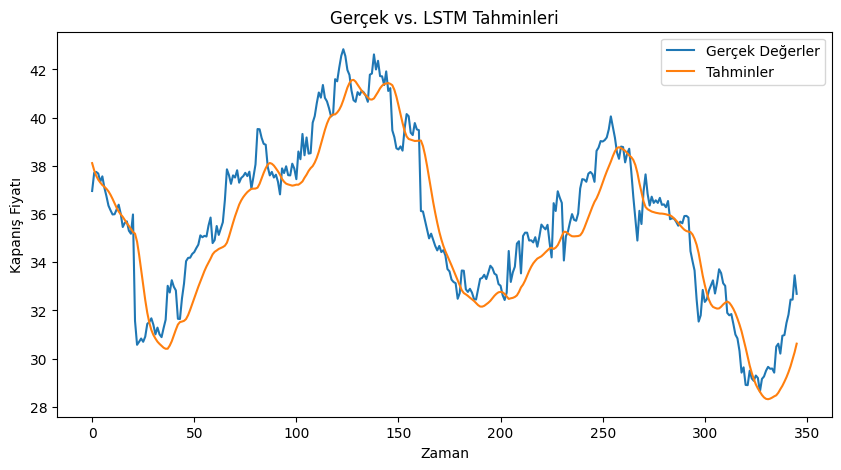

In [ ]:
y_pred = model.predict(X_test)

# Orijinal ölçeğe çevirelim
y_test_actual = mm_scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_actual = mm_scaler.inverse_transform(y_pred)

# Sonuçları görselleştirelim
plt.figure(figsize=(10,5))
plt.plot(y_test_actual, label="Gerçek Değerler")
plt.plot(y_pred_actual, label="Tahminler")
plt.title("Gerçek vs. LSTM Tahminleri")
plt.xlabel("Zaman")
plt.ylabel("Kapanış Fiyatı")
plt.legend()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# LSTM Modeli için Değerlendirme Fonksiyonu
def evaluate_lstm_model(y_test_actual, y_pred_actual):
    # Mean Squared Error (MSE)
    mse = mean_squared_error(y_test_actual, y_pred_actual)

    # Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)

    # Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test_actual, y_pred_actual)

    # Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((y_test_actual - y_pred_actual) / y_test_actual)) * 100

    # R² Score
    r2 = r2_score(y_test_actual, y_pred_actual)

    # Accuracy Calculation (Based on 2% tolerance)
    tolerance = 0.02  # 2% error margin
    correct_predictions = np.abs((y_pred_actual - y_test_actual) / y_test_actual) < tolerance
    accuracy = np.mean(correct_predictions) * 100

    # Sonuçları yazdır
    print(f"📉 MSE (Mean Squared Error): {mse:.4f}")
    print(f"📉 RMSE (Root Mean Squared Error): {rmse:.4f}")
    print(f"📉 MAE (Mean Absolute Error): {mae:.4f}")
    print(f"📉 MAPE (Mean Absolute Percentage Error): {mape:.2f}%")
    print(f"📈 R² Score: {r2:.4f}")
    print(f"📊 Model Accuracy (Doğruluk - %2 hata toleransı): %{accuracy:.2f}")

    return {"MSE": mse, "RMSE": rmse, "MAE": mae, "MAPE": mape, "R2": r2, "Accuracy": accuracy}

# Kullanım Örneği (LSTM modeli sonrası)
# evaluate_lstm_model(y_test_actual, y_pred_actual)


In [ ]:
# Gerçek ve tahmin edilen değerler (Ölçeğe geri döndürülmüş haliyle)
y_test_actual = mm_scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_actual = mm_scaler.inverse_transform(y_pred)

# Modelin başarısını değerlendir
metrics = evaluate_lstm_model(y_test_actual, y_pred_actual)


📉 MSE (Mean Squared Error): 1.7375
📉 RMSE (Root Mean Squared Error): 1.3181
📉 MAE (Mean Absolute Error): 1.0502
📉 MAPE (Mean Absolute Percentage Error): 2.98%
📈 R² Score: 0.8410
📊 Model Accuracy (Doğruluk - %2 hata toleransı): %43.06


In [ ]:
model_results[model_results["Ticker"] == "BAX"]

,Ticker,Model,Train_Accuracy,Test_Accuracy,MSE,MAE,R2,MAPE
696,BAX,DecisionTree,1.000000,-1.647050,28.658415,4.529550,-1.647050,0.134985
697,BAX,RandomForest,0.990447,-1.925662,31.674829,4.791019,-1.925662,0.142724
698,BAX,GradientBoosting,0.958282,-2.117460,33.751341,4.936230,-2.117460,0.147019
699,BAX,AdaBoost,0.931552,-2.750065,40.600263,5.532817,-2.750065,0.164313
700,BAX,KNN,0.952083,-1.811265,30.436301,4.685940,-1.811265,0.139563
701,BAX,LinearRegression,0.926753,-0.777782,19.247251,3.890727,-0.777782,0.106013
702,BAX,LassoRegression,0.923171,-0.223909,13.250715,3.086428,-0.223909,0.083460
703,BAX,RidgeRegression,0.926753,-0.775984,19.227784,3.888384,-0.775984,0.105947
704,BAX,LinearSVR,0.925668,-0.096832,11.874905,2.913663,-0.096832,0.078812
705,BAX,RbfSVR,0.928424,-16.642603,191.008529,12.565093,-16.642603,0.367993


+ BAX kodlu şirket için ML sonuçları ile Univariate LSTM sonuçlarını karşılaştırdığımızda gerçekten belirgin fark olduğu belli. Bir de Multivarite LSTM sonuçlarını görelim

## 'VRSN' Kodlu Şirket için **Univarite LSTM** (ML Modelleri İyi Sonuç Veren)

In [ ]:
df_vrsn = dataframes_inf["VRSN"].copy()

In [ ]:
#Tarih sütununun index olarak ayarlanması
df_vrsn.set_index("Date", inplace = True)

In [ ]:
#Tek değişkenli LSTM için yalnızca 'Close' sütunu ile çalışacağız
vrsn_close = df_vrsn["Close"]

In [ ]:
vrsn_close_scaled = mm_scaler.fit_transform(vrsn_close.values.reshape(-1,1))

In [ ]:
def create_sequences(data, time_steps=30):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])  # Son 30 günün verisi
        y.append(data[i+time_steps])  # 31. günün verisi
    return np.array(X), np.array(y)

# 30 günlük pencere boyutu ile veri setini oluştur
time_steps = 30
X, y = create_sequences(vrsn_close_scaled, time_steps)

# Veriyi eğitim ve test olarak ayıralım (80% eğitim, 20% test)
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(time_steps, 1)),  # İlk LSTM katmanı
    Dropout(0.2),  # Overfitting'i önlemek için dropout ekledik
    LSTM(50, return_sequences=False),  # Son LSTM katmanı
    Dropout(0.2),
    Dense(25),  # 25 nöronlu tam bağlantılı katman
    Dense(1)  # Tek çıkış (1 gün sonrası tahmin)
])

model.compile(optimizer="adam", loss="mean_squared_error")
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 30, 50)              │          10,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 30, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 25)                  │           1,275 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │              26 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,901 (124.61 KB)

 Trainable params: 31,901 (124.61 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.0978 - val_loss: 0.0016
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0072 - val_loss: 0.0018
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0054 - val_loss: 0.0015
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 0.0049 - val_loss: 0.0013
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0047 - val_loss: 0.0012
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0045 - val_loss: 0.0011
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0040 - val_loss: 0.0012
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0042 - val_loss: 9.0019e-04
Epoch 9/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0037 - val_loss: 0.0013
Epoch 10/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0034 - val_loss: 0.0013
Epoch 11/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 12/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss:

In [ ]:
train_loss = model.evaluate(X_train, y_train)
test_loss = model.evaluate(X_test, y_test)

print(f"📉 Eğitim Hatası (MSE): {train_loss}")
print(f"📉 Test Hatası (MSE): {test_loss}")

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 6.8075e-04
📉 Eğitim Hatası (MSE): 0.0013210149481892586
📉 Test Hatası (MSE): 0.0006995782605372369


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step


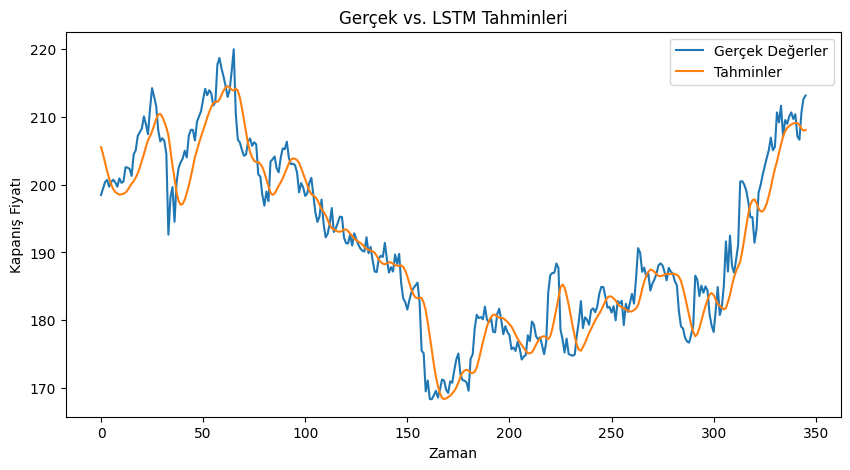

In [ ]:
y_pred = model.predict(X_test)

# Orijinal ölçeğe çevirelim
y_test_actual = mm_scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_actual = mm_scaler.inverse_transform(y_pred)

# Sonuçları görselleştirelim
plt.figure(figsize=(10,5))
plt.plot(y_test_actual, label="Gerçek Değerler")
plt.plot(y_pred_actual, label="Tahminler")
plt.title("Gerçek vs. LSTM Tahminleri")
plt.xlabel("Zaman")
plt.ylabel("Kapanış Fiyatı")
plt.legend()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# LSTM Modeli için Değerlendirme Fonksiyonu
def evaluate_lstm_model(y_test_actual, y_pred_actual):
    # Mean Squared Error (MSE)
    mse = mean_squared_error(y_test_actual, y_pred_actual)

    # Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mse)

    # Mean Absolute Error (MAE)
    mae = mean_absolute_error(y_test_actual, y_pred_actual)

    # Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((y_test_actual - y_pred_actual) / y_test_actual)) * 100

    # R² Score
    r2 = r2_score(y_test_actual, y_pred_actual)

    # Accuracy Calculation (Based on 2% tolerance)
    tolerance = 0.02  # 2% error margin
    correct_predictions = np.abs((y_pred_actual - y_test_actual) / y_test_actual) < tolerance
    accuracy = np.mean(correct_predictions) * 100

    # Sonuçları yazdır
    print(f"📉 MSE (Mean Squared Error): {mse:.4f}")
    print(f"📉 RMSE (Root Mean Squared Error): {rmse:.4f}")
    print(f"📉 MAE (Mean Absolute Error): {mae:.4f}")
    print(f"📉 MAPE (Mean Absolute Percentage Error): {mape:.2f}%")
    print(f"📈 R² Score: {r2:.4f}")
    print(f"📊 Model Accuracy (Doğruluk - %2 hata toleransı): %{accuracy:.2f}")

    return {"MSE": mse, "RMSE": rmse, "MAE": mae, "MAPE": mape, "R2": r2, "Accuracy": accuracy}

# Kullanım Örneği (LSTM modeli sonrası)
# evaluate_lstm_model(y_test_actual, y_pred_actual)


In [ ]:
# Gerçek ve tahmin edilen değerler (Ölçeğe geri döndürülmüş haliyle)
y_test_actual = mm_scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_actual = mm_scaler.inverse_transform(y_pred)

# Modelin başarısını değerlendir
metrics = evaluate_lstm_model(y_test_actual, y_pred_actual)


📉 MSE (Mean Squared Error): 15.8056
📉 RMSE (Root Mean Squared Error): 3.9756
📉 MAE (Mean Absolute Error): 3.1239
📉 MAPE (Mean Absolute Percentage Error): 1.63%
📈 R² Score: 0.9036
📊 Model Accuracy (Doğruluk - %2 hata toleransı): %70.52


In [ ]:
model_results[model_results["Ticker"] == "VRSN"]

,Ticker,Model,Train_Accuracy,Test_Accuracy,MSE,MAE,R2,MAPE
4392,VRSN,DecisionTree,1.000000,0.646498,58.140093,6.147444,0.646498,0.031972
4393,VRSN,RandomForest,0.996754,0.830397,27.894493,4.430095,0.830397,0.023285
4394,VRSN,GradientBoosting,0.984395,0.867348,21.817132,3.784464,0.867348,0.020009
4395,VRSN,AdaBoost,0.960895,0.900419,16.378045,3.169951,0.900419,0.016518
4396,VRSN,KNN,0.977249,0.871328,21.162566,3.720137,0.871328,0.019464
4397,VRSN,LinearRegression,0.971683,0.935605,10.590961,2.603797,0.935605,0.013527
4398,VRSN,LassoRegression,0.967392,0.926989,12.008088,2.726278,0.926989,0.014154
4399,VRSN,RidgeRegression,0.971683,0.935679,10.578876,2.601432,0.935679,0.013514
4400,VRSN,LinearSVR,0.971519,0.940536,9.779930,2.474034,0.940536,0.012836
4401,VRSN,RbfSVR,0.936155,0.923752,12.540463,2.507507,0.923752,0.013024


+ Burada da şöyle bir durum var bak, ML'de iyi sonuç veren VRSN kodlu şirket, LSTM'de, ML'e nazaran daha kötü sonuç verdi. Yani VRSN için kullanılabilecek ML modeli, LSTM sonucuna göre (univariate) daha iyi. Dolayısıyla şöyle bir sonuca vardım: ML'de iyi sonuç veren şirketlerde ML modeli kullanacağım, kötü sonuç verenlerde ise GridSearch ile en iyi parametreleri her şirket için bulduktan sonra o şirketlerde LSTM kullanacağım. Yine de tabi Multivariate sonuçlarını da iyi sonuç veren VRSN için deneyeceğim. Normalde bu incelemeyi her şirket özelinde yapmam gerekiyor. İlerleyen aşamalarda onu da yapabilirim

## BAX Kodlu Şirket için **Multivariate LSTM** (ML Modeli Kötü Sonuç Veren)

In [ ]:
#Tarih sütunu index halinde
df_bax.head(3)

,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
Date,,,,,,,,,,,,,
2018-01-30,63.559669,0.307565,4.965336,61.619656,59.513021,59.180529,62.089211,62.168795,63.559669,63.559669,63.559669,63.559669,63.559669
2018-01-31,63.807686,-0.097087,59.429541,61.619656,59.513021,59.180529,62.089211,62.168795,63.642342,63.582216,63.567420,63.563575,63.561630
2018-02-01,61.965153,0.531755,38.209086,61.619656,59.513021,59.180529,62.089211,62.168795,63.083279,63.435211,63.517349,63.538403,63.549010


In [ ]:
X = df_bax.drop(columns = "Close", axis=1)
y = df_bax["Close"]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle = False)

In [ ]:
X_train_scaled = mm_scaler.fit_transform(X_train)
X_test_scaled = mm_scaler.transform(X_test)

In [ ]:
df_train_scaled = pd.DataFrame(X_train_scaled, columns=list(df_bax.drop(columns = "Close", axis=1)), index=X_train.index)
df_test_scaled = pd.DataFrame(X_test_scaled, columns=list(df_bax.drop(columns = "Close", axis=1)), index=X_test.index)

In [ ]:
df_train_scaled.head(2)


,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
Date,,,,,,,,,,,,
2018-01-30,0.443718,0.111819,0.529305,0.490449,0.494281,0.563528,0.531885,0.57224,0.578238,0.589858,0.588093,0.568701
2018-01-31,0.422687,0.190795,0.529305,0.490449,0.494281,0.563528,0.531885,0.57398,0.578737,0.590054,0.588202,0.568765


In [ ]:
df_test_scaled.tail(2)

,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
Date,,,,,,,,,,,,
2025-01-27,0.540411,0.148078,-0.086754,-0.148887,-0.183022,-0.162937,-0.264984,-0.083185,-0.140581,-0.209196,-0.252778,-0.361802
2025-01-28,0.341733,0.106669,-0.081664,-0.145118,-0.184550,-0.163433,-0.265611,-0.081271,-0.137301,-0.208667,-0.253127,-0.362494


In [ ]:
#Close sütunu (Bağımsız değ.) için farklı scaler
close_scaler = MinMaxScaler(feature_range = (0,1))
y_train_scaled = close_scaler.fit_transform(y_train)
y_test_scaled = close_scaler.transform(y_test)

ValueError: Expected a 2-dimensional container but got <class 'pandas.core.series.Series'> instead. Pass a DataFrame containing a single row (i.e. single sample) or a single column (i.e. single feature) instead.

In [ ]:
# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayır
features = ["Close", "Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63",
            "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"]

# Eğitim ve test setlerini ayır (%80 eğitim, %20 test)
split = int(len(df_bax) * 0.8)
df_train = df_bax.iloc[:split]
df_test = df_bax.iloc[split:]

# 1️⃣ Bağımsız değişkenler için scaler
feature_scaler = MinMaxScaler(feature_range=(0,1))
df_train_scaled = feature_scaler.fit_transform(df_train[features])  # Sadece eğitim setine fit et
df_test_scaled = feature_scaler.transform(df_test[features])  # Test setini dönüştür

# 2️⃣ "Close" (bağımlı değişken) için ayrı scaler
close_scaler = MinMaxScaler(feature_range=(0,1))
df_train_close = close_scaler.fit_transform(df_train[["Close"]])  # Sadece Close için fit et
df_test_close = close_scaler.transform(df_test[["Close"]])  # Test setini dönüştür

# Ölçeklenmiş verileri pandas DataFrame olarak geri döndür
df_train_scaled = pd.DataFrame(df_train_scaled, columns=features, index=df_train.index)
df_test_scaled = pd.DataFrame(df_test_scaled, columns=features, index=df_test.index)

In [ ]:
df_train_scaled.head(2)

,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
Date,,,,,,,,,,,,,
2018-01-30,0.560559,0.443718,0.111819,0.529305,0.490449,0.494281,0.563528,0.531885,0.57224,0.578238,0.589858,0.588093,0.568701
2018-01-31,0.565555,0.422687,0.190795,0.529305,0.490449,0.494281,0.563528,0.531885,0.57398,0.578737,0.590054,0.588202,0.568765


In [ ]:
df_test_scaled.tail(2)

,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
Date,,,,,,,,,,,,,
2025-01-27,-0.045678,0.540411,0.148078,-0.086754,-0.148887,-0.183022,-0.162937,-0.264984,-0.083185,-0.140581,-0.209196,-0.252778,-0.361802
2025-01-28,-0.061186,0.341733,0.106669,-0.081664,-0.145118,-0.184550,-0.163433,-0.265611,-0.081271,-0.137301,-0.208667,-0.253127,-0.362494


In [ ]:
def create_multivariate_sequences(X_data, y_data, time_steps=30):
    X, y = [], []
    for i in range(len(X_data) - time_steps):
        X.append(X_data[i:i+time_steps])  # Son 30 günün verisi
        y.append(y_data[i+time_steps])  # 31. günün 'Close' fiyatı
    return np.array(X), np.array(y)

# Eğitim seti için pencereleme yap
X_train, y_train = create_multivariate_sequences(df_train_scaled.values, df_train_close, time_steps=30)

# Test seti için pencereleme yap
X_test, y_test = create_multivariate_sequences(df_test_scaled.values, df_test_close, time_steps=30)

# Modelin giriş boyutunu belirleyelim
input_shape = (X_train.shape[1], X_train.shape[2])


In [ ]:
# Modeli oluştur
model = Sequential([
    LSTM(100, return_sequences=True, input_shape=input_shape),
    Dropout(0.2),
    LSTM(100, return_sequences=False),
    Dropout(0.2),
    Dense(50, activation="relu"),
    Dense(1)  # Tek bir kapanış fiyatı tahmin edeceğiz
])

# Modeli derleme
model.compile(optimizer="adam", loss="mean_squared_error")

# Modeli eğit
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.0674 - val_loss: 0.0040
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.0074 - val_loss: 0.0050
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.0062 - val_loss: 0.0074
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.0056 - val_loss: 0.0049
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.0066 - val_loss: 0.0046
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.0056 - val_loss: 0.0047
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0044 - val_loss: 0.0063
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0039 - val_loss: 0.0043
Epoch 9/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0091 - val_loss: 0.0056
Epoch 10/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0041 - val_loss: 0.0059
Epoch 11/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.0040 - val_loss: 0.0059
Epoch 12/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


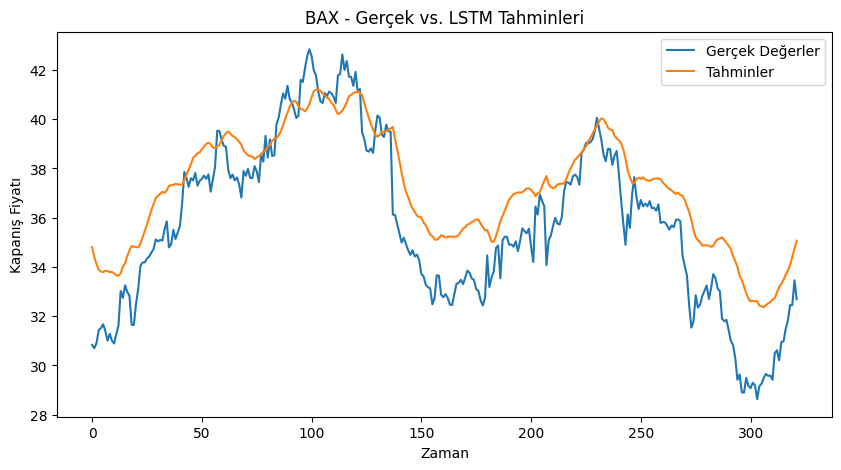

In [ ]:
# Model ile tahmin yap
y_pred = model.predict(X_test)

# Tahminleri orijinal ölçeğe geri döndür
y_test_actual = close_scaler.inverse_transform(y_test.reshape(-1,1))
y_pred_actual = close_scaler.inverse_transform(y_pred)

# Tahminleri görselleştir
plt.figure(figsize=(10,5))
plt.plot(y_test_actual, label="Gerçek Değerler")
plt.plot(y_pred_actual, label="Tahminler")
plt.title("BAX - Gerçek vs. LSTM Tahminleri")
plt.xlabel("Zaman")
plt.ylabel("Kapanış Fiyatı")
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(y_test_actual, y_pred_actual)

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_actual, y_pred_actual)

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_test_actual - y_pred_actual) / y_test_actual)) * 100

# R^2 (Determinasyon Katsayısı)
r2 = r2_score(y_test_actual, y_pred_actual)

# Test Setindeki Tahmin Doğruluk Oranı (%)
test_accuracy = 100 - mape  # (Doğruluk = 1 - MAPE)

# Eğitim seti tahminleri
y_train_pred = model.predict(X_train)

# Orijinal ölçeğe geri döndür (Train seti için)
y_train_actual = close_scaler.inverse_transform(y_train.reshape(-1,1))
y_train_pred_actual = close_scaler.inverse_transform(y_train_pred)

# Train Seti için Metrikler
train_mse = mean_squared_error(y_train_actual, y_train_pred_actual)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train_actual, y_train_pred_actual)
train_mape = np.mean(np.abs((y_train_actual - y_train_pred_actual) / y_train_actual)) * 100
train_r2 = r2_score(y_train_actual, y_train_pred_actual)
train_accuracy = 100 - train_mape  # 1 - MAPE

# Test Seti için Daha Önce Hesaplanan Metrikler
test_mse = mse
test_rmse = rmse
test_mae = mae
test_mape = mape
test_r2 = r2
test_accuracy = 100 - test_mape


# Sonuçları Yazdırma
print(f"📉 Model Performans Metrikleri:")

# Train Seti Sonuçları
print(f"🔹 **Train Seti**:")
print(f"✅ MSE  : {train_mse:.4f}")
print(f"✅ RMSE : {train_rmse:.4f}")
print(f"✅ MAE  : {train_mae:.4f}")
print(f"✅ MAPE : {train_mape:.2f}%")
print(f"✅ R² (R-Kare) : {train_r2:.4f}")
print(f"✅ Doğruluk Oranı : {train_accuracy:.2f}%")

print("\n")

# Test Seti Sonuçları
print(f"🔹 **Test Seti**:")
print(f"✅ MSE  : {test_mse:.4f}")
print(f"✅ RMSE : {test_rmse:.4f}")
print(f"✅ MAE  : {test_mae:.4f}")
print(f"✅ MAPE : {test_mape:.2f}%")
print(f"✅ R² (R-Kare) : {test_r2:.4f}")
print(f"✅ Doğruluk Oranı : {test_accuracy:.2f}%")


44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step
📉 Model Performans Metrikleri:
🔹 **Train Seti**:
✅ MSE  : 2.8054
✅ RMSE : 1.6749
✅ MAE  : 1.2502
✅ MAPE : 1.93%
✅ R² (R-Kare) : 0.9814
✅ Doğruluk Oranı : 98.07%


🔹 **Test Seti**:
✅ MSE  : 3.7527
✅ RMSE : 1.9372
✅ MAE  : 1.6428
✅ MAPE : 4.86%
✅ R² (R-Kare) : 0.6724
✅ Doğruluk Oranı : 95.14%


In [ ]:
model_results[model_results["Ticker"] == "BAX"]

,Ticker,Model,Train_Accuracy,Test_Accuracy,MSE,MAE,R2,MAPE
696,BAX,DecisionTree,1.000000,-1.647050,28.658415,4.529550,-1.647050,0.134985
697,BAX,RandomForest,0.990447,-1.925662,31.674829,4.791019,-1.925662,0.142724
698,BAX,GradientBoosting,0.958282,-2.117460,33.751341,4.936230,-2.117460,0.147019
699,BAX,AdaBoost,0.931552,-2.750065,40.600263,5.532817,-2.750065,0.164313
700,BAX,KNN,0.952083,-1.811265,30.436301,4.685940,-1.811265,0.139563
701,BAX,LinearRegression,0.926753,-0.777782,19.247251,3.890727,-0.777782,0.106013
702,BAX,LassoRegression,0.923171,-0.223909,13.250715,3.086428,-0.223909,0.083460
703,BAX,RidgeRegression,0.926753,-0.775984,19.227784,3.888384,-0.775984,0.105947
704,BAX,LinearSVR,0.925668,-0.096832,11.874905,2.913663,-0.096832,0.078812
705,BAX,RbfSVR,0.928424,-16.642603,191.008529,12.565093,-16.642603,0.367993


+ Multivariate LSTM, ML modellerine ve Univariate LSTM'e göre açık ara çok daha iyi sonuç verdi. Şimdi BAX şirketi için GridSearch ile en iyi parametreleri bulacağım ve sonucu daha da iyileştirmeye çalışacağım. Sonrasında ise bunu yöntemi genelleyeceğim!!!

### 'BAX' Kodlu Şirket için **GridSearch** ile **Multivariate LSTM** için En İyi Hiperparametre Seçimi

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import itertools


In [ ]:
# GridSearch için hiperparametre aralıkları
param_grid = {
    "units": [50, 100, 150],
    "dropout": [0.2, 0.3, 0.4],
    "epochs": [10, 20, 30],
    "batch_size": [16, 32, 64],
    "learning_rate": [0.001, 0.0005, 0.0001]
}

# Tüm kombinasyonları oluştur
all_combinations = list(itertools.product(param_grid["units"], param_grid["dropout"],
                                          param_grid["epochs"], param_grid["batch_size"],
                                          param_grid["learning_rate"]))


In [ ]:
# En iyi parametreleri saklayacağımız değişkenler
best_params = None
best_loss = float("inf")

# GridSearch çalıştır
for combo in all_combinations:
    params = {
        "units": combo[0],
        "dropout": combo[1],
        "epochs": combo[2],
        "batch_size": combo[3],
        "learning_rate": combo[4]
    }

    print(f"🔎 Denenen Parametreler: {params}")

    # Modeli oluştur
    model = Sequential([
        LSTM(params["units"], return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
        Dropout(params["dropout"]),
        LSTM(params["units"], return_sequences=False),
        Dropout(params["dropout"]),
        Dense(50, activation="relu"),
        Dense(1)
    ])

    optimizer = Adam(learning_rate=params["learning_rate"])
    model.compile(optimizer=optimizer, loss="mean_squared_error")

    history = model.fit(X_train, y_train, epochs=params["epochs"], batch_size=params["batch_size"], verbose=0)

    loss = min(history.history["loss"])
    print(f"📉 MSE Loss: {loss:.4f}")

    if loss < best_loss:
        best_loss = loss
        best_params = params

print("✅ En iyi hiperparametreler:", best_params)


🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 16, 'learning_rate': 0.001}


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


📉 MSE Loss: 0.0028
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 16, 'learning_rate': 0.0005}
📉 MSE Loss: 0.0036
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 16, 'learning_rate': 0.0001}
📉 MSE Loss: 0.0077
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 32, 'learning_rate': 0.001}
📉 MSE Loss: 0.0039
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 32, 'learning_rate': 0.0005}
📉 MSE Loss: 0.0053
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 32, 'learning_rate': 0.0001}
📉 MSE Loss: 0.0083
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 64, 'learning_rate': 0.001}
📉 MSE Loss: 0.0051
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batch_size': 64, 'learning_rate': 0.0005}
📉 MSE Loss: 0.0061
🔎 Denenen Parametreler: {'units': 50, 'dropout': 0.2, 'epochs': 10, 'batc

In [ ]:
# En iyi parametreleri kullanarak modeli tekrar eğit
print(f"🚀 En iyi parametrelerle LSTM eğitiliyor: {best_params}")

# Modeli oluştur
best_model = Sequential([
    LSTM(best_params["units"], return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(best_params["dropout"]),
    LSTM(best_params["units"], return_sequences=False),
    Dropout(best_params["dropout"]),
    Dense(50, activation="relu"),
    Dense(1)
])

optimizer = Adam(learning_rate=best_params["learning_rate"])
best_model.compile(optimizer=optimizer, loss="mean_squared_error")

# Modeli eğit
history = best_model.fit(X_train, y_train, epochs=best_params["epochs"], batch_size=best_params["batch_size"], validation_data=(X_test, y_test))

# Modelin eğitim sonrası tahminleri
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Orijinal ölçeğe döndür
y_train_actual = close_scaler.inverse_transform(y_train.reshape(-1,1))
y_train_pred_actual = close_scaler.inverse_transform(y_train_pred)
y_test_actual = close_scaler.inverse_transform(y_test.reshape(-1,1))
y_test_pred_actual = close_scaler.inverse_transform(y_test_pred)

# Metrikleri hesapla
train_mse = mean_squared_error(y_train_actual, y_train_pred_actual)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train_actual, y_train_pred_actual)
train_mape = np.mean(np.abs((y_train_actual - y_train_pred_actual) / y_train_actual)) * 100
train_r2 = r2_score(y_train_actual, y_train_pred_actual)
train_accuracy = 100 - train_mape

test_mse = mean_squared_error(y_test_actual, y_test_pred_actual)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test_actual, y_test_pred_actual)
test_mape = np.mean(np.abs((y_test_actual - y_test_pred_actual) / y_test_actual)) * 100
test_r2 = r2_score(y_test_actual, y_test_pred_actual)
test_accuracy = 100 - test_mape

# Sonuçları yazdır
print(f"📉 **En İyi LSTM Modeli Performans Metrikleri:**")

# Train Seti Sonuçları
print(f"🔹 **Train Seti**:")
print(f"✅ MSE  : {train_mse:.4f}")
print(f"✅ RMSE : {train_rmse:.4f}")
print(f"✅ MAE  : {train_mae:.4f}")
print(f"✅ MAPE : {train_mape:.2f}%")
print(f"✅ R² (R-Kare) : {train_r2:.4f}")
print(f"✅ Doğruluk Oranı : {train_accuracy:.2f}%")

print("\n")

# Test Seti Sonuçları
print(f"🔹 **Test Seti**:")
print(f"✅ MSE  : {test_mse:.4f}")
print(f"✅ RMSE : {test_rmse:.4f}")
print(f"✅ MAE  : {test_mae:.4f}")
print(f"✅ MAPE : {test_mape:.2f}%")
print(f"✅ R² (R-Kare) : {test_r2:.4f}")
print(f"✅ Doğruluk Oranı : {test_accuracy:.2f}%")


🚀 En iyi parametrelerle LSTM eğitiliyor: {'units': 150, 'dropout': 0.2, 'epochs': 30, 'batch_size': 16, 'learning_rate': 0.001}
Epoch 1/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0415 - val_loss: 0.0021
Epoch 2/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0054 - val_loss: 0.0034
Epoch 3/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 21s 135ms/step - loss: 0.0044 - val_loss: 0.0054
Epoch 4/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.0042 - val_loss: 0.0022
Epoch 5/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 0.0037 - val_loss: 0.0021
Epoch 6/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0032 - val_loss: 0.0037
Epoch 7/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.0032 - val_loss: 0.0050
Epoch 8/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.0029 - val_loss: 0.0047
Epoch 9/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - loss: 0.0035 - val_loss: 0.0059
Epoch 10/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 0.0029 - val_loss: 0.0046
E

+ GridSearch ile en iyi parametreleri bulunan model, direkt olarak kurulan LSTM modeline göre çok daha kötü sonuç verdi. Bunun birkaç sebebi olabilir: Overfitting (ki model sonuçları incelendiğinde görülebiliyor)'ten kaynaklı olarak modelin karmaşıklaşması veya doğru değerlendirme metriğine göre en iyi parametreleri seçmemiş olabilirim. GridSearch çok uzun sürdüğü için daha f/p bir search yöntemi ile parametre seçimi yapacağım. Sonucu merak ettiğimden sadece BAX şirketinin en iyi LSTM parametrelerini bulmak için GridSearch eğitimine yaklaşık 2.5-3 saat harcadım ve gereksiz vakit kaybettim.

### 'BAX' Kodlu Şirket için **HyperBand** ile **Multivarite LSTM** için En İyi Hiperparametrelerin Seçimi

In [ ]:
df_bax = dataframes_inf["BAX"].copy()

In [ ]:
df_bax.head(2)

,Date,Close,Percentage_Change,Volume_Percentage_Change,MA_5,MA_21,MA_63,MA_126,MA_252,EWMA_5,EWMA_21,EWMA_63,EWMA_126,EWMA_252
0,2018-01-30,63.559669,0.307565,4.965336,61.619656,59.513021,59.180529,62.089211,62.168795,63.559669,63.559669,63.559669,63.559669,63.559669
1,2018-01-31,63.807686,-0.097087,59.429541,61.619656,59.513021,59.180529,62.089211,62.168795,63.642342,63.582216,63.567420,63.563575,63.561630


In [ ]:
import pickle
with open('dataframes_inf.pkl', 'rb') as f:
    dataframes_inf = pickle.load(f)

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import keras_tuner as kt  # Hyperband için


In [ ]:
def get_lookback_window(forecast_period):
  lookback_mapping = {"1_week": 5,
                      "1_month": 21,
                      "3_months": 63,
                      "6_months": 126,
                      "1_year": 252}


  return lookback_mapping[forecast_period]

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def prepare_lstm_data(df, forecast_period):
    """
    Veriyi LSTM için hazırlar:
    - Eğer "Date" zaten indeks ise, yeniden set_index() yapmaz.
    - Lookback Window belirler.
    - Bağımsız değişkenleri ölçeklendirir.
    - Bağımlı değişken (Close) için ayrı scaler kullanır.
    - Zaman serisi pencereleme yapar.

    Parametreler:
    - df (pandas.DataFrame): Şirketin fiyat verisi
    - forecast_period (str): "1_week", "1_month", "3_months", "6_months", "1_year"

    Dönüş:
    - X_train, y_train, X_test, y_test, feature_scaler, close_scaler
    """

    # 📌 **Tarih Zaten İndeks Mi? Kontrol Et**
    if df.index.name != "Date":
        if "Date" in df.columns:
            df = df.copy()  # Orijinal veri çerçevesini değiştirmemek için kopyala
            df["Date"] = pd.to_datetime(df["Date"])  # Tarihi DateTime formatına çevir
            df.set_index("Date", inplace=True)       # Date sütununu indeks yap
        else:
            raise KeyError("HATA: Veri çerçevesinde 'Date' sütunu bulunamadı!")

    # 📌 **"Close" bağımsız değişkenlerden çıkarıldı**
    features = ["Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63",
                "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"]

    lookback = get_lookback_window(forecast_period)

    # Eğitim ve test setlerini ayır (%80 train, %20 test)
    split = int(len(df) * 0.8)
    df_train, df_test = df.iloc[:split], df.iloc[split:]

    # 📌 **Bağımsız değişkenleri ölçeklendir**
    feature_scaler = MinMaxScaler(feature_range=(0,1))
    df_train_scaled = feature_scaler.fit_transform(df_train[features])
    df_test_scaled = feature_scaler.transform(df_test[features])

    # 📌 **Bağımlı değişken (Close) için ayrı ölçeklendirici kullan**
    close_scaler = MinMaxScaler(feature_range=(0,1))
    df_train_close = close_scaler.fit_transform(df_train[["Close"]])
    df_test_close = close_scaler.transform(df_test[["Close"]])

    # 📌 **Zaman serisi pencereleme işlemi**
    def create_sequences(X_data, y_data, time_steps=lookback):
        X, y = [], []
        for i in range(len(X_data) - time_steps):
            X.append(X_data[i:i+time_steps])
            y.append(y_data[i+time_steps])
        return np.array(X), np.array(y)

    X_train, y_train = create_sequences(df_train_scaled, df_train_close)
    X_test, y_test = create_sequences(df_test_scaled, df_test_close)

    return X_train, y_train, X_test, y_test, feature_scaler, close_scaler


In [ ]:
X_train, y_train, X_test, y_test, feature_scaler, close_scaler = prepare_lstm_data(df_bax, "1_year")
print(X_train.shape, y_train.shape)  # Beklenen: (örnek_sayısı, lookback, feature_sayısı)

(1155, 252, 12) (1155, 1)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def build_lstm_model(hp, input_shape):
    """
    LSTM modelini oluşturur.

    Parametreler:
    - hp: KerasTuner'dan gelen hiperparametreler
    - input_shape: Modelin giriş boyutu (Lookback Window, Özellik Sayısı)

    Dönüş:
    - LSTM modeli
    """
    model = Sequential()

    model.add(LSTM(
        units=hp.Int("units", min_value=50, max_value=150, step=50),
        return_sequences=True,
        input_shape=input_shape))

    model.add(Dropout(hp.Float("dropout", 0.2, 0.4, step=0.1)))

    model.add(LSTM(units=hp.Choice("units_2", [50, 100]), return_sequences=False))
    model.add(Dropout(hp.Float("dropout_2", 0.2, 0.4, step=0.1)))

    model.add(Dense(50, activation="relu"))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=hp.Choice("learning_rate", [0.001, 0.0005, 0.0001]))
    model.compile(optimizer=optimizer, loss="mean_squared_error")

    return model

In [ ]:
from keras_tuner import HyperParameters

hp = HyperParameters()
input_shape = (30, 13)  # Lookback 30 gün, 13 özellik
model = build_lstm_model(hp, input_shape)
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 30, 50)              │          12,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 30, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 50)                  │           2,550 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 35,601 (139.07 KB)

 Trainable params: 35,601 (139.07 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import keras_tuner as kt

def optimize_lstm_with_hyperband(X_train, y_train, X_test, y_test):
    """
    Hyperband kullanarak en iyi LSTM parametrelerini bulur.
    """
    tuner = kt.Hyperband(
        lambda hp: build_lstm_model(hp, input_shape=(X_train.shape[1], X_train.shape[2])),
        objective="val_loss",
        max_epochs=10,
        factor=3
    )

    tuner.search(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

    return tuner.get_best_hyperparameters(num_trials=1)[0]


In [ ]:
best_hps = optimize_lstm_with_hyperband(X_train, y_train, X_test, y_test)
print(best_hps.values)

Trial 30 Complete [00h 01m 55s]
val_loss: 0.005361920688301325

Best val_loss So Far: 0.00198098155669868
Total elapsed time: 00h 40m 35s
{'units': 50, 'dropout': 0.4, 'units_2': 100, 'dropout_2': 0.4, 'learning_rate': 0.001, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}


+ :(

# `evalute_lstm_models` fonksiyonu ile ml modeli eğitimindeki mantıkla ilerleme

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np
import random
import time

def evaluate_lstm_models_updated(stock_names=list()):
    # Beklenen sütunlar
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    # Lookback Window
    forecast_periods = ["1_week", "1_month", "3_months", "6_months", "1_year"]
    lookback_mapping = {
        "1_week": 5,
        "1_month": 21,
        "3_months": 63,
        "6_months": 126,
        "1_year": 252
    }

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için LSTM Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                continue

            for forecast_period in forecast_periods:
                print(f"\n  🔹 '{forecast_period}' modeli eğitiliyor...")

                try:
                    # Lookback Window
                    lookback = lookback_mapping[forecast_period]

                    # X ve y ayrımı
                    features = [
                        "Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63",
                        "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
                    ]
                    X = df[features]
                    y = df["Close"]

                    # Train/Test Split
                    train_size = int(len(X) * 0.8)
                    X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
                    y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

                    # MinMaxScaler Uygulama (Sızıntıyı Önlemek için Ayrı Ayrı)
                    feature_scaler = MinMaxScaler()
                    close_scaler = MinMaxScaler()

                    X_train_scaled = feature_scaler.fit_transform(X_train)
                    X_test_scaled = feature_scaler.transform(X_test)

                    y_train_scaled = close_scaler.fit_transform(y_train.values.reshape(-1, 1))
                    y_test_scaled = close_scaler.transform(y_test.values.reshape(-1, 1))

                    # Zaman serisi veri hazırlığı
                    def create_sequences(X_data, y_data, lookback=lookback):
                        X, y = [], []
                        for i in range(lookback, len(X_data)):
                            X.append(X_data[i - lookback:i])
                            y.append(y_data[i])
                        return np.array(X), np.array(y)

                    X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, lookback)
                    X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, lookback)

                    # Hızlı Hyperparameter Tuning
                    def quick_hyperparameter_tuning():
                        units = random.choice([50, 100])
                        dropout = random.choice([0.2, 0.3])
                        learning_rate = random.choice([0.001, 0.0005])
                        return {"units": units, "dropout": dropout, "learning_rate": learning_rate}

                    best_params = quick_hyperparameter_tuning()

                    # LSTM modeli oluşturma
                    def build_lstm_model(input_shape, units, dropout, learning_rate):
                        model = Sequential()
                        model.add(LSTM(units=units, return_sequences=True, input_shape=input_shape))
                        model.add(Dropout(dropout))
                        model.add(LSTM(units=units, return_sequences=False))
                        model.add(Dropout(dropout))
                        model.add(Dense(50, activation="relu"))
                        model.add(Dense(1))
                        model.compile(optimizer=Adam(learning_rate=learning_rate), loss="mean_squared_error")
                        return model

                    model = build_lstm_model(
                        input_shape=(X_train_seq.shape[1], X_train_seq.shape[2]),
                        units=best_params["units"],
                        dropout=best_params["dropout"],
                        learning_rate=best_params["learning_rate"]
                    )

                    # Model Eğitimi
                    start_time = time.time()
                    model.fit(X_train_seq, y_train_seq, epochs=10, batch_size=32, validation_data=(X_test_seq, y_test_seq), verbose=0)
                    end_time = time.time()

                    # Tahminler
                    y_train_pred = model.predict(X_train_seq)
                    y_test_pred = model.predict(X_test_seq)

                    # Ölçek Geri Dönüşümü
                    y_train_actual = close_scaler.inverse_transform(y_train_seq)
                    y_train_pred_actual = close_scaler.inverse_transform(y_train_pred)
                    y_test_actual = close_scaler.inverse_transform(y_test_seq)
                    y_test_pred_actual = close_scaler.inverse_transform(y_test_pred)

                    # Performans Metrikleri
                    train_mse = mean_squared_error(y_train_actual, y_train_pred_actual)
                    test_mse = mean_squared_error(y_test_actual, y_test_pred_actual)
                    train_rmse = np.sqrt(train_mse)
                    test_rmse = np.sqrt(test_mse)
                    train_mae = mean_absolute_error(y_train_actual, y_train_pred_actual)
                    test_mae = mean_absolute_error(y_test_actual, y_test_pred_actual)
                    train_r2 = r2_score(y_train_actual, y_train_pred_actual)
                    test_r2 = r2_score(y_test_actual, y_test_pred_actual)

                    # Sonuçları Yazdır
                    print(f"    ✅ Hiperparametreler: {best_params}")
                    print(f"    ✅ Eğitim Süresi: {end_time - start_time:.2f} saniye")
                    print(f"    Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")
                    print(f"    Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
                    print(f"    Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")
                    print(f"    Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}")

                except Exception as e:
                    print(f"  '{forecast_period}' modeli için bir hata oluştu: {e}")

        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")

In [ ]:
lst = ["BAX"]

In [ ]:
evaluate_lstm_models_updated(lst)


=== BAX için LSTM Model Performansı Sonuçları ===

  🔹 '1_week' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
    ✅ Hiperparametreler: {'units': 100, 'dropout': 0.2, 'learning_rate': 0.001}
    ✅ Eğitim Süresi: 19.28 saniye
    Train MSE: 4.6897, Test MSE: 6.2890
    Train RMSE: 2.1656, Test RMSE: 2.5078
    Train MAE: 1.6892, Test MAE: 2.0474
    Train R²: 0.9686, Test R²: 0.4234

  🔹 '1_month' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
    ✅ Hiperparametreler: {'units': 100, 'dropout': 0.2, 'learning_rate': 0.001}
    ✅ Eğitim Süresi: 27.92 saniye
    Train MSE: 6.4627, Test MSE: 26.5722
    Train RMSE: 2.5422, Test RMSE: 5.1548
    Train MAE: 2.0519, Test MAE: 4.7555
    Train R²: 0.9570, Test R²: -1.3406

  🔹 '3_months' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step
    ✅ Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.0005}
    ✅ Eğitim Süresi: 39.84 saniye
    Train MSE: 9.9462, Test MSE: 10.9282
    Train RMSE: 3.1538, Test RMSE: 3.3058
    Train MAE: 2.5844, Test MAE: 2.7003
    Train R²: 0.9351, Test R²: 0.0374

  🔹 '6_months' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
    ✅ Hiperparametreler: {'units': 100, 'dropout': 0.3, 'learning_rate': 0.0005}
    ✅ Eğitim Süresi: 105.11 saniye
    Train MSE: 12.3417, Test MSE: 17.2380
    Train RMSE: 3.5131, Test RMSE: 4.1519
    Train MAE: 2.9226, Test MAE: 3.5989
    Train R²: 0.9231, Test R²: -0.4013

  🔹 '1_year' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
    ✅ Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.0005}
    ✅ Eğitim Süresi: 104.36 saniye
    Train MSE: 7.9147, Test MSE: 33.8755
    Train RMSE: 2.8133, Test RMSE: 5.8203
    Train MAE: 2.1230, Test MAE: 5.3699
    Train R²: 0.9545, Test R²: -2.0342


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np
import time

def evaluate_lstm_models_2(stock_names=list()):
    # Beklenen sütunlar
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    # Lookback Window
    forecast_periods = ["1_week", "1_month", "3_months", "6_months", "1_year"]
    lookback_mapping = {
        "1_week": 5,
        "1_month": 21,
        "3_months": 63,
        "6_months": 126,
        "1_year": 252
    }

    # Sabit hiperparametreler
    fixed_params = {
        "units": 50,
        "dropout": 0.2,
        "learning_rate": 0.001,
        "epochs": 10,
        "batch_size": 32
    }

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için LSTM Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                continue

            for forecast_period in forecast_periods:
                print(f"\n  🔹 '{forecast_period}' modeli eğitiliyor...")

                try:
                    # Lookback Window
                    lookback = lookback_mapping[forecast_period]

                    # X ve y ayrımı
                    features = [
                        "Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63",
                        "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
                    ]
                    X = df[features]
                    y = df["Close"]

                    # Train/Test Split
                    train_size = int(len(X) * 0.8)
                    X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
                    y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

                    # MinMaxScaler Uygulama (Sızıntıyı Önlemek için Ayrı Ayrı)
                    feature_scaler = MinMaxScaler()
                    close_scaler = MinMaxScaler()

                    X_train_scaled = feature_scaler.fit_transform(X_train)
                    X_test_scaled = feature_scaler.transform(X_test)

                    y_train_scaled = close_scaler.fit_transform(y_train.values.reshape(-1, 1))
                    y_test_scaled = close_scaler.transform(y_test.values.reshape(-1, 1))

                    # Zaman serisi veri hazırlığı
                    def create_sequences(X_data, y_data, lookback=lookback):
                        X, y = [], []
                        for i in range(lookback, len(X_data)):
                            X.append(X_data[i - lookback:i])
                            y.append(y_data[i])
                        return np.array(X), np.array(y)

                    X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, lookback)
                    X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, lookback)

                    # LSTM modeli oluşturma
                    def build_lstm_model(input_shape, units, dropout, learning_rate):
                        model = Sequential()
                        model.add(LSTM(units=units, return_sequences=True, input_shape=input_shape))
                        model.add(Dropout(dropout))
                        model.add(LSTM(units=units, return_sequences=False))
                        model.add(Dropout(dropout))
                        model.add(Dense(50, activation="relu"))
                        model.add(Dense(1))
                        model.compile(optimizer=Adam(learning_rate=learning_rate), loss="mean_squared_error")
                        return model

                    model = build_lstm_model(
                        input_shape=(X_train_seq.shape[1], X_train_seq.shape[2]),
                        units=fixed_params["units"],
                        dropout=fixed_params["dropout"],
                        learning_rate=fixed_params["learning_rate"]
                    )

                    # Model Eğitimi
                    start_time = time.time()
                    model.fit(X_train_seq, y_train_seq, epochs=fixed_params["epochs"], batch_size=fixed_params["batch_size"], validation_data=(X_test_seq, y_test_seq), verbose=0)
                    end_time = time.time()

                    # Tahminler
                    y_train_pred = model.predict(X_train_seq)
                    y_test_pred = model.predict(X_test_seq)

                    # Ölçek Geri Dönüşümü
                    y_train_actual = close_scaler.inverse_transform(y_train_seq)
                    y_train_pred_actual = close_scaler.inverse_transform(y_train_pred)
                    y_test_actual = close_scaler.inverse_transform(y_test_seq)
                    y_test_pred_actual = close_scaler.inverse_transform(y_test_pred)

                    # Performans Metrikleri
                    train_mse = mean_squared_error(y_train_actual, y_train_pred_actual)
                    test_mse = mean_squared_error(y_test_actual, y_test_pred_actual)
                    train_rmse = np.sqrt(train_mse)
                    test_rmse = np.sqrt(test_mse)
                    train_mae = mean_absolute_error(y_train_actual, y_train_pred_actual)
                    test_mae = mean_absolute_error(y_test_actual, y_test_pred_actual)
                    train_r2 = r2_score(y_train_actual, y_train_pred_actual)
                    test_r2 = r2_score(y_test_actual, y_test_pred_actual)

                    # Sonuçları Yazdır
                    print(f"    ✅ Sabit Hiperparametreler: {fixed_params}")
                    print(f"    ✅ Eğitim Süresi: {end_time - start_time:.2f} saniye")
                    print(f"    Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")
                    print(f"    Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
                    print(f"    Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")
                    print(f"    Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}")

                except Exception as e:
                    print(f"  '{forecast_period}' modeli için bir hata oluştu: {e}")

        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")


In [ ]:
evaluate_lstm_models_2(lst)


=== BAX için LSTM Model Performansı Sonuçları ===

  🔹 '1_week' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    ✅ Sabit Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.001, 'epochs': 10, 'batch_size': 32}
    ✅ Eğitim Süresi: 13.21 saniye
    Train MSE: 12.5868, Test MSE: 5.6450
    Train RMSE: 3.5478, Test RMSE: 2.3759
    Train MAE: 3.0095, Test MAE: 1.9222
    Train R²: 0.9157, Test R²: 0.4824

  🔹 '1_month' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
    ✅ Sabit Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.001, 'epochs': 10, 'batch_size': 32}
    ✅ Eğitim Süresi: 20.68 saniye
    Train MSE: 13.8149, Test MSE: 30.5034
    Train RMSE: 3.7168, Test RMSE: 5.5230
    Train MAE: 3.1114, Test MAE: 5.2318
    Train R²: 0.9081, Test R²: -1.6868

  🔹 '3_months' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


42/42 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step
    ✅ Sabit Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.001, 'epochs': 10, 'batch_size': 32}
    ✅ Eğitim Süresi: 33.80 saniye
    Train MSE: 10.3912, Test MSE: 11.9881
    Train RMSE: 3.2235, Test RMSE: 3.4624
    Train MAE: 2.6846, Test MAE: 2.9526
    Train R²: 0.9322, Test R²: -0.0560

  🔹 '6_months' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
    ✅ Sabit Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.001, 'epochs': 10, 'batch_size': 32}
    ✅ Eğitim Süresi: 74.22 saniye
    Train MSE: 6.6554, Test MSE: 3.2561
    Train RMSE: 2.5798, Test RMSE: 1.8045
    Train MAE: 1.9779, Test MAE: 1.4520
    Train R²: 0.9585, Test R²: 0.7353

  🔹 '1_year' modeli eğitiliyor...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
    ✅ Sabit Hiperparametreler: {'units': 50, 'dropout': 0.2, 'learning_rate': 0.001, 'epochs': 10, 'batch_size': 32}
    ✅ Eğitim Süresi: 113.09 saniye
    Train MSE: 41.2670, Test MSE: 24.3669
    Train RMSE: 6.4239, Test RMSE: 4.9363
    Train MAE: 5.6079, Test MAE: 4.6075
    Train R²: 0.7626, Test R²: -1.1825


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import numpy as np
import pandas as pd

def evaluate_lstm_models_3(stock_names=list(), lookback_window=30):
    """
    Sabit hiperparametrelerle her şirket için LSTM modeli eğit ve performans sonuçlarını döndür.
    """
    # Beklenen sütunlar
    required_columns = [
        "Date", "Close", "Percentage_Change", "Volume_Percentage_Change",
        "MA_5", "MA_21", "MA_63", "MA_126", "MA_252",
        "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
    ]

    for ticker in stock_names:
        if ticker in dataframes_inf:
            print(f"\n=== {ticker} için LSTM Model Performansı Sonuçları ===")

            df = dataframes_inf[ticker]

            # Veri çerçevesi boş mu kontrol et
            if df.empty:
                print(f"{ticker} için veri çerçevesi boş, atlanıyor.")
                continue

            # Eksik sütunları kontrol et
            missing_columns = [col for col in required_columns if col not in df.columns]
            if missing_columns:
                print(f"{ticker} için eksik sütunlar: {missing_columns}, atlanıyor.")
                continue

            try:
                # Bağımsız ve bağımlı değişkenler
                features = [
                    "Percentage_Change", "Volume_Percentage_Change", "MA_5", "MA_21", "MA_63",
                    "MA_126", "MA_252", "EWMA_5", "EWMA_21", "EWMA_63", "EWMA_126", "EWMA_252"
                ]
                X = df[features]
                y = df["Close"]

                # Eğitim ve test seti ayırma
                train_size = int(len(X) * 0.8)
                X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
                y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

                # MinMaxScaler Uygulama
                feature_scaler = MinMaxScaler()
                close_scaler = MinMaxScaler()

                X_train_scaled = feature_scaler.fit_transform(X_train)
                X_test_scaled = feature_scaler.transform(X_test)

                y_train_scaled = close_scaler.fit_transform(y_train.values.reshape(-1, 1))
                y_test_scaled = close_scaler.transform(y_test.values.reshape(-1, 1))

                # Zaman serisi veri hazırlığı
                def create_sequences(X_data, y_data, time_steps=lookback_window):
                    X, y = [], []
                    for i in range(len(X_data) - time_steps):
                        X.append(X_data[i:i+time_steps])
                        y.append(y_data[i+time_steps])
                    return np.array(X), np.array(y)

                X_train_seq, y_train_seq = create_sequences(X_train_scaled, y_train_scaled, time_steps=lookback_window)
                X_test_seq, y_test_seq = create_sequences(X_test_scaled, y_test_scaled, time_steps=lookback_window)

                # Model oluşturma
                model = Sequential([
                    LSTM(100, return_sequences=True, input_shape=(X_train_seq.shape[1], X_train_seq.shape[2])),
                    Dropout(0.2),
                    LSTM(100, return_sequences=False),
                    Dropout(0.2),
                    Dense(50, activation="relu"),
                    Dense(1)
                ])
                model.compile(optimizer="adam", loss="mean_squared_error")

                # Model eğitimi
                model.fit(X_train_seq, y_train_seq, epochs=20, batch_size=32, validation_data=(X_test_seq, y_test_seq), verbose=0)

                # Tahminler
                y_train_pred = model.predict(X_train_seq)
                y_test_pred = model.predict(X_test_seq)

                # Ölçek Geri Dönüşümü
                y_train_actual = close_scaler.inverse_transform(y_train_seq)
                y_train_pred_actual = close_scaler.inverse_transform(y_train_pred)
                y_test_actual = close_scaler.inverse_transform(y_test_seq)
                y_test_pred_actual = close_scaler.inverse_transform(y_test_pred)

                # Performans Metrikleri
                train_mse = mean_squared_error(y_train_actual, y_train_pred_actual)
                test_mse = mean_squared_error(y_test_actual, y_test_pred_actual)
                train_rmse = np.sqrt(train_mse)
                test_rmse = np.sqrt(test_mse)
                train_mae = mean_absolute_error(y_train_actual, y_train_pred_actual)
                test_mae = mean_absolute_error(y_test_actual, y_test_pred_actual)
                train_r2 = r2_score(y_train_actual, y_train_pred_actual)
                test_r2 = r2_score(y_test_actual, y_test_pred_actual)

                # Sonuçları Yazdır
                print(f"    ✅ Lookback Window: {lookback_window}")
                print(f"    Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")
                print(f"    Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
                print(f"    Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")
                print(f"    Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}")

            except Exception as e:
                print(f"{ticker} için bir hata oluştu: {e}")
        else:
            print(f"\nTicker {ticker} not found in dataframes_inf, skipping...")


In [ ]:
evaluate_lstm_models_3(lst)


=== BAX için LSTM Model Performansı Sonuçları ===


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
    ✅ Lookback Window: 30
    Train MSE: 4.6156, Test MSE: 15.7596
    Train RMSE: 2.1484, Test RMSE: 3.9698
    Train MAE: 1.7231, Test MAE: 3.4915
    Train R²: 0.9694, Test R²: -0.3758
